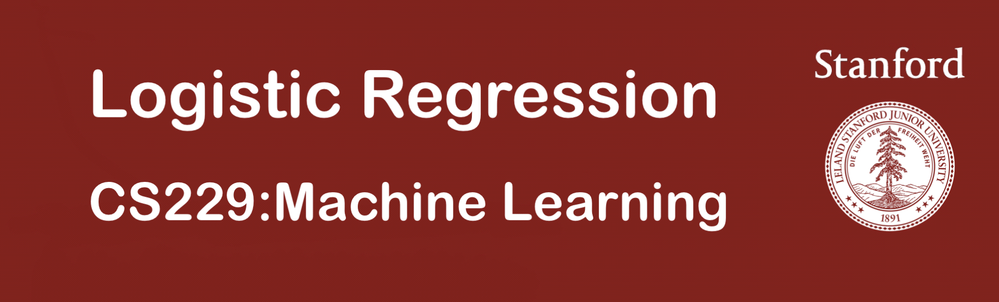

之前我们讨论的是 **「回归问题」**，即输出是连续值，现在我们来讨论输出是离散值的 **「分类问题」**。本节我们将专注于「二元分类」问题，即输出$y$ 只能取0 和1 两个值。

### 1 逻辑回归(Logistic Regression)

如果将线性回归模型直接应用于分类问题，会产生取值不在 0 和 1 之间的问题，所以我们引入 **「逻辑回归模型」**：

$$h_{\theta}(x)= g(x) = \frac{1}{1+e^{-\theta^{T}x}}$$

其中

$$g(x) = \frac{1}{1+e^{-x}}$$

$g(z)$ 被称为 **「逻辑函数」** 或 **「S 型函数」**，其图像如下：

![](https://img.halfrost.com/Blog/ArticleImage/69_8.png)

这里先给出一个关于 S 型函数求导的有用性质：

$$\begin{align*}
g(z)'&=\left(\frac{1}{1+e^{-z}}\right)'=\frac{e^{-z}}{(1+e^{-z})^2} \newline &=\left(\frac{1}{1+e^{-z}}\right)\left(\frac{e^{-z}}{1+e^{-z}}\right)=g(z)\left(\frac{+1-1 + e^{-x}}{1+e^{-x}}\right)=g(z)\left(\frac{1 + e^{-z}}{1+e^{-z}} - \frac{1}{1+e^{-z}}\right)\\
&=g(z)(1 - g(z))\\
\end{align*}$$

确定了模型之后，我们需要找到合适的 $\theta$ 的值。这里采用之前使用的 **「最大似然法」** 来选择参数（假设函数可以直接看作概率分布）。

首先，二元分类符合「伯努利分布」，我们假设：

$$P(y=1|x;\theta)=h_{\theta}(x)$$

$$P(y=0|x;\theta)=1-h_{\theta}(x)$$

将上面的公式合二为一，得到：

$$P(y|x;\theta)=\big(h_{\theta}(x)\big)^y (1-h_{\theta}(x))^{1-y}$$

假定$m$个样本之间相互独立，我们可以得到 $\theta$ 的似然函数如下：

$$L(\theta)=p(\vec y|X;\theta)=\prod_{i=1}^m p(y^{(i)}|x^{(i)};\theta)=\prod_{i=1}^m \big(h_{\theta}(x^{(i)})\big)^{y^{(i)}}\big(1-h_{\theta}(x^{(i)})\big)^{1-y^{(i)}}$$


与之前类似，为了计算方便，我们使用对数似然函数来进行最大化分析：

$$\ell(\theta)=\text{log}L(\theta)=\sum_{i=1}^m y^{(i)} \text{log} h(x^{(i)})+\big(1-y^{(i)}\big)\text{log}\big(1-h(x^{(i)})\big)$$

下面要做的是找到 $\theta$ 使得 $l(\theta)$ 最大，由于这里是找最大值而非最小值，所以使用 **「梯度上升」**（gradient ascent），参数的更新规则是 $\theta:=\theta+\alpha \triangledown_{\theta} l(\theta)$，对于随机梯度上升（每次只考虑一个样本），求导过程如下：

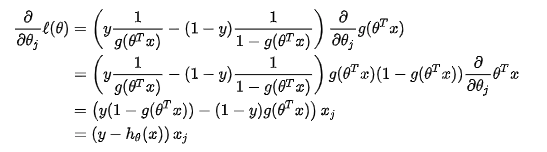

综上所述，我们得到随机梯度上升的更新规则是：

$$\theta_j:=\theta_j+\alpha\big(y^{(i)}-h_{\theta}(x^{(i)})\big)x_j^{(i)}$$

这个公式和线性回归中梯度下降的公式表面上看是一样的，但实际上两者的 $h_{\theta}(x)$ 有所不同，关于更加深层次的讨论，请参看之后的 GLM 模型章节。

Logistic Regression代码实现如下：

In [1]:
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from math import exp, log

## Hyper-paramters definition
LR = 0.075
EPOCH = 4
THETA = np.random.normal(0, 0.1, 3).reshape(3, 1) # learnable parameters

## First step: Generating dummy two categories of data.
# 1. data(300)
X, Y = make_blobs(n_samples=300, centers=2, n_features=2, random_state=3)
X.shape

(300, 2)

In [2]:
Y.shape

(300,)

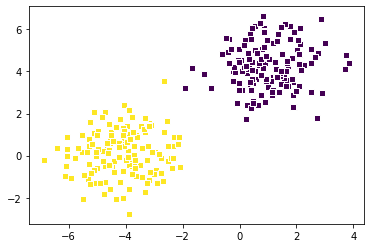

In [3]:
# show data distribution
plt.scatter(X[:,0], X[:, 1], c=Y, edgecolors='white', marker='s')
plt.show()

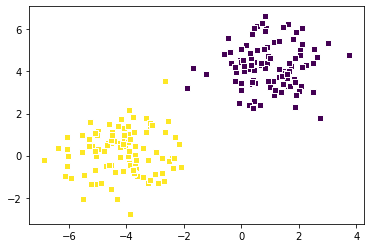

In [4]:
# 2. split into train/val set
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
plt.scatter(X_train[:,0], X_train[:, 1], c=Y_train, edgecolors='white', marker='s')
plt.show()

In [5]:
# for theta0, x0 = 1
o_train = np.ones([X_train.shape[0], 1], dtype=X_train.dtype)
o_test = np.ones([X_test.shape[0], 1], dtype=X_test.dtype)
X_train = np.concatenate((o_train, X_train), axis=1)
X_test = np.concatenate((o_test, X_test), axis=1)
print("X_train shape : {0}".format(X_train.shape))
print("Y_train shape : {0}".format(Y_train.shape))
print("X_test shape : {0}".format(X_test.shape))
print("y_test shape : {0}".format(Y_test.shape))

X_train shape : (210, 3)
Y_train shape : (210,)
X_test shape : (90, 3)
y_test shape : (90,)


In [6]:
H_train = np.zeros([Y_train.shape[0], 1], dtype=Y_train.dtype)
H_test = np.zeros([Y_test.shape[0], 1], dtype=Y_test.dtype)

In [7]:
## Second step: Making hypothesis
def sigmoid_function(z):
    g = 1 / (1 + exp(-z))
    return g

def hypothesis(x, THETA):
    hypothesis = np.matmul(THETA.T, x) #array([4.57259857])
    hypothesis = sigmoid_function(hypothesis[0])
    return hypothesis

## Third step: Define a loss function
def compute_loss(X, Y, THETA):
    loss = 0
    for x, y in zip(X, Y):
        h_x = hypothesis(x, THETA)
        # if h_x == 1 --> log(1-1) --> error
        if h_x == 1:
            h_x = 1-0.0000000000001
        loss += (-y) *(log(h_x) - (1-y) *log(1-h_x))
    return loss/(X.shape[0])

## Fourth step: Updating parameters
def update_parameters(THETA, LR, y, h_x, x):
    x = np.reshape(x, THETA.shape)
    THETA = THETA + LR *(y - h_x) * x
    return THETA

[1/4] loss is: 0.3102411891531373


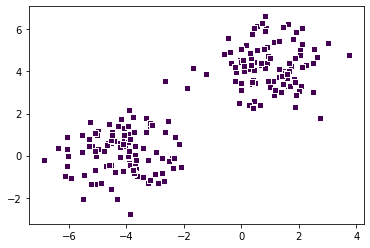

[1/4] loss is: 0.3102411891531373


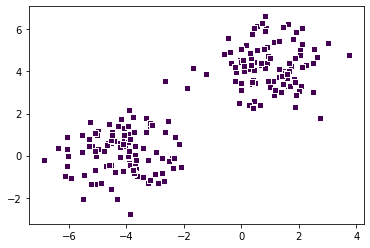

[1/4] loss is: 0.07767269333675865


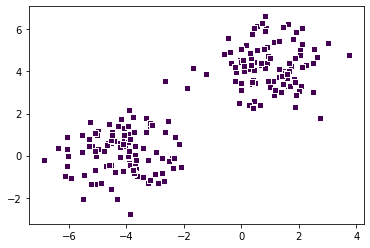

[1/4] loss is: 0.022347223232366802


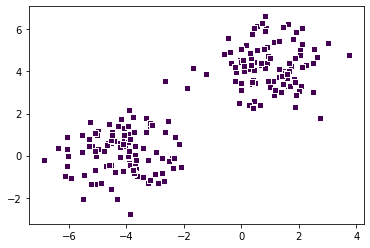

[1/4] loss is: 0.022347223232366802


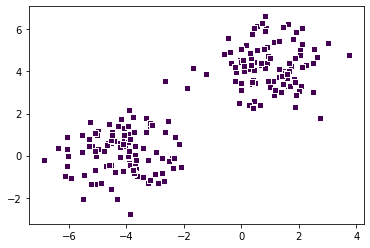

[1/4] loss is: 0.022347223232366802


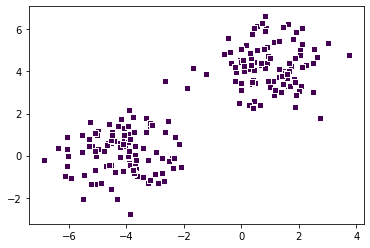

[1/4] loss is: 0.007782883135648117


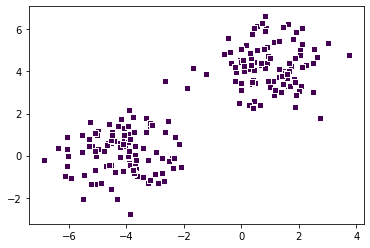

[1/4] loss is: 0.007782883135648117


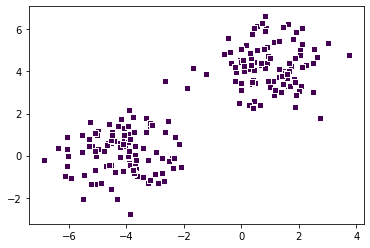

[1/4] loss is: 0.0033041035747634925


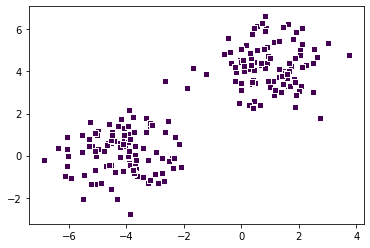

[1/4] loss is: 0.0033041035747634925


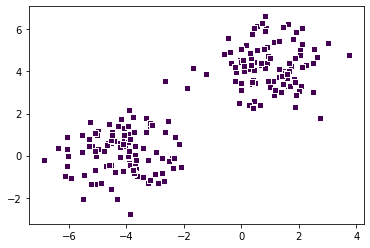

[1/4] loss is: 0.0033041035747634925


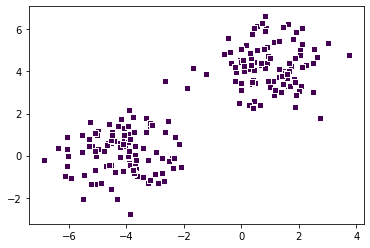

[1/4] loss is: 0.0015162090809499411


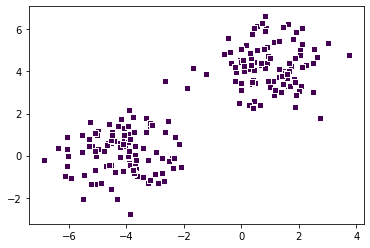

[1/4] loss is: 0.0006499491628854713


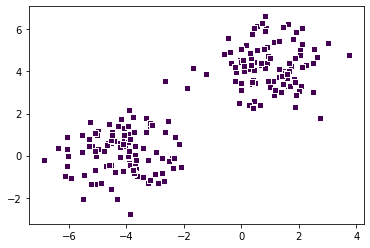

[1/4] loss is: 0.0006499491628854713


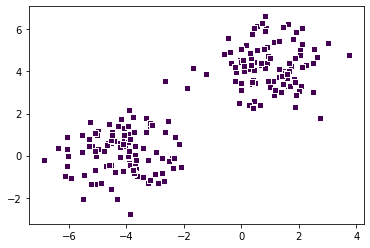

[1/4] loss is: 0.0002439066454484731


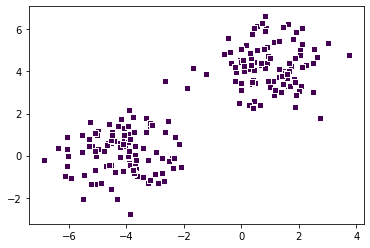

[1/4] loss is: 0.0002439066454484731


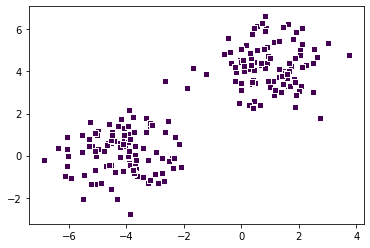

[1/4] loss is: 0.0002439066454484731


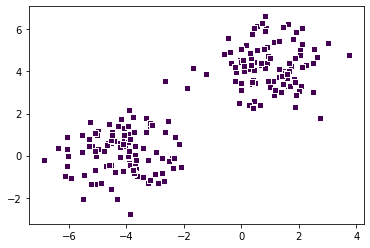

[1/4] loss is: 0.00014995507418540726


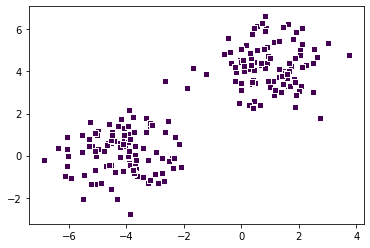

[1/4] loss is: 7.654097326784581e-05


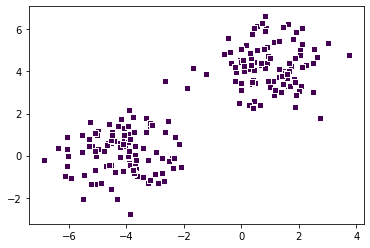

[1/4] loss is: 7.654097326784581e-05


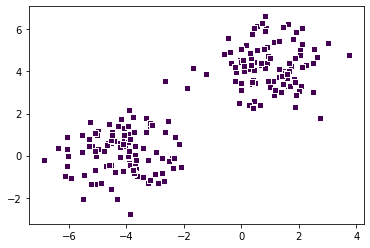

[1/4] loss is: 2.7634615357578366e-05


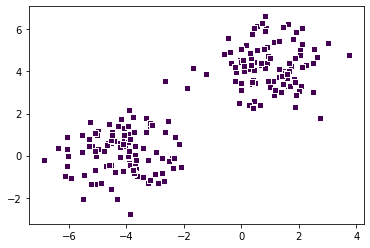

[1/4] loss is: 1.2931096862873468e-05


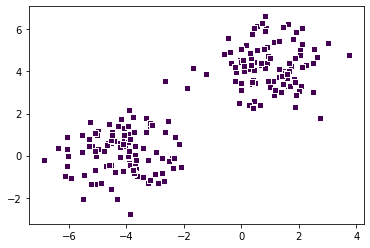

[1/4] loss is: 1.2931096862873468e-05


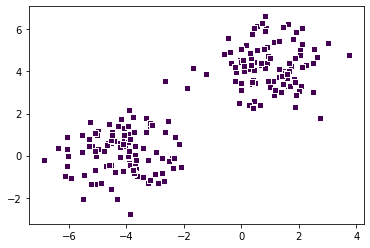

[1/4] loss is: 5.076521578505381e-06


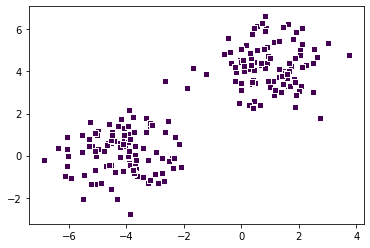

[1/4] loss is: 5.076521578505381e-06


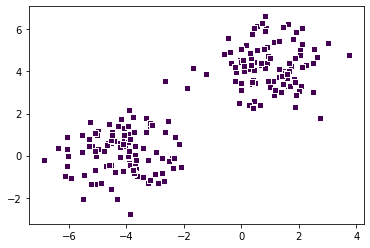

[1/4] loss is: 2.2992829982602904e-06


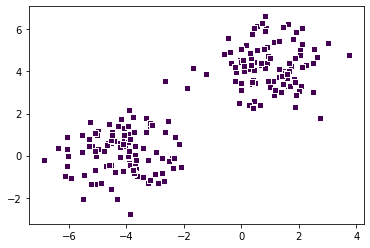

[1/4] loss is: 2.2992829982602904e-06


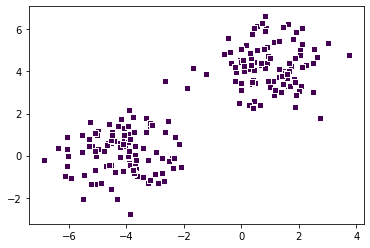

[1/4] loss is: 2.2992829982602904e-06


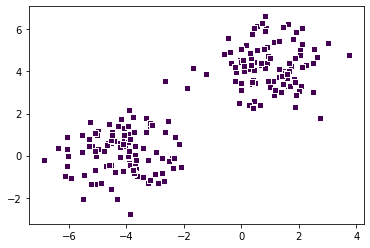

[1/4] loss is: 1.1155790455891288e-06


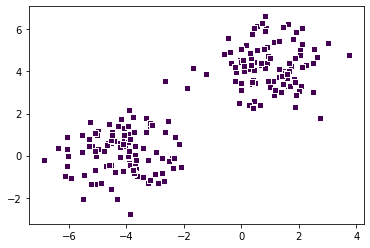

[1/4] loss is: 6.786076130275033e-07


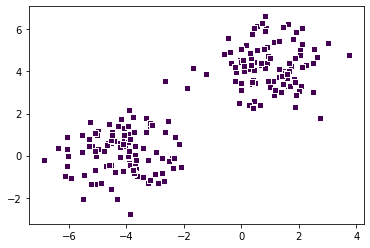

[1/4] loss is: 2.58418572549297e-07


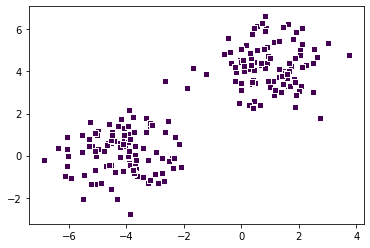

[1/4] loss is: 1.231422609733252e-07


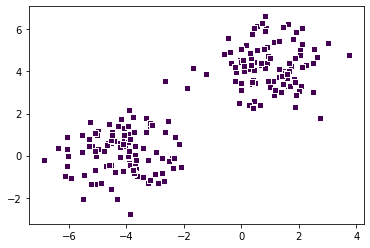

[1/4] loss is: 5.9392073991598026e-08


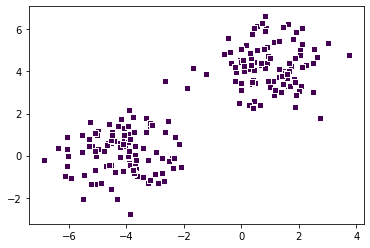

[1/4] loss is: 2.3454337631319342e-08


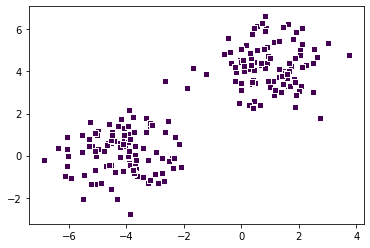

[1/4] loss is: 2.3454337631319342e-08


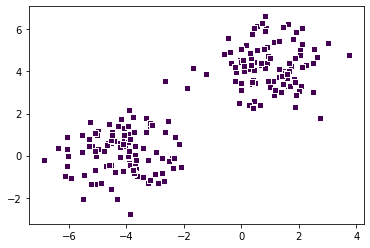

[1/4] loss is: 2.3454337631319342e-08


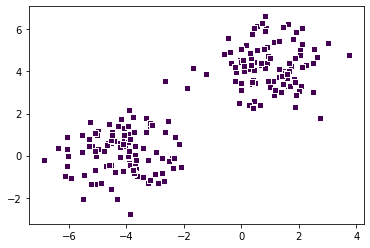

[1/4] loss is: 7.973121922609163e-09


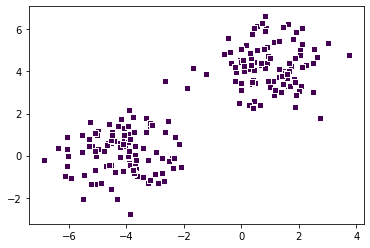

[1/4] loss is: 7.973121922609163e-09


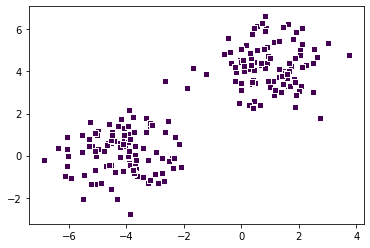

[1/4] loss is: 3.2961159520434864e-09


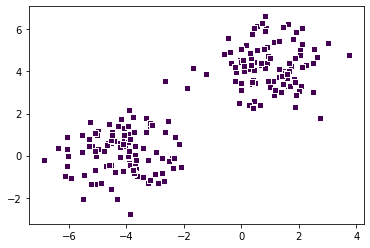

[1/4] loss is: 3.2961159520434864e-09


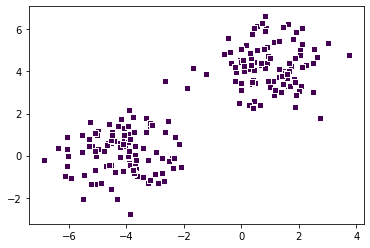

[1/4] loss is: 1.5927746415887634e-09


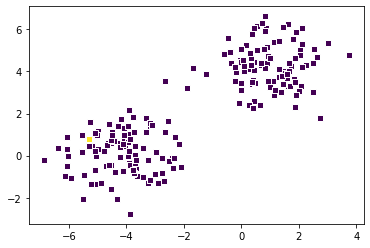

[1/4] loss is: 1.5927746415887634e-09


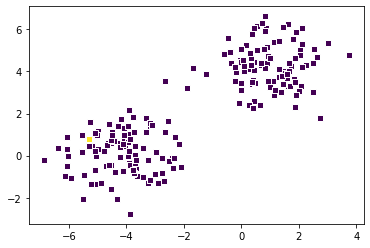

[1/4] loss is: 1.5927746415887634e-09


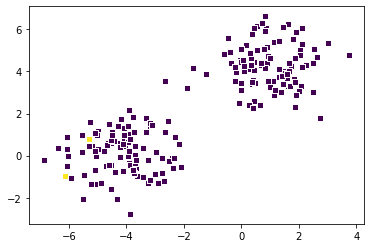

[1/4] loss is: 1.5927746415887634e-09


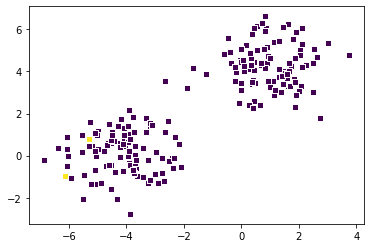

[1/4] loss is: 1.5927746415887634e-09


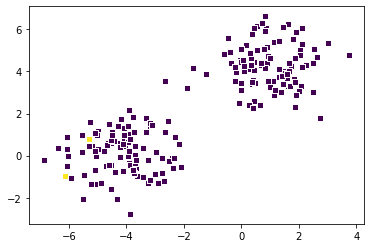

[1/4] loss is: 7.823282093006589e-10


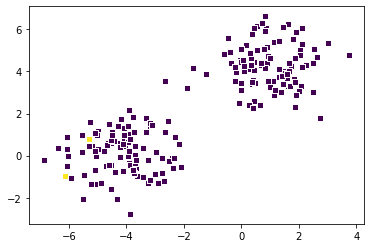

[1/4] loss is: 3.357720654568221e-10


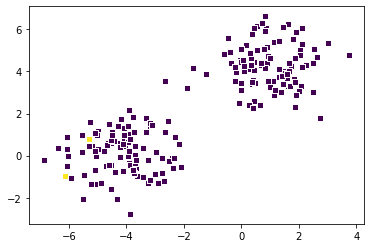

[1/4] loss is: 3.357720654568221e-10


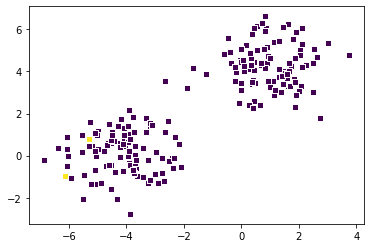

[1/4] loss is: 3.357720654568221e-10


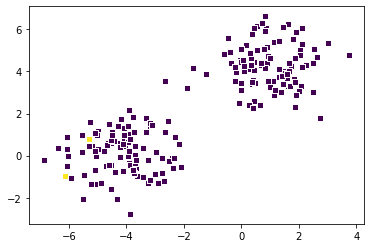

[1/4] loss is: 3.357720654568221e-10


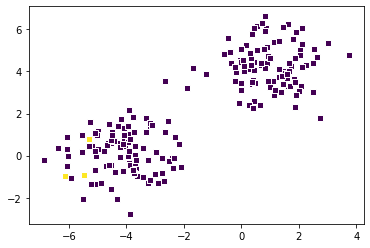

[1/4] loss is: 3.357720654568221e-10


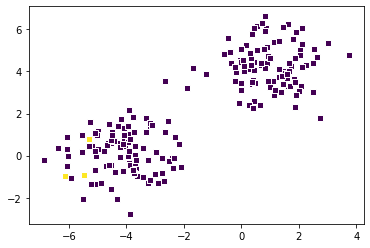

[1/4] loss is: 1.6386359193759648e-10


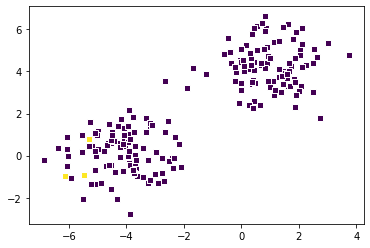

[1/4] loss is: 1.6386359193759648e-10


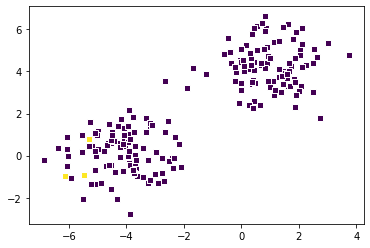

[1/4] loss is: 9.9996065259208e-11


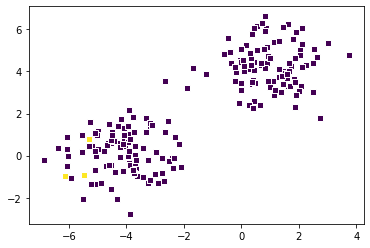

[1/4] loss is: 4.4268568780567524e-11


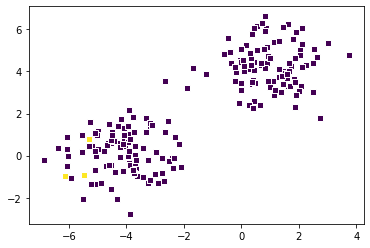

[1/4] loss is: 4.4268568780567524e-11


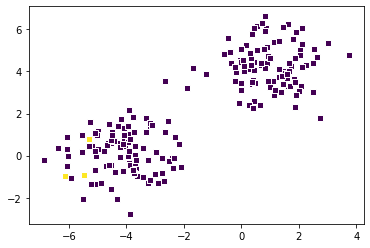

[1/4] loss is: 2.1396018838058923e-11


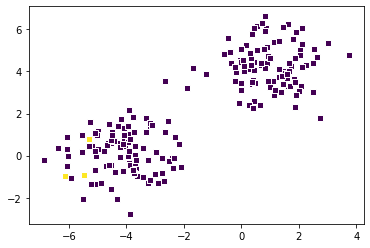

[1/4] loss is: 2.1396018838058923e-11


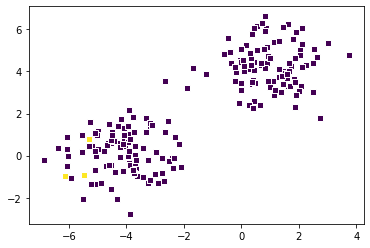

[1/4] loss is: 2.1396018838058923e-11


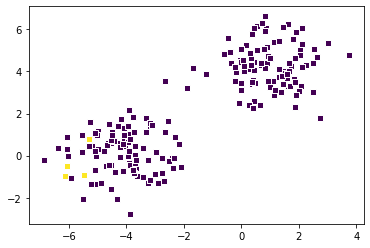

[1/4] loss is: 2.1396018838058923e-11


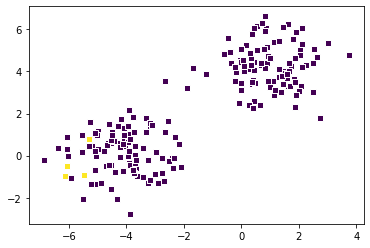

[1/4] loss is: 1.0825562144760462e-11


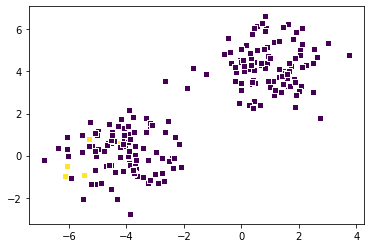

[1/4] loss is: 1.0825562144760462e-11


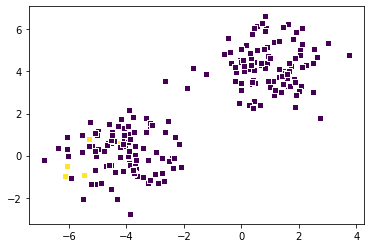

[1/4] loss is: 6.417119218719542e-12


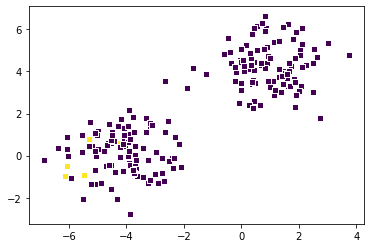

[1/4] loss is: 6.417119218719542e-12


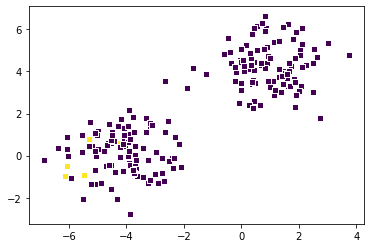

[1/4] loss is: 6.417119218719542e-12


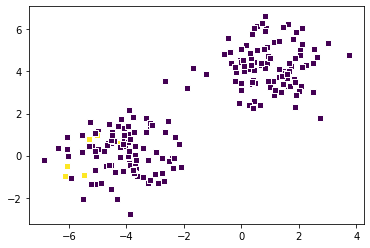

[1/4] loss is: 6.417119218719542e-12


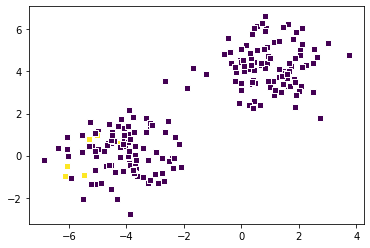

[1/4] loss is: 6.417119218719542e-12


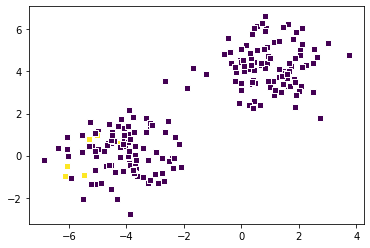

[1/4] loss is: 3.3878365726090036e-12


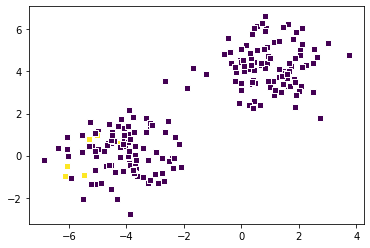

[1/4] loss is: 3.3878365726090036e-12


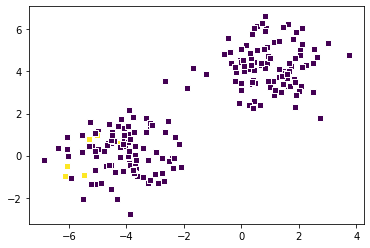

[1/4] loss is: 3.3878365726090036e-12


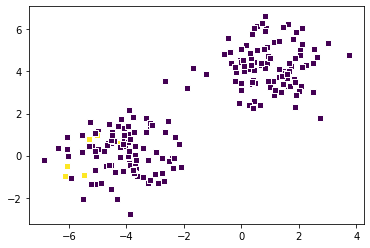

[1/4] loss is: 3.3878365726090036e-12


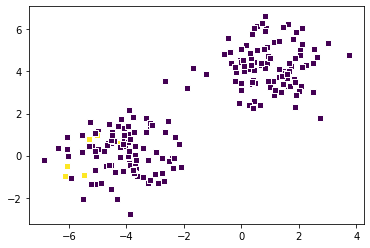

[1/4] loss is: 1.844107406600849e-12


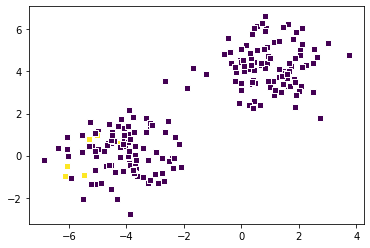

[1/4] loss is: 1.0320363611772536e-12


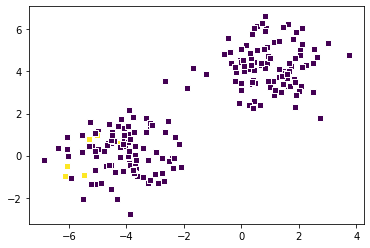

[1/4] loss is: 1.0320363611772536e-12


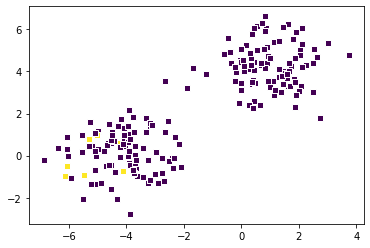

[1/4] loss is: 1.0320363611772536e-12


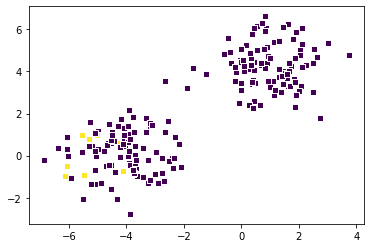

[1/4] loss is: 1.0320363611772536e-12


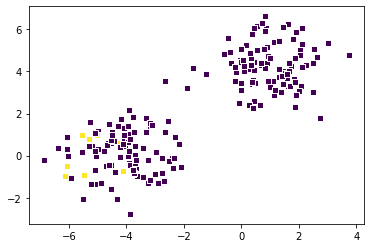

[1/4] loss is: 1.0320363611772536e-12


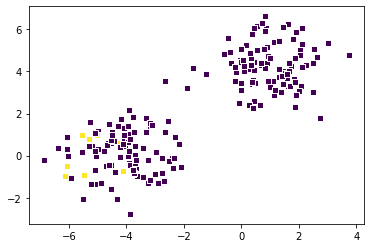

[1/4] loss is: 1.0320363611772536e-12


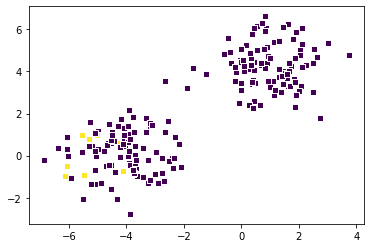

[1/4] loss is: 1.0320363611772536e-12


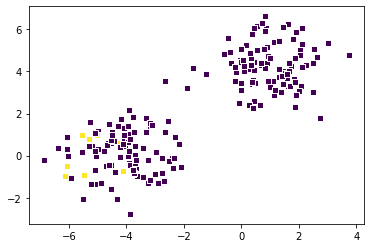

[1/4] loss is: 1.0320363611772536e-12


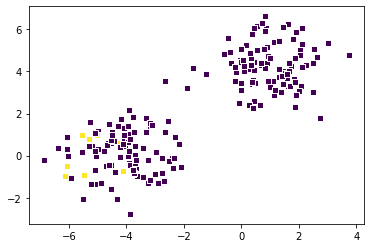

[1/4] loss is: 1.0320363611772536e-12


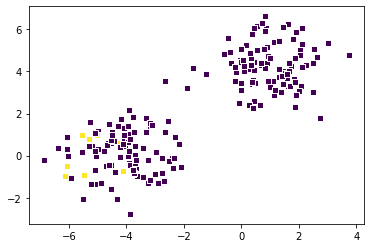

[1/4] loss is: 1.0320363611772536e-12


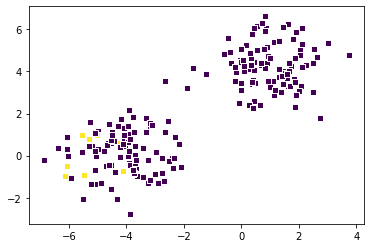

[1/4] loss is: 1.0320363611772536e-12


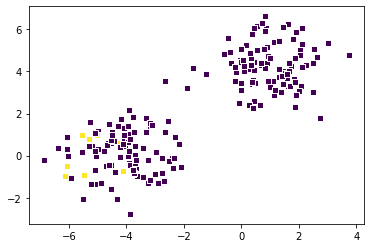

[1/4] loss is: 1.0320363611772536e-12


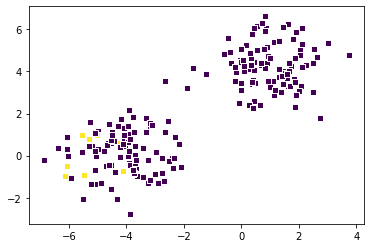

[1/4] loss is: 6.514429207884166e-13


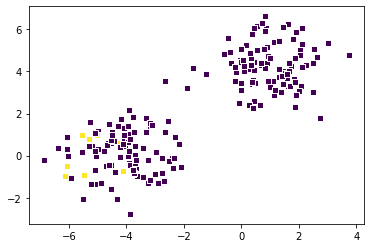

[1/4] loss is: 6.514429207884166e-13


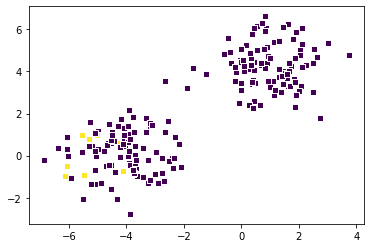

[1/4] loss is: 6.514429207884166e-13


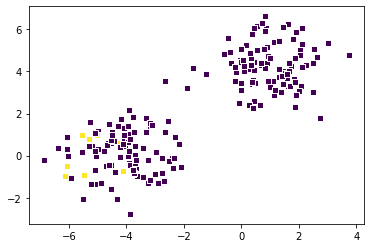

[1/4] loss is: 6.514429207884166e-13


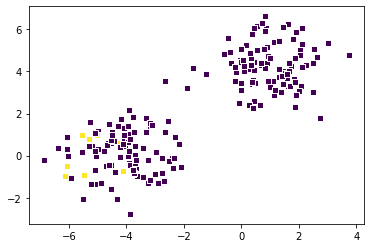

[1/4] loss is: 3.9353864083427173e-13


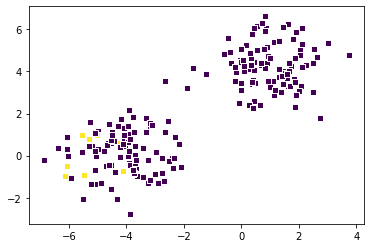

[1/4] loss is: 3.9353864083427173e-13


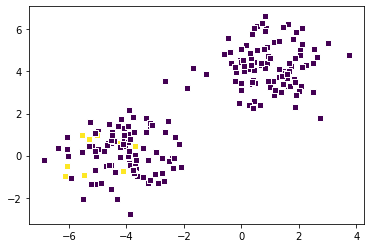

[1/4] loss is: 3.9353864083427173e-13


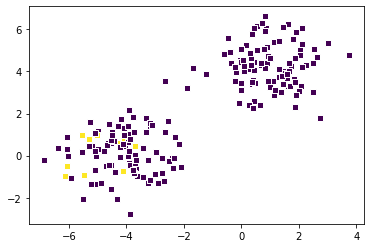

[1/4] loss is: 3.9353864083427173e-13


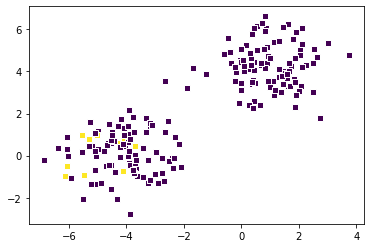

[1/4] loss is: 3.9353864083427173e-13


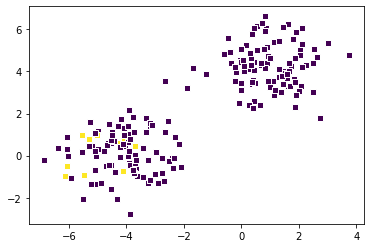

[1/4] loss is: 3.9353864083427173e-13


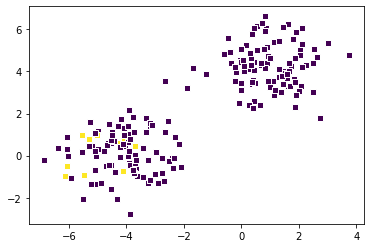

[1/4] loss is: 3.9353864083427173e-13


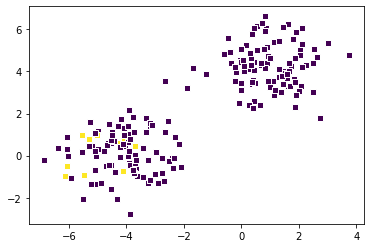

[1/4] loss is: 3.9353864083427173e-13


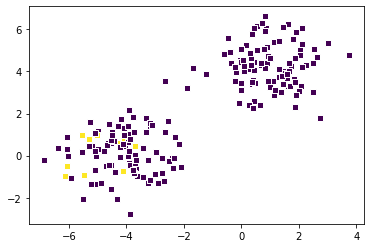

[1/4] loss is: 2.340868240006098e-13


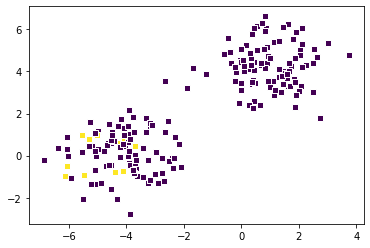

[1/4] loss is: 2.340868240006098e-13


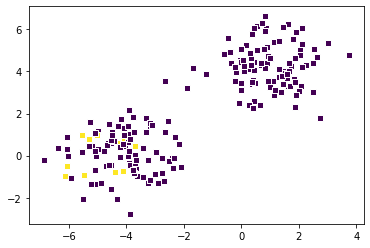

[1/4] loss is: 2.340868240006098e-13


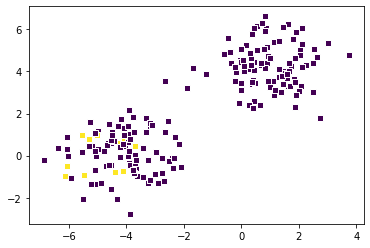

[1/4] loss is: 2.340868240006098e-13


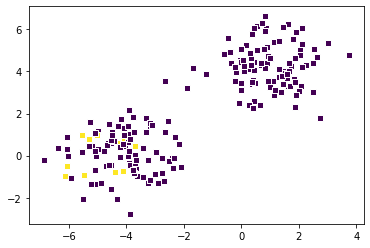

[1/4] loss is: 1.5662074811738673e-13


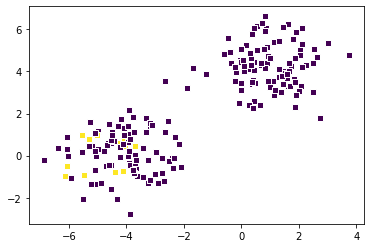

[1/4] loss is: 1.5662074811738673e-13


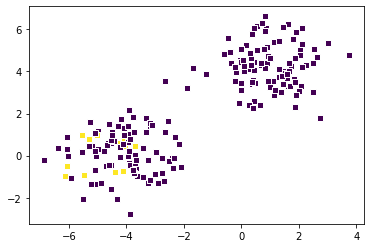

[1/4] loss is: 1.5662074811738673e-13


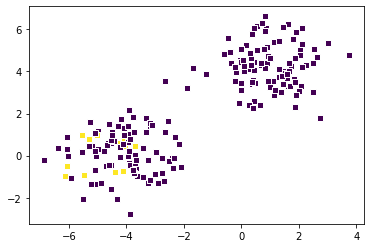

[1/4] loss is: 1.5662074811738673e-13


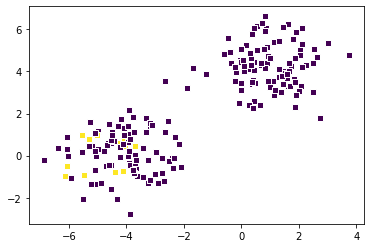

[1/4] loss is: 1.5662074811738673e-13


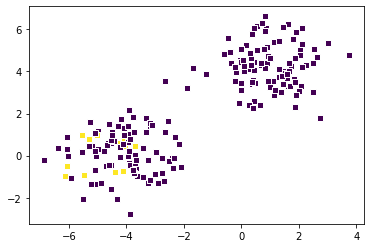

[1/4] loss is: 1.5662074811738673e-13


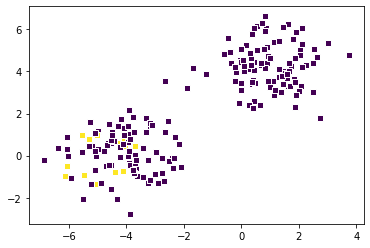

[1/4] loss is: 1.5662074811738673e-13


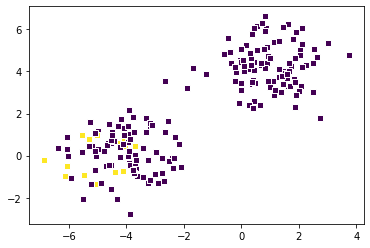

[1/4] loss is: 1.5662074811738673e-13


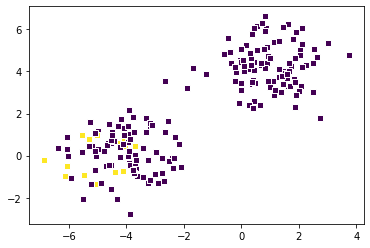

[1/4] loss is: 1.5662074811738673e-13


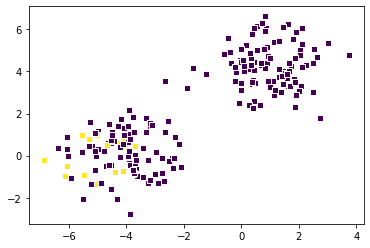

[1/4] loss is: 1.5662074811738673e-13


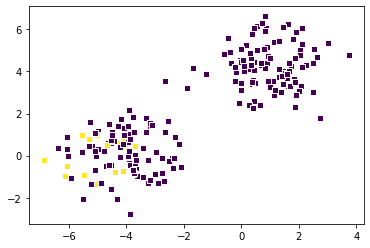

[1/4] loss is: 1.5662074811738673e-13


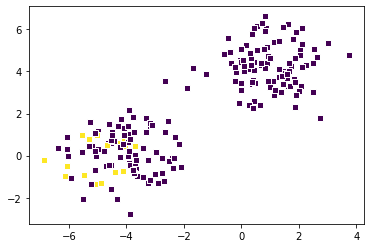

[1/4] loss is: 1.5662074811738673e-13


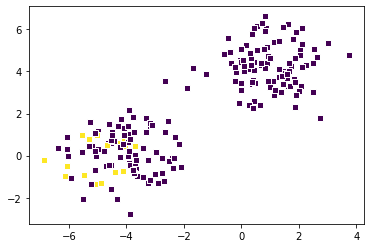

[1/4] loss is: 1.5662074811738673e-13


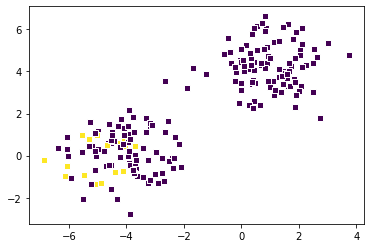

[1/4] loss is: 1.5662074811738673e-13


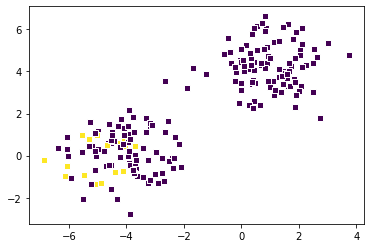

[1/4] loss is: 1.5662074811738673e-13


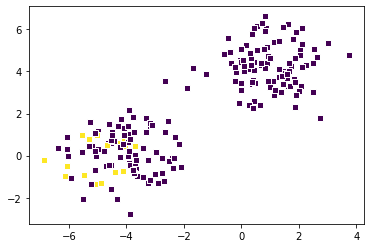

[1/4] loss is: 1.0859990155851202e-13


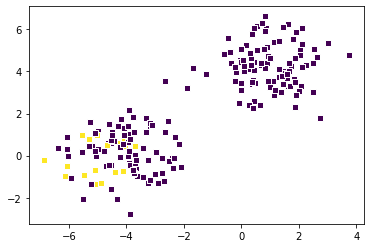

[1/4] loss is: 1.0859990155851202e-13


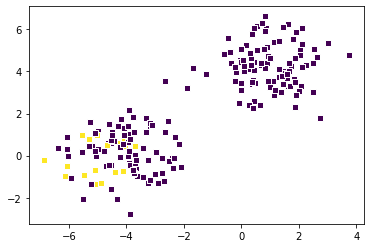

[1/4] loss is: 8.423209220076672e-14


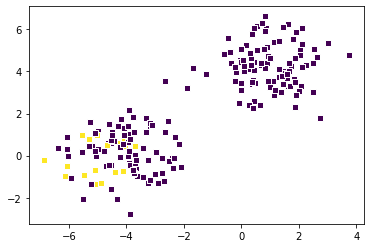

[1/4] loss is: 8.423209220076672e-14


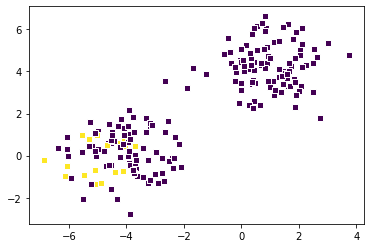

[1/4] loss is: 8.423209220076672e-14


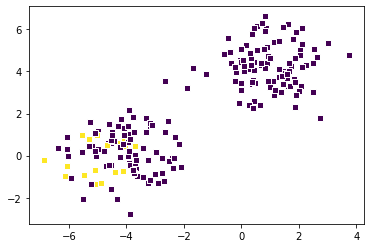

[1/4] loss is: 8.423209220076672e-14


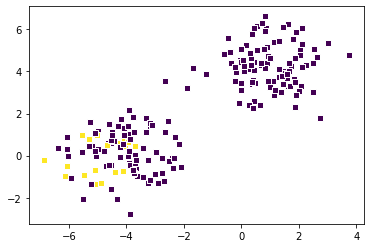

[1/4] loss is: 8.423209220076672e-14


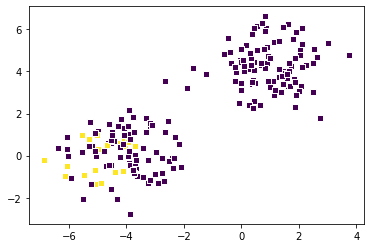

[1/4] loss is: 8.423209220076672e-14


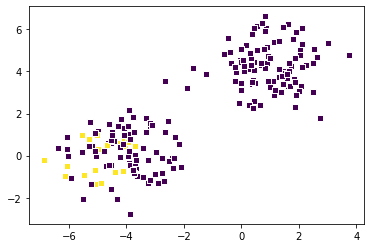

[1/4] loss is: 8.423209220076672e-14


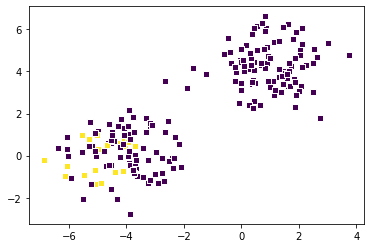

[1/4] loss is: 8.423209220076672e-14


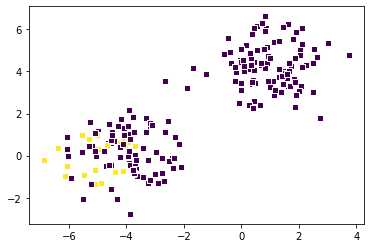

[1/4] loss is: 8.423209220076672e-14


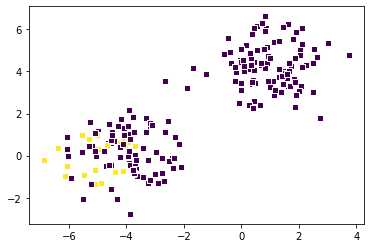

[1/4] loss is: 8.423209220076672e-14


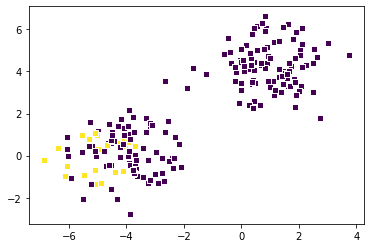

[1/4] loss is: 8.423209220076672e-14


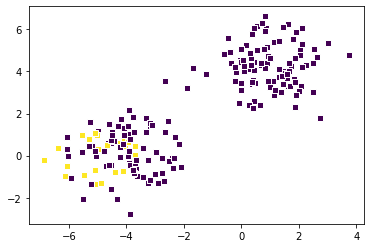

[1/4] loss is: 8.423209220076672e-14


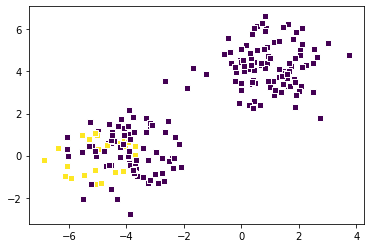

[1/4] loss is: 8.423209220076672e-14


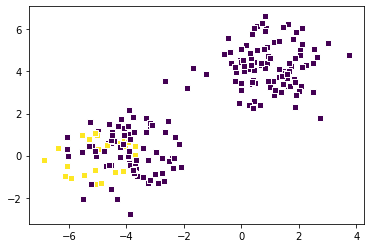

[1/4] loss is: 8.423209220076672e-14


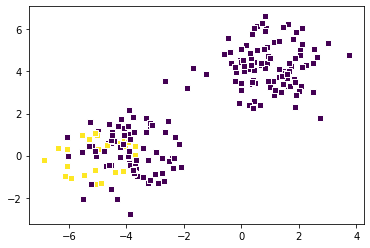

[1/4] loss is: 8.423209220076672e-14


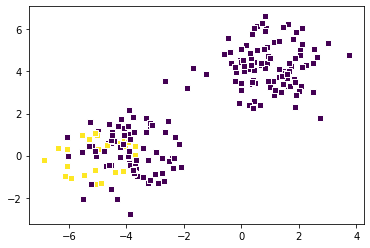

[1/4] loss is: 8.423209220076672e-14


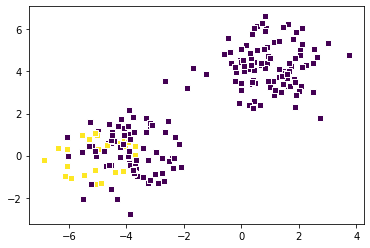

[1/4] loss is: 8.423209220076672e-14


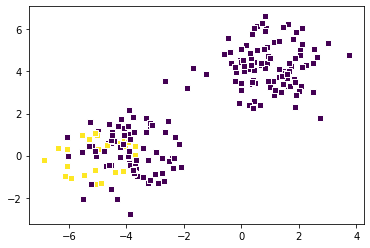

[1/4] loss is: 8.423209220076672e-14


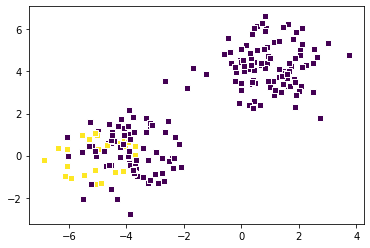

[1/4] loss is: 6.886660553990312e-14


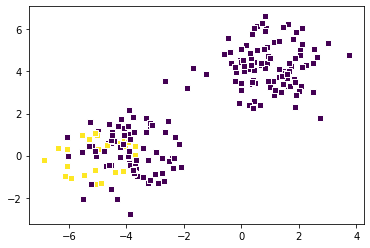

[1/4] loss is: 6.886660553990312e-14


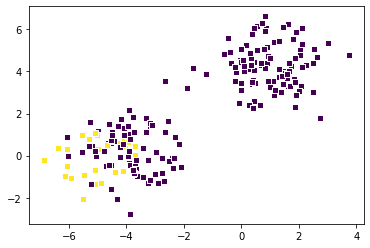

[1/4] loss is: 6.886660553990312e-14


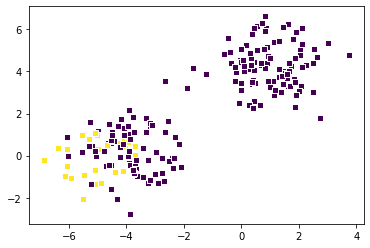

[1/4] loss is: 6.886660553990312e-14


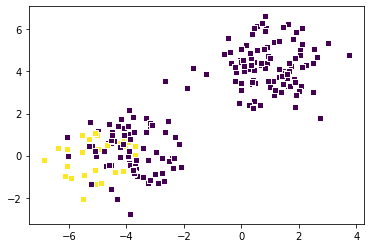

[1/4] loss is: 6.886660553990312e-14


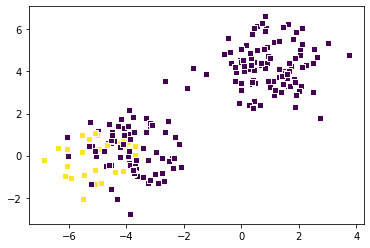

[1/4] loss is: 6.886660553990312e-14


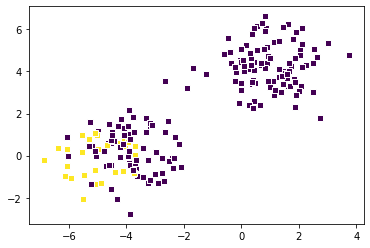

[1/4] loss is: 6.886660553990312e-14


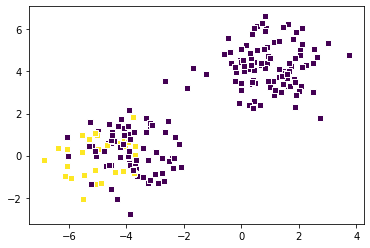

[1/4] loss is: 6.886660553990312e-14


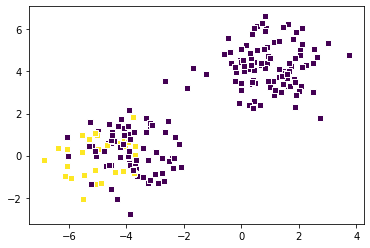

[1/4] loss is: 6.886660553990312e-14


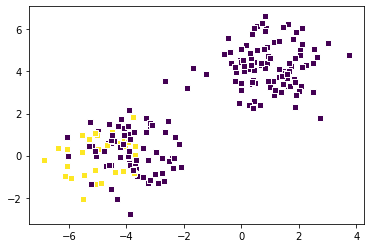

[1/4] loss is: 6.886660553990312e-14


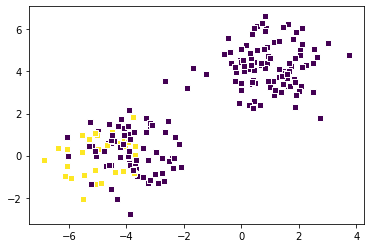

[1/4] loss is: 5.914210919942649e-14


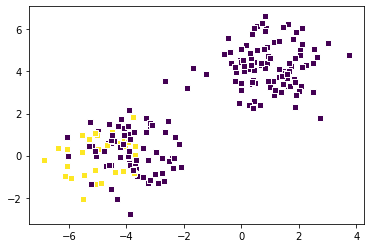

[1/4] loss is: 5.914210919942649e-14


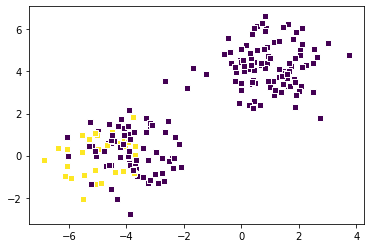

[1/4] loss is: 5.914210919942649e-14


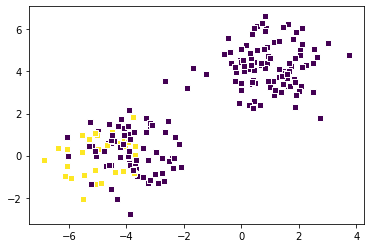

[1/4] loss is: 5.914210919942649e-14


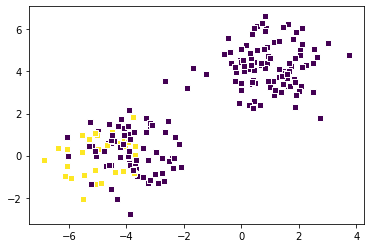

[1/4] loss is: 5.363857506306417e-14


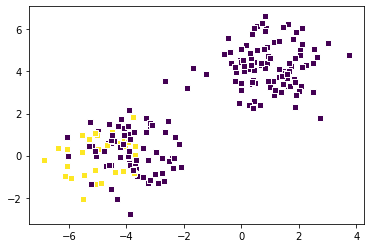

[1/4] loss is: 5.363857506306417e-14


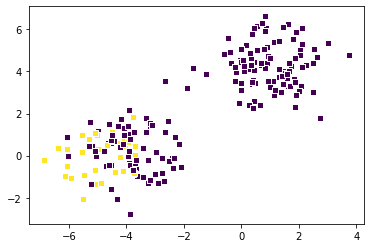

[1/4] loss is: 5.363857506306417e-14


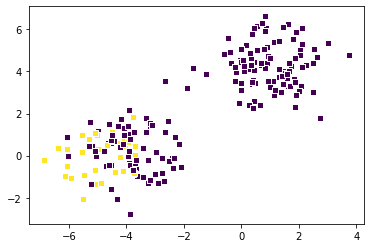

[1/4] loss is: 5.363857506306417e-14


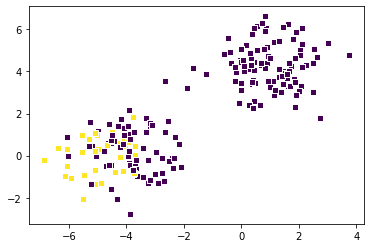

[1/4] loss is: 5.363857506306417e-14


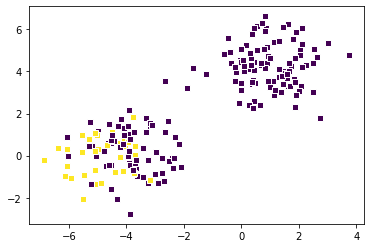

[1/4] loss is: 5.363857506306417e-14


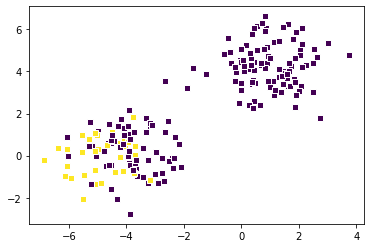

[1/4] loss is: 5.363857506306417e-14


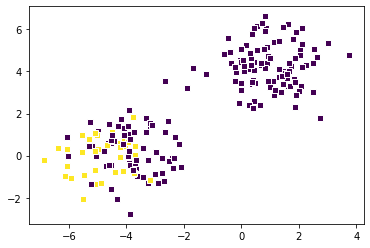

[1/4] loss is: 5.363857506306417e-14


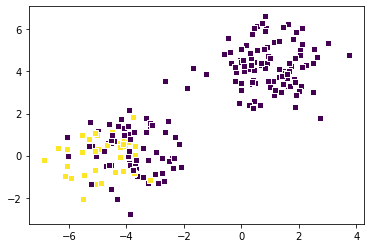

[1/4] loss is: 5.363857506306417e-14


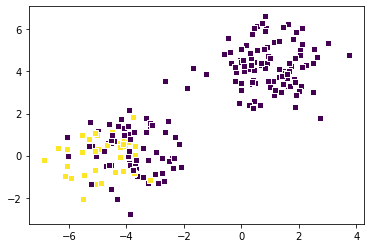

[1/4] loss is: 5.363857506306417e-14


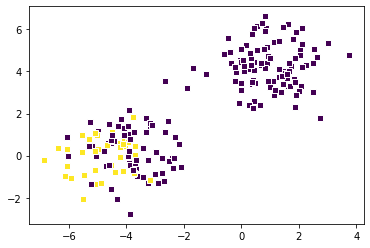

[1/4] loss is: 5.363857506306417e-14


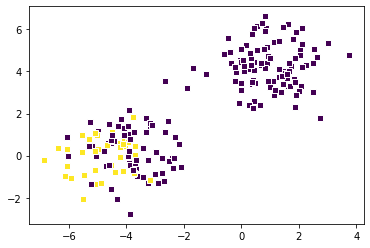

[1/4] loss is: 5.363857506306417e-14


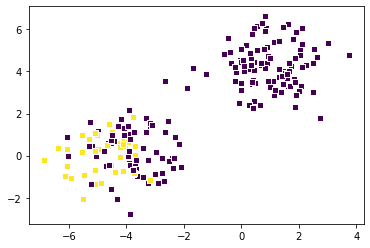

[1/4] loss is: 5.363857506306417e-14


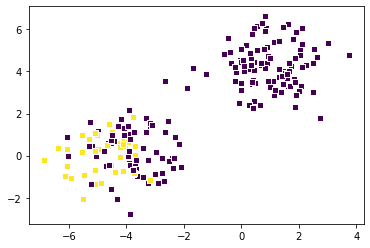

[1/4] loss is: 5.363857506306417e-14


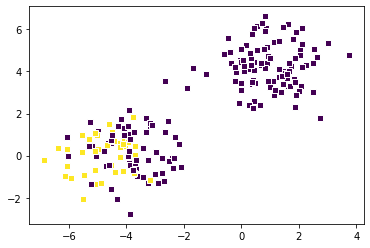

[1/4] loss is: 5.363857506306417e-14


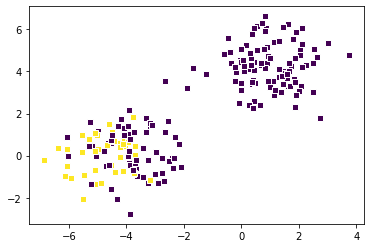

[1/4] loss is: 5.363857506306417e-14


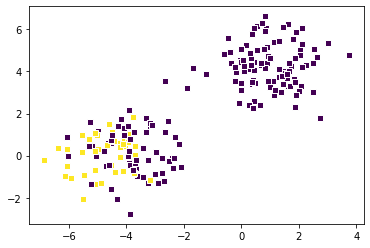

[1/4] loss is: 5.363857506306417e-14


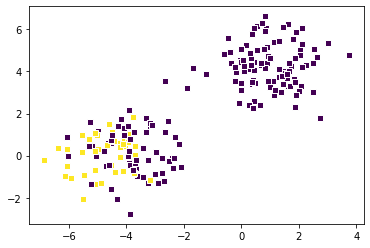

[1/4] loss is: 5.363857506306417e-14


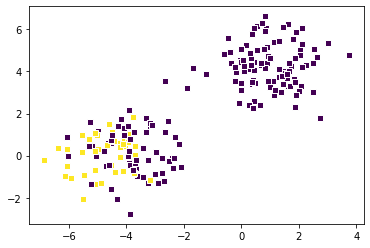

[1/4] loss is: 5.363857506306417e-14


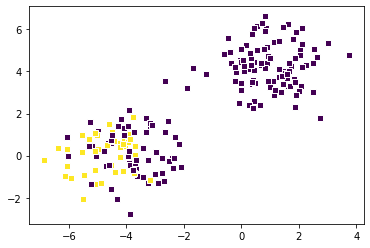

[1/4] loss is: 5.363857506306417e-14


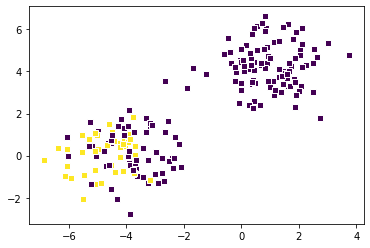

[1/4] loss is: 5.363857506306417e-14


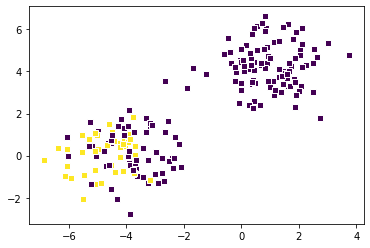

[1/4] loss is: 5.022226021300037e-14


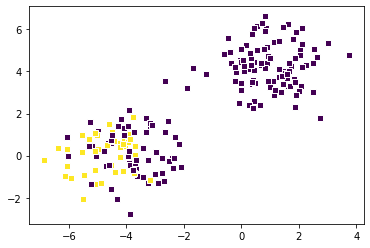

[1/4] loss is: 5.022226021300037e-14


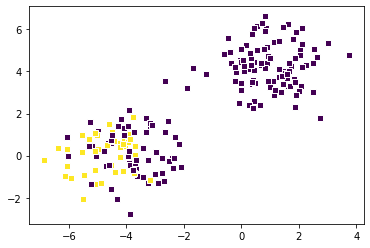

[1/4] loss is: 4.8841354241417645e-14


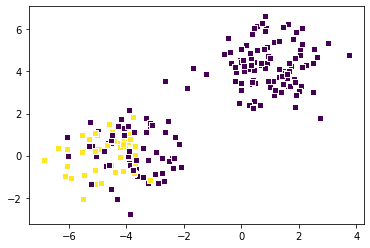

[1/4] loss is: 4.8841354241417645e-14


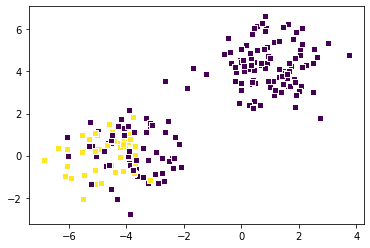

[1/4] loss is: 4.8841354241417645e-14


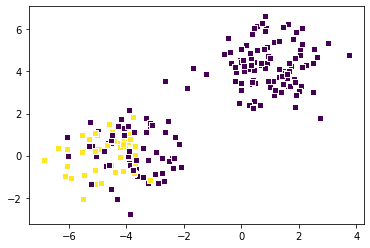

[1/4] loss is: 4.8841354241417645e-14


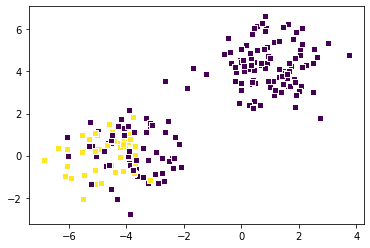

[1/4] loss is: 4.8841354241417645e-14


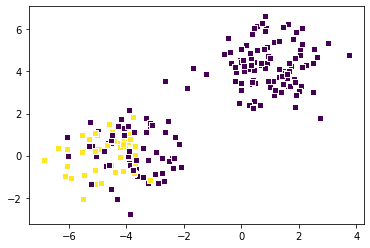

[1/4] loss is: 4.8841354241417645e-14


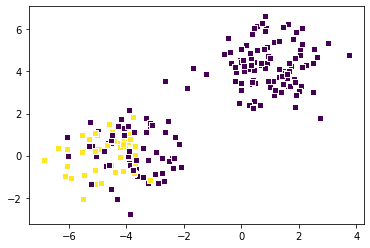

[1/4] loss is: 4.8841354241417645e-14


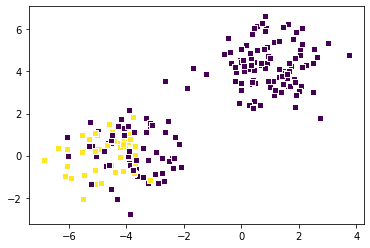

[1/4] loss is: 4.8841354241417645e-14


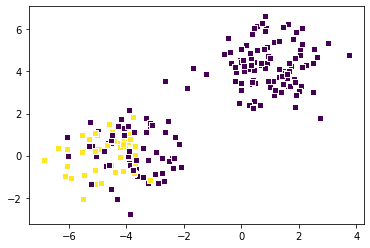

[1/4] loss is: 4.8841354241417645e-14


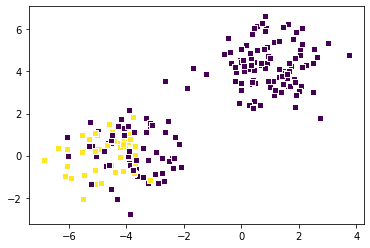

[1/4] loss is: 4.8841354241417645e-14


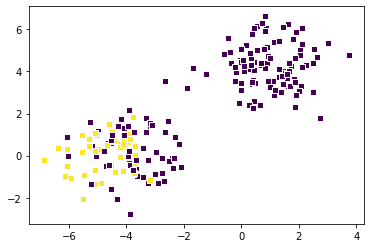

[1/4] loss is: 4.8841354241417645e-14


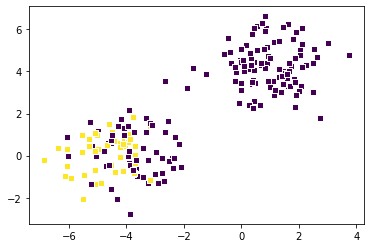

[1/4] loss is: 4.8841354241417645e-14


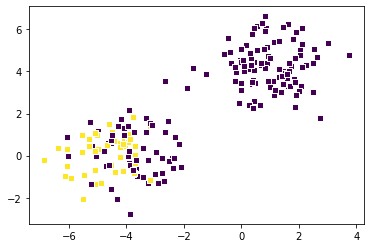

[1/4] loss is: 4.792409855202444e-14


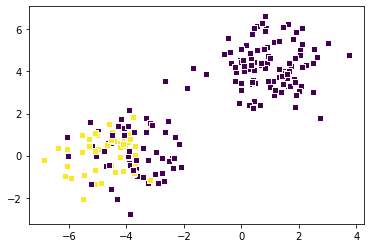

[1/4] loss is: 4.792409855202444e-14


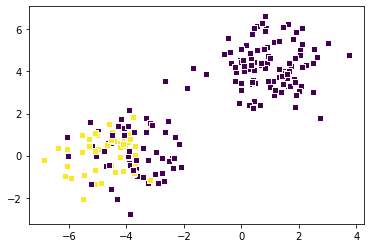

[1/4] loss is: 4.792409855202444e-14


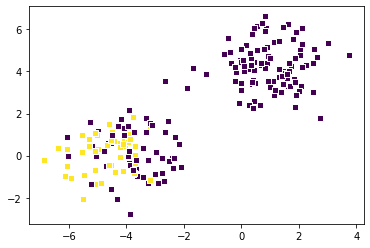

[1/4] loss is: 4.792409855202444e-14


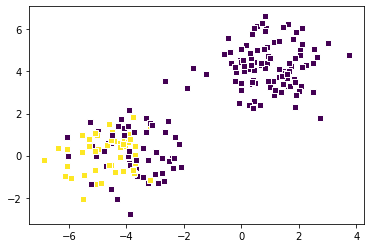

[1/4] loss is: 4.792409855202444e-14


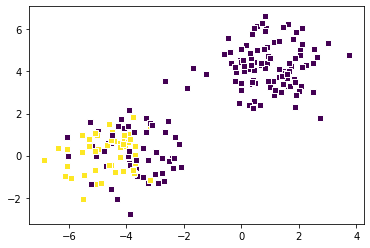

[1/4] loss is: 4.792409855202444e-14


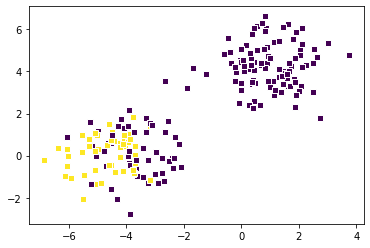

[1/4] loss is: 4.792409855202444e-14


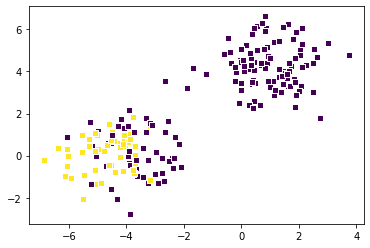

[1/4] loss is: 4.792409855202444e-14


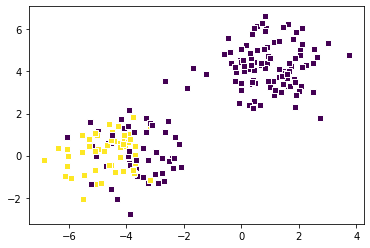

[1/4] loss is: 4.792409855202444e-14


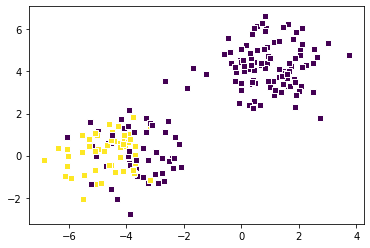

[1/4] loss is: 4.792409855202444e-14


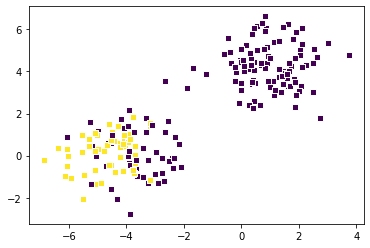

[1/4] loss is: 4.792409855202444e-14


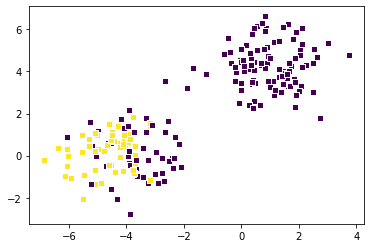

[1/4] loss is: 4.792409855202444e-14


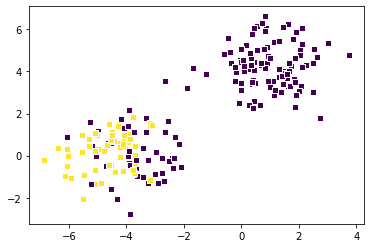

[1/4] loss is: 4.792409855202444e-14


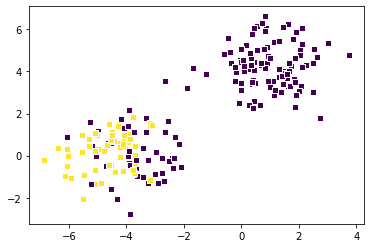

[1/4] loss is: 4.792409855202444e-14


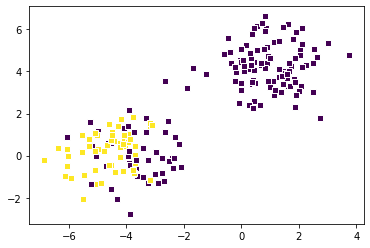

[1/4] loss is: 4.792409855202444e-14


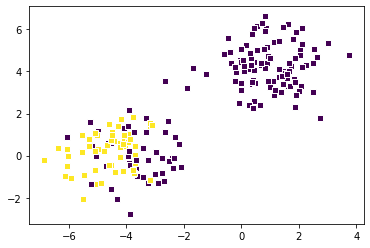

[1/4] loss is: 4.792409855202444e-14


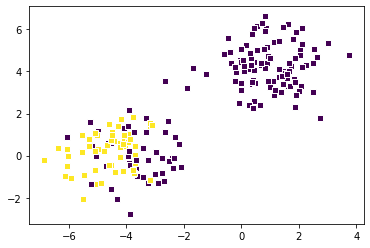

[1/4] loss is: 4.792409855202444e-14


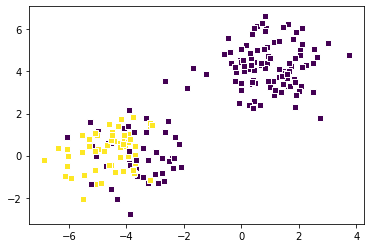

[1/4] loss is: 4.792409855202444e-14


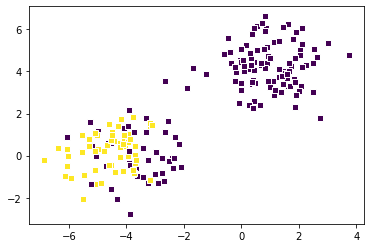

[1/4] loss is: 4.792409855202444e-14


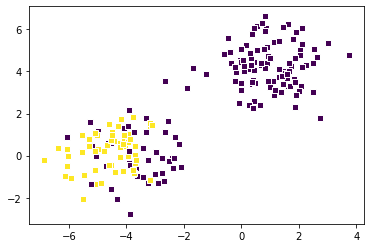

[1/4] loss is: 4.792409855202444e-14


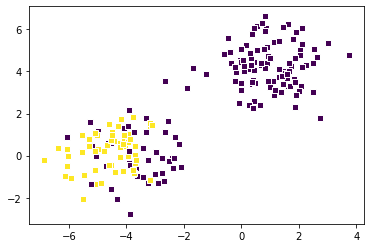

[1/4] loss is: 4.792409855202444e-14


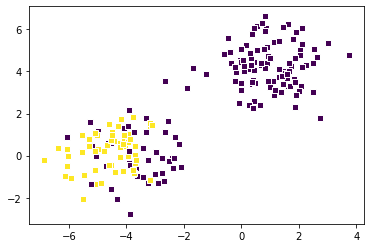

[1/4] loss is: 4.792409855202444e-14


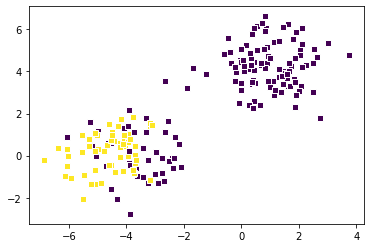

[1/4] loss is: 4.792409855202444e-14


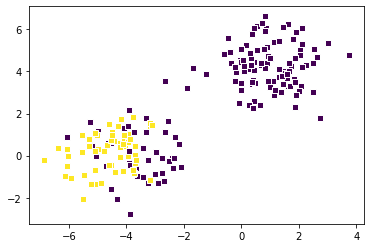

[1/4] loss is: 4.792409855202444e-14


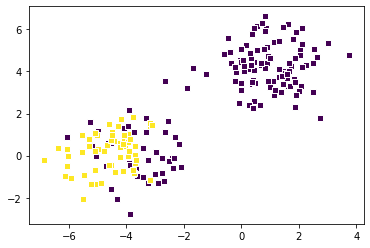

[1/4] loss is: 4.792409855202444e-14


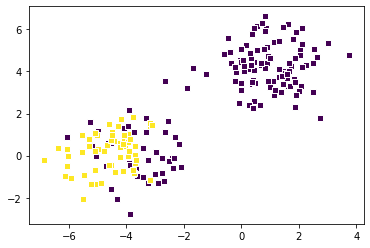

[1/4] loss is: 4.792409855202444e-14


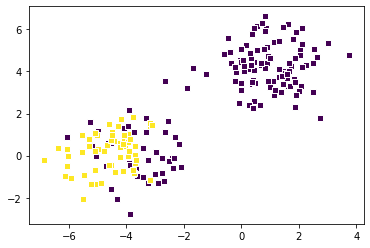

[2/4] loss is: 4.792409855202444e-14


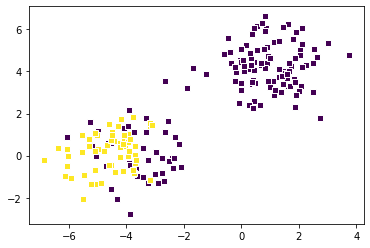

[2/4] loss is: 4.792409855202444e-14


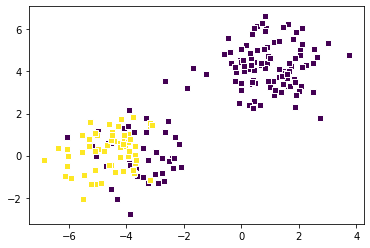

[2/4] loss is: 4.792409855202444e-14


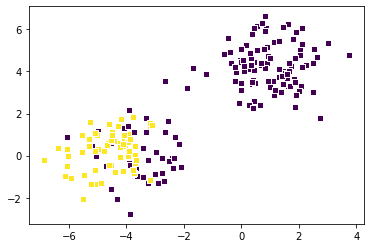

[2/4] loss is: 4.792409855202444e-14


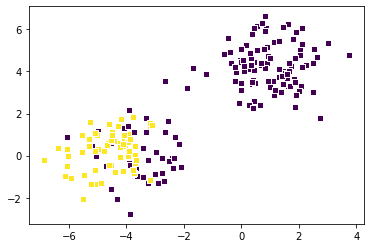

[2/4] loss is: 4.792409855202444e-14


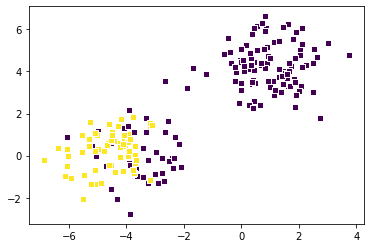

[2/4] loss is: 4.792409855202444e-14


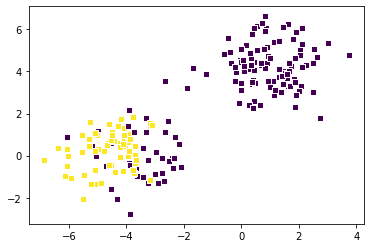

[2/4] loss is: 4.792409855202444e-14


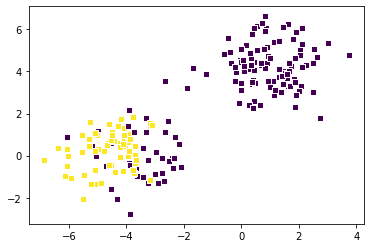

[2/4] loss is: 4.792409855202444e-14


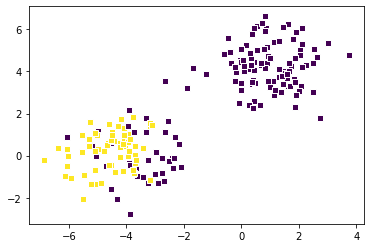

[2/4] loss is: 4.792409855202444e-14


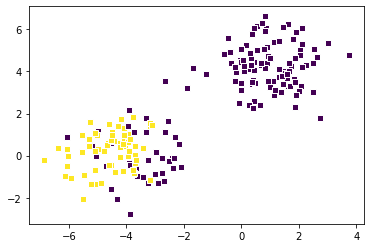

[2/4] loss is: 4.792409855202444e-14


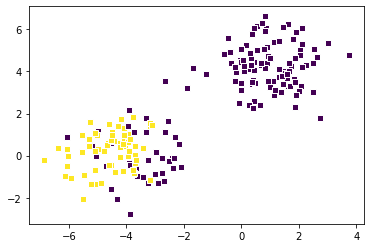

[2/4] loss is: 4.792409855202444e-14


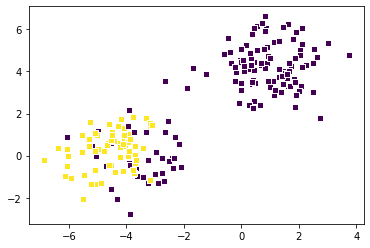

[2/4] loss is: 4.792409855202444e-14


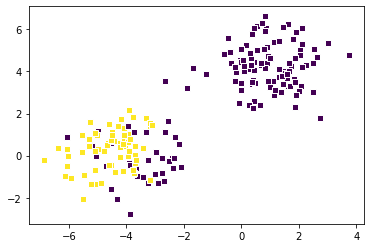

[2/4] loss is: 4.792409855202444e-14


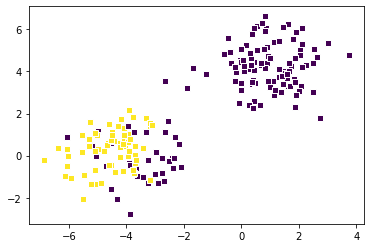

[2/4] loss is: 4.792409855202444e-14


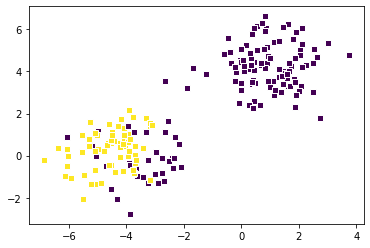

[2/4] loss is: 4.792409855202444e-14


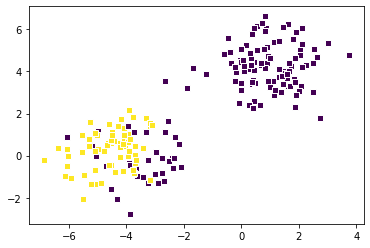

[2/4] loss is: 4.792409855202444e-14


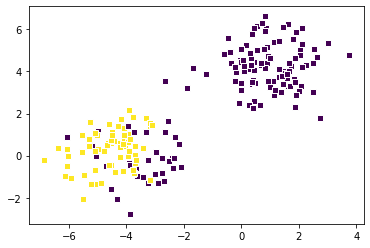

[2/4] loss is: 4.792409855202444e-14


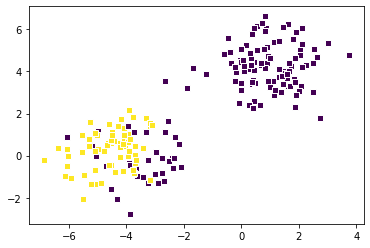

[2/4] loss is: 4.7975908959840107e-14


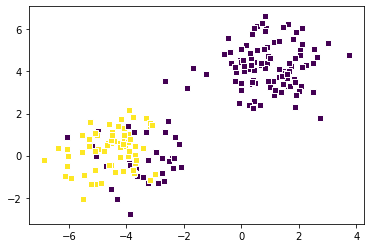

[2/4] loss is: 4.7975908959840107e-14


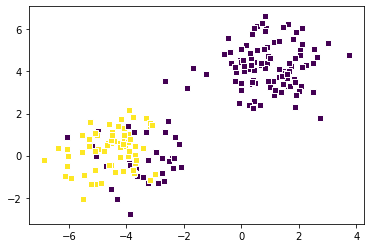

[2/4] loss is: 4.7975908959840107e-14


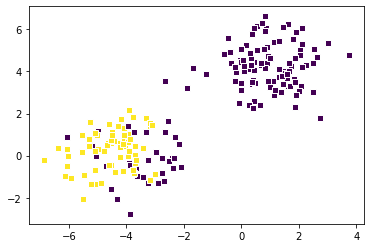

[2/4] loss is: 4.7975908959840107e-14


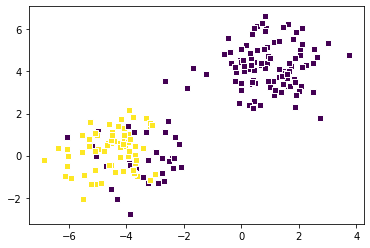

[2/4] loss is: 4.7975908959840107e-14


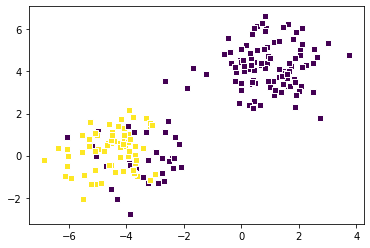

[2/4] loss is: 4.7975908959840107e-14


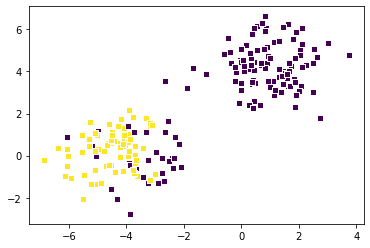

[2/4] loss is: 4.7975908959840107e-14


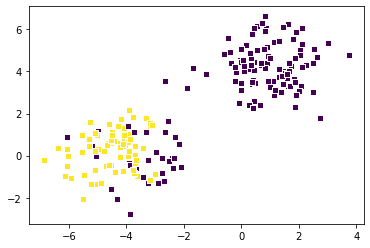

[2/4] loss is: 4.7975908959840107e-14


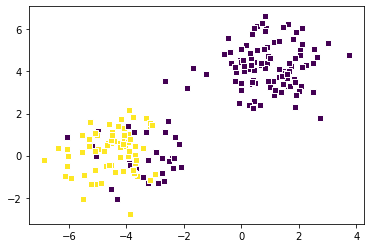

[2/4] loss is: 4.7975908959840107e-14


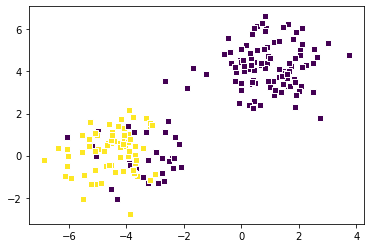

[2/4] loss is: 4.7975908959840107e-14


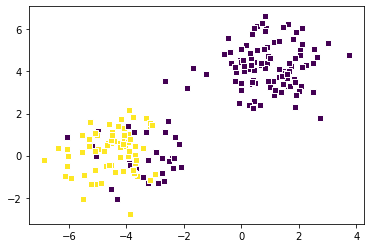

[2/4] loss is: 4.7975908959840107e-14


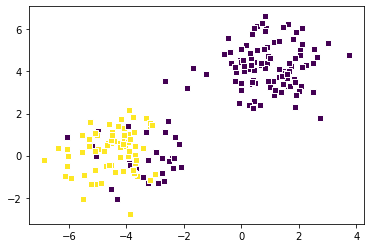

[2/4] loss is: 4.7975908959840107e-14


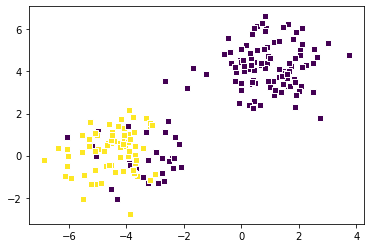

[2/4] loss is: 4.7320348697680374e-14


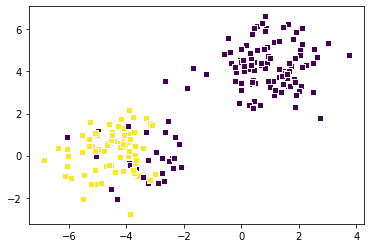

[2/4] loss is: 4.7320348697680374e-14


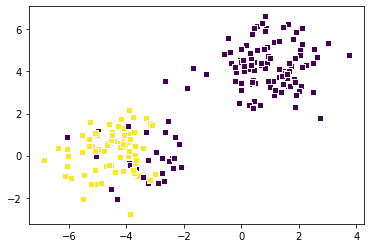

[2/4] loss is: 4.7320348697680374e-14


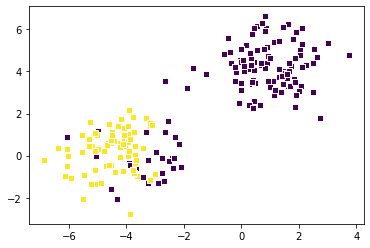

[2/4] loss is: 4.7320348697680374e-14


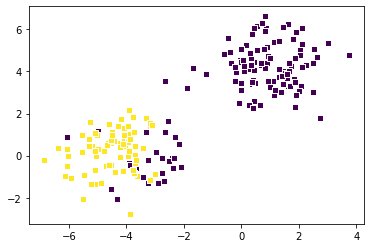

[2/4] loss is: 4.7320348697680374e-14


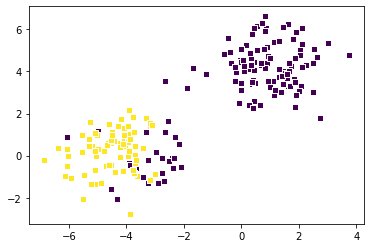

[2/4] loss is: 4.7320348697680374e-14


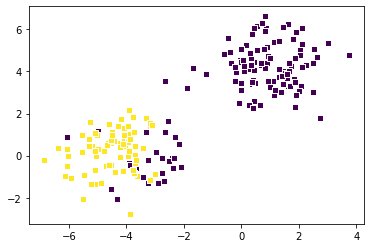

[2/4] loss is: 4.7320348697680374e-14


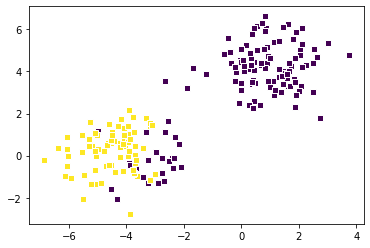

[2/4] loss is: 4.7320348697680374e-14


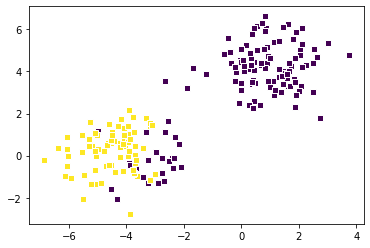

[2/4] loss is: 4.7320348697680374e-14


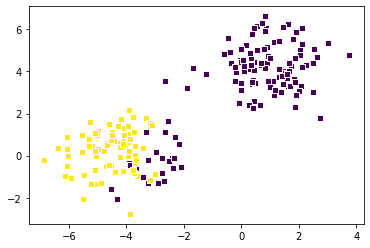

[2/4] loss is: 4.7320348697680374e-14


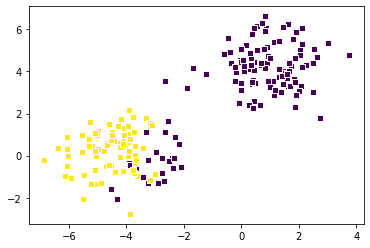

[2/4] loss is: 4.7320348697680374e-14


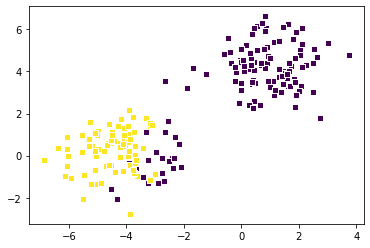

[2/4] loss is: 4.7320348697680374e-14


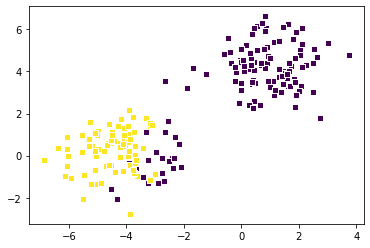

[2/4] loss is: 4.7320348697680374e-14


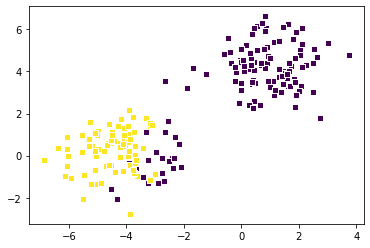

[2/4] loss is: 4.7320348697680374e-14


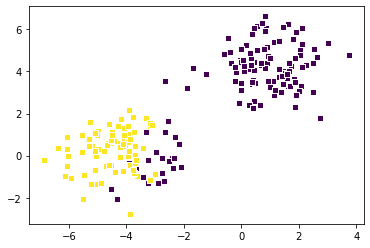

[2/4] loss is: 4.7320348697680374e-14


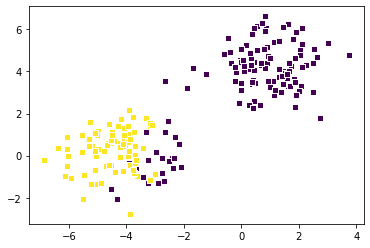

[2/4] loss is: 4.7320348697680374e-14


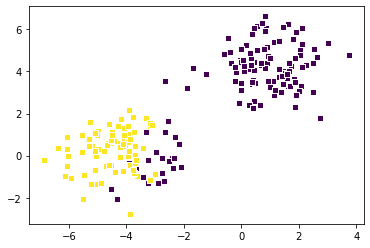

[2/4] loss is: 4.7320348697680374e-14


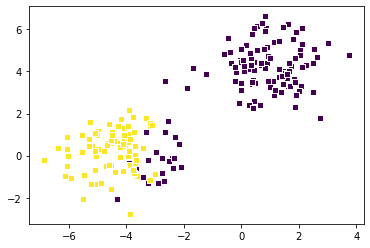

[2/4] loss is: 4.7320348697680374e-14


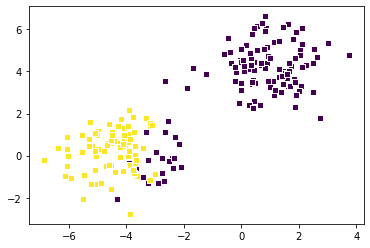

[2/4] loss is: 4.7320348697680374e-14


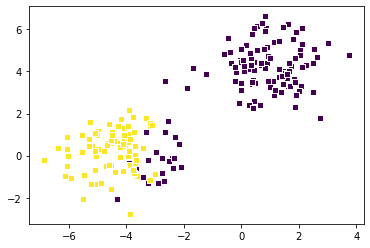

[2/4] loss is: 4.7320348697680374e-14


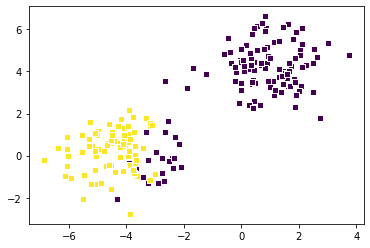

[2/4] loss is: 4.7320348697680374e-14


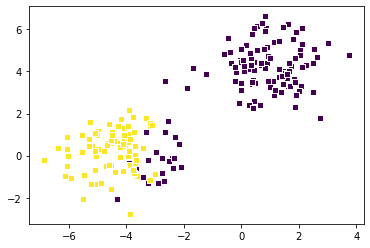

[2/4] loss is: 4.7320348697680374e-14


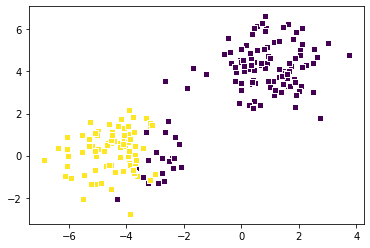

[2/4] loss is: 4.7320348697680374e-14


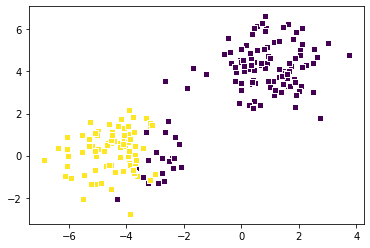

[2/4] loss is: 4.7320348697680374e-14


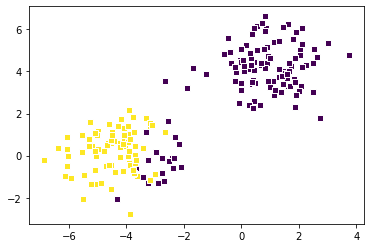

[2/4] loss is: 4.7320348697680374e-14


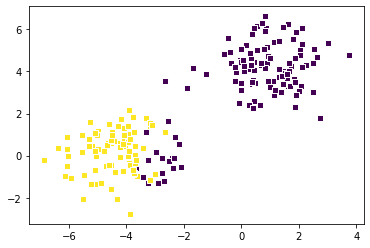

[2/4] loss is: 4.7320348697680374e-14


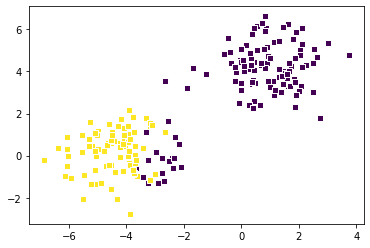

[2/4] loss is: 4.7320348697680374e-14


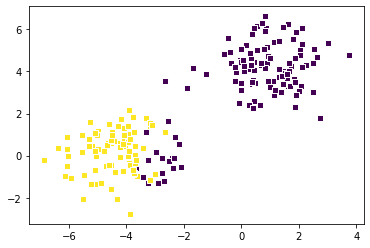

[2/4] loss is: 4.7320348697680374e-14


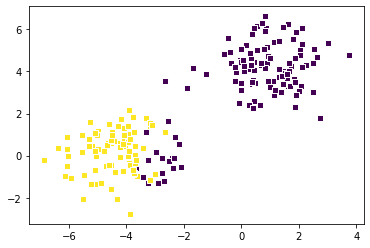

[2/4] loss is: 4.7320348697680374e-14


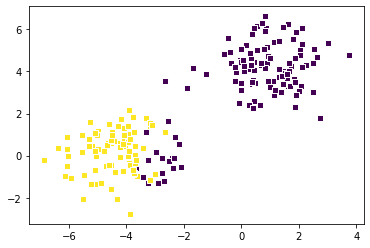

[2/4] loss is: 4.7320348697680374e-14


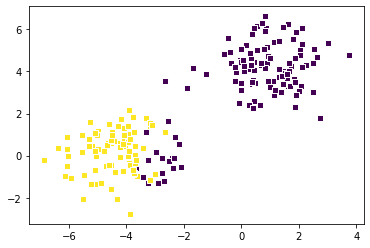

[2/4] loss is: 4.7320348697680374e-14


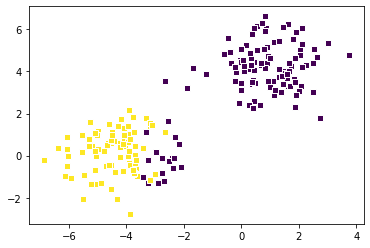

[2/4] loss is: 4.7320348697680374e-14


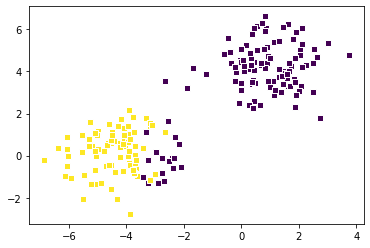

[2/4] loss is: 4.7320348697680374e-14


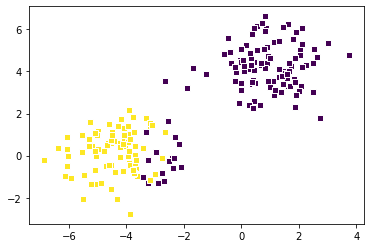

[2/4] loss is: 4.7320348697680374e-14


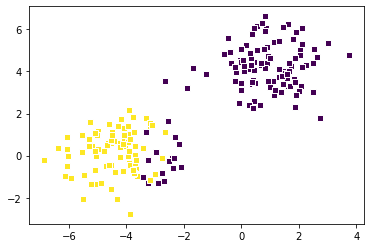

[2/4] loss is: 4.7320348697680374e-14


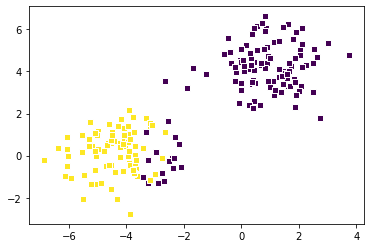

[2/4] loss is: 4.7320348697680374e-14


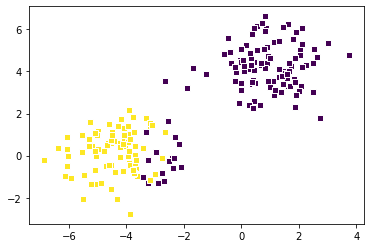

[2/4] loss is: 4.7320348697680374e-14


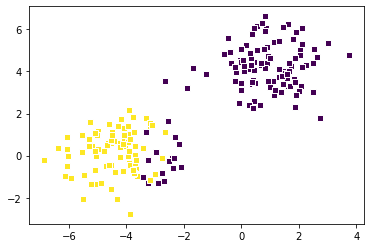

[2/4] loss is: 4.7320348697680374e-14


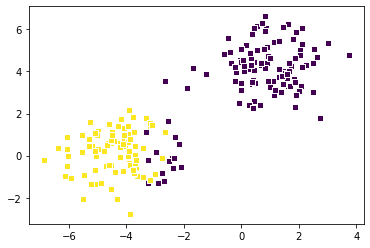

[2/4] loss is: 4.7320348697680374e-14


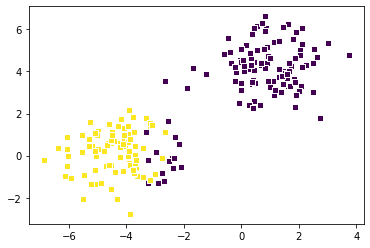

[2/4] loss is: 4.7320348697680374e-14


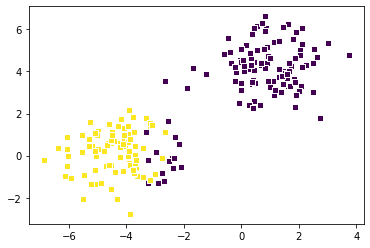

[2/4] loss is: 4.7320348697680374e-14


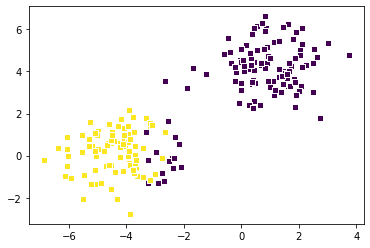

[2/4] loss is: 4.7320348697680374e-14


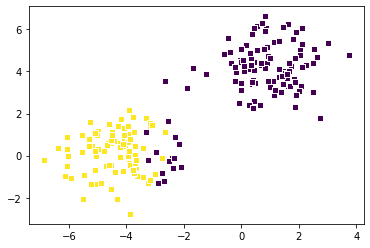

[2/4] loss is: 4.7320348697680374e-14


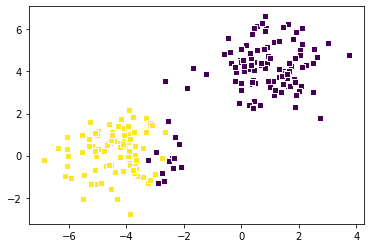

[2/4] loss is: 4.7320348697680374e-14


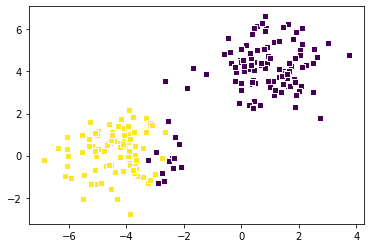

[2/4] loss is: 4.7320348697680374e-14


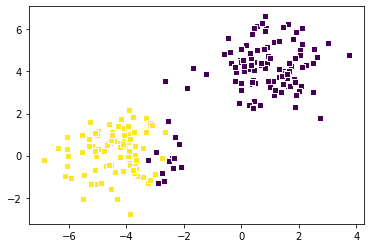

[2/4] loss is: 4.7320348697680374e-14


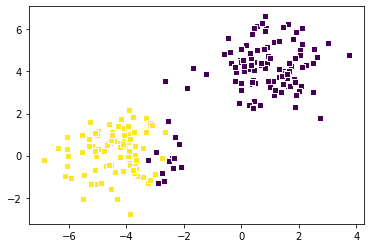

[2/4] loss is: 4.7320348697680374e-14


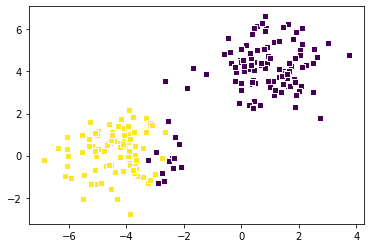

[2/4] loss is: 4.7320348697680374e-14


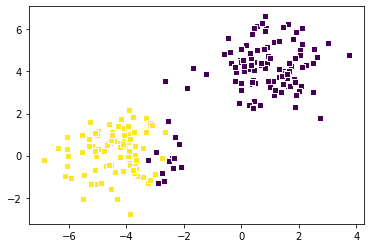

[2/4] loss is: 4.7320348697680374e-14


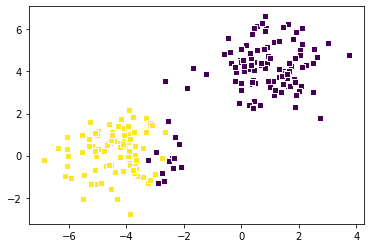

[2/4] loss is: 4.7320348697680374e-14


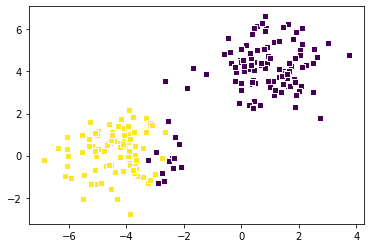

[2/4] loss is: 4.7320348697680374e-14


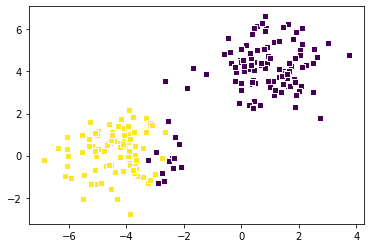

[2/4] loss is: 4.7320348697680374e-14


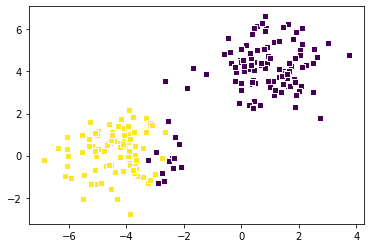

[2/4] loss is: 4.7320348697680374e-14


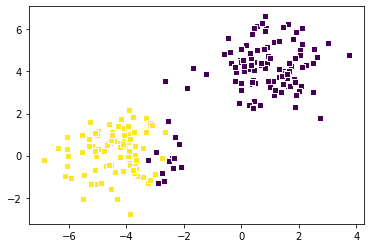

[2/4] loss is: 4.7320348697680374e-14


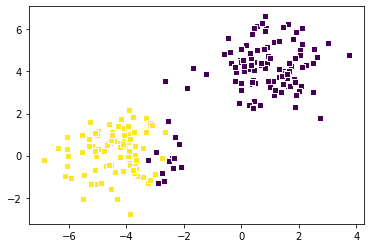

[2/4] loss is: 4.7320348697680374e-14


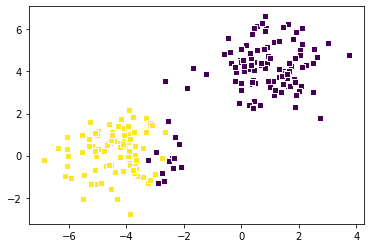

[2/4] loss is: 4.7371630427865414e-14


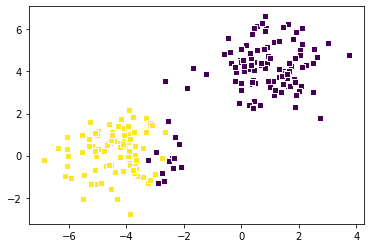

[2/4] loss is: 4.7371630427865414e-14


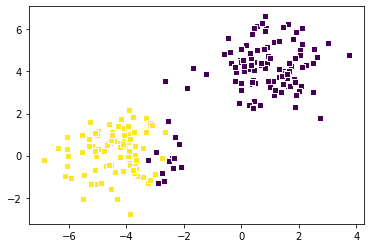

[2/4] loss is: 4.7371630427865414e-14


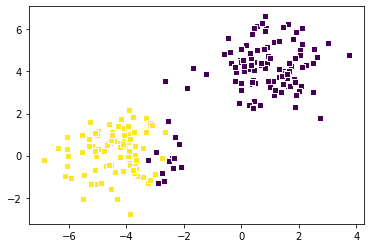

[2/4] loss is: 4.7371630427865414e-14


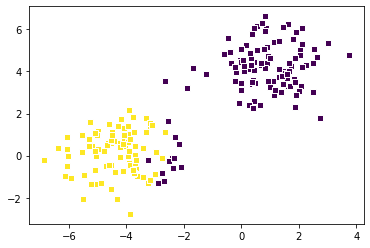

[2/4] loss is: 4.7371630427865414e-14


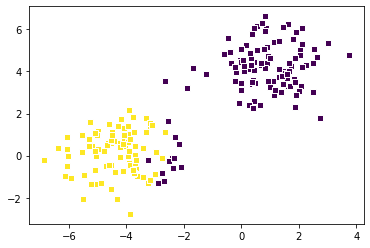

[2/4] loss is: 4.7371630427865414e-14


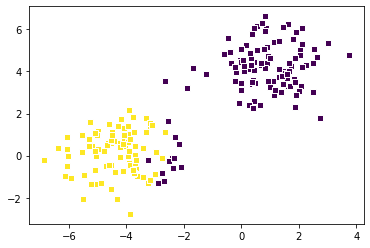

[2/4] loss is: 4.7371630427865414e-14


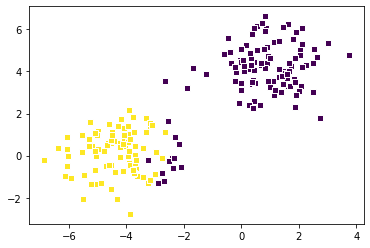

[2/4] loss is: 4.7371630427865414e-14


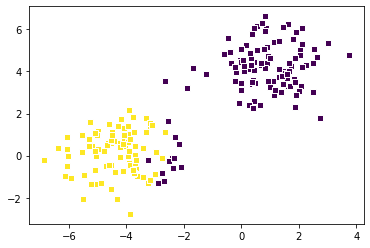

[2/4] loss is: 4.7371630427865414e-14


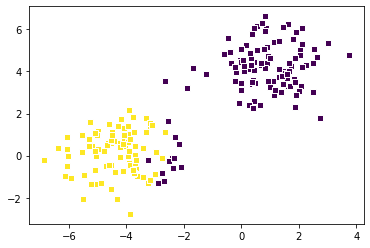

[2/4] loss is: 4.7371630427865414e-14


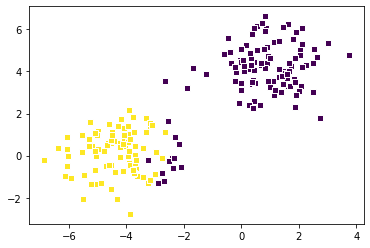

[2/4] loss is: 4.7371630427865414e-14


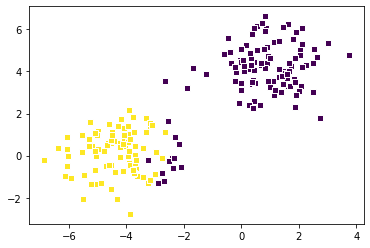

[2/4] loss is: 4.7371630427865414e-14


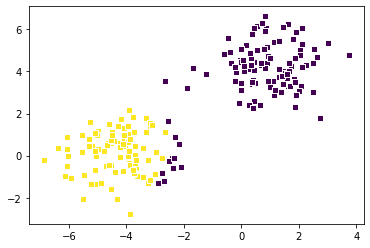

[2/4] loss is: 4.7371630427865414e-14


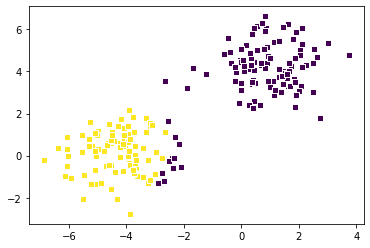

[2/4] loss is: 4.7371630427865414e-14


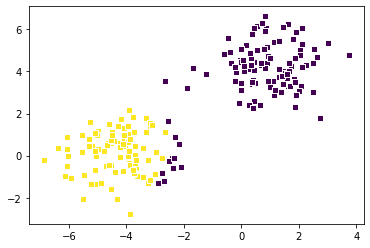

[2/4] loss is: 4.7371630427865414e-14


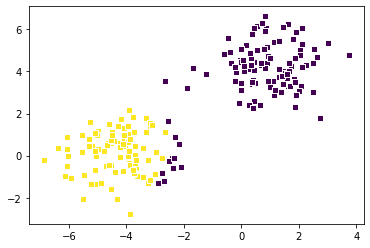

[2/4] loss is: 4.7371630427865414e-14


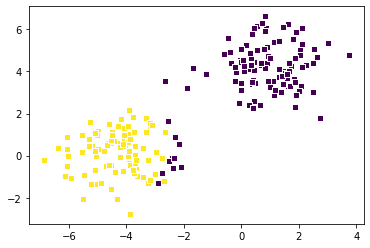

[2/4] loss is: 4.7371630427865414e-14


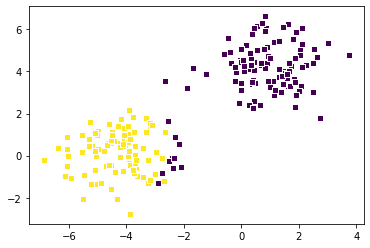

[2/4] loss is: 4.7371630427865414e-14


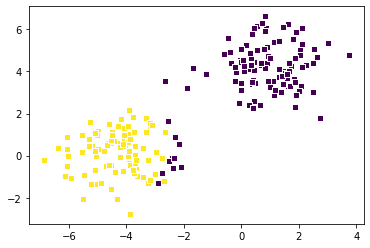

[2/4] loss is: 4.7371630427865414e-14


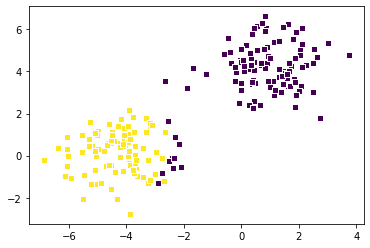

[2/4] loss is: 4.7371630427865414e-14


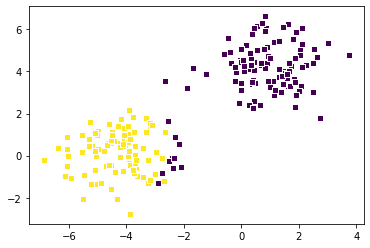

[2/4] loss is: 4.7371630427865414e-14


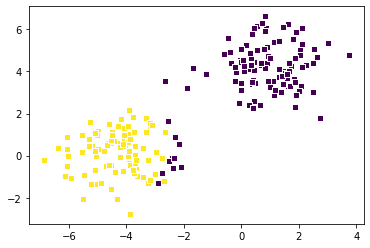

[2/4] loss is: 4.7371630427865414e-14


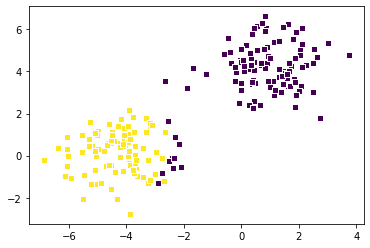

[2/4] loss is: 4.7371630427865414e-14


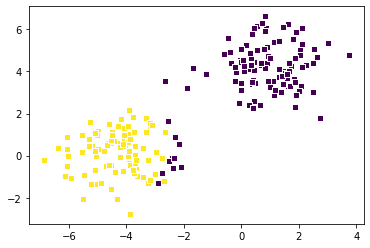

[2/4] loss is: 4.7371630427865414e-14


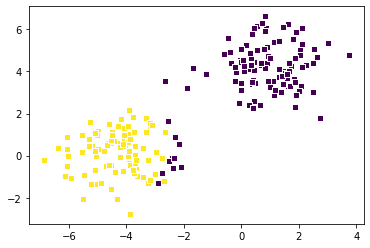

[2/4] loss is: 4.7371630427865414e-14


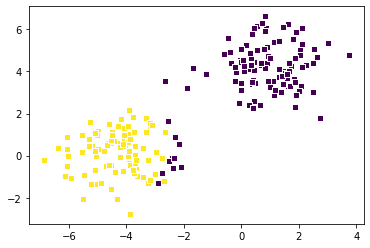

[2/4] loss is: 4.7371630427865414e-14


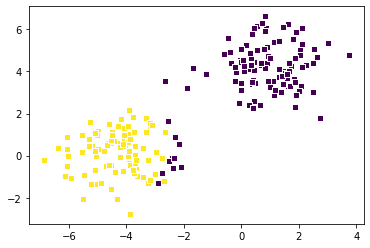

[2/4] loss is: 4.7371630427865414e-14


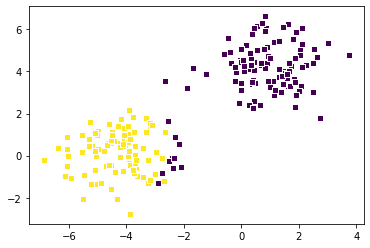

[2/4] loss is: 4.7371630427865414e-14


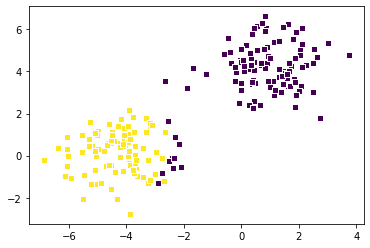

[2/4] loss is: 4.7371630427865414e-14


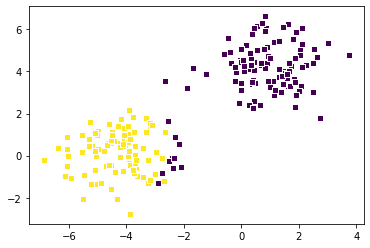

[2/4] loss is: 4.7371630427865414e-14


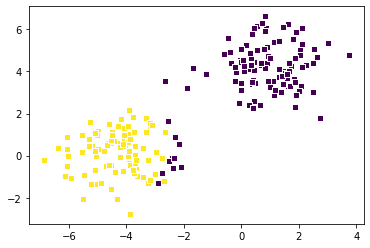

[2/4] loss is: 4.7371630427865414e-14


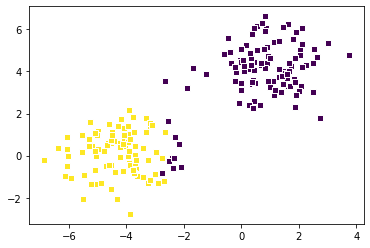

[2/4] loss is: 4.7371630427865414e-14


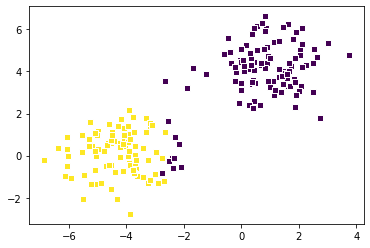

[2/4] loss is: 4.7371630427865414e-14


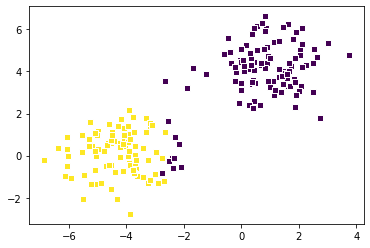

[2/4] loss is: 4.759843313146743e-14


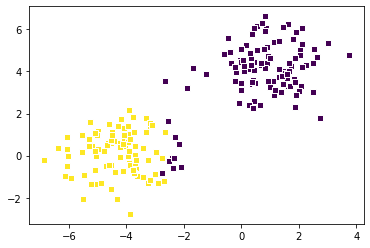

[2/4] loss is: 4.759843313146743e-14


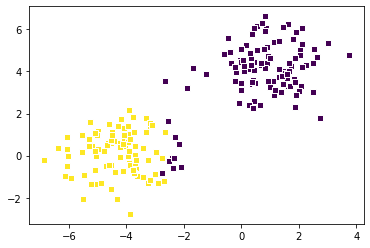

[2/4] loss is: 4.759843313146743e-14


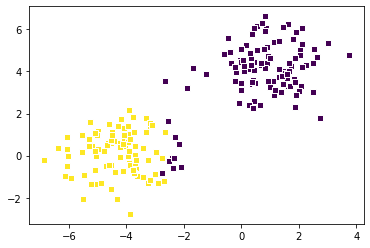

[2/4] loss is: 4.759843313146743e-14


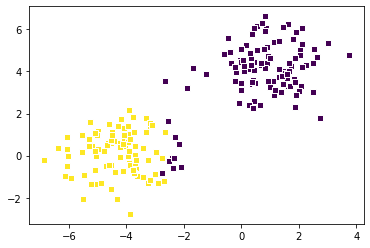

[2/4] loss is: 4.759843313146743e-14


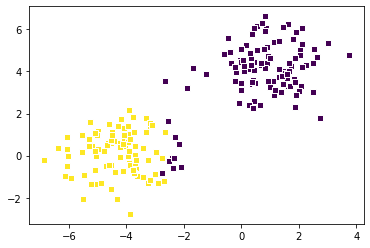

[2/4] loss is: 4.759843313146743e-14


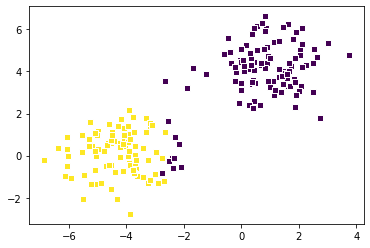

[2/4] loss is: 4.759843313146743e-14


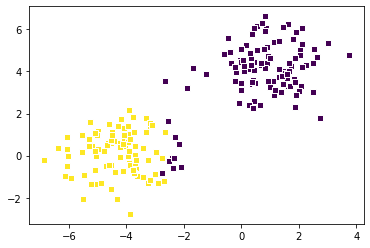

[2/4] loss is: 4.759843313146743e-14


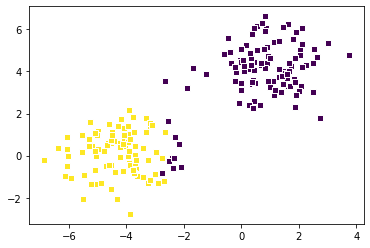

[2/4] loss is: 4.759843313146743e-14


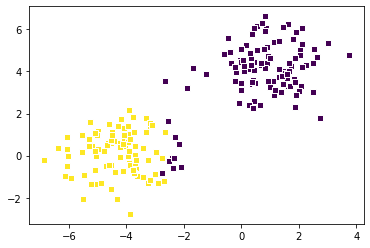

[2/4] loss is: 4.759843313146743e-14


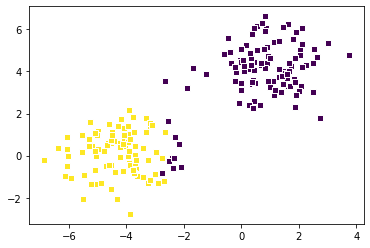

[2/4] loss is: 4.759843313146743e-14


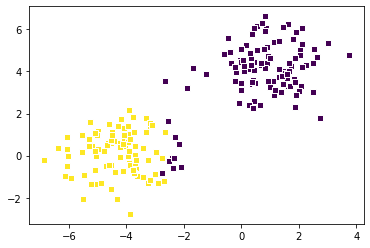

[2/4] loss is: 4.759843313146743e-14


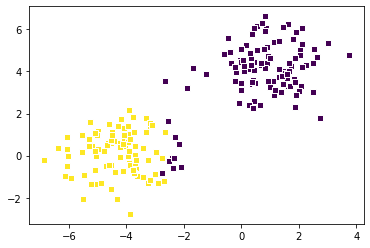

[2/4] loss is: 4.759843313146743e-14


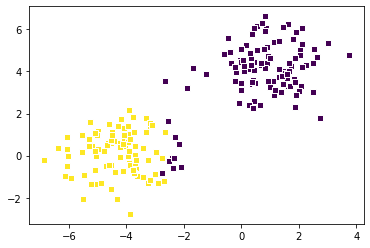

[2/4] loss is: 4.759843313146743e-14


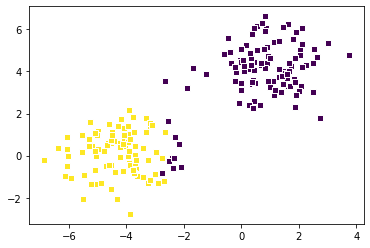

[2/4] loss is: 4.759843313146743e-14


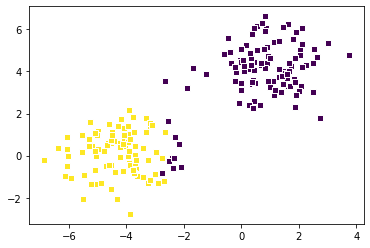

[2/4] loss is: 4.759843313146743e-14


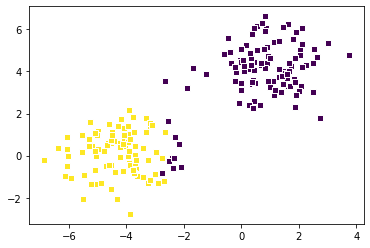

[2/4] loss is: 4.759843313146743e-14


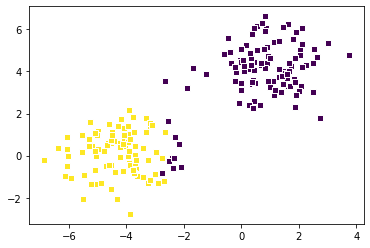

[2/4] loss is: 4.759843313146743e-14


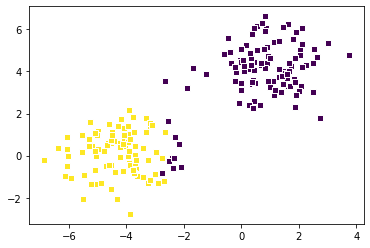

[2/4] loss is: 4.743454306592752e-14


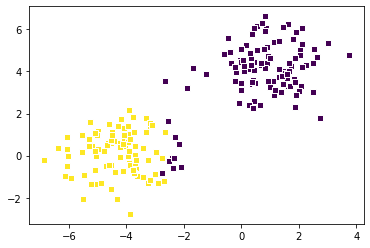

[2/4] loss is: 4.743454306592752e-14


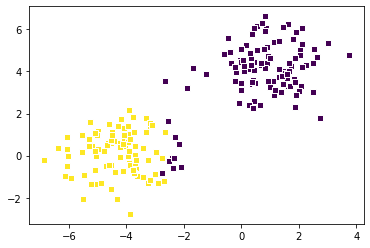

[2/4] loss is: 4.743454306592752e-14


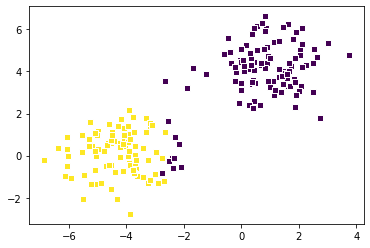

[2/4] loss is: 4.743454306592752e-14


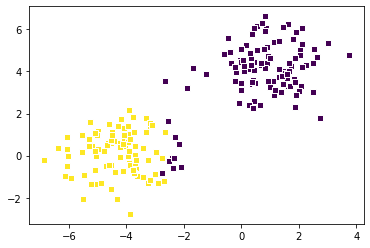

[2/4] loss is: 4.743454306592752e-14


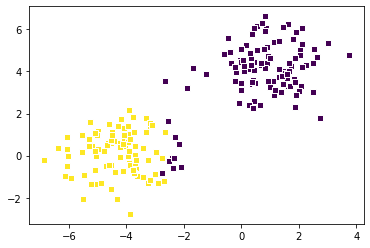

[2/4] loss is: 4.743454306592752e-14


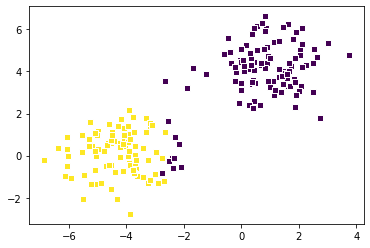

[2/4] loss is: 4.743454306592752e-14


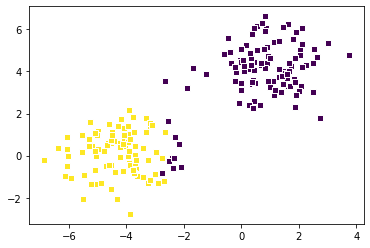

[2/4] loss is: 4.743454306592752e-14


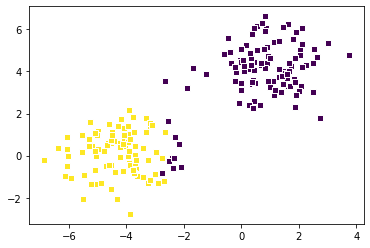

[2/4] loss is: 4.743454306592752e-14


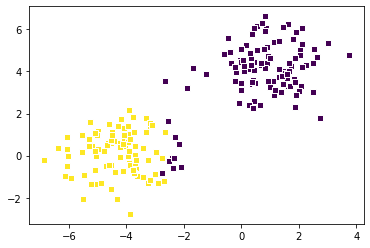

[2/4] loss is: 4.743454306592752e-14


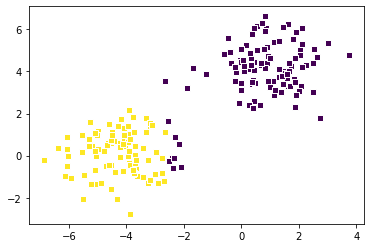

[2/4] loss is: 4.743454306592752e-14


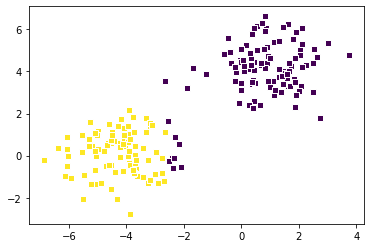

[2/4] loss is: 4.743454306592752e-14


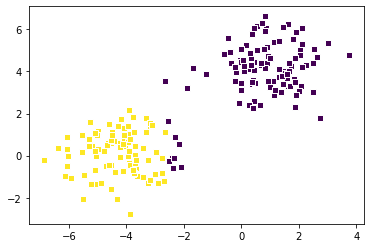

[2/4] loss is: 4.743454306592752e-14


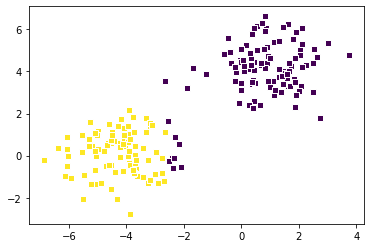

[2/4] loss is: 4.743454306592752e-14


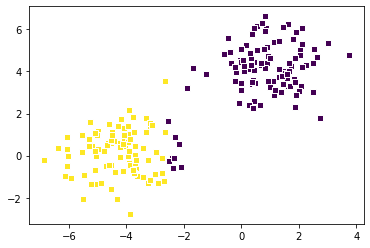

[2/4] loss is: 4.743454306592752e-14


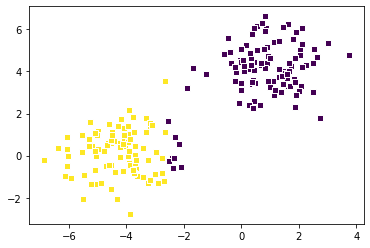

[2/4] loss is: 4.743454306592752e-14


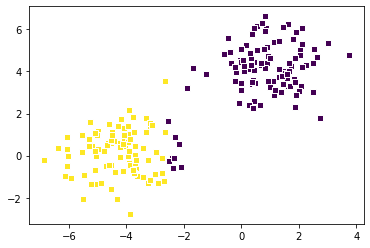

[2/4] loss is: 4.743454306592752e-14


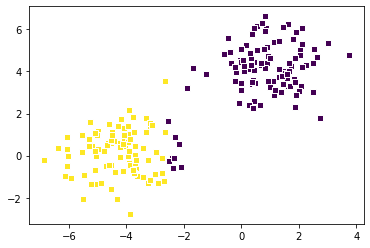

[2/4] loss is: 4.743454306592752e-14


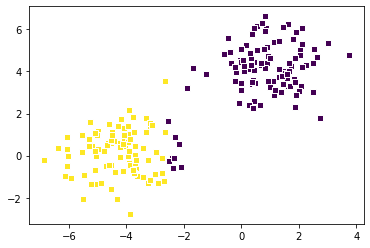

[2/4] loss is: 4.743454306592752e-14


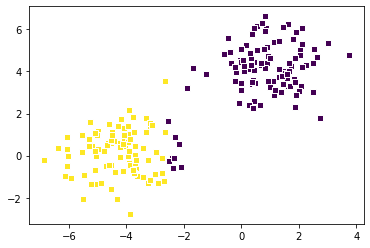

[2/4] loss is: 4.743454306592752e-14


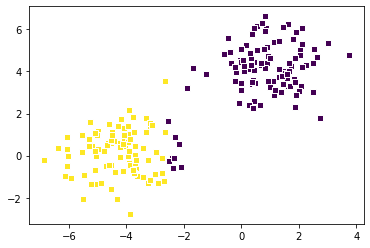

[2/4] loss is: 4.743454306592752e-14


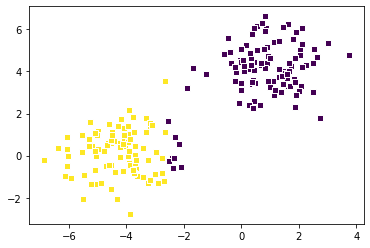

[2/4] loss is: 4.743454306592752e-14


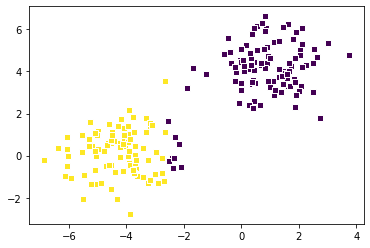

[2/4] loss is: 4.743454306592752e-14


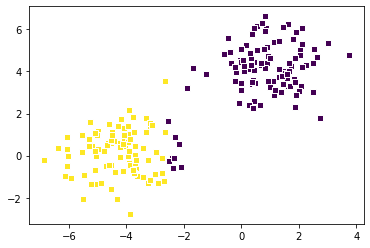

[2/4] loss is: 4.743454306592752e-14


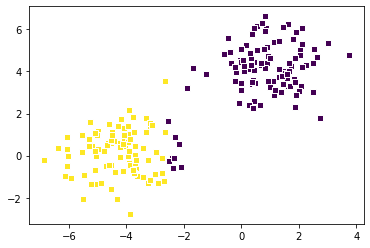

[2/4] loss is: 4.743454306592752e-14


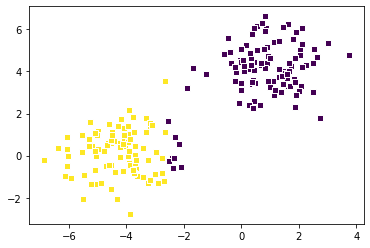

[2/4] loss is: 4.743454306592752e-14


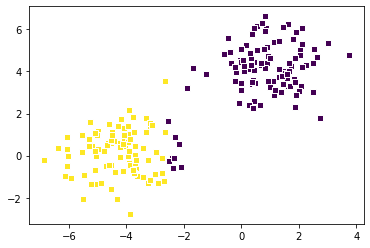

[2/4] loss is: 4.743454306592752e-14


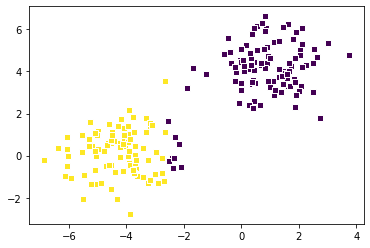

[2/4] loss is: 4.743454306592752e-14


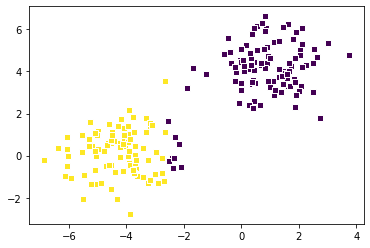

[2/4] loss is: 4.743454306592752e-14


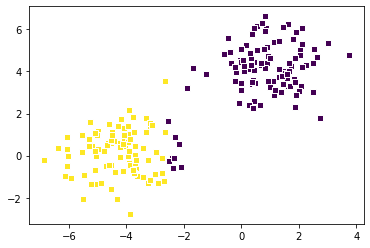

[2/4] loss is: 4.743454306592752e-14


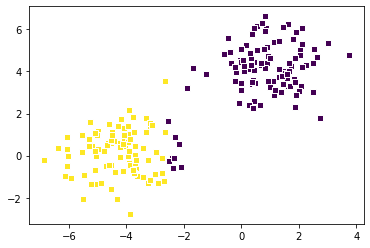

[2/4] loss is: 4.743454306592752e-14


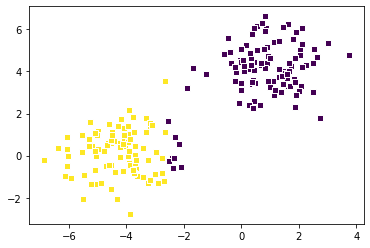

[2/4] loss is: 4.743454306592752e-14


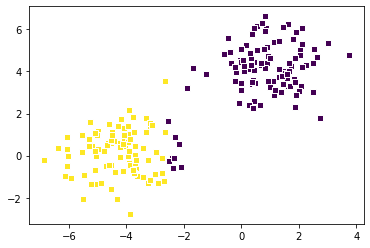

[2/4] loss is: 4.743454306592752e-14


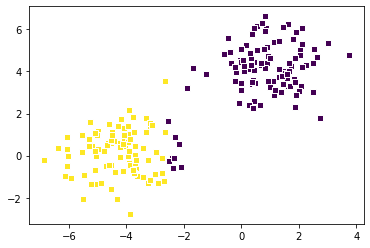

[2/4] loss is: 4.743454306592752e-14


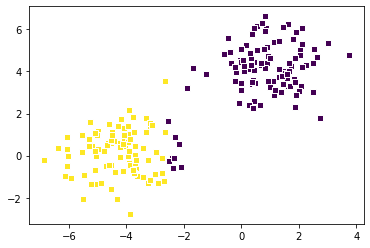

[2/4] loss is: 4.743454306592752e-14


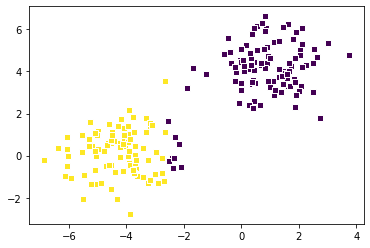

[2/4] loss is: 4.781466228245395e-14


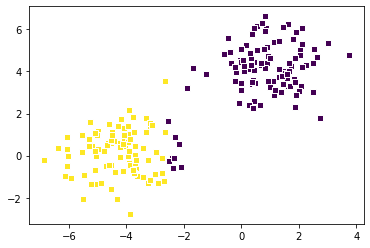

[2/4] loss is: 4.781466228245395e-14


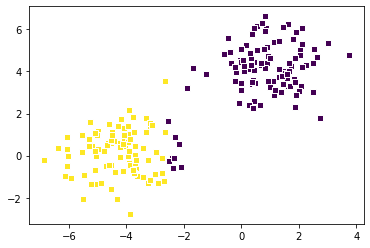

[2/4] loss is: 4.774910625623799e-14


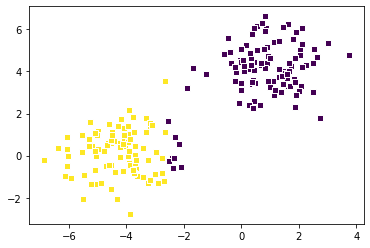

[2/4] loss is: 4.774910625623799e-14


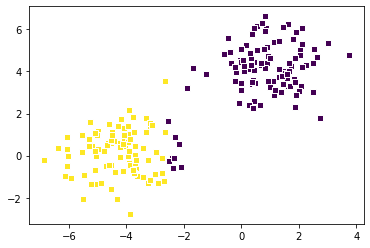

[2/4] loss is: 4.774910625623799e-14


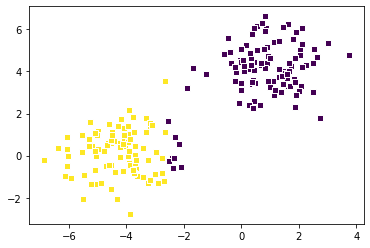

[2/4] loss is: 4.774910625623799e-14


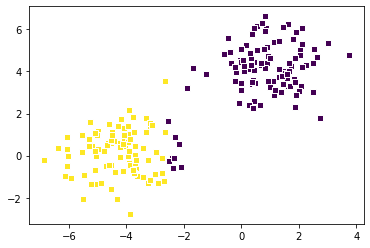

[2/4] loss is: 4.774910625623799e-14


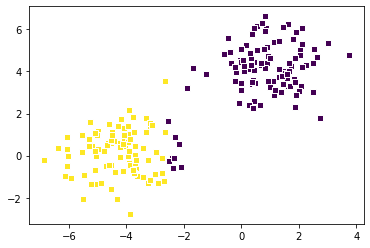

[2/4] loss is: 4.774910625623799e-14


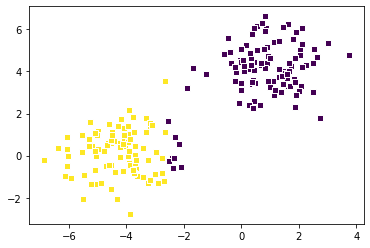

[2/4] loss is: 4.774910625623799e-14


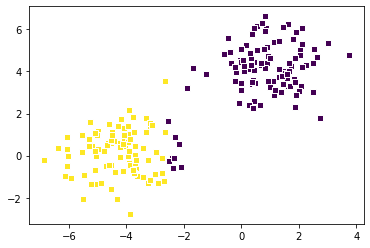

[2/4] loss is: 4.774910625623799e-14


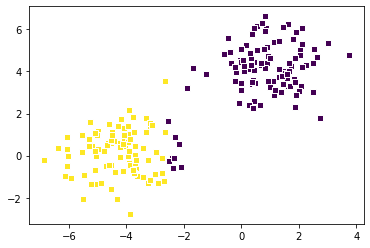

[2/4] loss is: 4.774910625623799e-14


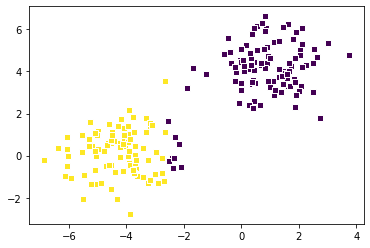

[2/4] loss is: 4.774910625623799e-14


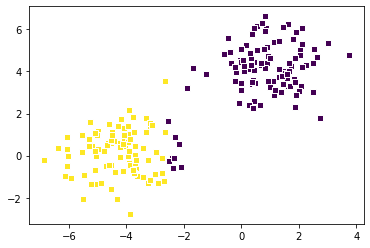

[2/4] loss is: 4.774910625623799e-14


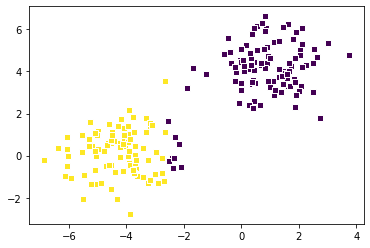

[2/4] loss is: 4.774910625623799e-14


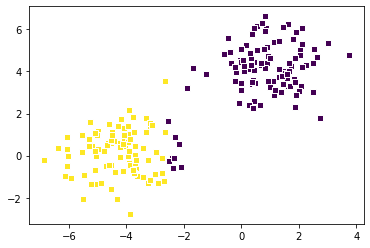

[2/4] loss is: 4.770892675629918e-14


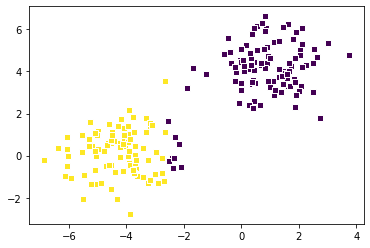

[2/4] loss is: 4.770892675629918e-14


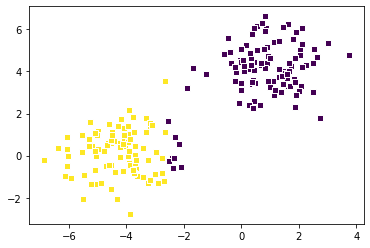

[2/4] loss is: 4.770892675629918e-14


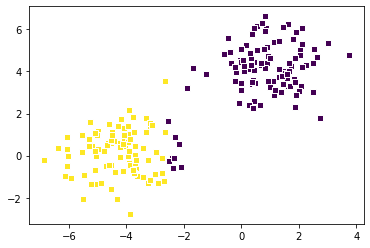

[2/4] loss is: 4.770892675629918e-14


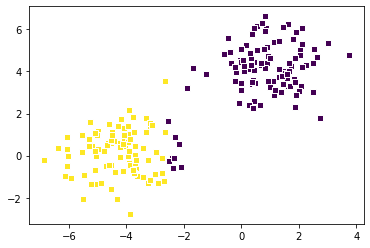

[2/4] loss is: 4.770892675629918e-14


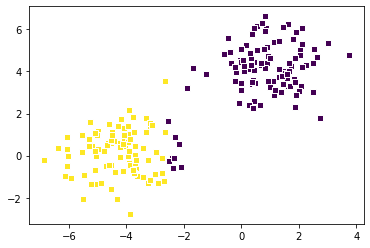

[2/4] loss is: 4.770892675629918e-14


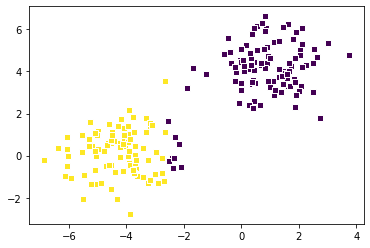

[2/4] loss is: 4.770892675629918e-14


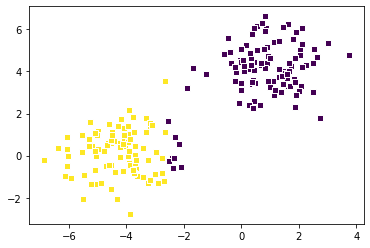

[2/4] loss is: 4.770892675629918e-14


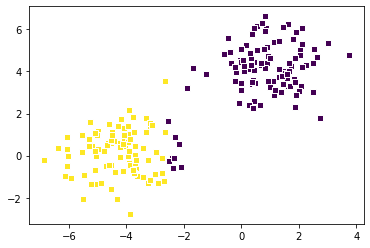

[2/4] loss is: 4.770892675629918e-14


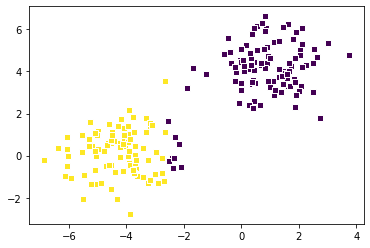

[2/4] loss is: 4.770892675629918e-14


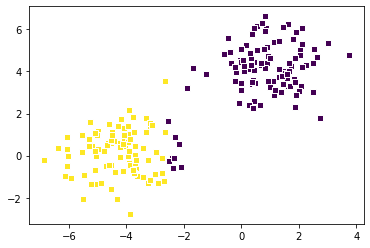

[2/4] loss is: 4.770892675629918e-14


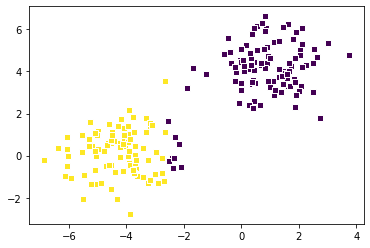

[2/4] loss is: 4.770892675629918e-14


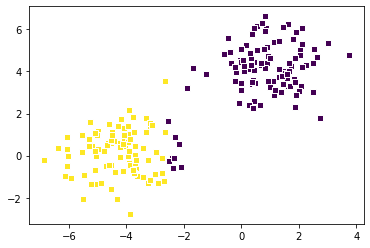

[2/4] loss is: 4.770892675629918e-14


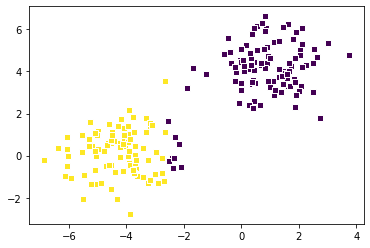

[2/4] loss is: 4.770892675629918e-14


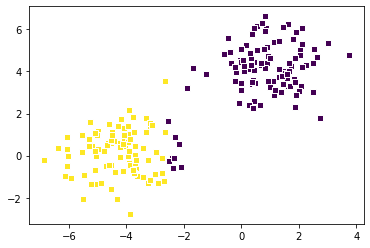

[2/4] loss is: 4.770892675629918e-14


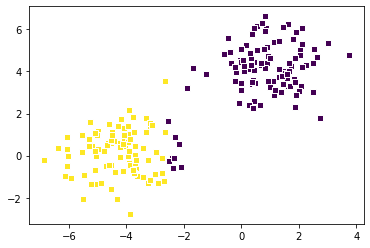

[2/4] loss is: 4.770892675629918e-14


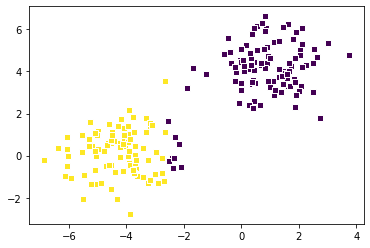

[2/4] loss is: 4.770892675629918e-14


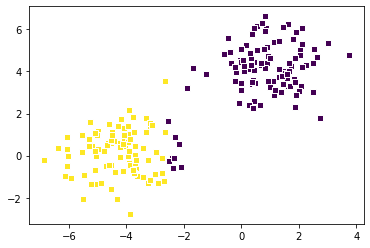

[2/4] loss is: 4.770892675629918e-14


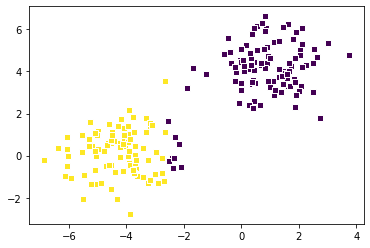

[2/4] loss is: 4.770892675629918e-14


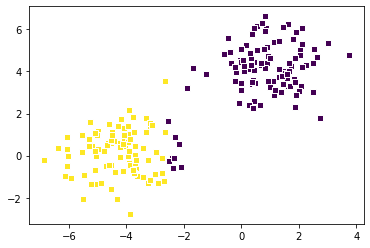

[2/4] loss is: 4.770892675629918e-14


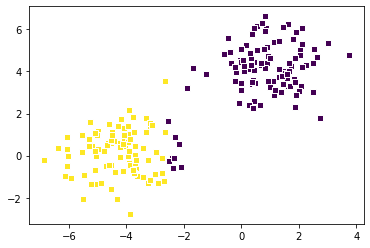

[2/4] loss is: 4.770892675629918e-14


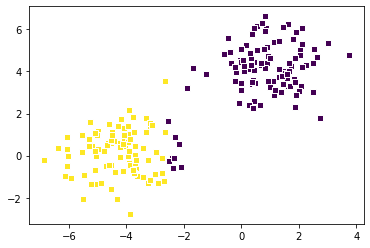

[2/4] loss is: 4.770892675629918e-14


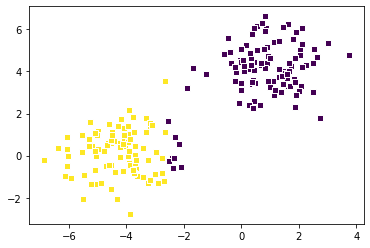

[2/4] loss is: 4.770892675629918e-14


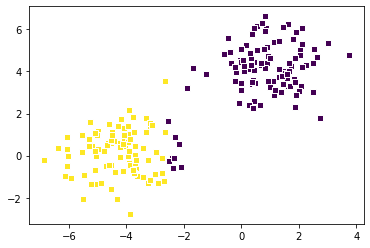

[2/4] loss is: 4.770892675629918e-14


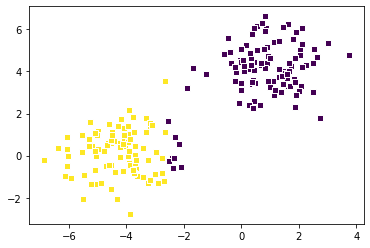

[2/4] loss is: 4.770892675629918e-14


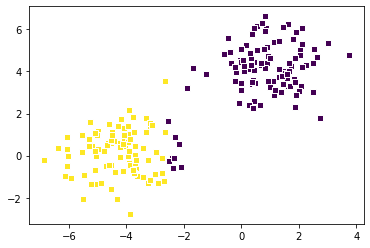

[2/4] loss is: 4.770892675629918e-14


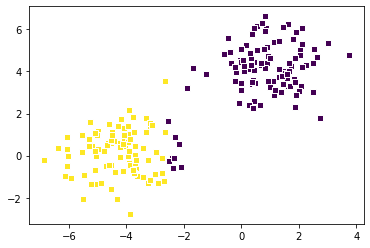

[3/4] loss is: 4.770892675629918e-14


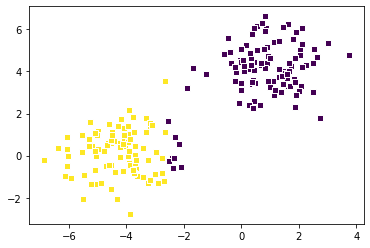

[3/4] loss is: 4.770892675629918e-14


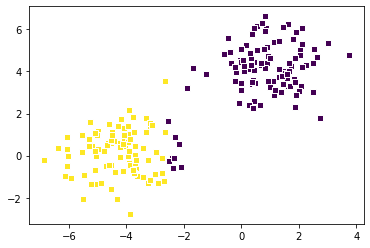

[3/4] loss is: 4.770892675629918e-14


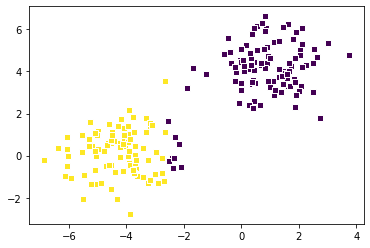

[3/4] loss is: 4.770892675629918e-14


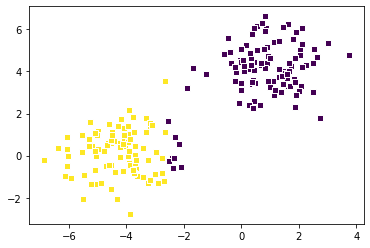

[3/4] loss is: 4.770892675629918e-14


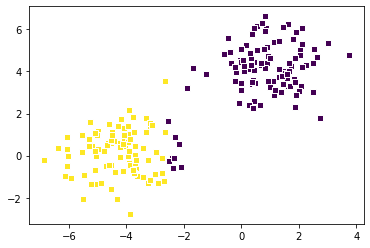

[3/4] loss is: 4.770892675629918e-14


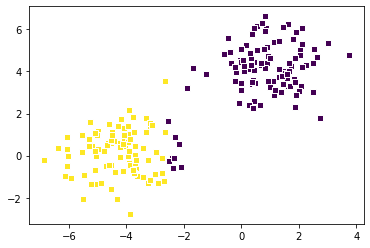

[3/4] loss is: 4.770892675629918e-14


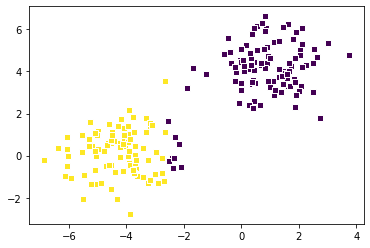

[3/4] loss is: 4.770892675629918e-14


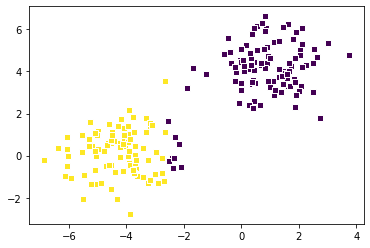

[3/4] loss is: 4.770892675629918e-14


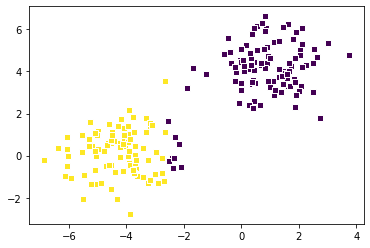

[3/4] loss is: 4.770892675629918e-14


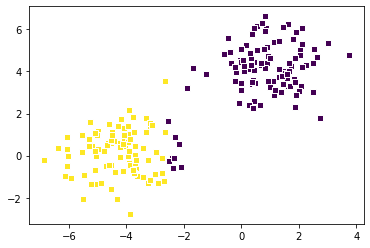

[3/4] loss is: 4.770892675629918e-14


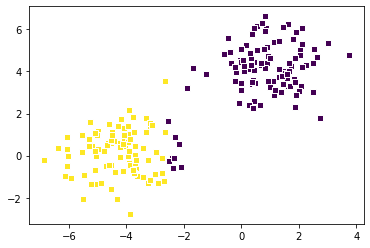

[3/4] loss is: 4.770892675629918e-14


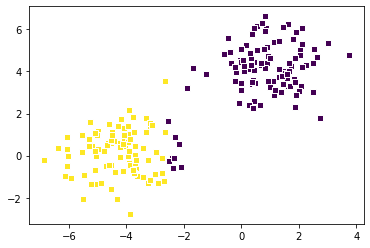

[3/4] loss is: 4.770892675629918e-14


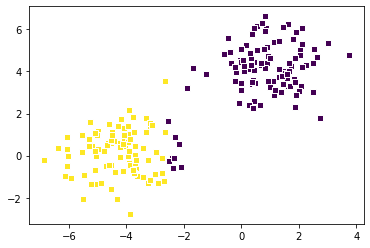

[3/4] loss is: 4.770892675629918e-14


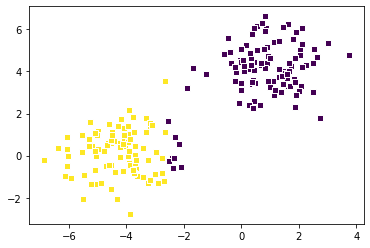

[3/4] loss is: 4.770892675629918e-14


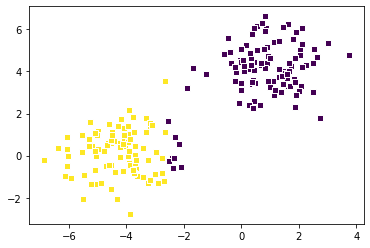

[3/4] loss is: 4.770892675629918e-14


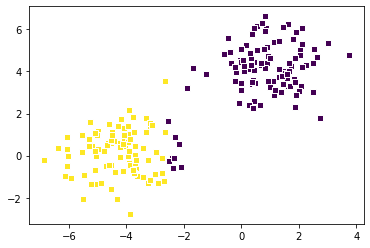

[3/4] loss is: 4.770892675629918e-14


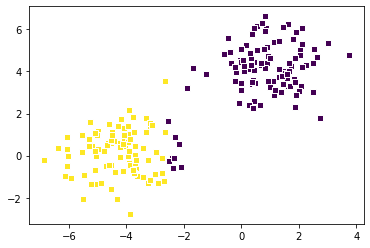

[3/4] loss is: 4.8160946130610873e-14


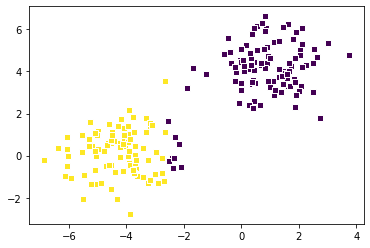

[3/4] loss is: 4.8160946130610873e-14


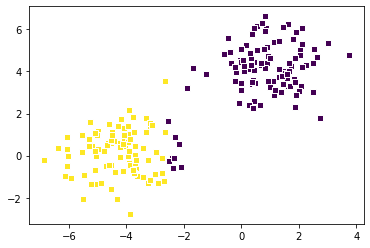

[3/4] loss is: 4.8160946130610873e-14


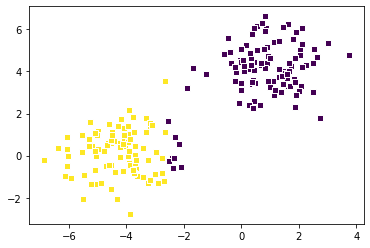

[3/4] loss is: 4.8160946130610873e-14


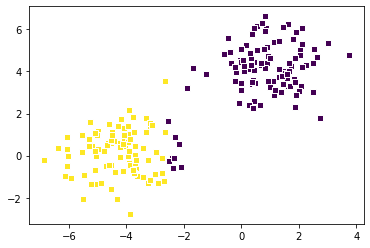

[3/4] loss is: 4.8160946130610873e-14


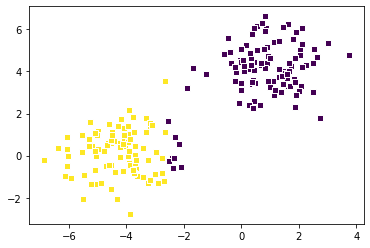

[3/4] loss is: 4.8160946130610873e-14


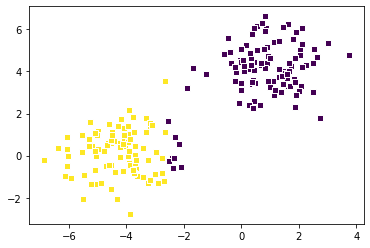

[3/4] loss is: 4.8160946130610873e-14


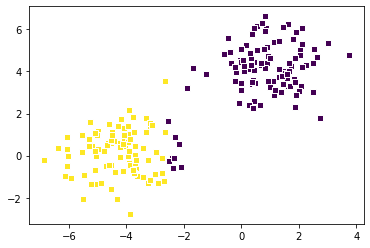

[3/4] loss is: 4.8160946130610873e-14


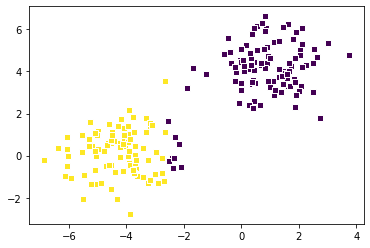

[3/4] loss is: 4.8160946130610873e-14


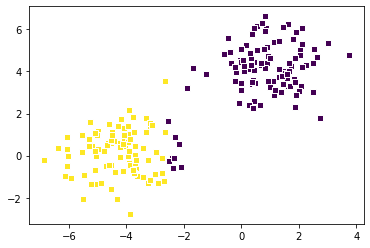

[3/4] loss is: 4.8160946130610873e-14


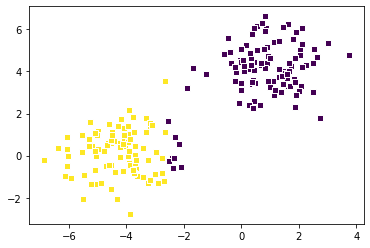

[3/4] loss is: 4.8160946130610873e-14


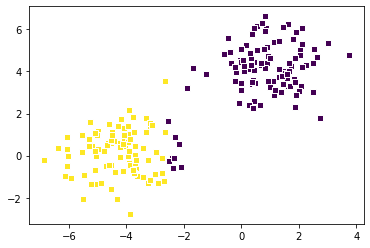

[3/4] loss is: 4.8160946130610873e-14


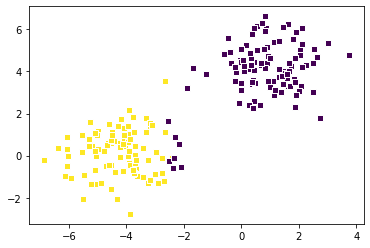

[3/4] loss is: 4.8160946130610873e-14


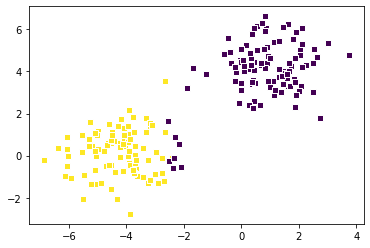

[3/4] loss is: 4.8160946130610873e-14


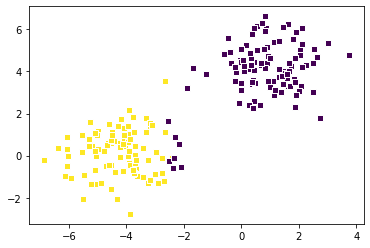

[3/4] loss is: 4.8160946130610873e-14


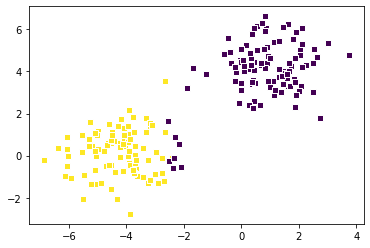

[3/4] loss is: 4.8160946130610873e-14


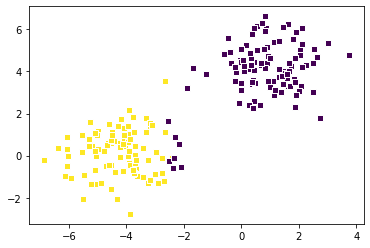

[3/4] loss is: 4.8160946130610873e-14


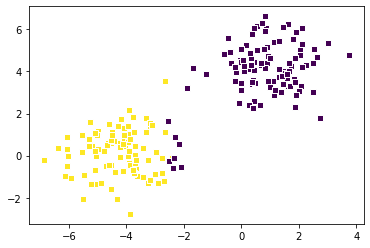

[3/4] loss is: 4.8160946130610873e-14


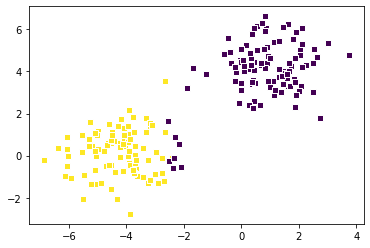

[3/4] loss is: 4.8160946130610873e-14


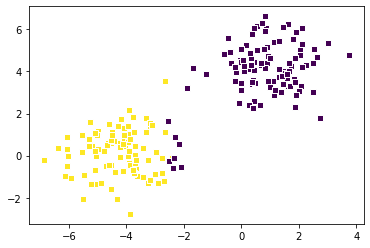

[3/4] loss is: 4.8160946130610873e-14


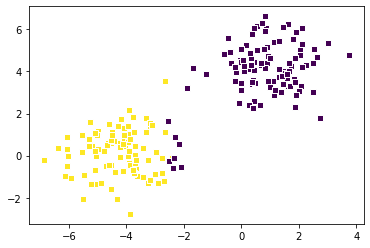

[3/4] loss is: 4.8160946130610873e-14


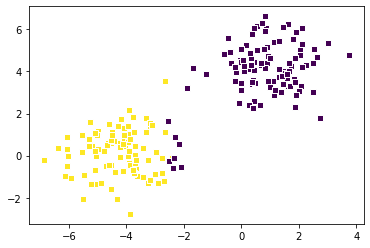

[3/4] loss is: 4.8160946130610873e-14


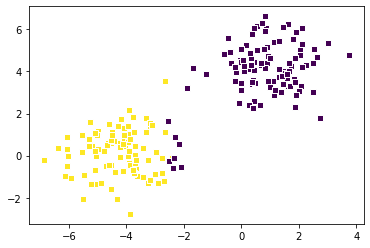

[3/4] loss is: 4.8160946130610873e-14


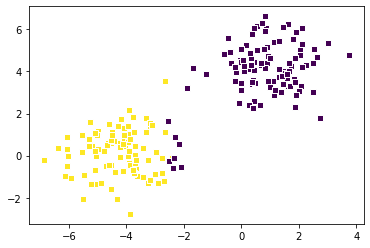

[3/4] loss is: 4.8160946130610873e-14


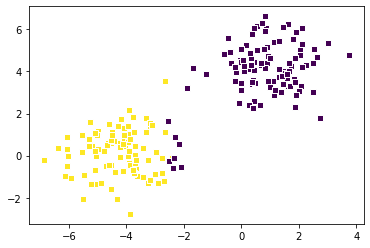

[3/4] loss is: 4.8160946130610873e-14


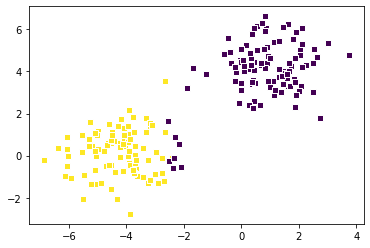

[3/4] loss is: 4.8160946130610873e-14


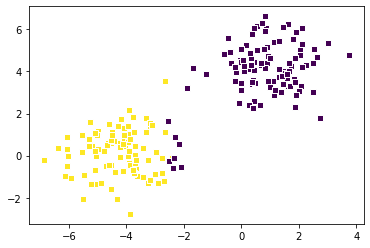

[3/4] loss is: 4.8160946130610873e-14


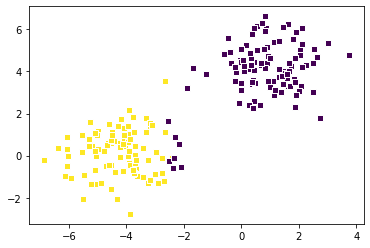

[3/4] loss is: 4.8160946130610873e-14


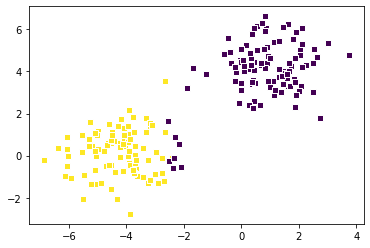

[3/4] loss is: 4.8160946130610873e-14


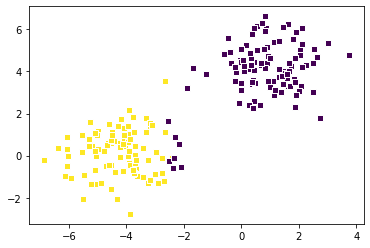

[3/4] loss is: 4.8160946130610873e-14


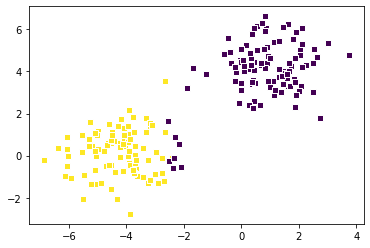

[3/4] loss is: 4.8160946130610873e-14


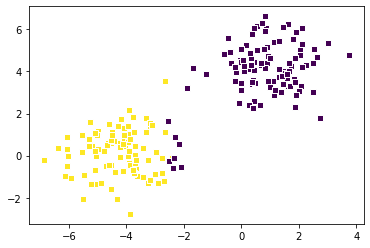

[3/4] loss is: 4.8160946130610873e-14


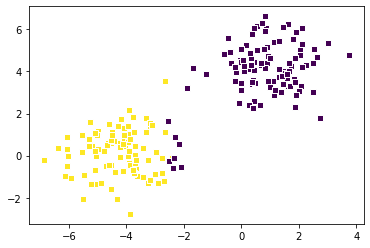

[3/4] loss is: 4.8160946130610873e-14


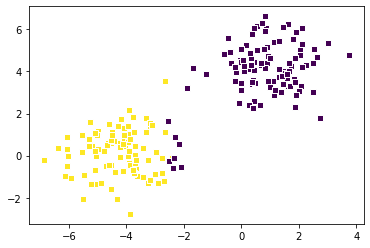

[3/4] loss is: 4.8160946130610873e-14


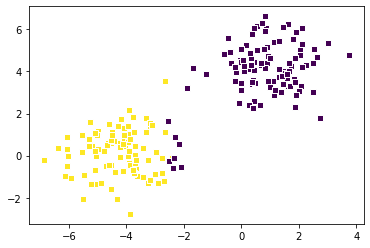

[3/4] loss is: 4.8160946130610873e-14


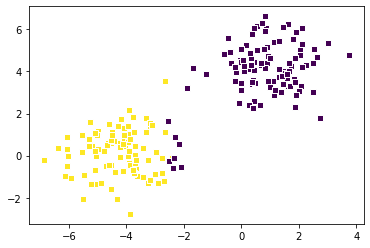

[3/4] loss is: 4.8160946130610873e-14


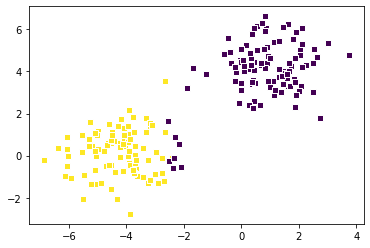

[3/4] loss is: 4.8160946130610873e-14


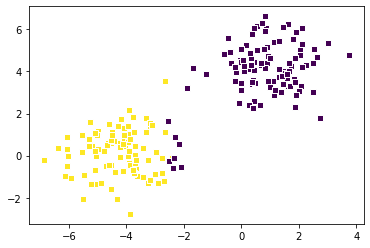

[3/4] loss is: 4.8160946130610873e-14


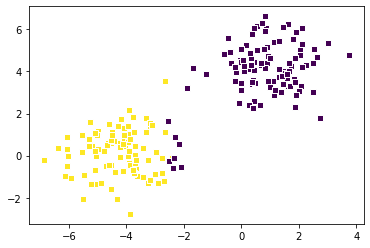

[3/4] loss is: 4.8160946130610873e-14


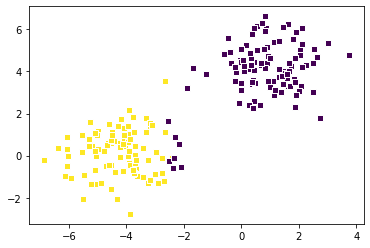

[3/4] loss is: 4.8160946130610873e-14


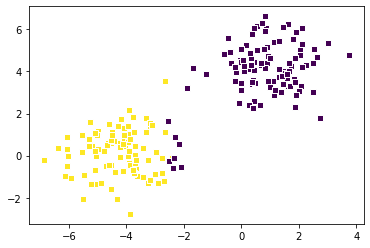

[3/4] loss is: 4.8160946130610873e-14


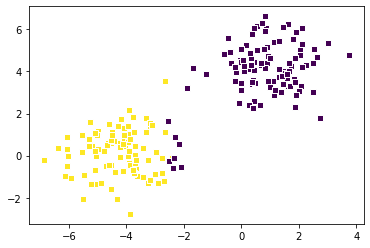

[3/4] loss is: 4.8160946130610873e-14


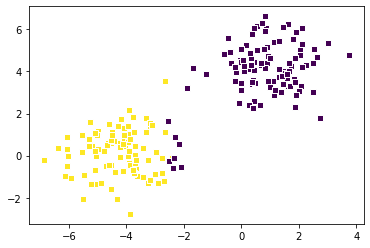

[3/4] loss is: 4.8160946130610873e-14


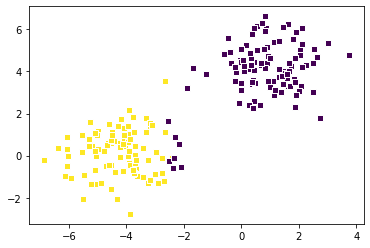

[3/4] loss is: 4.8160946130610873e-14


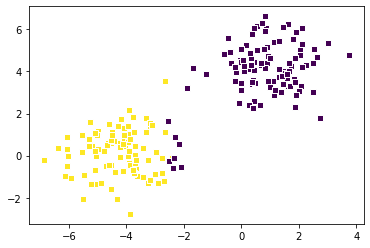

[3/4] loss is: 4.8160946130610873e-14


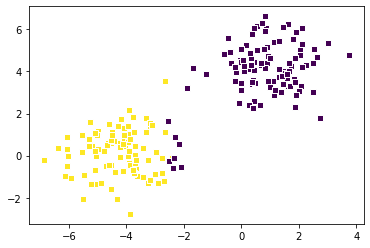

[3/4] loss is: 4.8160946130610873e-14


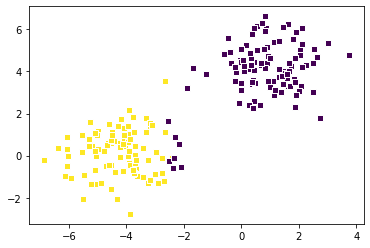

[3/4] loss is: 4.8160946130610873e-14


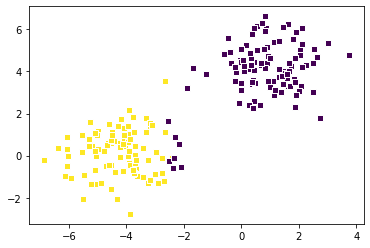

[3/4] loss is: 4.8160946130610873e-14


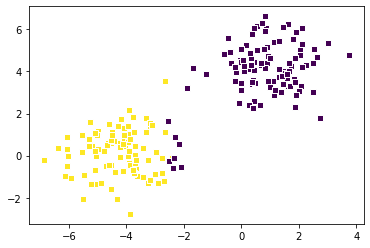

[3/4] loss is: 4.8160946130610873e-14


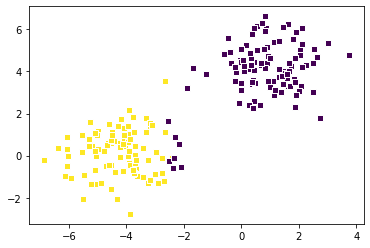

[3/4] loss is: 4.8160946130610873e-14


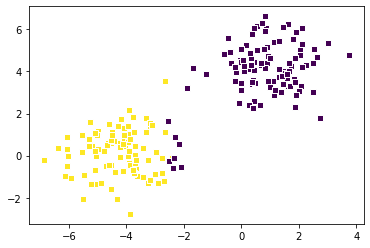

[3/4] loss is: 4.8160946130610873e-14


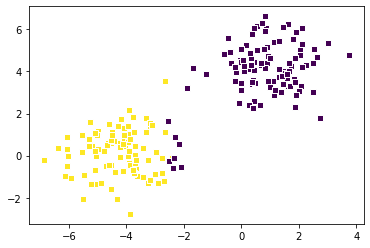

[3/4] loss is: 4.8160946130610873e-14


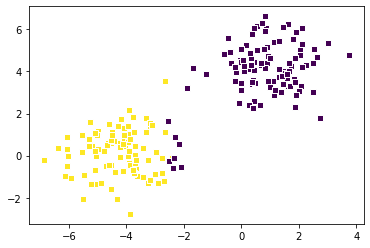

[3/4] loss is: 4.8160946130610873e-14


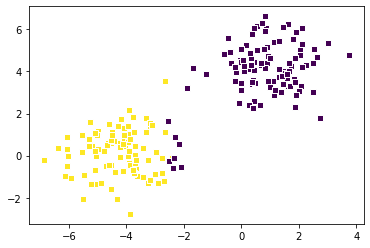

[3/4] loss is: 4.8160946130610873e-14


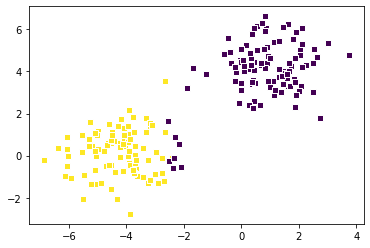

[3/4] loss is: 4.8160946130610873e-14


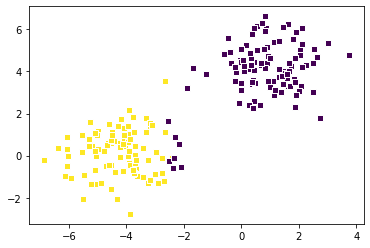

[3/4] loss is: 4.8160946130610873e-14


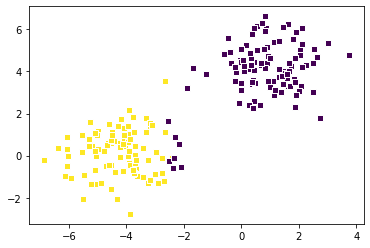

[3/4] loss is: 4.8160946130610873e-14


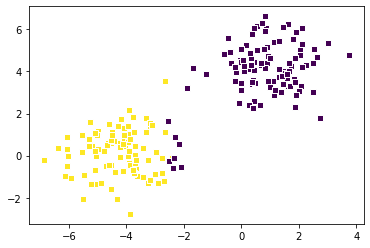

[3/4] loss is: 4.8160946130610873e-14


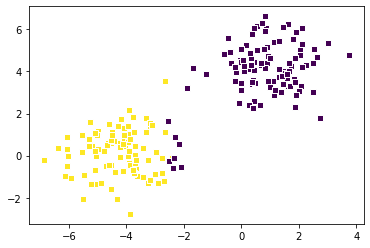

[3/4] loss is: 4.8160946130610873e-14


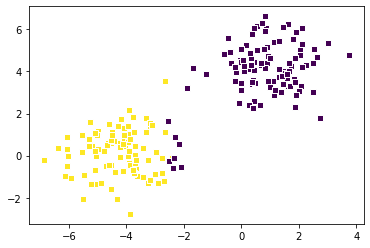

[3/4] loss is: 4.8160946130610873e-14


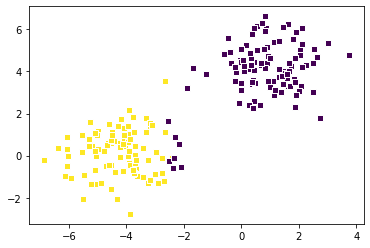

[3/4] loss is: 4.8160946130610873e-14


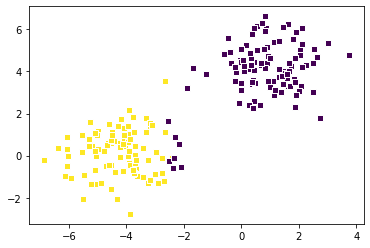

[3/4] loss is: 4.8160946130610873e-14


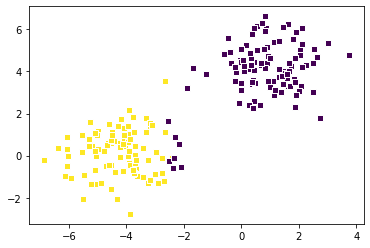

[3/4] loss is: 4.8160946130610873e-14


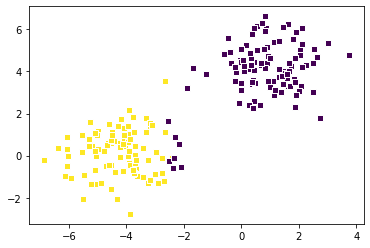

[3/4] loss is: 4.8160946130610873e-14


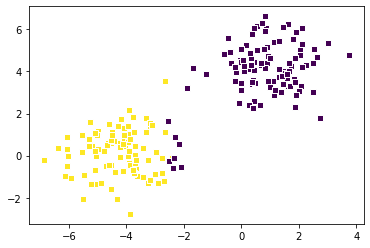

[3/4] loss is: 4.8160946130610873e-14


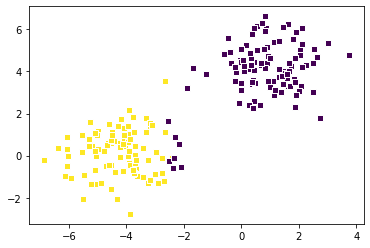

[3/4] loss is: 4.8160946130610873e-14


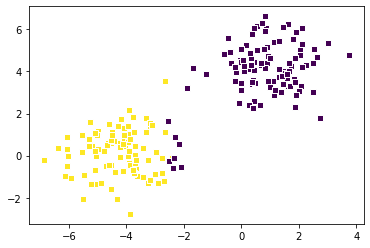

[3/4] loss is: 4.8160946130610873e-14


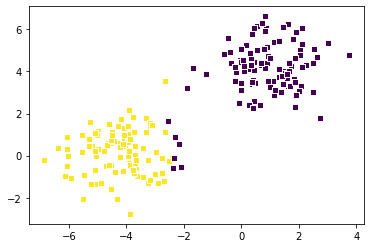

[3/4] loss is: 4.8160946130610873e-14


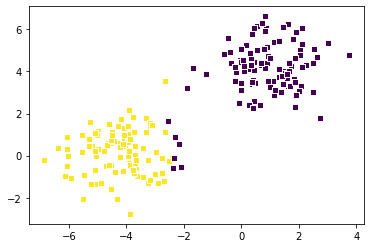

[3/4] loss is: 4.8160946130610873e-14


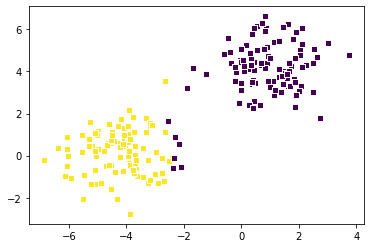

[3/4] loss is: 4.8160946130610873e-14


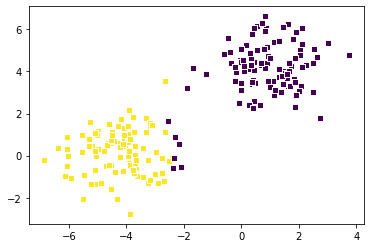

[3/4] loss is: 4.8160946130610873e-14


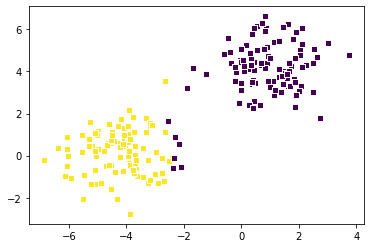

[3/4] loss is: 4.8160946130610873e-14


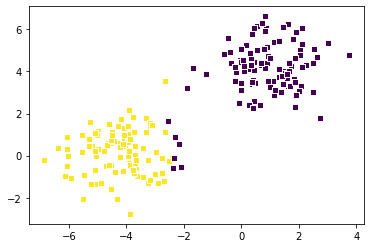

[3/4] loss is: 4.8160946130610873e-14


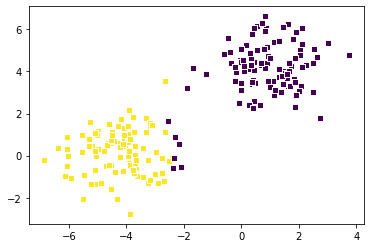

[3/4] loss is: 4.8160946130610873e-14


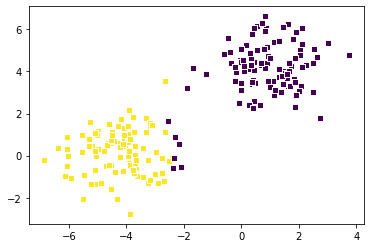

[3/4] loss is: 4.8160946130610873e-14


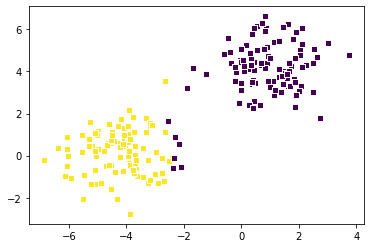

[3/4] loss is: 4.8160946130610873e-14


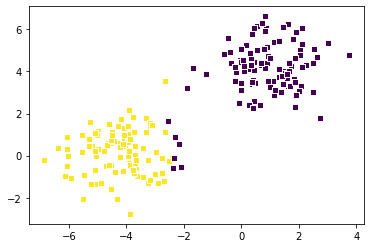

[3/4] loss is: 4.8160946130610873e-14


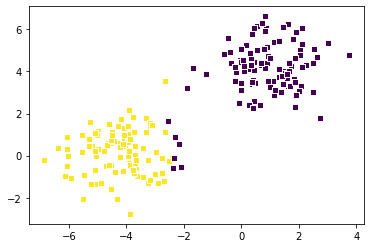

[3/4] loss is: 4.8160946130610873e-14


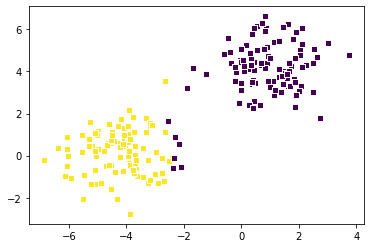

[3/4] loss is: 4.8160946130610873e-14


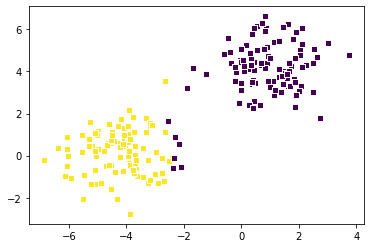

[3/4] loss is: 4.8160946130610873e-14


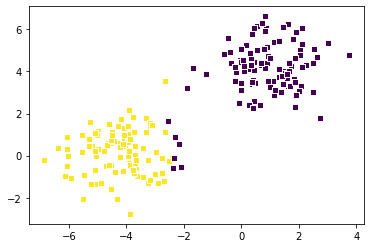

[3/4] loss is: 4.8160946130610873e-14


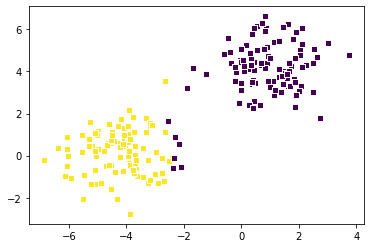

[3/4] loss is: 4.8160946130610873e-14


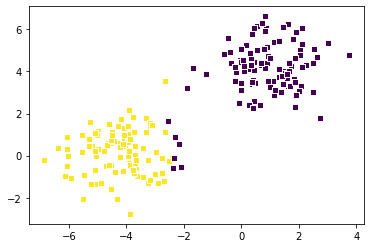

[3/4] loss is: 4.8160946130610873e-14


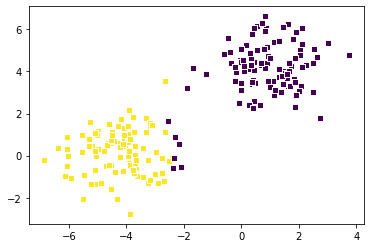

[3/4] loss is: 4.8160946130610873e-14


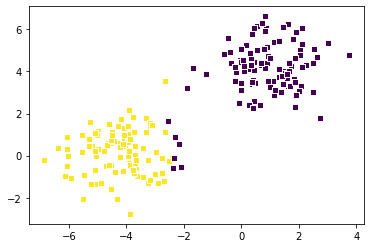

[3/4] loss is: 4.8160946130610873e-14


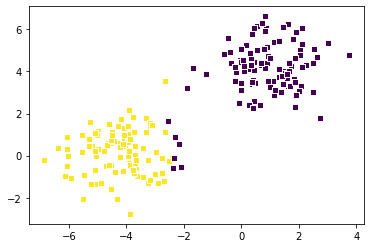

[3/4] loss is: 4.8160946130610873e-14


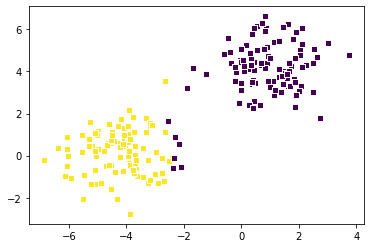

[3/4] loss is: 4.8160946130610873e-14


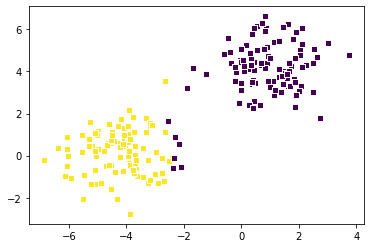

[3/4] loss is: 4.8160946130610873e-14


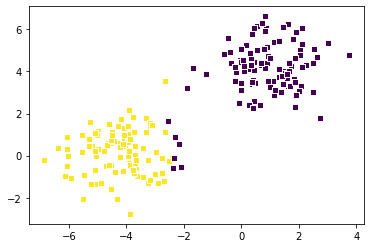

[3/4] loss is: 4.8160946130610873e-14


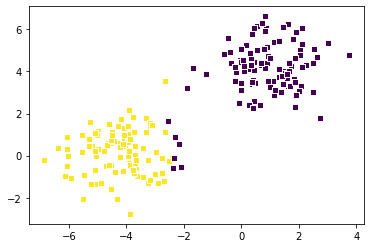

[3/4] loss is: 4.8160946130610873e-14


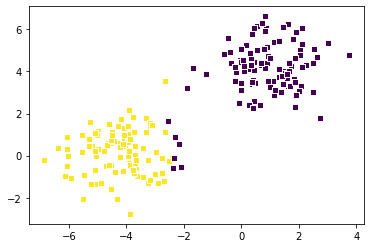

[3/4] loss is: 4.8160946130610873e-14


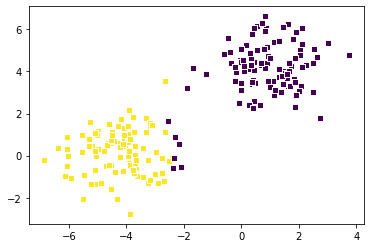

[3/4] loss is: 4.8160946130610873e-14


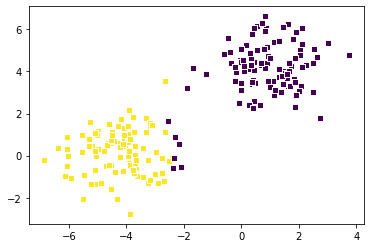

[3/4] loss is: 4.8160946130610873e-14


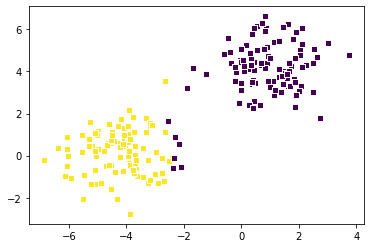

[3/4] loss is: 4.8160946130610873e-14


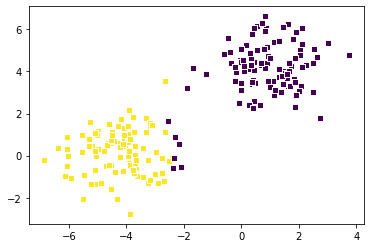

[3/4] loss is: 4.8160946130610873e-14


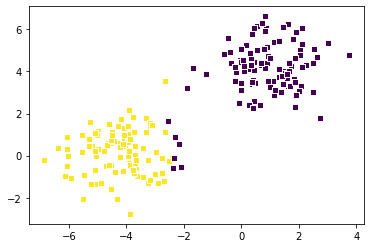

[3/4] loss is: 4.8160946130610873e-14


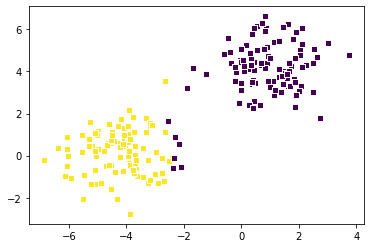

[3/4] loss is: 4.8160946130610873e-14


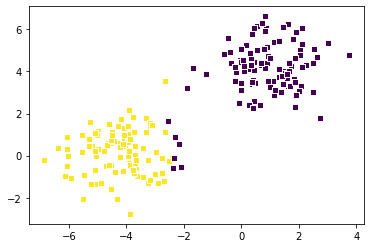

[3/4] loss is: 4.8160946130610873e-14


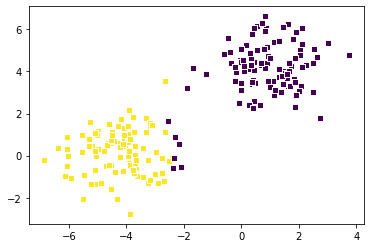

[3/4] loss is: 4.8160946130610873e-14


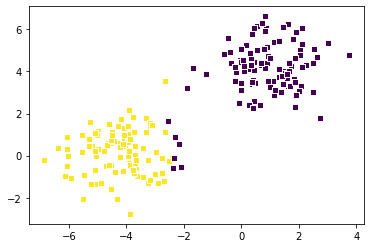

[3/4] loss is: 4.8160946130610873e-14


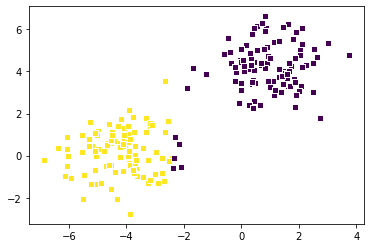

[3/4] loss is: 4.8160946130610873e-14


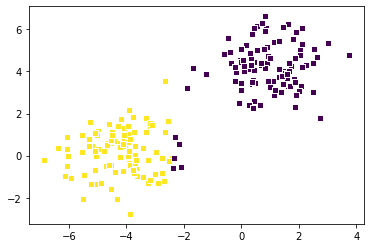

[3/4] loss is: 4.8160946130610873e-14


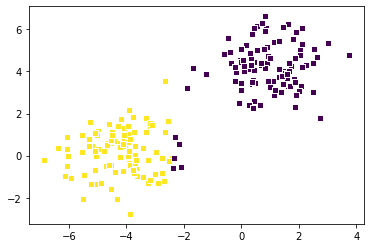

[3/4] loss is: 4.8160946130610873e-14


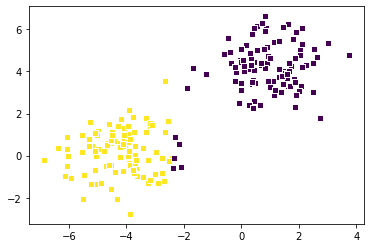

[3/4] loss is: 4.8160946130610873e-14


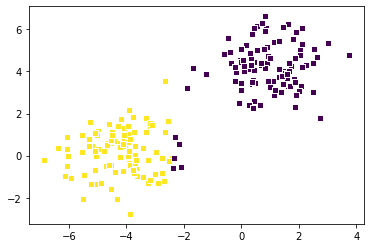

[3/4] loss is: 4.8160946130610873e-14


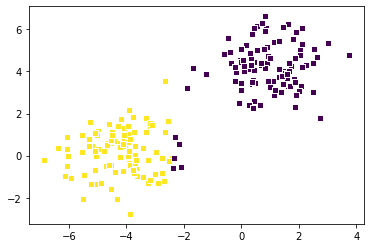

[3/4] loss is: 4.8160946130610873e-14


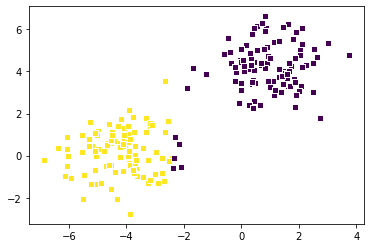

[3/4] loss is: 4.8160946130610873e-14


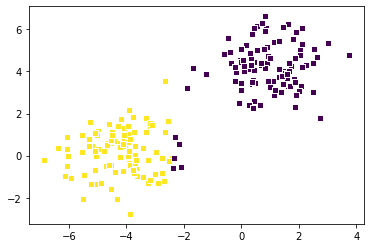

[3/4] loss is: 4.8160946130610873e-14


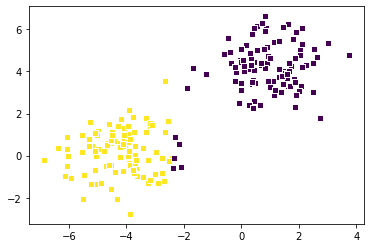

[3/4] loss is: 4.8160946130610873e-14


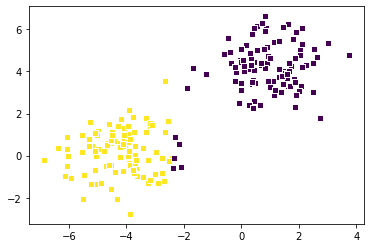

[3/4] loss is: 4.8160946130610873e-14


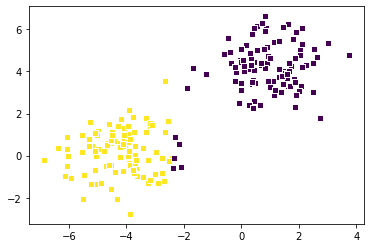

[3/4] loss is: 4.8160946130610873e-14


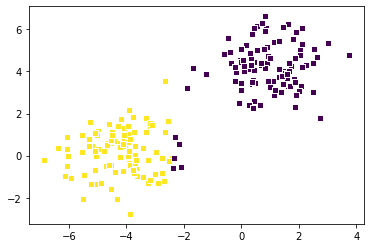

[3/4] loss is: 4.8160946130610873e-14


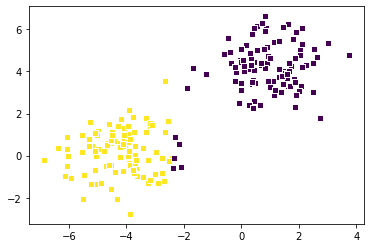

[3/4] loss is: 4.8160946130610873e-14


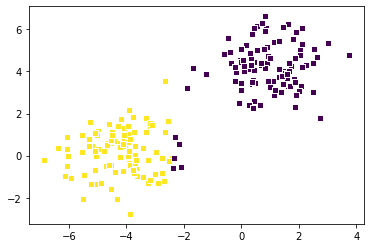

[3/4] loss is: 4.8160946130610873e-14


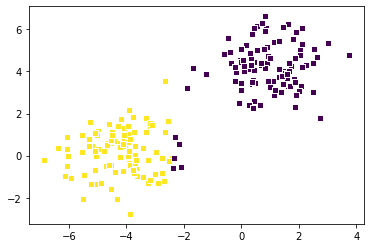

[3/4] loss is: 4.8160946130610873e-14


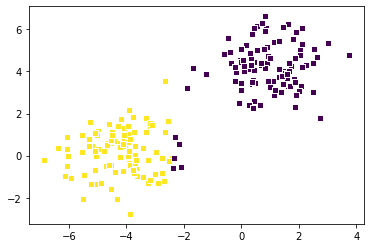

[3/4] loss is: 4.8160946130610873e-14


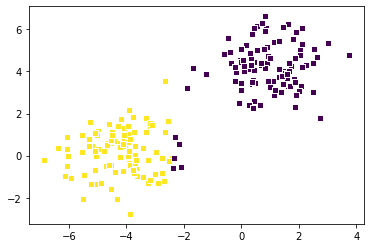

[3/4] loss is: 4.8160946130610873e-14


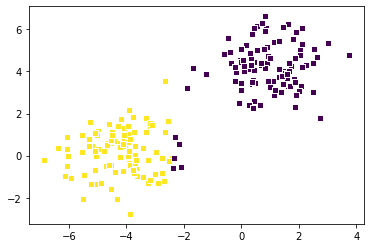

[3/4] loss is: 4.8160946130610873e-14


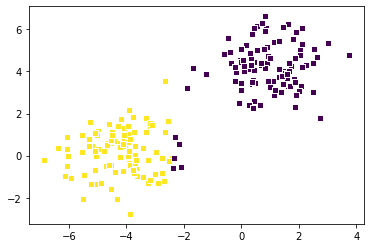

[3/4] loss is: 4.814297109116456e-14


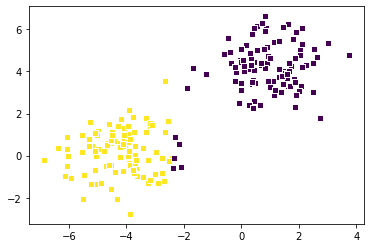

[3/4] loss is: 4.814297109116456e-14


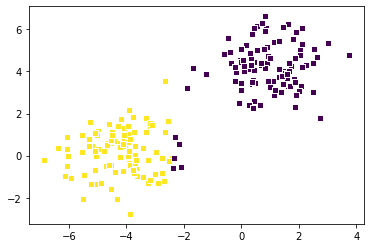

[3/4] loss is: 4.814297109116456e-14


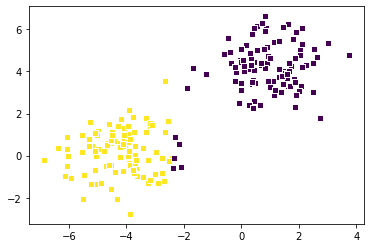

[3/4] loss is: 4.814297109116456e-14


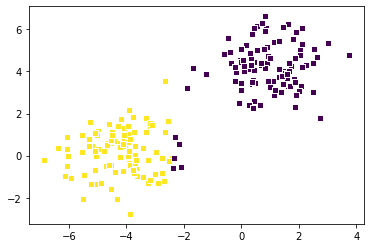

[3/4] loss is: 4.814297109116456e-14


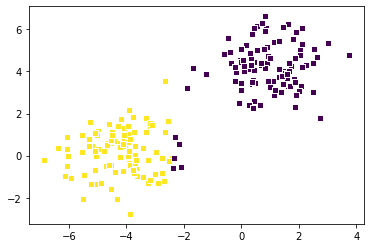

[3/4] loss is: 4.814297109116456e-14


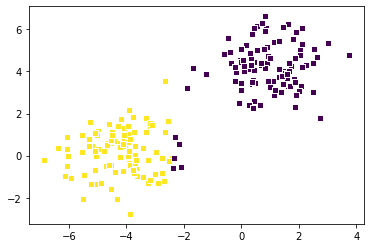

[3/4] loss is: 4.814297109116456e-14


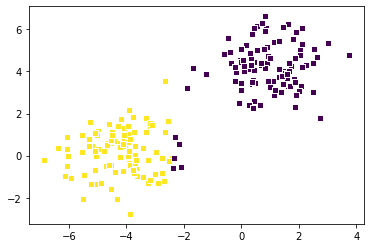

[3/4] loss is: 4.814297109116456e-14


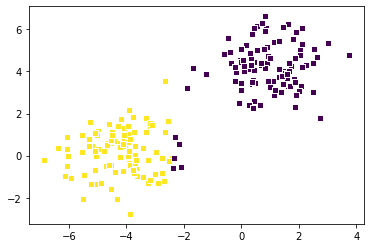

[3/4] loss is: 4.814297109116456e-14


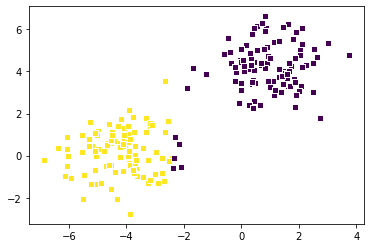

[3/4] loss is: 4.814297109116456e-14


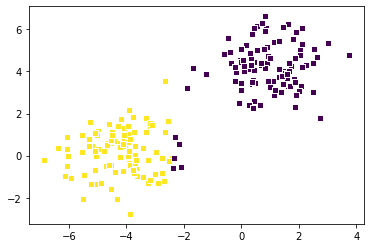

[3/4] loss is: 4.814297109116456e-14


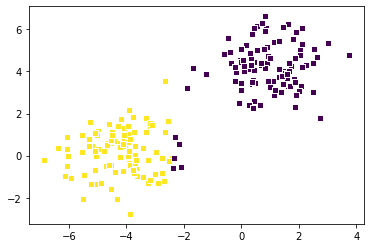

[3/4] loss is: 4.814297109116456e-14


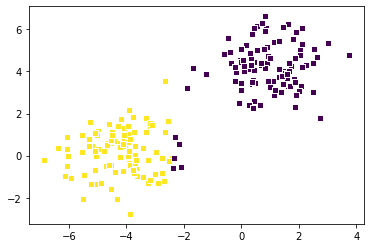

[3/4] loss is: 4.814297109116456e-14


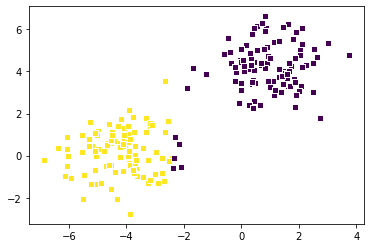

[3/4] loss is: 4.814297109116456e-14


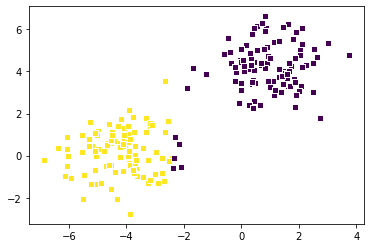

[3/4] loss is: 4.814297109116456e-14


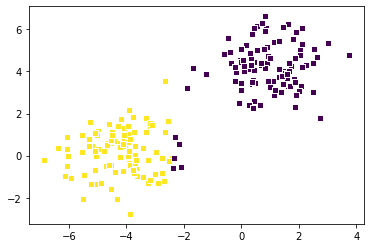

[3/4] loss is: 4.814297109116456e-14


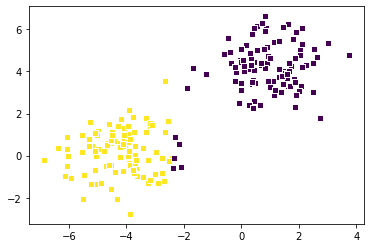

[3/4] loss is: 4.814297109116456e-14


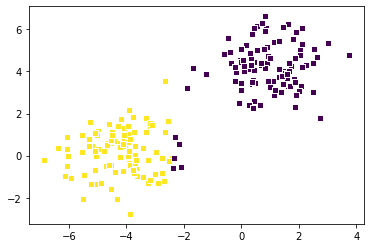

[3/4] loss is: 4.814297109116456e-14


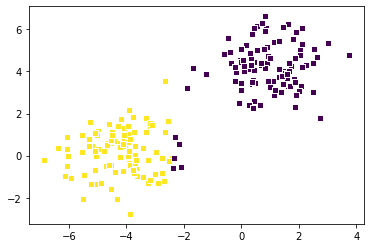

[3/4] loss is: 4.814297109116456e-14


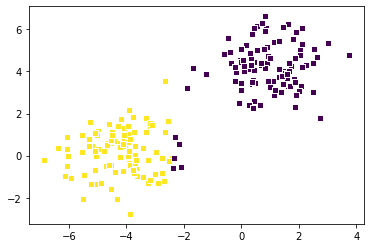

[3/4] loss is: 4.814297109116456e-14


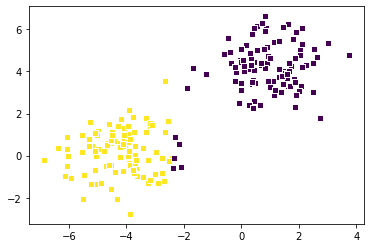

[3/4] loss is: 4.814297109116456e-14


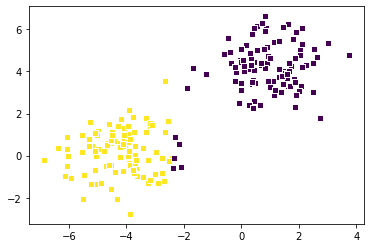

[3/4] loss is: 4.814297109116456e-14


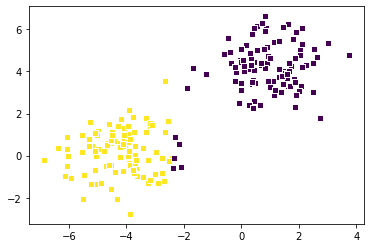

[3/4] loss is: 4.814297109116456e-14


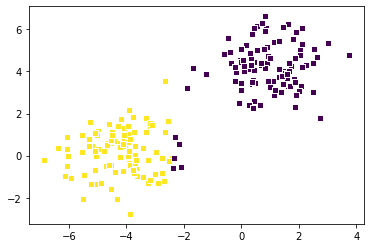

[3/4] loss is: 4.814297109116456e-14


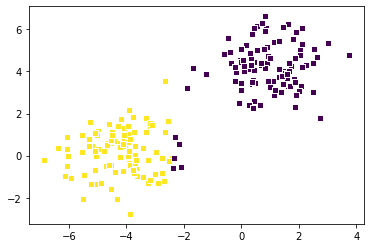

[3/4] loss is: 4.814297109116456e-14


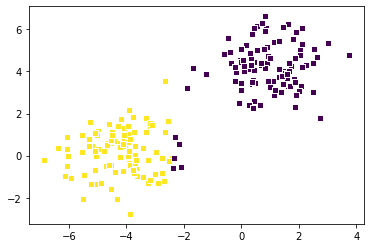

[3/4] loss is: 4.814297109116456e-14


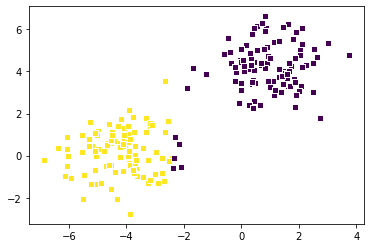

[3/4] loss is: 4.814297109116456e-14


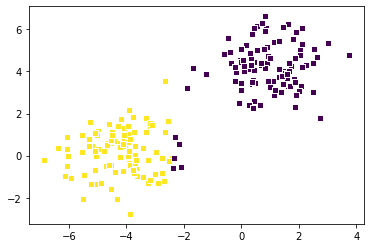

[3/4] loss is: 4.814297109116456e-14


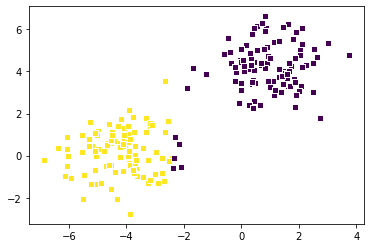

[3/4] loss is: 4.814297109116456e-14


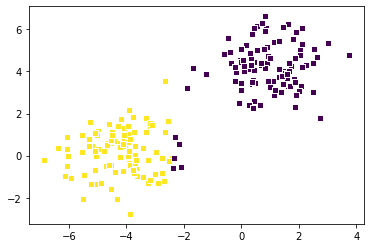

[3/4] loss is: 4.814297109116456e-14


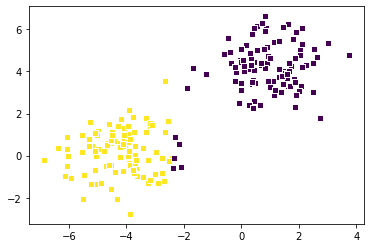

[3/4] loss is: 4.814297109116456e-14


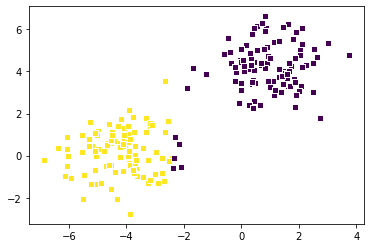

[3/4] loss is: 4.814297109116456e-14


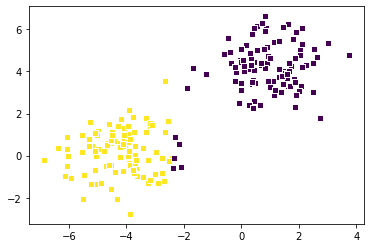

[3/4] loss is: 4.814297109116456e-14


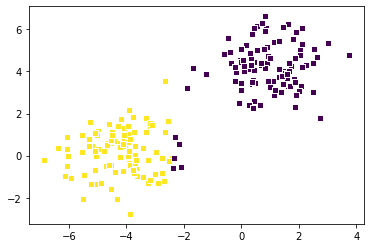

[3/4] loss is: 4.814297109116456e-14


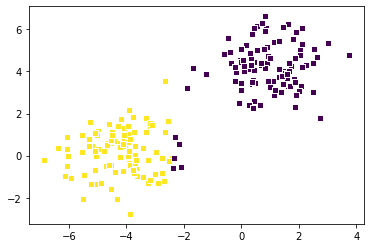

[3/4] loss is: 4.814297109116456e-14


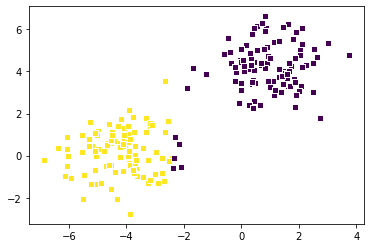

[3/4] loss is: 4.9559298464007864e-14


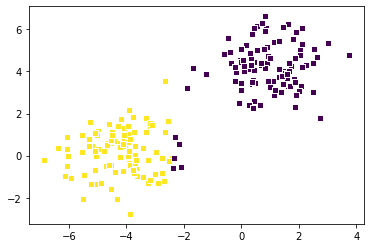

[3/4] loss is: 4.9559298464007864e-14


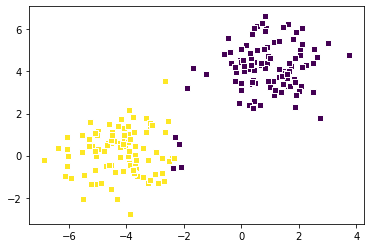

[3/4] loss is: 4.9559298464007864e-14


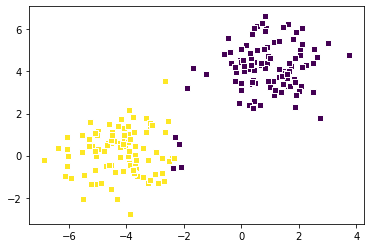

[3/4] loss is: 4.9559298464007864e-14


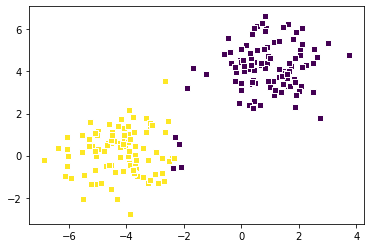

[3/4] loss is: 4.9559298464007864e-14


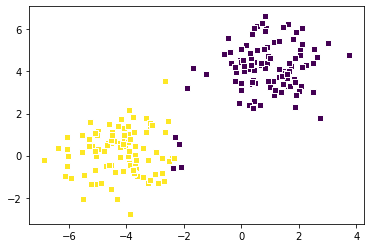

[3/4] loss is: 4.9559298464007864e-14


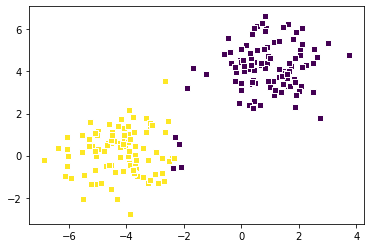

[3/4] loss is: 4.9559298464007864e-14


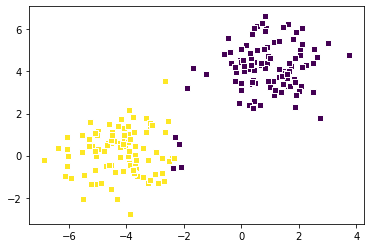

[3/4] loss is: 4.9559298464007864e-14


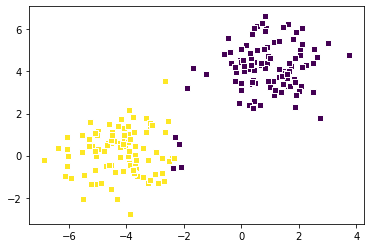

[3/4] loss is: 4.9559298464007864e-14


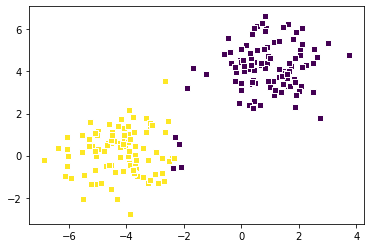

[3/4] loss is: 4.9559298464007864e-14


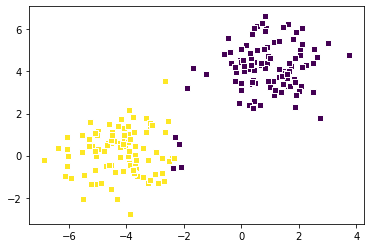

[3/4] loss is: 4.9559298464007864e-14


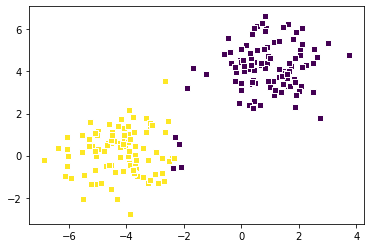

[3/4] loss is: 4.9559298464007864e-14


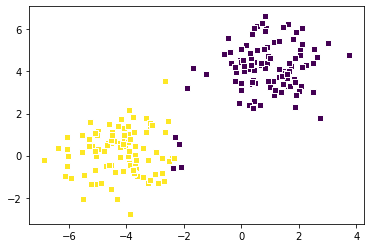

[3/4] loss is: 4.9559298464007864e-14


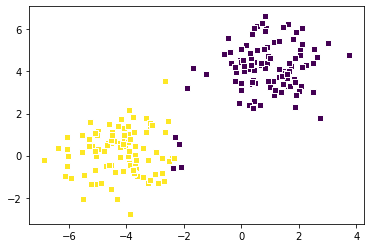

[3/4] loss is: 4.9559298464007864e-14


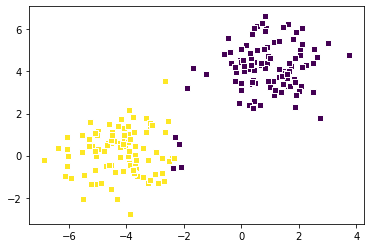

[3/4] loss is: 4.955189697717703e-14


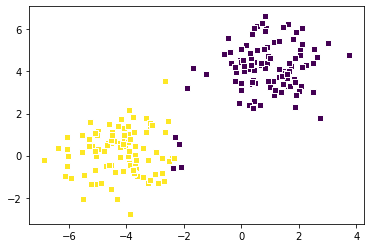

[3/4] loss is: 4.955189697717703e-14


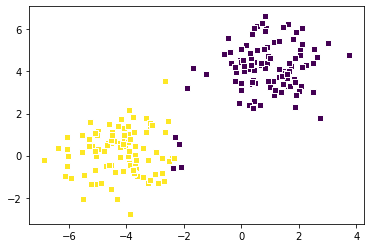

[3/4] loss is: 4.955189697717703e-14


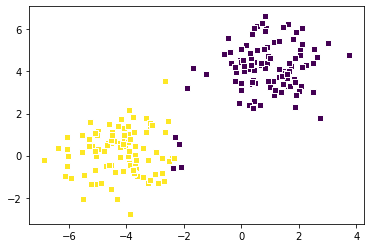

[3/4] loss is: 4.955189697717703e-14


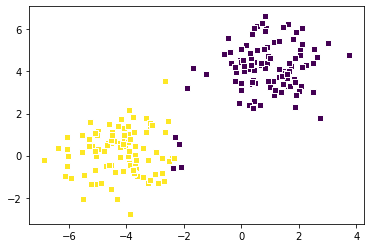

[3/4] loss is: 4.955189697717703e-14


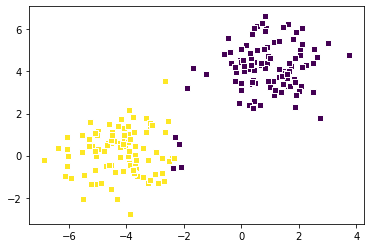

[3/4] loss is: 4.955189697717703e-14


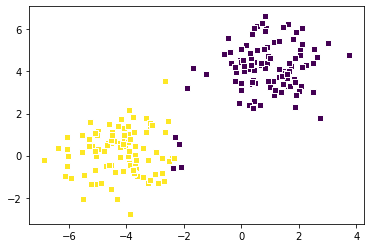

[3/4] loss is: 4.955189697717703e-14


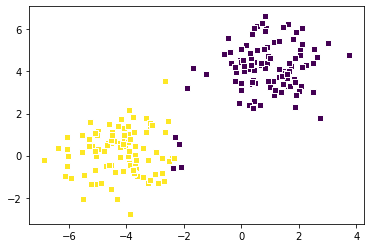

[3/4] loss is: 4.955189697717703e-14


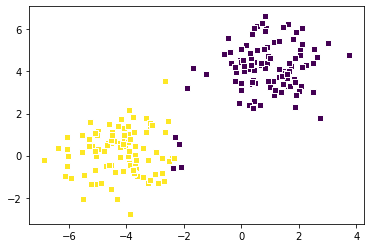

[3/4] loss is: 4.955189697717703e-14


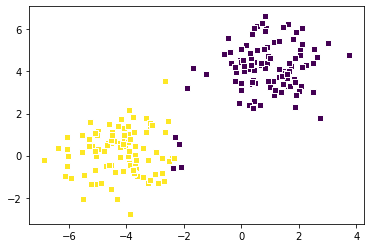

[3/4] loss is: 4.955189697717703e-14


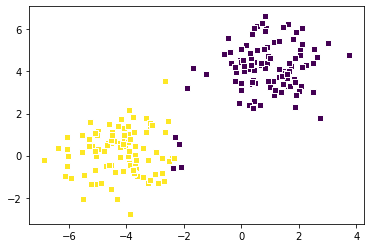

[3/4] loss is: 4.955189697717703e-14


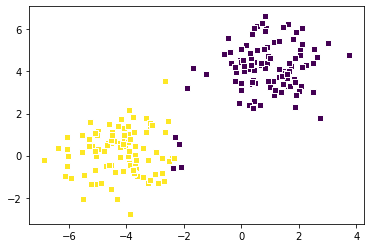

[3/4] loss is: 4.955189697717703e-14


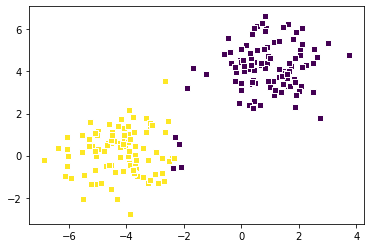

[3/4] loss is: 4.955189697717703e-14


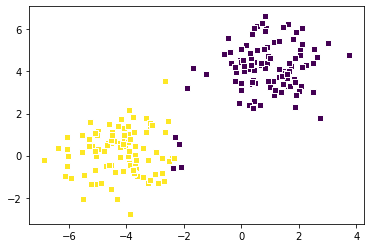

[3/4] loss is: 4.955189697717703e-14


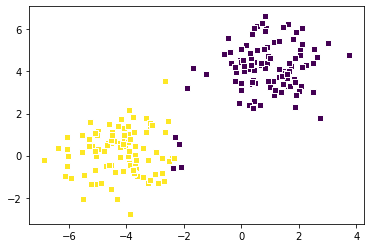

[3/4] loss is: 4.955189697717703e-14


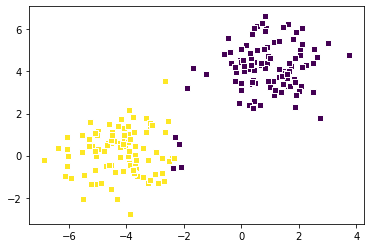

[3/4] loss is: 4.955189697717703e-14


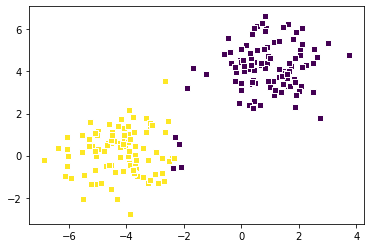

[3/4] loss is: 4.955189697717703e-14


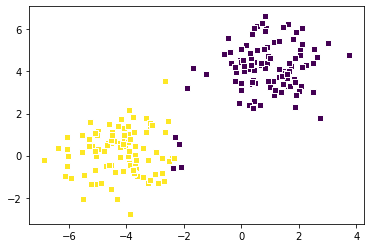

[3/4] loss is: 4.955189697717703e-14


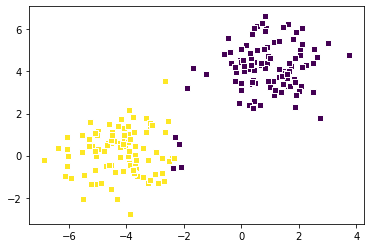

[3/4] loss is: 4.955189697717703e-14


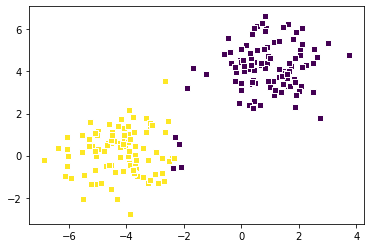

[3/4] loss is: 4.955189697717703e-14


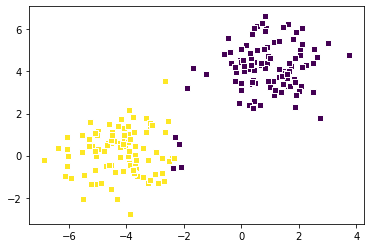

[3/4] loss is: 4.955189697717703e-14


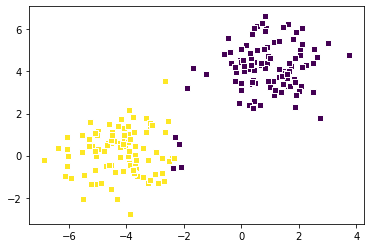

[3/4] loss is: 4.955189697717703e-14


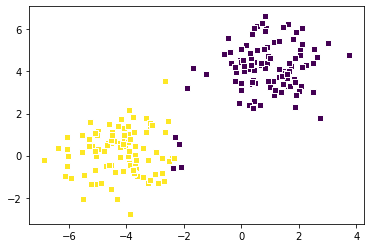

[3/4] loss is: 4.955189697717703e-14


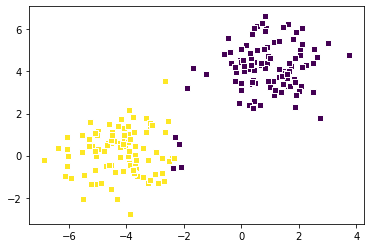

[3/4] loss is: 4.955189697717703e-14


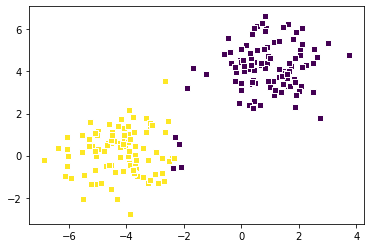

[3/4] loss is: 4.955189697717703e-14


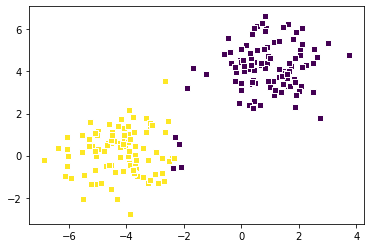

[3/4] loss is: 4.955189697717703e-14


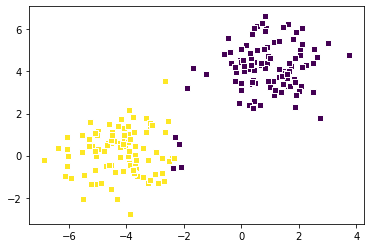

[4/4] loss is: 4.955189697717703e-14


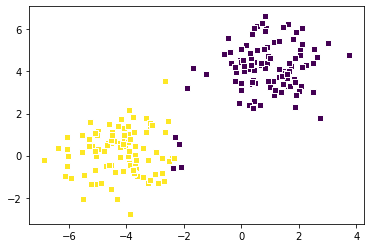

[4/4] loss is: 4.955189697717703e-14


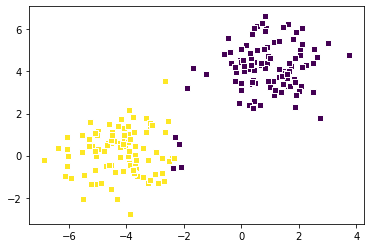

[4/4] loss is: 4.955189697717703e-14


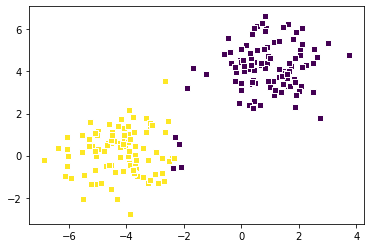

[4/4] loss is: 4.955189697717703e-14


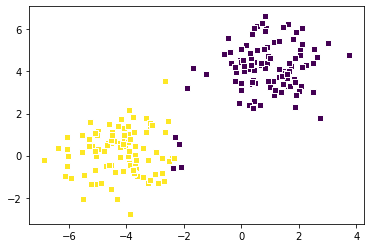

[4/4] loss is: 4.955189697717703e-14


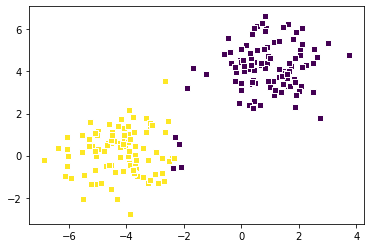

[4/4] loss is: 4.955189697717703e-14


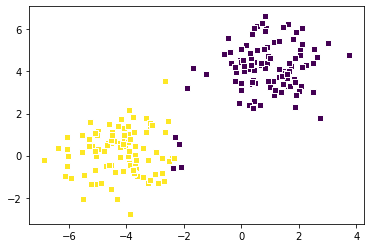

[4/4] loss is: 4.955189697717703e-14


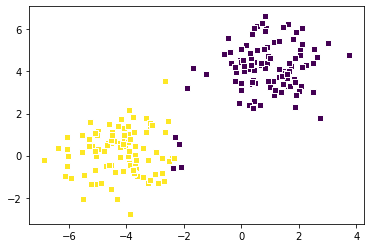

[4/4] loss is: 4.955189697717703e-14


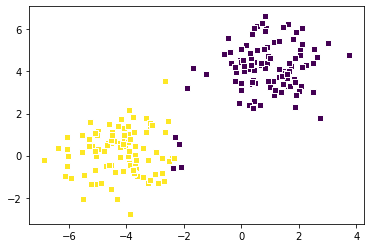

[4/4] loss is: 4.955189697717703e-14


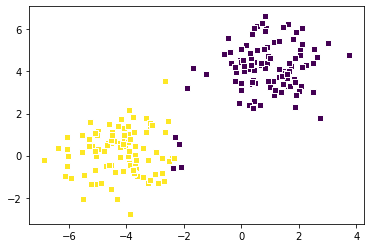

[4/4] loss is: 4.955189697717703e-14


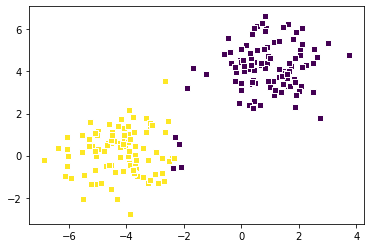

[4/4] loss is: 4.955189697717703e-14


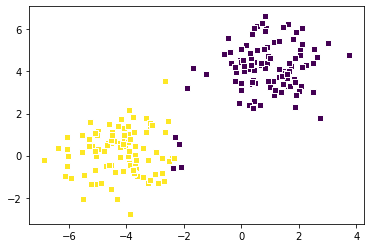

[4/4] loss is: 4.955189697717703e-14


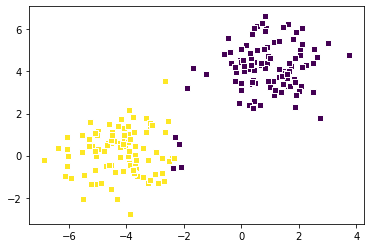

[4/4] loss is: 4.955189697717703e-14


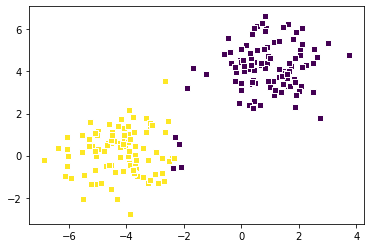

[4/4] loss is: 4.955189697717703e-14


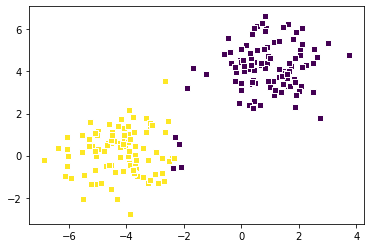

[4/4] loss is: 4.955189697717703e-14


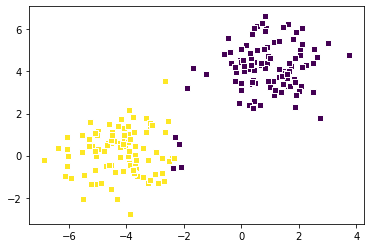

[4/4] loss is: 4.955189697717703e-14


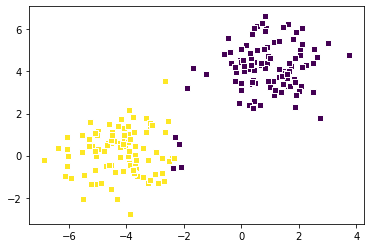

[4/4] loss is: 4.955189697717703e-14


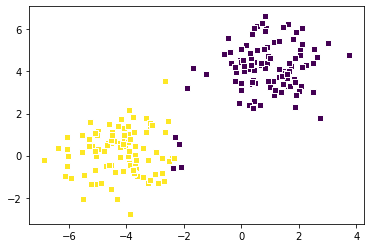

[4/4] loss is: 4.954766755613084e-14


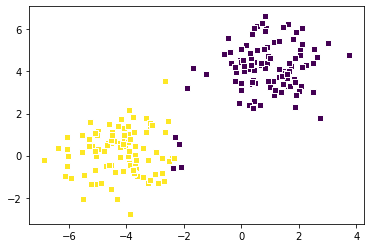

[4/4] loss is: 4.954766755613084e-14


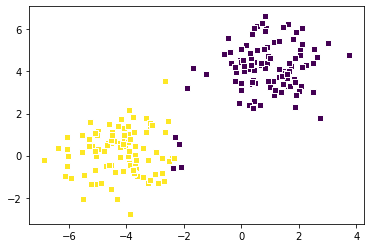

[4/4] loss is: 4.954766755613084e-14


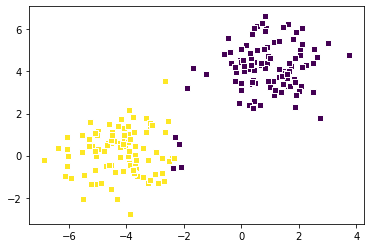

[4/4] loss is: 4.954766755613084e-14


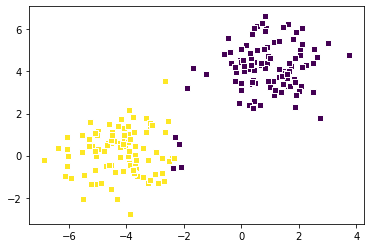

[4/4] loss is: 4.954766755613084e-14


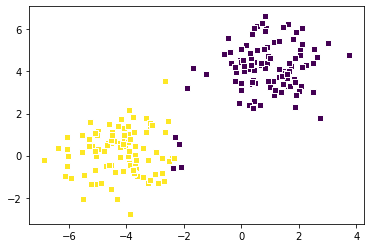

[4/4] loss is: 4.954766755613084e-14


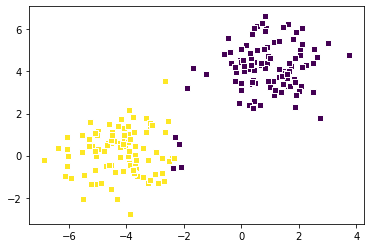

[4/4] loss is: 4.954766755613084e-14


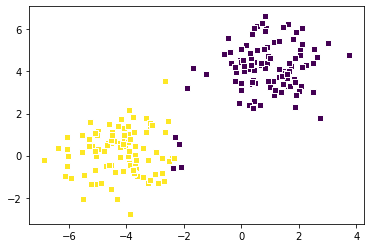

[4/4] loss is: 4.954766755613084e-14


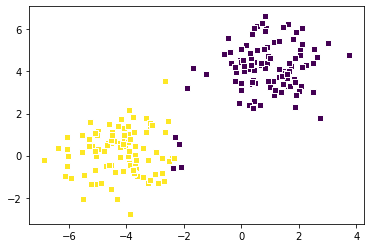

[4/4] loss is: 4.954766755613084e-14


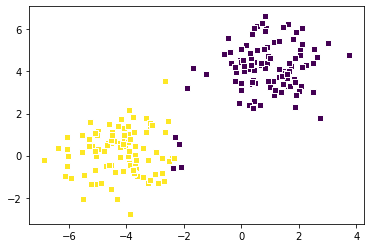

[4/4] loss is: 4.954766755613084e-14


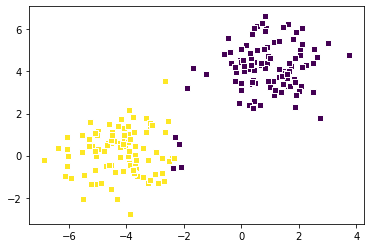

[4/4] loss is: 4.954766755613084e-14


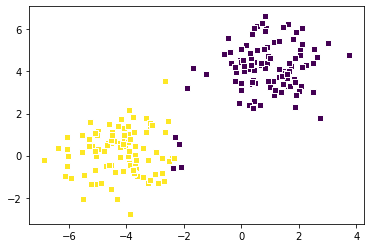

[4/4] loss is: 4.954766755613084e-14


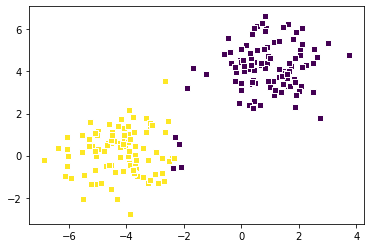

[4/4] loss is: 4.954766755613084e-14


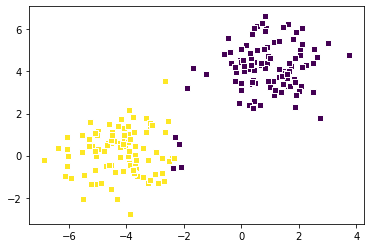

[4/4] loss is: 4.954766755613084e-14


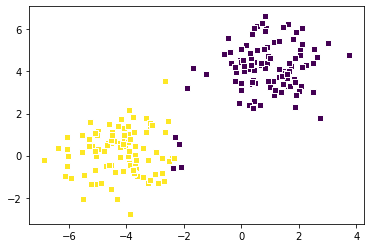

[4/4] loss is: 4.954766755613084e-14


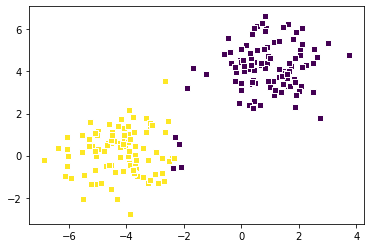

[4/4] loss is: 4.954766755613084e-14


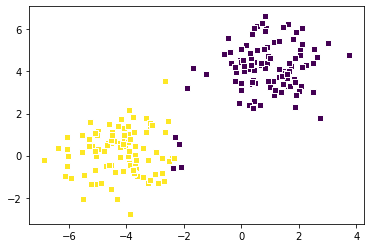

[4/4] loss is: 4.954766755613084e-14


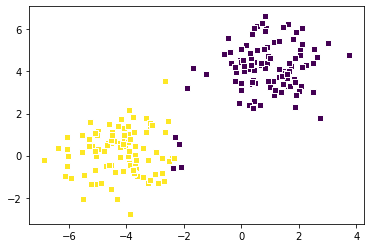

[4/4] loss is: 4.954766755613084e-14


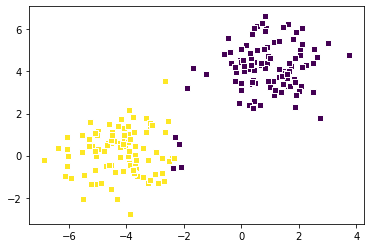

[4/4] loss is: 4.954766755613084e-14


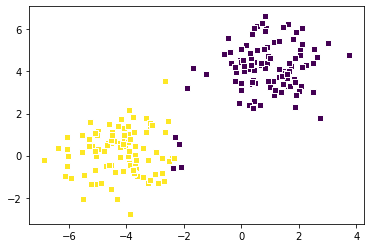

[4/4] loss is: 4.954766755613084e-14


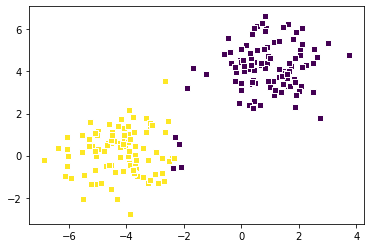

[4/4] loss is: 4.954766755613084e-14


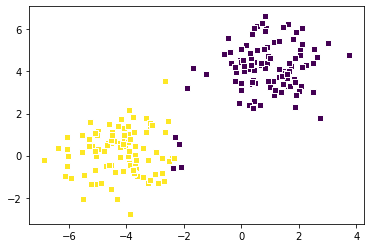

[4/4] loss is: 4.954766755613084e-14


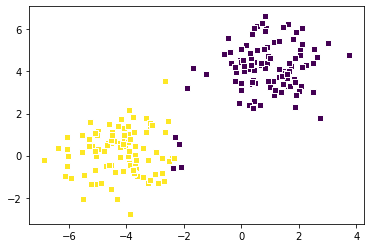

[4/4] loss is: 4.954766755613084e-14


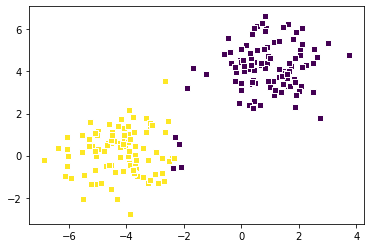

[4/4] loss is: 4.954766755613084e-14


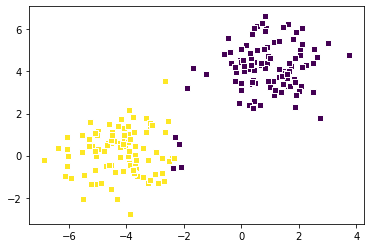

[4/4] loss is: 4.954766755613084e-14


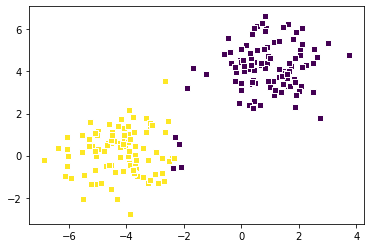

[4/4] loss is: 4.954766755613084e-14


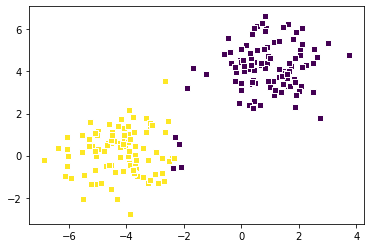

[4/4] loss is: 4.954766755613084e-14


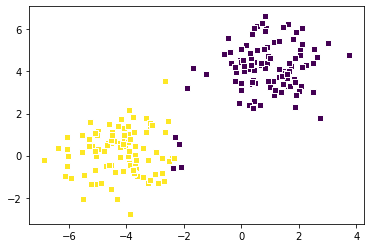

[4/4] loss is: 4.954766755613084e-14


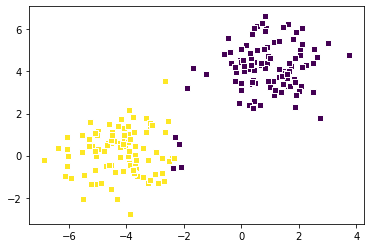

[4/4] loss is: 4.954766755613084e-14


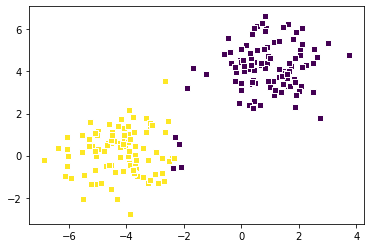

[4/4] loss is: 4.954766755613084e-14


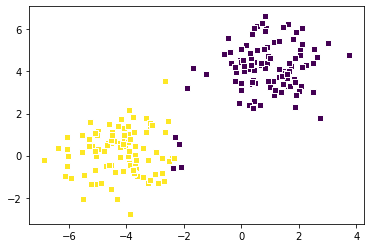

[4/4] loss is: 4.954766755613084e-14


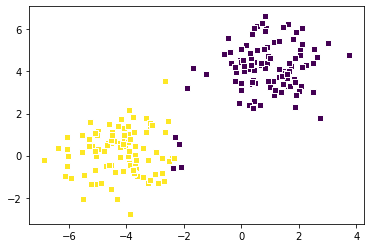

[4/4] loss is: 4.954766755613084e-14


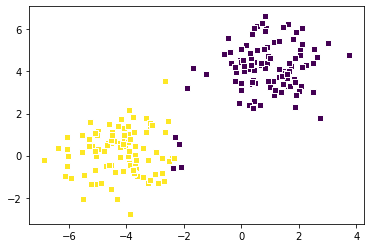

[4/4] loss is: 4.954766755613084e-14


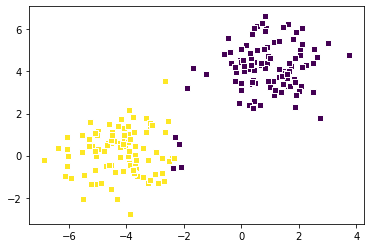

[4/4] loss is: 4.954766755613084e-14


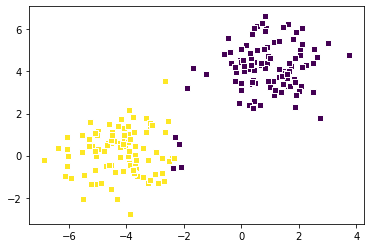

[4/4] loss is: 4.954766755613084e-14


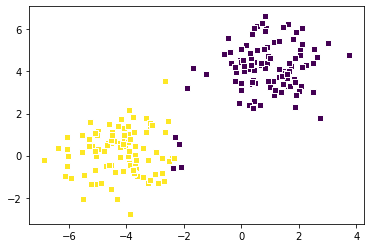

[4/4] loss is: 4.954766755613084e-14


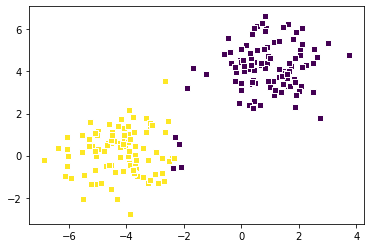

[4/4] loss is: 4.954766755613084e-14


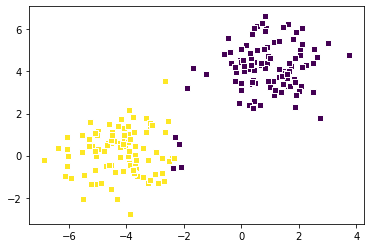

[4/4] loss is: 4.954766755613084e-14


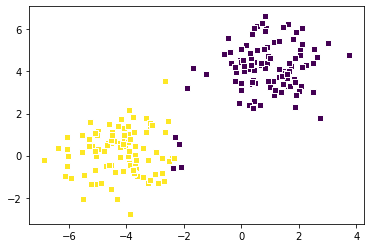

[4/4] loss is: 4.954766755613084e-14


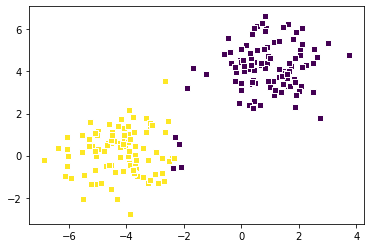

[4/4] loss is: 4.954766755613084e-14


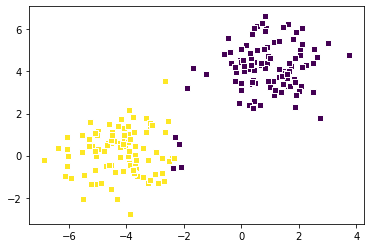

[4/4] loss is: 4.954766755613084e-14


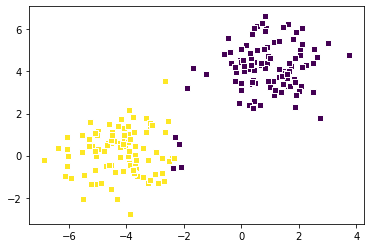

[4/4] loss is: 4.954766755613084e-14


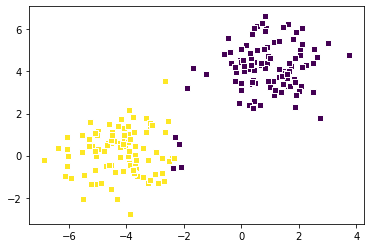

[4/4] loss is: 4.954766755613084e-14


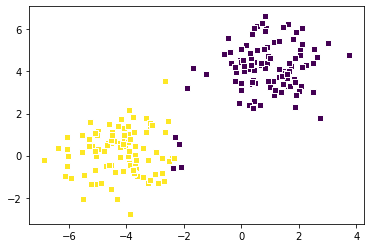

[4/4] loss is: 4.954766755613084e-14


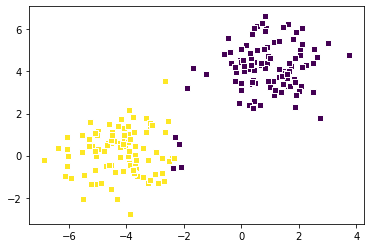

[4/4] loss is: 4.954766755613084e-14


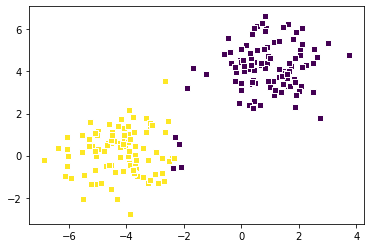

[4/4] loss is: 4.954766755613084e-14


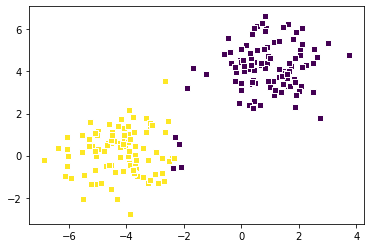

[4/4] loss is: 4.954766755613084e-14


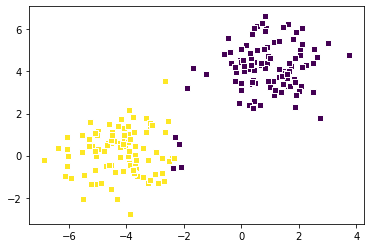

[4/4] loss is: 4.954766755613084e-14


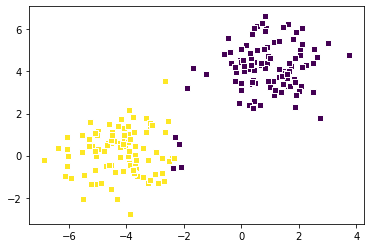

[4/4] loss is: 4.954766755613084e-14


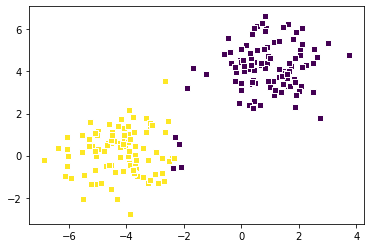

[4/4] loss is: 4.954766755613084e-14


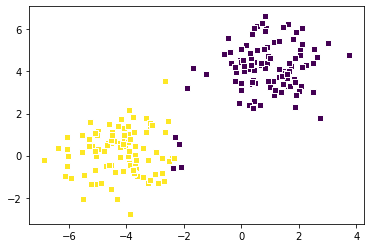

[4/4] loss is: 4.954766755613084e-14


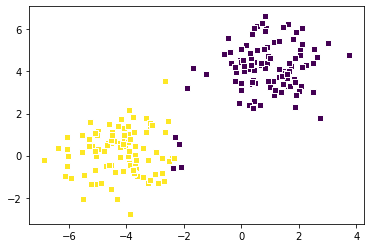

[4/4] loss is: 4.954766755613084e-14


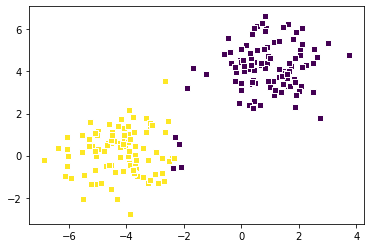

[4/4] loss is: 4.954766755613084e-14


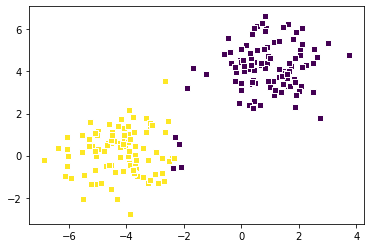

[4/4] loss is: 4.954766755613084e-14


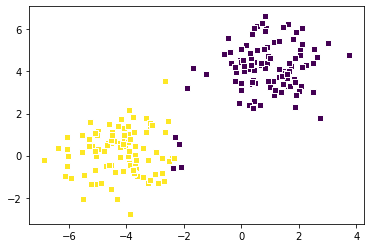

[4/4] loss is: 4.954766755613084e-14


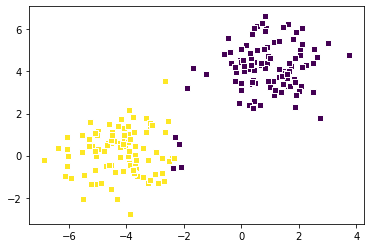

[4/4] loss is: 4.954766755613084e-14


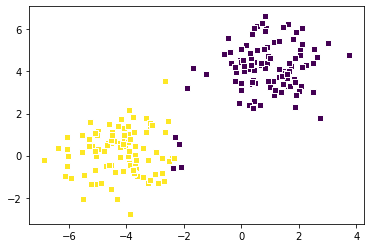

[4/4] loss is: 4.954766755613084e-14


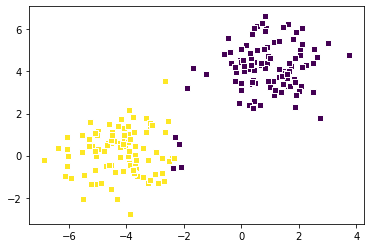

[4/4] loss is: 4.954766755613084e-14


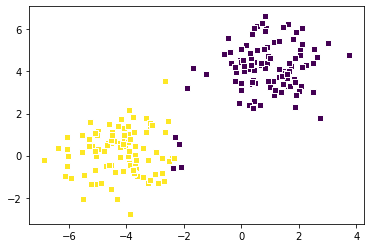

[4/4] loss is: 4.954766755613084e-14


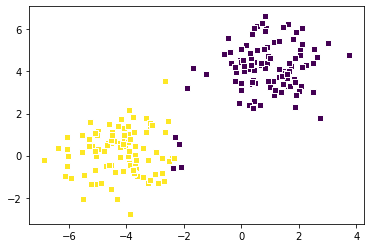

[4/4] loss is: 4.954766755613084e-14


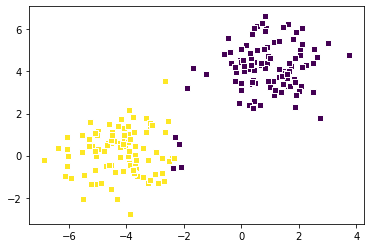

[4/4] loss is: 4.954766755613084e-14


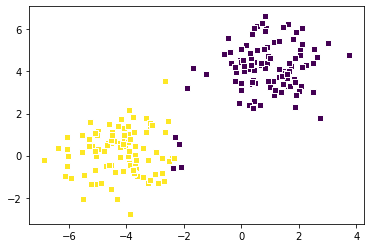

[4/4] loss is: 4.954766755613084e-14


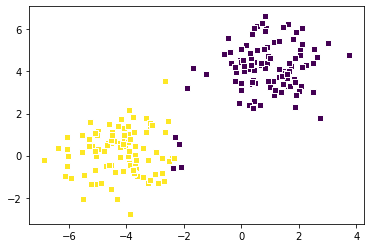

[4/4] loss is: 4.954766755613084e-14


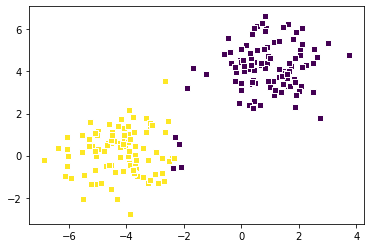

[4/4] loss is: 4.954766755613084e-14


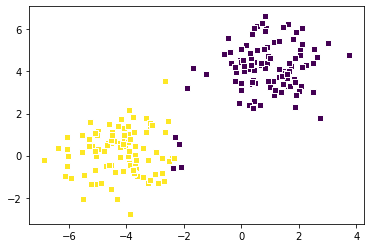

[4/4] loss is: 4.954766755613084e-14


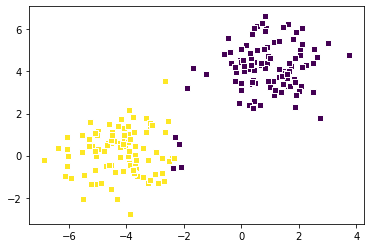

[4/4] loss is: 4.954766755613084e-14


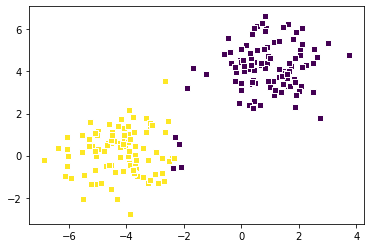

[4/4] loss is: 4.954766755613084e-14


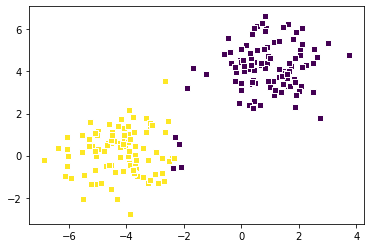

[4/4] loss is: 4.954766755613084e-14


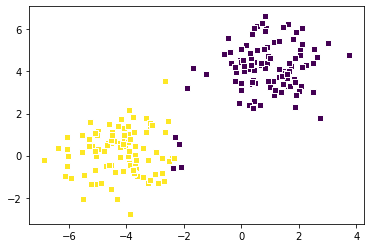

[4/4] loss is: 4.954766755613084e-14


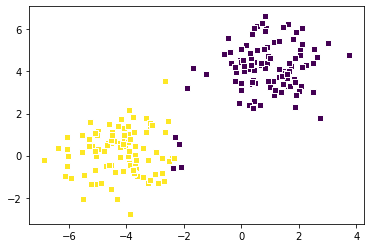

[4/4] loss is: 4.954766755613084e-14


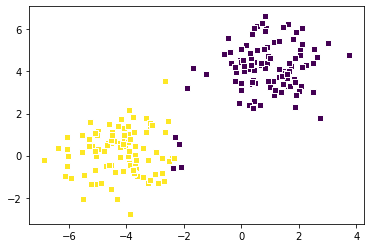

[4/4] loss is: 4.954766755613084e-14


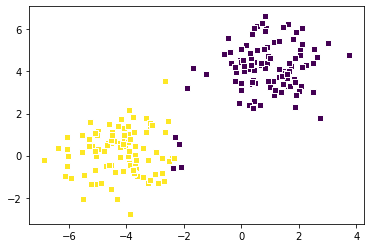

[4/4] loss is: 4.954766755613084e-14


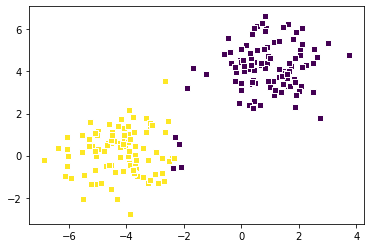

[4/4] loss is: 4.954766755613084e-14


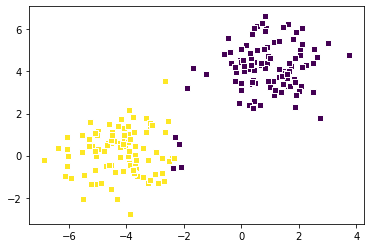

[4/4] loss is: 4.954766755613084e-14


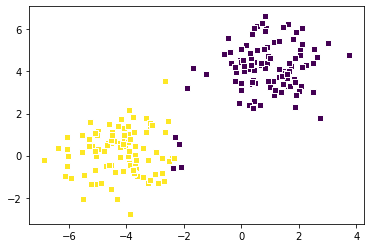

[4/4] loss is: 4.954766755613084e-14


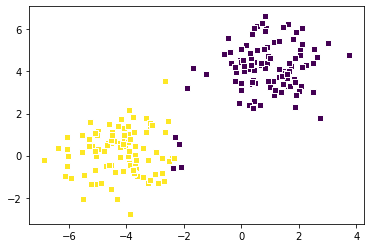

[4/4] loss is: 4.954766755613084e-14


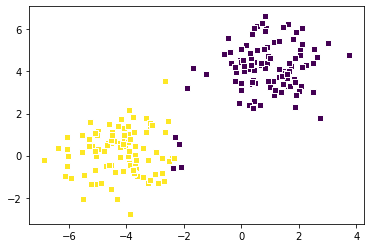

[4/4] loss is: 4.954766755613084e-14


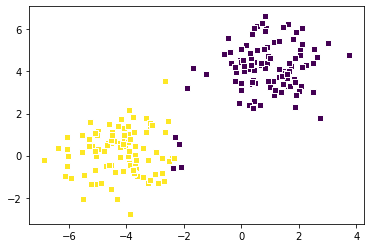

[4/4] loss is: 4.954766755613084e-14


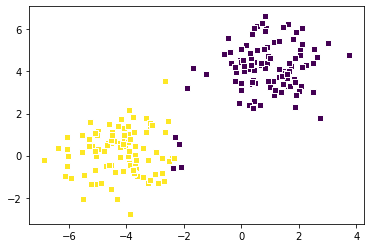

[4/4] loss is: 4.954766755613084e-14


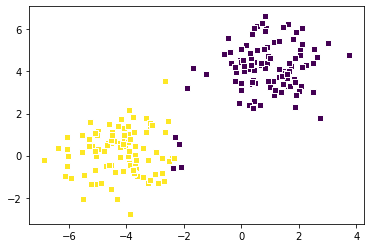

[4/4] loss is: 4.954766755613084e-14


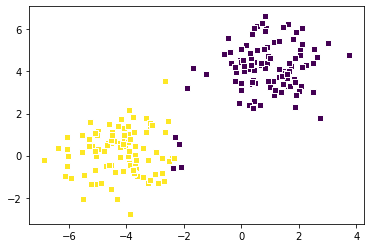

[4/4] loss is: 4.954766755613084e-14


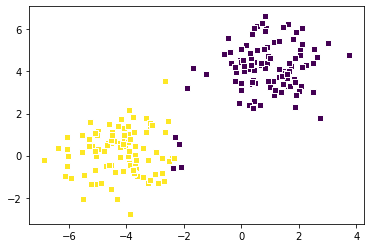

[4/4] loss is: 4.954766755613084e-14


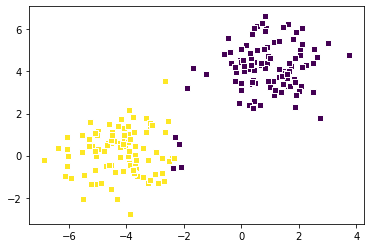

[4/4] loss is: 4.954766755613084e-14


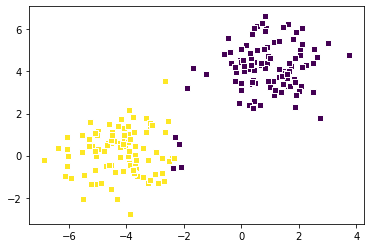

[4/4] loss is: 4.954766755613084e-14


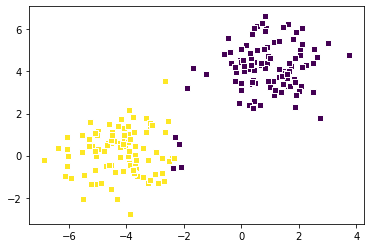

[4/4] loss is: 4.954766755613084e-14


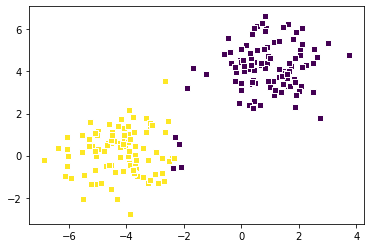

[4/4] loss is: 4.954766755613084e-14


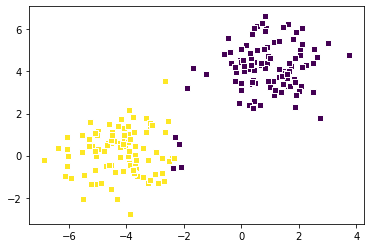

[4/4] loss is: 4.954766755613084e-14


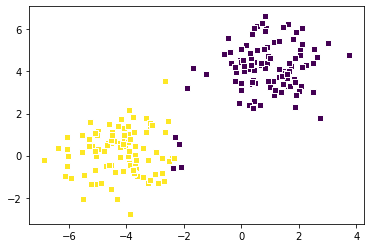

[4/4] loss is: 4.954766755613084e-14


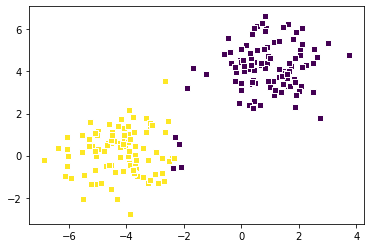

[4/4] loss is: 4.954766755613084e-14


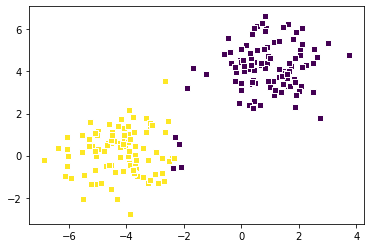

[4/4] loss is: 4.954766755613084e-14


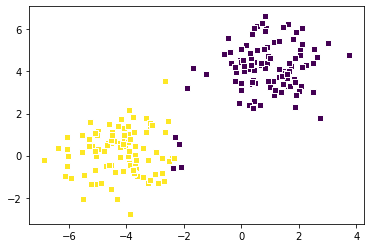

[4/4] loss is: 4.954766755613084e-14


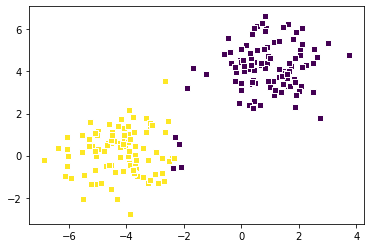

[4/4] loss is: 4.954766755613084e-14


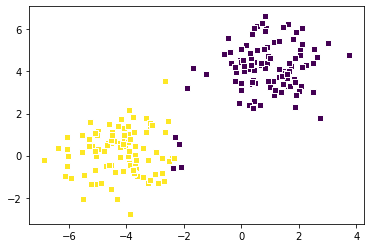

[4/4] loss is: 4.954766755613084e-14


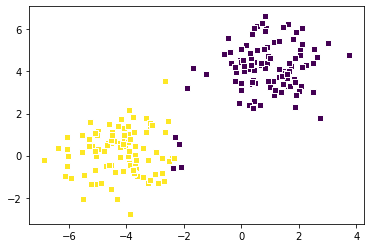

[4/4] loss is: 4.954766755613084e-14


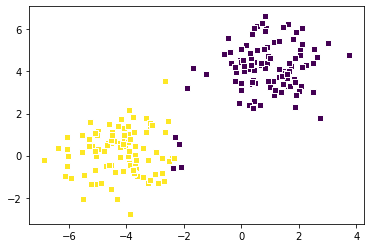

[4/4] loss is: 4.954766755613084e-14


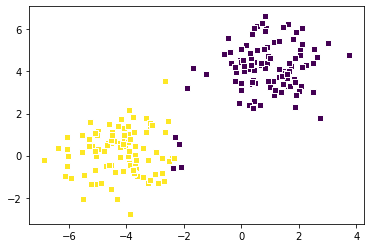

[4/4] loss is: 4.954766755613084e-14


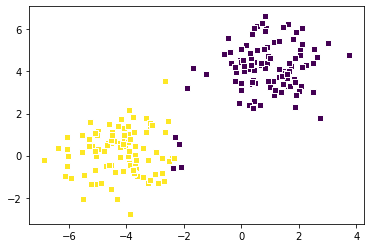

[4/4] loss is: 4.954766755613084e-14


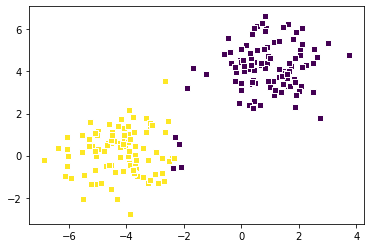

[4/4] loss is: 4.954766755613084e-14


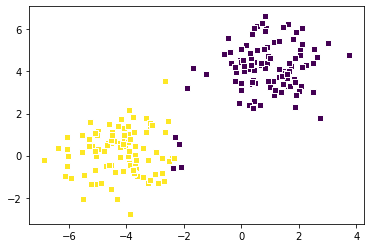

[4/4] loss is: 4.954766755613084e-14


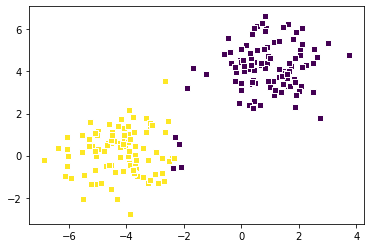

[4/4] loss is: 4.954766755613084e-14


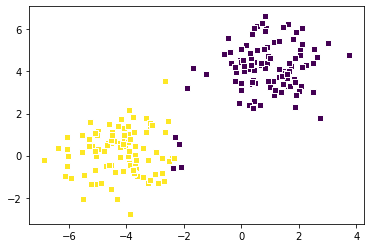

[4/4] loss is: 4.954766755613084e-14


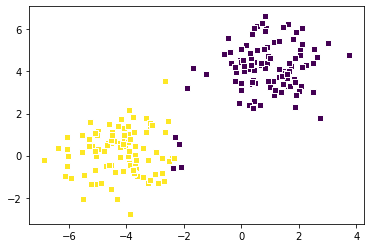

[4/4] loss is: 4.954766755613084e-14


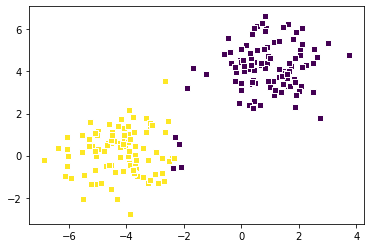

[4/4] loss is: 4.954766755613084e-14


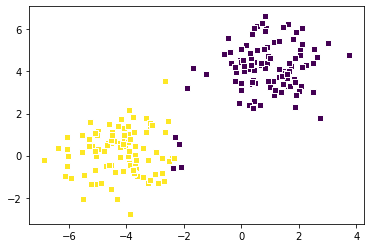

[4/4] loss is: 4.954766755613084e-14


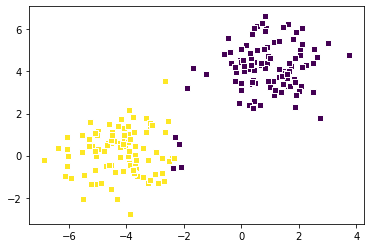

[4/4] loss is: 4.954766755613084e-14


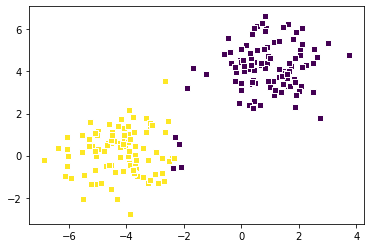

[4/4] loss is: 4.954766755613084e-14


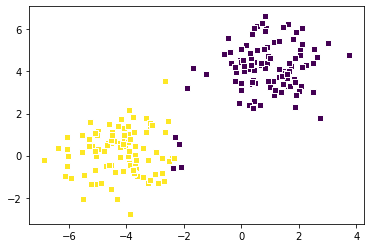

[4/4] loss is: 4.954766755613084e-14


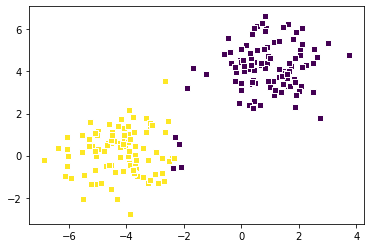

[4/4] loss is: 4.954766755613084e-14


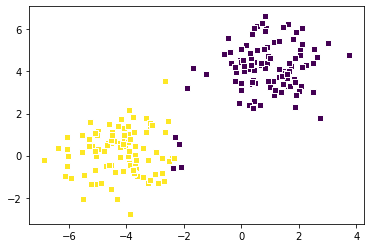

[4/4] loss is: 4.954766755613084e-14


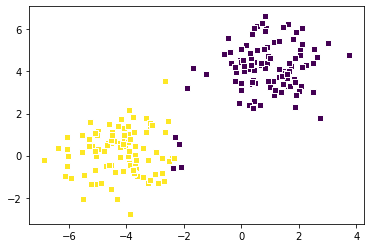

[4/4] loss is: 4.954766755613084e-14


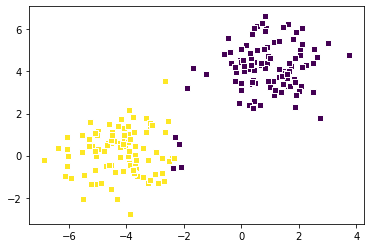

[4/4] loss is: 4.954766755613084e-14


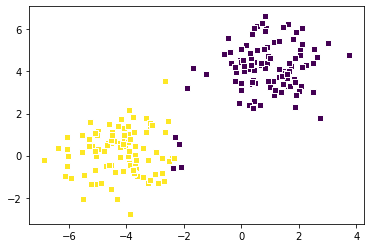

[4/4] loss is: 4.954766755613084e-14


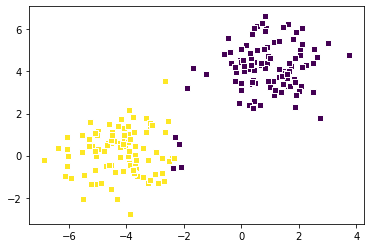

[4/4] loss is: 4.954766755613084e-14


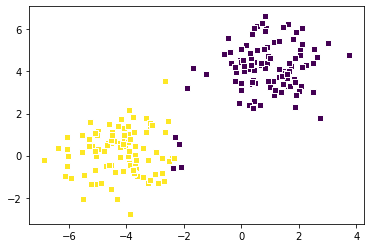

[4/4] loss is: 4.954766755613084e-14


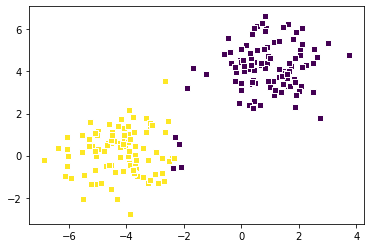

[4/4] loss is: 4.954766755613084e-14


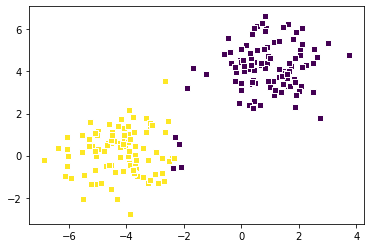

[4/4] loss is: 4.954766755613084e-14


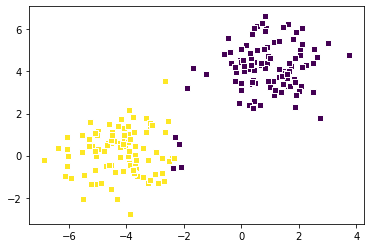

[4/4] loss is: 4.954766755613084e-14


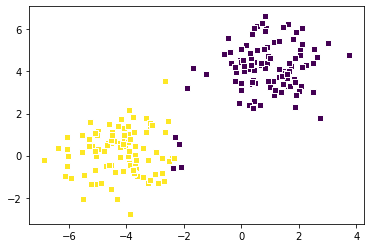

[4/4] loss is: 4.954766755613084e-14


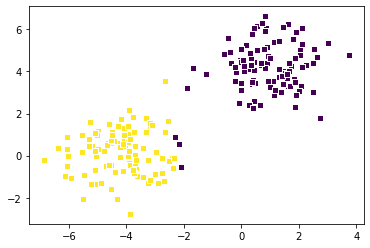

[4/4] loss is: 4.954766755613084e-14


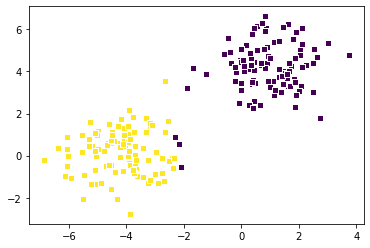

[4/4] loss is: 4.954766755613084e-14


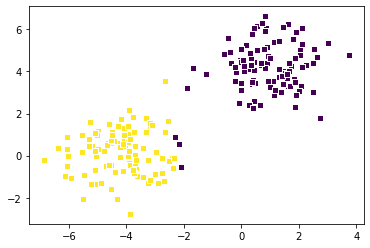

[4/4] loss is: 4.954766755613084e-14


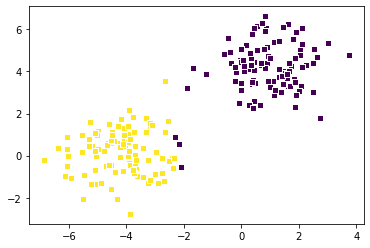

[4/4] loss is: 4.954766755613084e-14


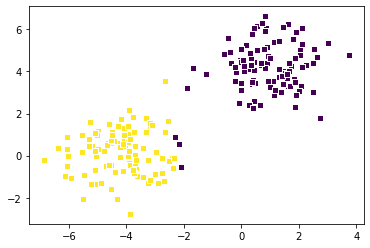

[4/4] loss is: 4.954766755613084e-14


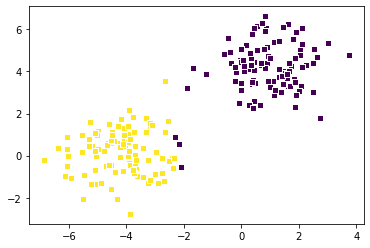

[4/4] loss is: 4.954766755613084e-14


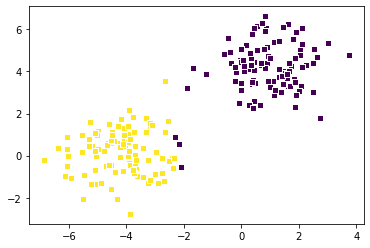

[4/4] loss is: 4.954766755613084e-14


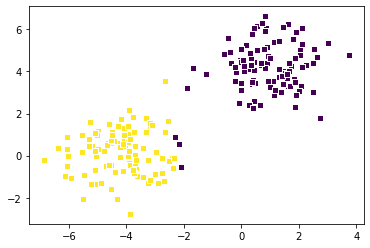

[4/4] loss is: 4.954766755613084e-14


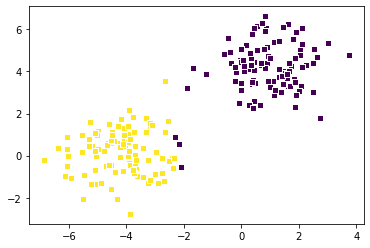

[4/4] loss is: 4.954766755613084e-14


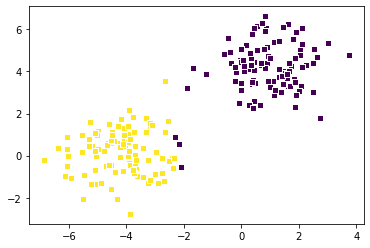

[4/4] loss is: 4.954766755613084e-14


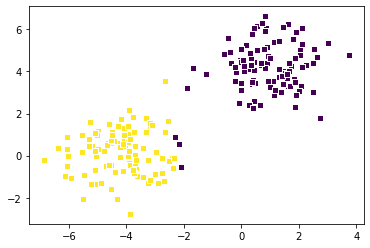

[4/4] loss is: 4.954766755613084e-14


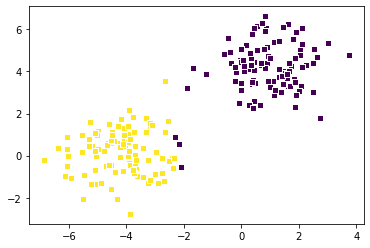

[4/4] loss is: 4.954766755613084e-14


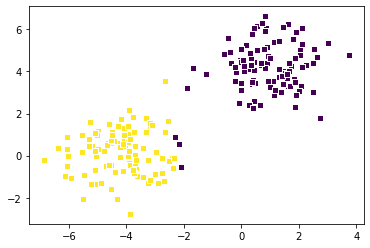

[4/4] loss is: 4.954766755613084e-14


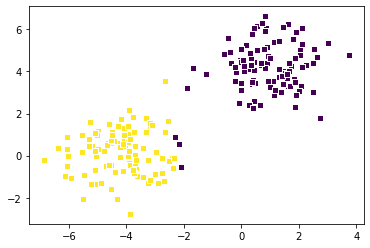

[4/4] loss is: 4.954766755613084e-14


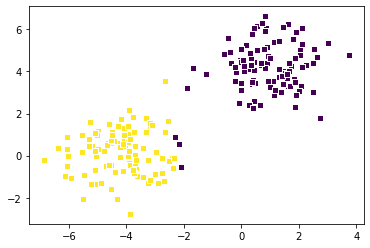

[4/4] loss is: 4.954766755613084e-14


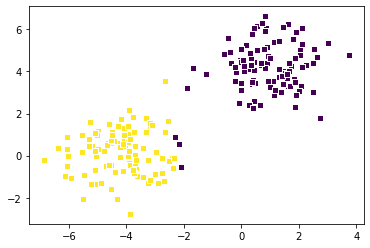

[4/4] loss is: 4.954766755613084e-14


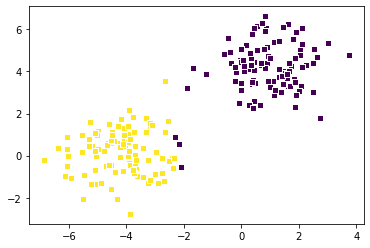

[4/4] loss is: 4.954766755613084e-14


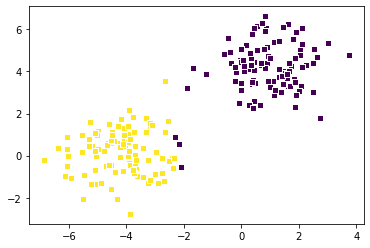

[4/4] loss is: 4.954766755613084e-14


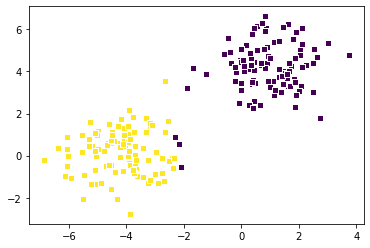

[4/4] loss is: 4.954766755613084e-14


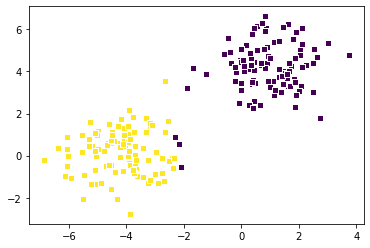

[4/4] loss is: 4.954766755613084e-14


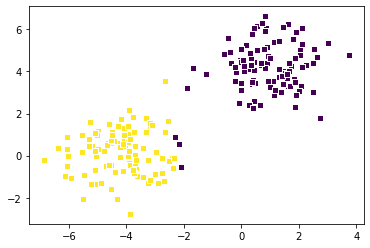

[4/4] loss is: 4.954766755613084e-14


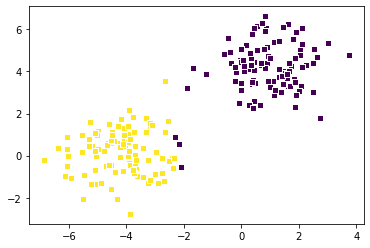

[4/4] loss is: 4.954766755613084e-14


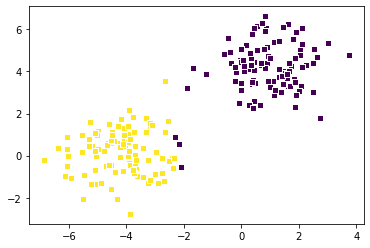

[4/4] loss is: 4.954766755613084e-14


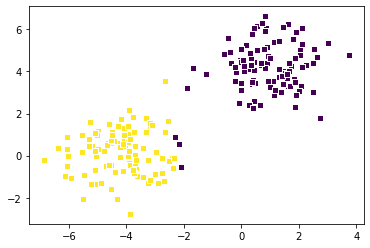

[4/4] loss is: 4.954766755613084e-14


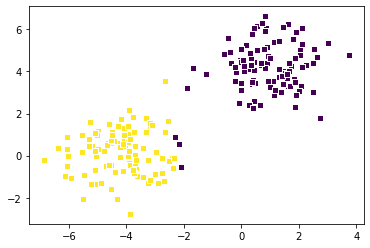

[4/4] loss is: 4.954766755613084e-14


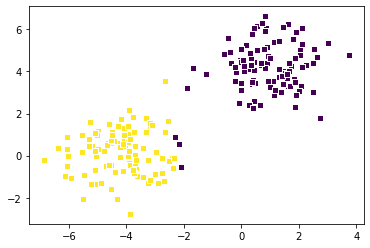

[4/4] loss is: 4.954766755613084e-14


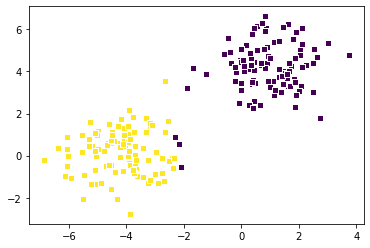

[4/4] loss is: 4.954766755613084e-14


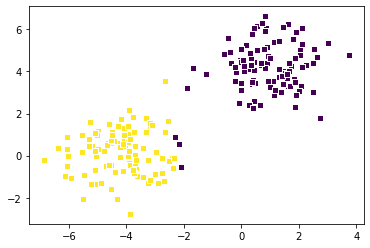

[4/4] loss is: 4.954766755613084e-14


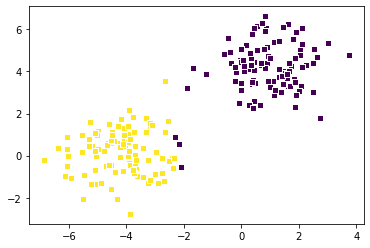

[4/4] loss is: 4.954766755613084e-14


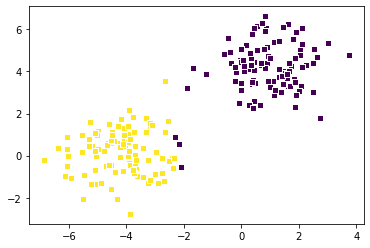

[4/4] loss is: 4.954766755613084e-14


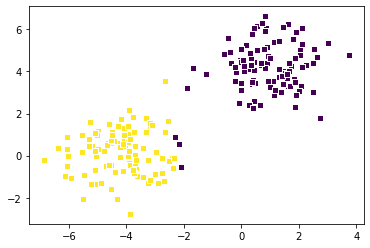

[4/4] loss is: 4.954766755613084e-14


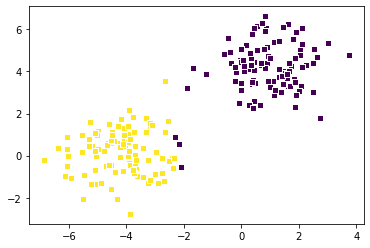

[4/4] loss is: 4.954766755613084e-14


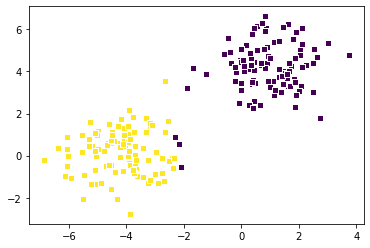

[4/4] loss is: 4.954766755613084e-14


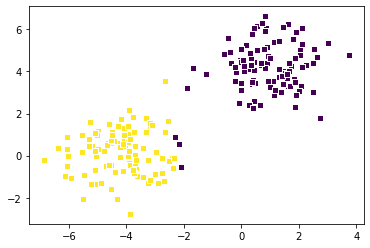

[4/4] loss is: 4.954766755613084e-14


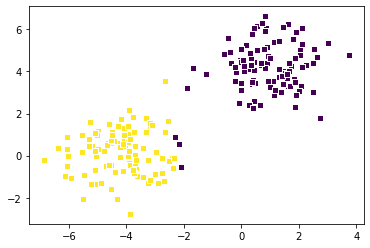

[4/4] loss is: 4.954766755613084e-14


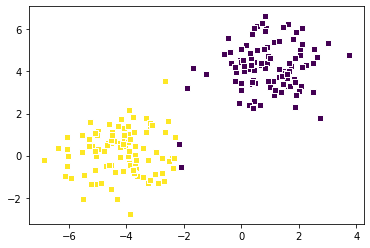

[4/4] loss is: 4.954766755613084e-14


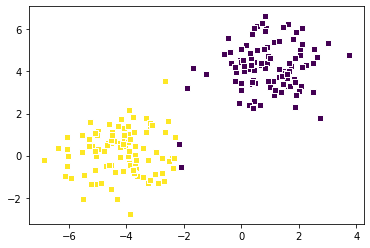

[4/4] loss is: 4.954766755613084e-14


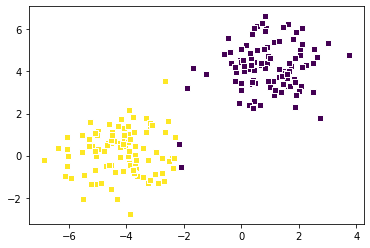

[4/4] loss is: 4.954766755613084e-14


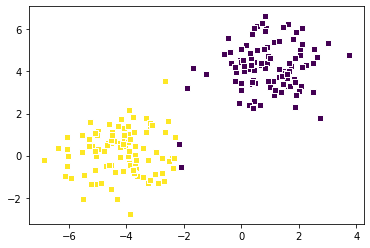

[4/4] loss is: 4.954766755613084e-14


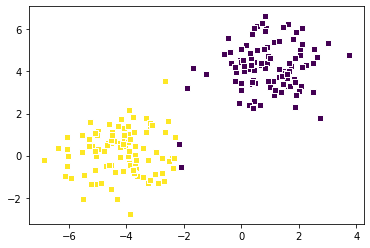

[4/4] loss is: 4.954766755613084e-14


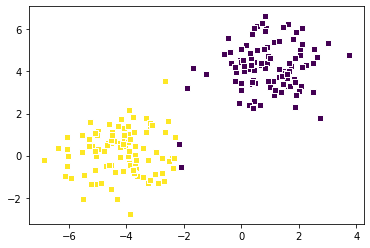

[4/4] loss is: 4.954766755613084e-14


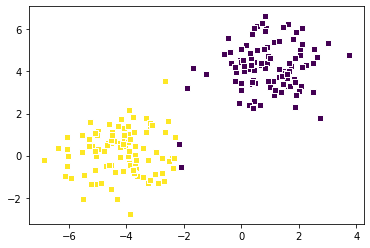

[4/4] loss is: 4.954766755613084e-14


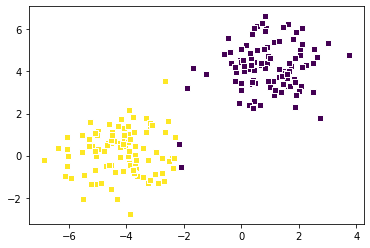

[4/4] loss is: 4.954766755613084e-14


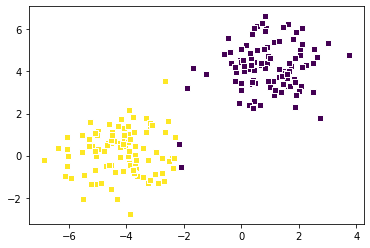

[4/4] loss is: 4.954766755613084e-14


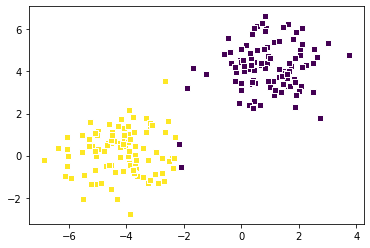

[4/4] loss is: 4.954766755613084e-14


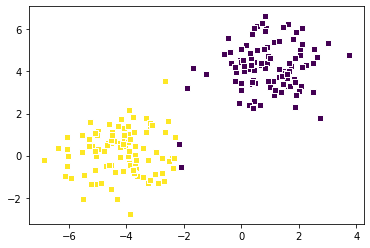

[4/4] loss is: 4.954766755613084e-14


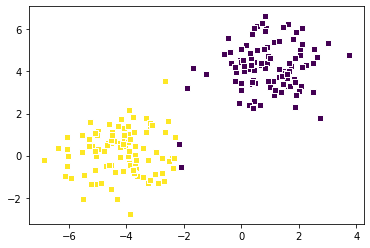

[4/4] loss is: 4.954766755613084e-14


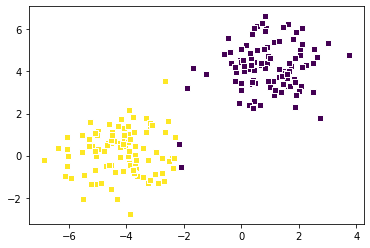

[4/4] loss is: 4.954766755613084e-14


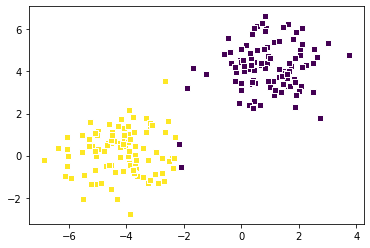

[4/4] loss is: 4.954766755613084e-14


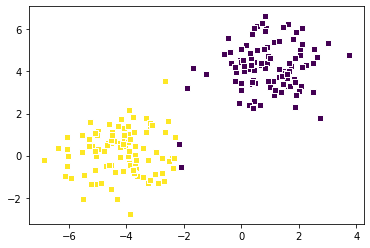

[4/4] loss is: 4.954555284560774e-14


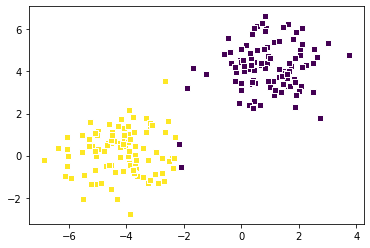

[4/4] loss is: 4.954555284560774e-14


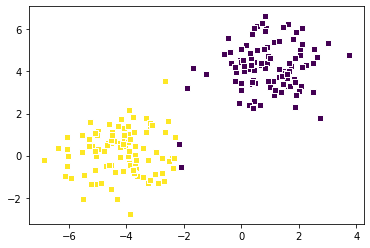

[4/4] loss is: 4.954555284560774e-14


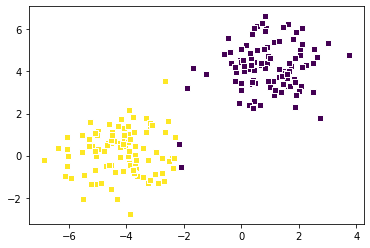

[4/4] loss is: 4.954555284560774e-14


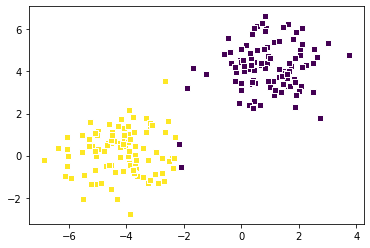

[4/4] loss is: 4.954555284560774e-14


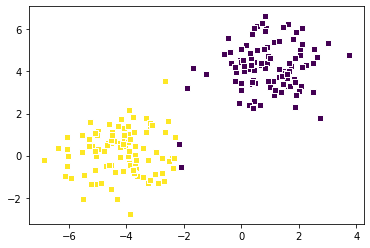

[4/4] loss is: 4.954555284560774e-14


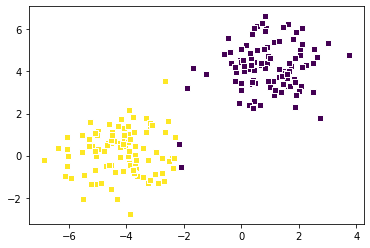

[4/4] loss is: 4.954555284560774e-14


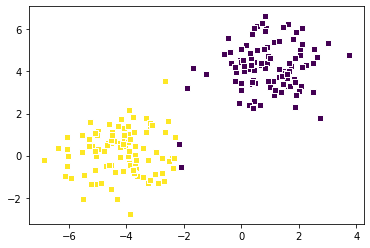

[4/4] loss is: 4.954555284560774e-14


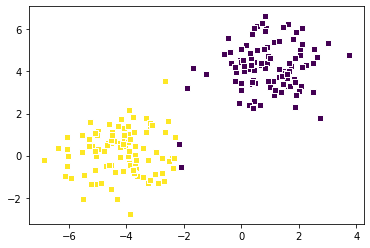

[4/4] loss is: 4.954555284560774e-14


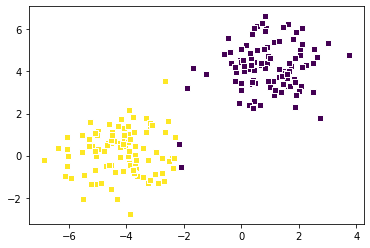

[4/4] loss is: 4.954555284560774e-14


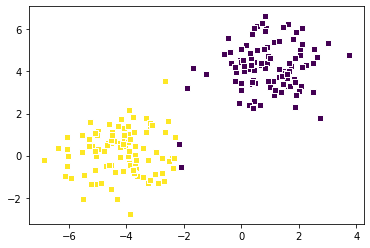

[4/4] loss is: 4.954555284560774e-14


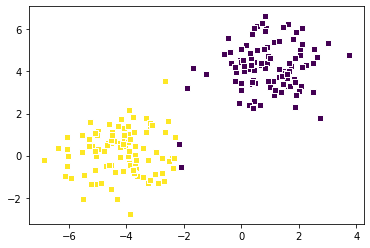

[4/4] loss is: 4.954555284560774e-14


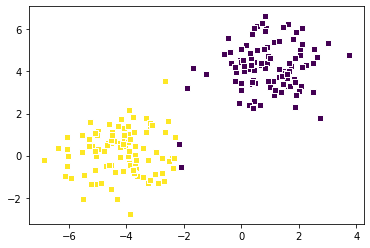

[4/4] loss is: 4.954555284560774e-14


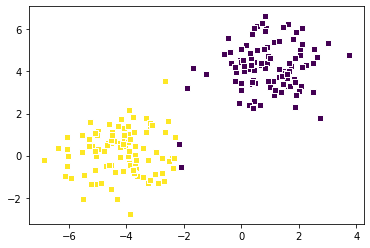

[4/4] loss is: 4.954555284560774e-14


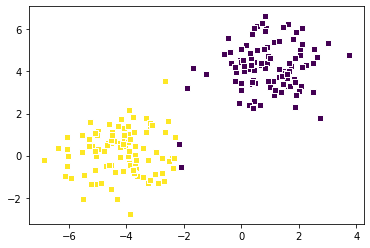

[4/4] loss is: 4.954555284560774e-14


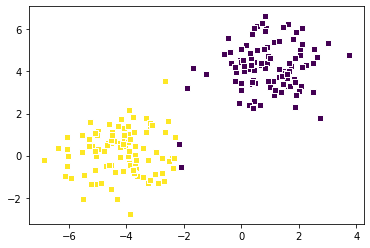

[4/4] loss is: 4.954555284560774e-14


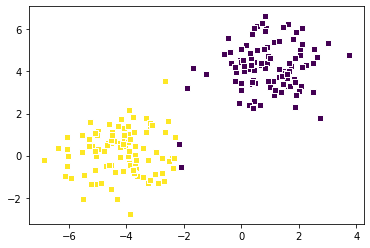

[4/4] loss is: 4.954555284560774e-14


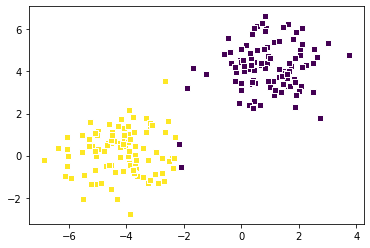

[4/4] loss is: 4.954555284560774e-14


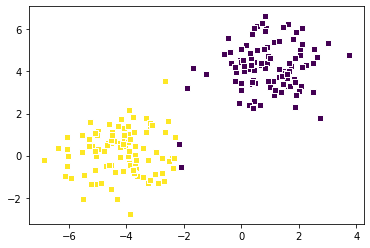

[4/4] loss is: 4.954555284560774e-14


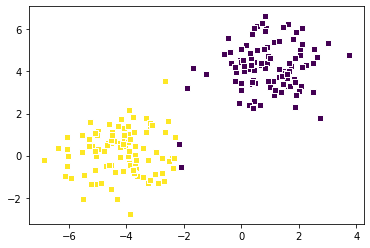

[4/4] loss is: 4.954555284560774e-14


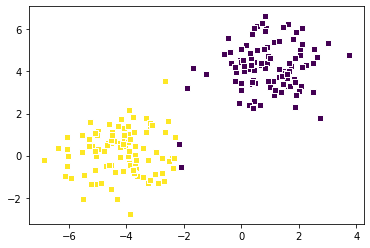

[4/4] loss is: 4.954555284560774e-14


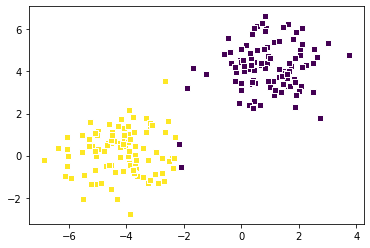

[4/4] loss is: 4.954555284560774e-14


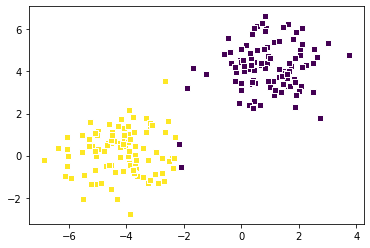

[4/4] loss is: 4.954555284560774e-14


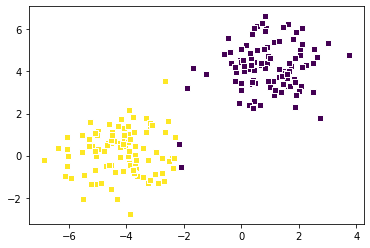

[4/4] loss is: 4.954555284560774e-14


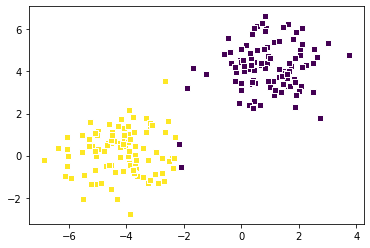

[4/4] loss is: 4.954555284560774e-14


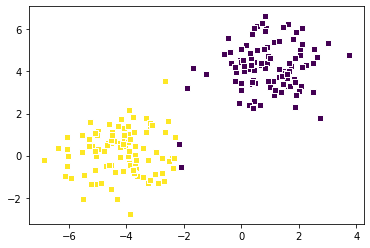

[4/4] loss is: 4.954555284560774e-14


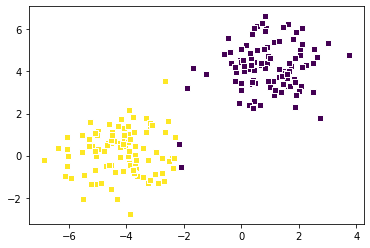

In [8]:
plt.figure(0)
plt.ion()
for epoch in range(EPOCH):
    i = 0 # retrieve H_x
    for x, y in zip(X_train, Y_train):
        loss = compute_loss(X_train, Y_train, THETA)
        print('[{0}/{1}] loss is: {2}'.format(epoch+1, EPOCH, loss))
        H_train[i] = hypothesis(x, THETA)
        THETA = update_parameters(THETA, LR, y, H_train[i], x)

        plt.cla()
        plt.scatter(X_train[:, 1], X_train[:, 2], c=H_train[:, 0], edgecolors='white', marker='s')
        plt.pause(0.001)
        i+=1
plt.ioff()
plt.show()

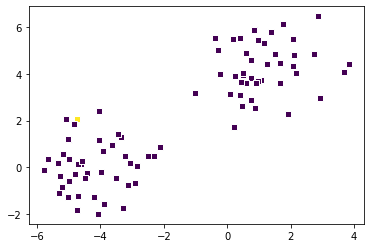

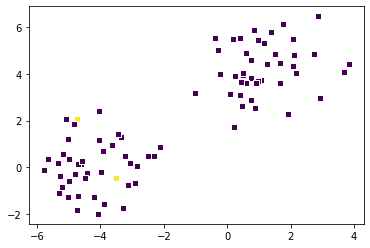

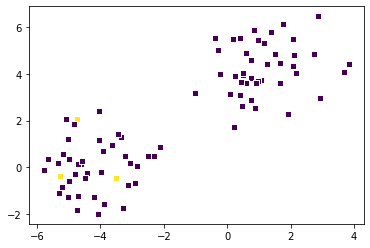

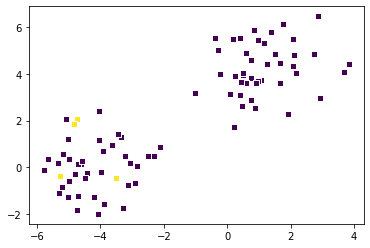

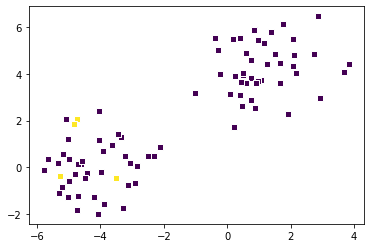

...

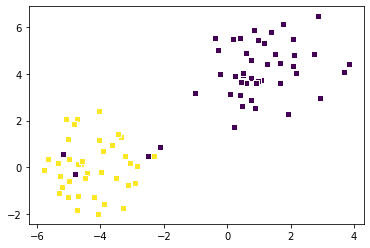

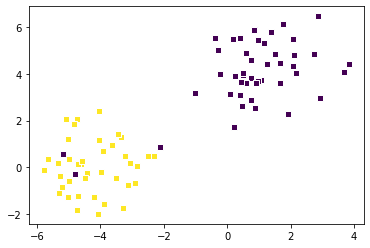

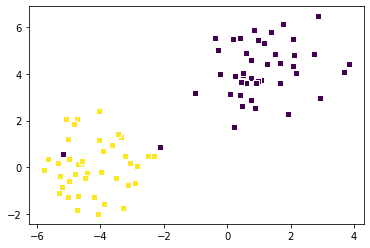

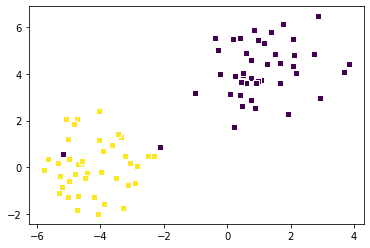

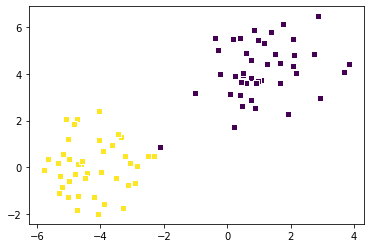

In [9]:
## TEST 
i = 0
for x, y in zip(X_test, Y_test):
    H_test[i] = hypothesis(x, THETA)
    i+=1
    plt.figure(1)
    x = np.linspace(-7, 4, 50)
    plt.scatter(X_test[:, 1], X_test[:, 2], c=H_test[:, 0], edgecolors='white', marker='s')
    plt.show()

### 2 牛顿方法

下面我们介绍另外一种算法来求解 $\ell(\theta)$ 的最大值，称为 **「牛顿方法(Newton's method)」**。我们可以通过如下的几张图来理解牛顿方法：

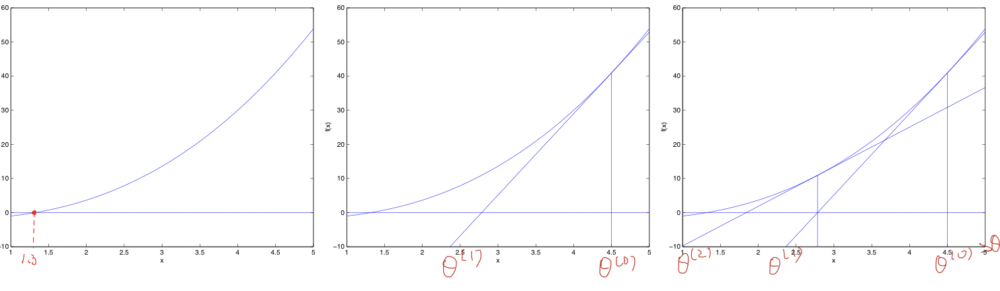

对于梯度下降，每次只是在梯度方向上下降一小步（取决于学习速率），而牛顿方法是一直下降到「导数」（切线）和$\theta$轴交界的那个$\theta$。因此牛顿方法的更新规则是：

$$\theta:=\theta - \frac{f(\theta)}{f'(\theta)}$$

下面我们将牛顿方法应用于逻辑回归，我们需要找到 $l(\theta)$ 的最大值，即 $l'(\theta)=0$，因此令 $f(\theta)=\ell'(\theta)$，我们可以得到逻辑回归的牛顿方法更新公式：

$$\theta:=\theta - \frac{\ell'(\theta)}{\ell''(\theta)}$$

而对于 $\theta$ 为向量的情况，牛顿方法的多维形式如下（又被称为 **「牛顿-拉夫逊方法(Newton-Raphson method)」**）：

$$\theta:=\theta-H^{-1} \triangledown_{\theta}\ell(\theta)$$

其中 $\triangledown_{\theta}\ell(\theta)$ 是 $l(\theta)$ 对于每个 $\theta_i$ 的偏导数构成的向量。$H$ 是一个 $(n+1)\times (n+1)$ 的矩阵（包括截距项），称为 **「海森矩阵(Hessian matrix)」**，其中的每一项定义为：

$$H_{ij}=\frac{\partial^2 \ell(\theta)}{\partial \theta_i \partial \theta_j}$$


牛顿法实现代码如下：

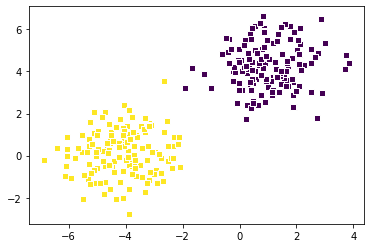

In [1]:
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from numpy.linalg import inv
from math import exp, log
np.random.seed(1)

## Hyper-paramters definition
EPOCH = 2
THETA = np.random.normal(1, 0.5, 3).reshape(3, 1) # learnable parameters

## First step: Generating dummy two categories of data.
# 1. data(300)
X, Y = make_blobs(n_samples=300, centers=2, n_features=2, random_state=3)
# show data distribution
plt.scatter(X[:,0], X[:, 1], c=Y, edgecolors='white', marker='s')
plt.show()

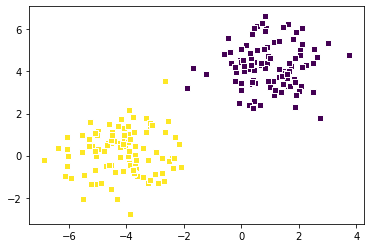

In [2]:
# 2. split into train/val set
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
plt.scatter(X_train[:,0], X_train[:, 1], c=Y_train, edgecolors='white', marker='s')
plt.show()

In [3]:
# for theta0, x0 = 1
o_train = np.ones([X_train.shape[0], 1], dtype=X_train.dtype)
o_test = np.ones([X_test.shape[0], 1], dtype=X_test.dtype)
X_train = np.concatenate((o_train, X_train), axis=1)
X_test = np.concatenate((o_test, X_test), axis=1)
print("X_train shape : {0}".format(X_train.shape))
print("Y_train shape : {0}".format(Y_train.shape))
print("X_test shape : {0}".format(X_test.shape))
print("y_test shape : {0}".format(Y_test.shape))
H_train = np.zeros([Y_train.shape[0], 1], dtype=Y_train.dtype)
H_test = np.zeros([Y_test.shape[0], 1], dtype=Y_test.dtype)

X_train shape : (210, 3)
Y_train shape : (210,)
X_test shape : (90, 3)
y_test shape : (90,)


In [4]:
# return a hessian matrix for parameters updating
def hessian(sec_derivative, x):
    H = np.zeros((x.size, x.size),dtype='float32')
    for i in range(x.size):
        for j in range(x.size):
            # sometimes sec_derivative would be 0, adding 0.000000001 is to make sure the H is non-singular
            H[i, j] = (sec_derivative+0.000000001) *x[i] *x[j]
    return H

# Second step: Making hypothesis
def sigmoid_function(z):
    # evade outofrange error
    if z > 50:
        z = 50
    if z < -50:
        z = -50
    g = 1 / (1 + exp(-z))
    return g

def hypothesis(x, THETA):
    hypothesis = np.matmul(THETA.T, x)
    hypothesis = sigmoid_function(hypothesis[0])
    return hypothesis

# Third step: Define a loss function
def compute_loss(X, Y, THETA):
    loss = 0
    for x, y in zip(X, Y):
        h_x = hypothesis(x, THETA)
        # if h_x == 1 --> log(1-1) --> error
        if h_x == 1:
            h_x = 1-0.0000000000001
        loss += (-y) *(log(h_x) - (1-y) *log(1-h_x))
    return loss/(X.shape[0])

# Forth steps: Updating parameters
def update_parameters(THETA, y, h_x, x):
    x = np.reshape(x, THETA.shape)
    g = sigmoid_function(np.matmul(THETA.T, x)[0])
    # for Hessian matrix
    sec_derivative = -g*(1-g) # *xi * xj --> a hessian entry
    H = hessian(sec_derivative, x)
    # update parameters
    THETA = THETA - np.matmul(inv(H), (y-h_x) * x)
    return THETA

[1/2] loss is: 0.6923426706769663


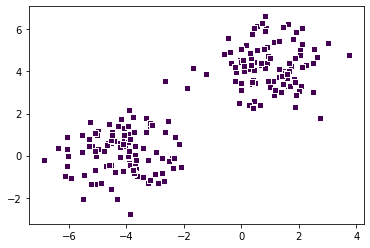

[1/2] loss is: 0.6923426706769663


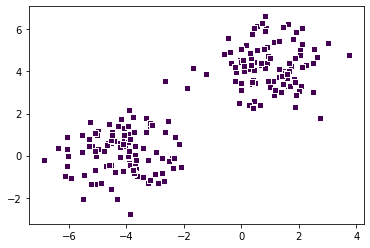

[1/2] loss is: 2.0505235765138234


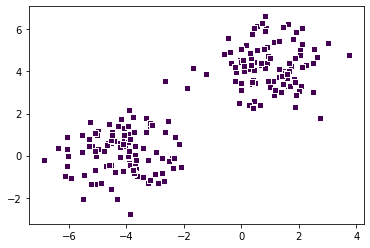

[1/2] loss is: 11.007554395255696


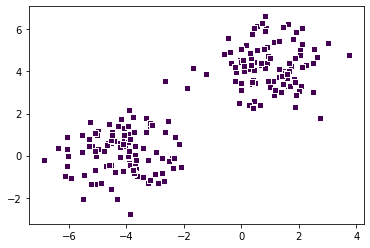

[1/2] loss is: 11.007554395255696


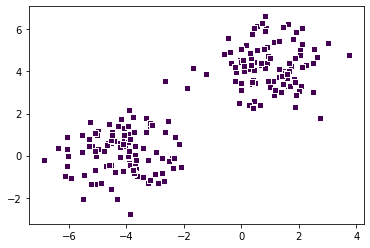

[1/2] loss is: 11.007554395255696


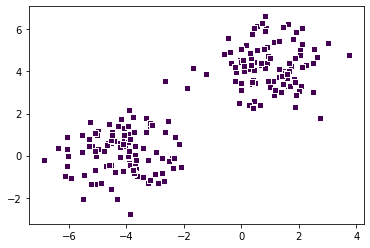

[1/2] loss is: 20.238095238095237


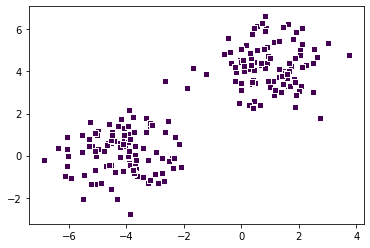

[1/2] loss is: 20.238095238095237


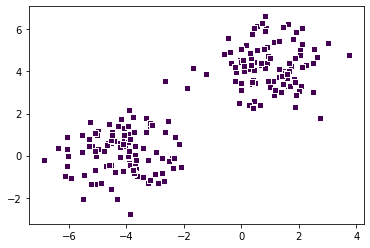

[1/2] loss is: 21.666666666666668


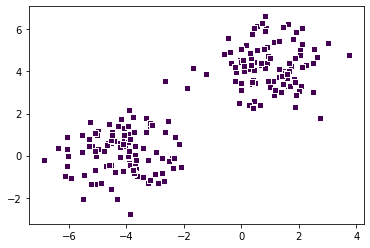

[1/2] loss is: 21.666666666666668


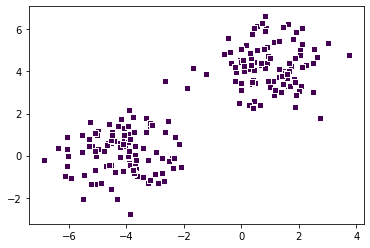

[1/2] loss is: 21.666666666666668


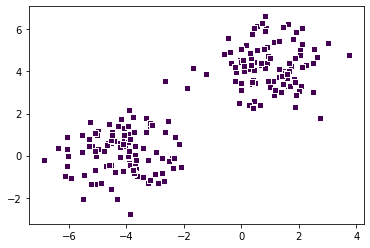

[1/2] loss is: 5.952380952380978


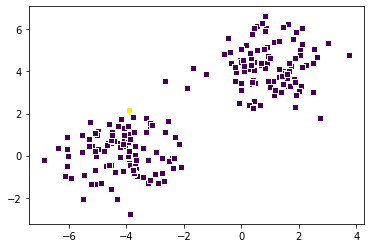

[1/2] loss is: 5.952380952380978


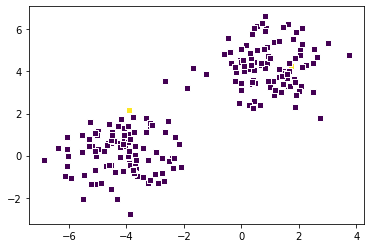

[1/2] loss is: 19.04761904761905


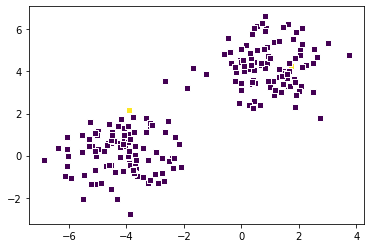

[1/2] loss is: 19.52380952380953


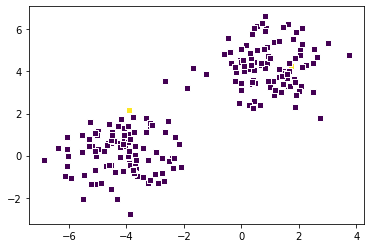

[1/2] loss is: 14.047619047619056


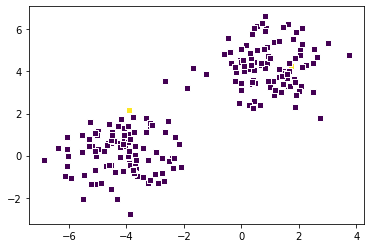

[1/2] loss is: 25.238095238095237


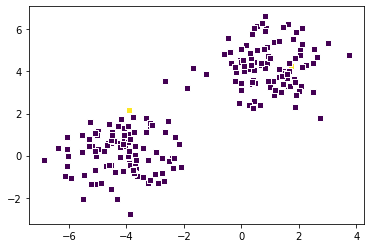

[1/2] loss is: 25.238095238095237


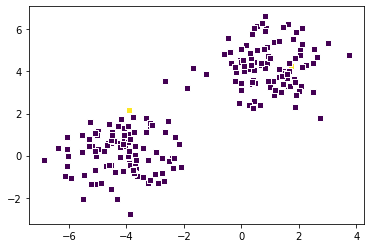

[1/2] loss is: 25.238095238095237


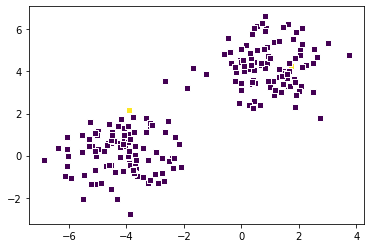

[1/2] loss is: 25.238095238095237


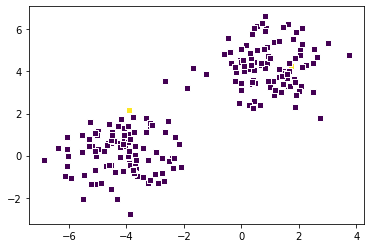

[1/2] loss is: 25.238095238095237


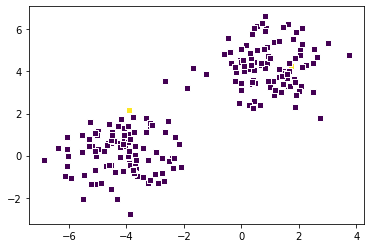

[1/2] loss is: 25.238095238095237


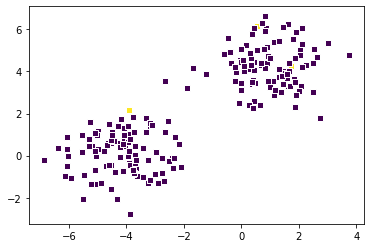

[1/2] loss is: 25.238095238095237


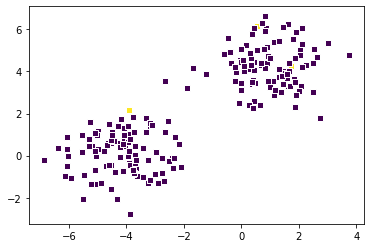

[1/2] loss is: 25.238095238095237


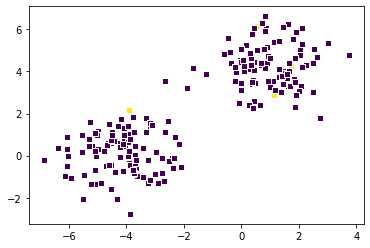

[1/2] loss is: 25.238095238095237


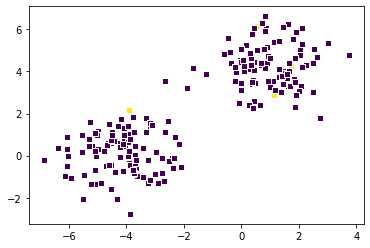

[1/2] loss is: 25.238095238095237


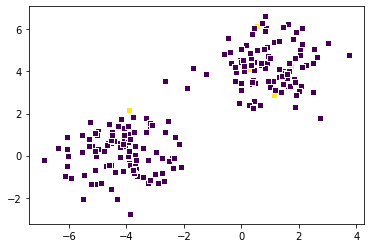

[1/2] loss is: 25.238095238095237


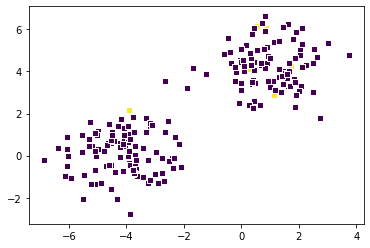

[1/2] loss is: 25.238095238095237


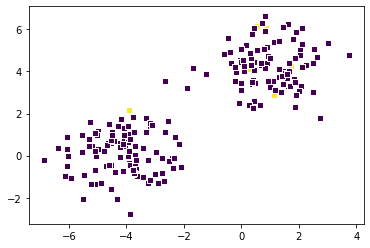

[1/2] loss is: 22.61904761904762


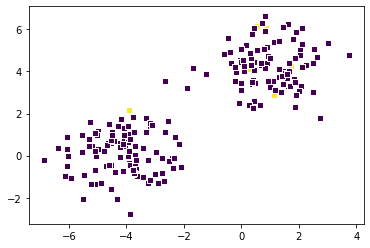

[1/2] loss is: 25.238095238095237


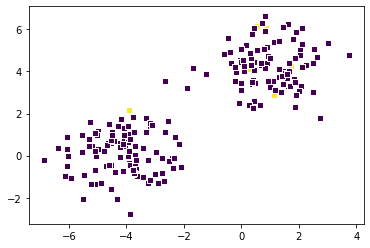

[1/2] loss is: 25.238095238095237


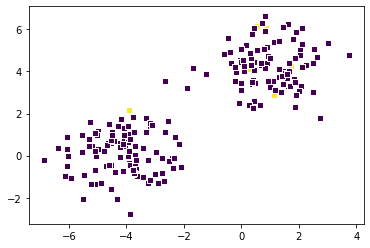

[1/2] loss is: 25.238095238095237


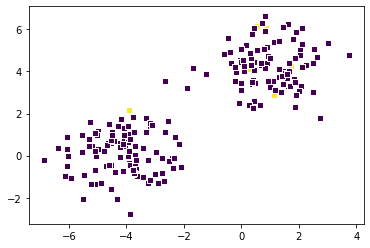

[1/2] loss is: 25.238095238095237


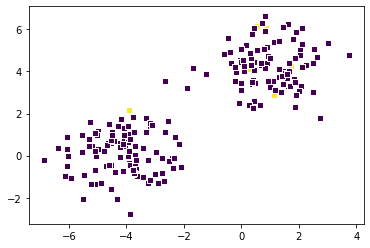

[1/2] loss is: 20.952380952380953


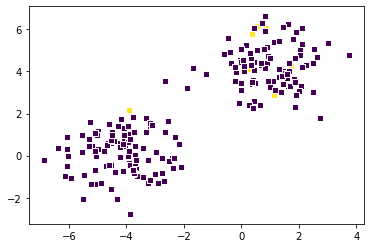

[1/2] loss is: 20.952380952380953


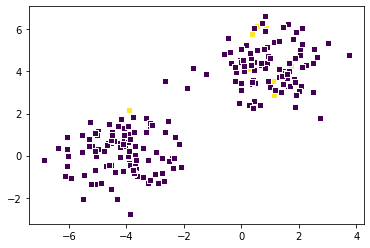

[1/2] loss is: 21.19047619047619


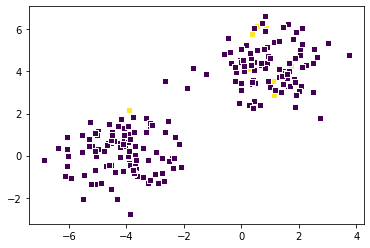

[1/2] loss is: 25.238095238095237


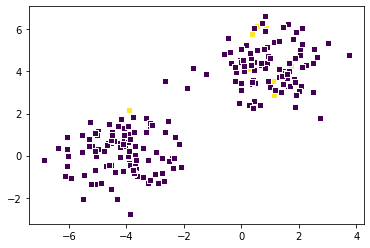

[1/2] loss is: 25.238095238095237


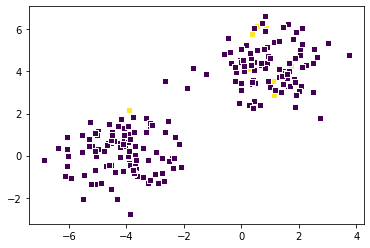

[1/2] loss is: 25.238095238095237


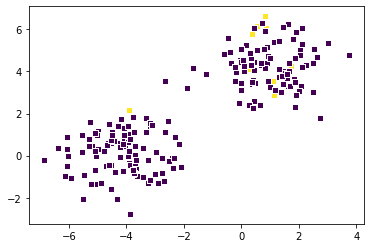

[1/2] loss is: 25.238095238095237


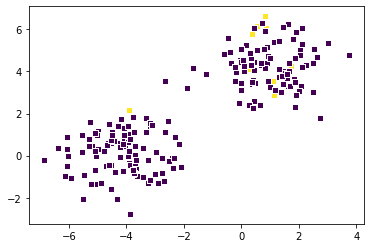

[1/2] loss is: 25.0


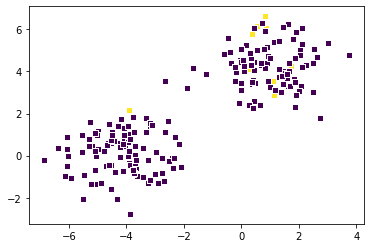

[1/2] loss is: 25.0


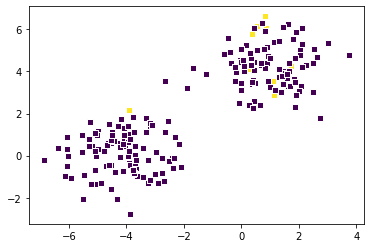

[1/2] loss is: 25.0


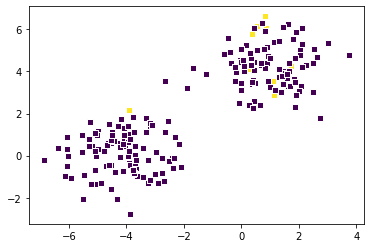

[1/2] loss is: 25.0


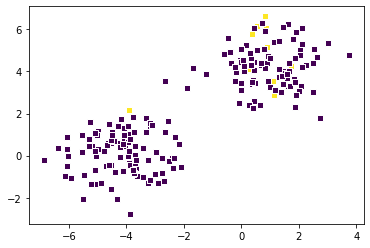

[1/2] loss is: 25.0


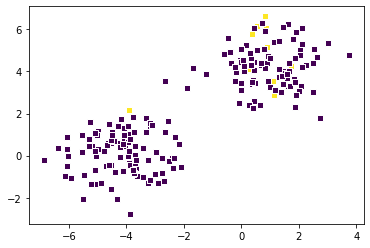

[1/2] loss is: 25.0


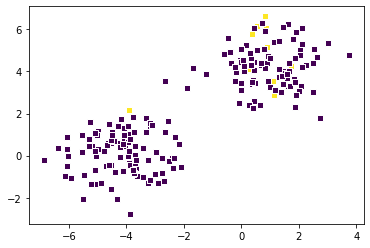

[1/2] loss is: 25.0


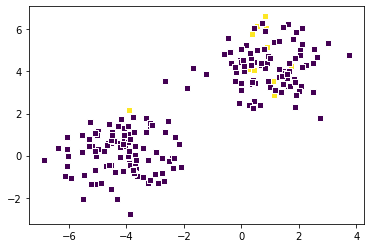

[1/2] loss is: 25.0


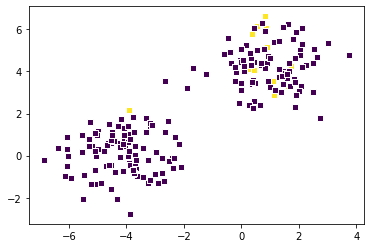

[1/2] loss is: 25.0


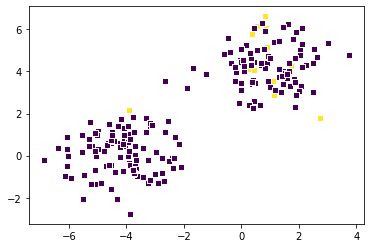

[1/2] loss is: 25.0


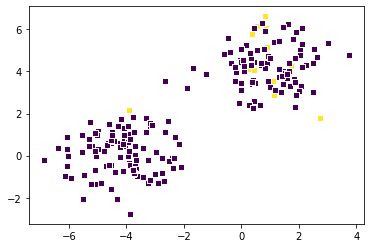

[1/2] loss is: 25.0


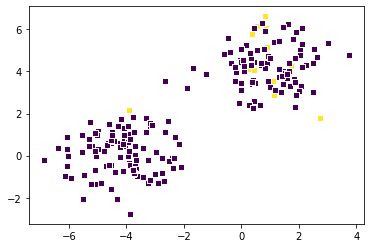

[1/2] loss is: 24.761904761904763


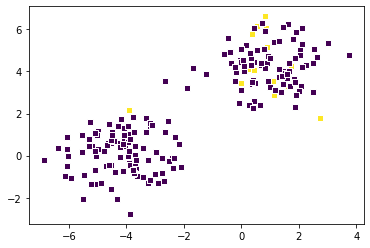

[1/2] loss is: 5.0491885804693043e-14


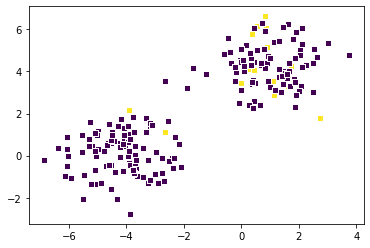

[1/2] loss is: 5.0491885804693043e-14


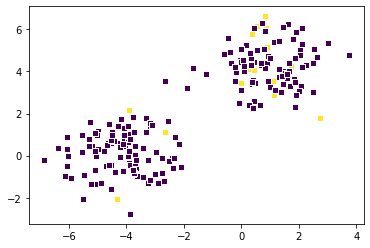

[1/2] loss is: 5.0491885804693043e-14


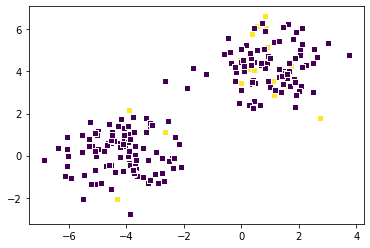

[1/2] loss is: 5.0491885804693043e-14


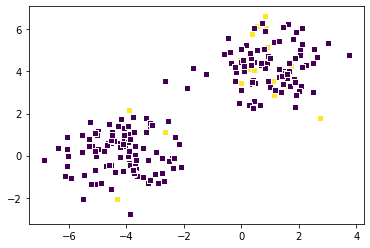

[1/2] loss is: 5.0491885804693043e-14


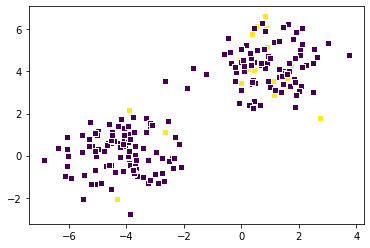

[1/2] loss is: 5.0491885804693043e-14


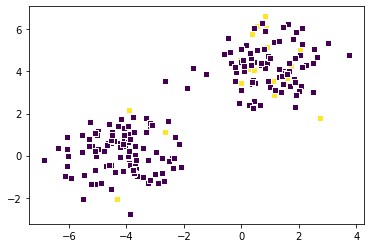

[1/2] loss is: 5.0491885804693043e-14


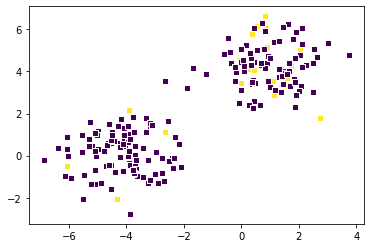

[1/2] loss is: 5.0491885804693043e-14


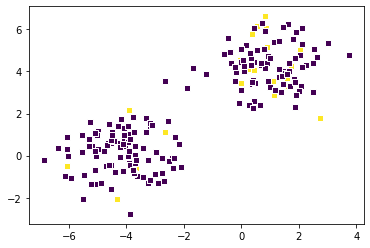

[1/2] loss is: 5.0491885804693043e-14


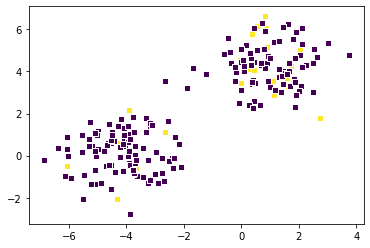

[1/2] loss is: 5.0491885804693043e-14


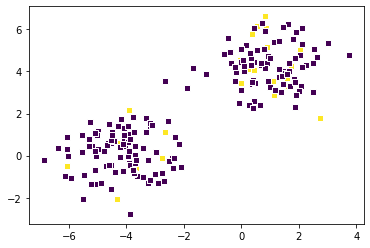

[1/2] loss is: 5.0491885804693043e-14


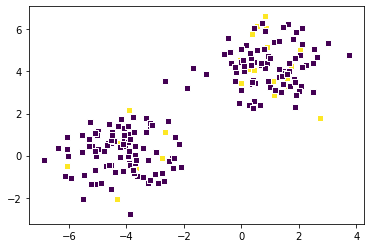

[1/2] loss is: 5.0491885804693043e-14


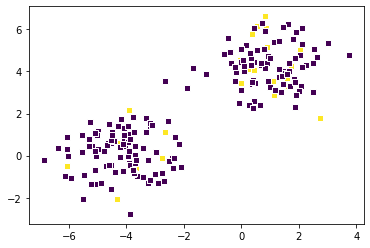

[1/2] loss is: 5.0491885804693043e-14


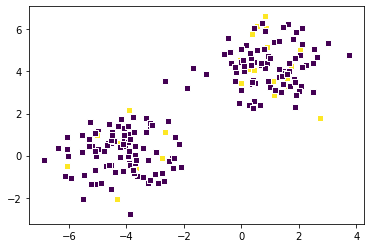

[1/2] loss is: 5.0491885804693043e-14


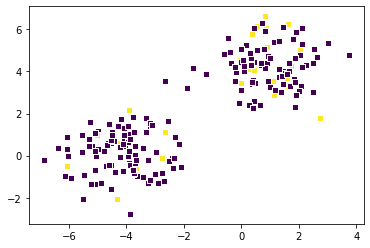

[1/2] loss is: 5.0491885804693043e-14


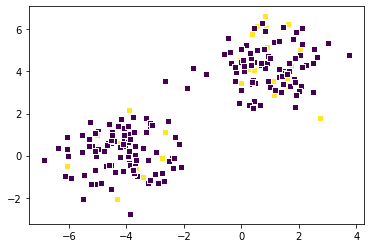

[1/2] loss is: 5.0491885804693043e-14


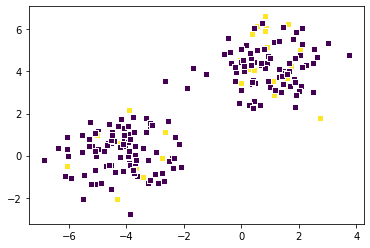

[1/2] loss is: 5.0491885804693043e-14


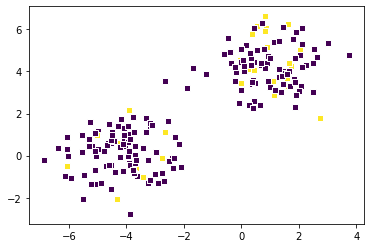

[1/2] loss is: 5.0491885804693043e-14


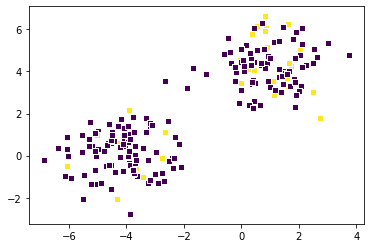

[1/2] loss is: 5.0491885804693043e-14


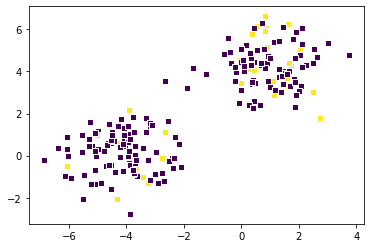

[1/2] loss is: 5.0491885804693043e-14


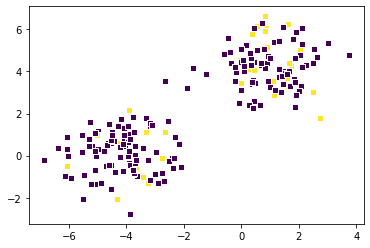

[1/2] loss is: 5.0491885804693043e-14


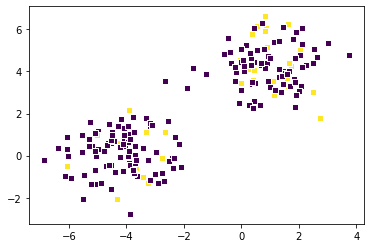

[1/2] loss is: 5.0491885804693043e-14


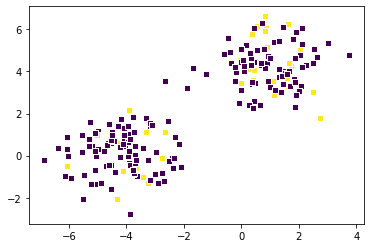

[1/2] loss is: 5.0491885804693043e-14


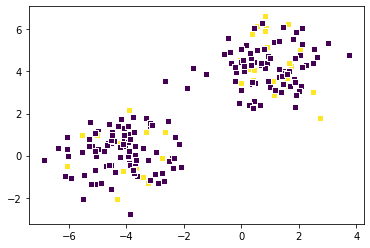

[1/2] loss is: 5.0491885804693043e-14


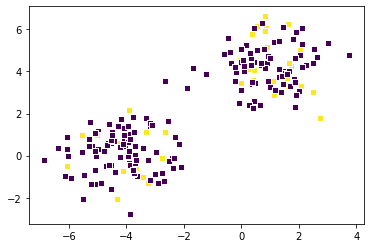

[1/2] loss is: 5.0491885804693043e-14


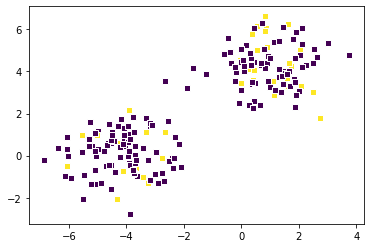

[1/2] loss is: 5.0491885804693043e-14


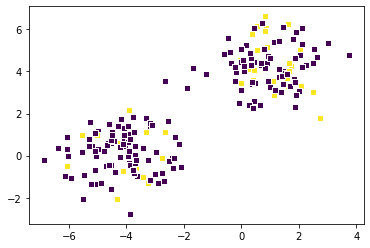

[1/2] loss is: 5.0491885804693043e-14


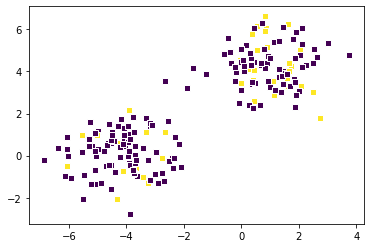

[1/2] loss is: 5.0491885804693043e-14


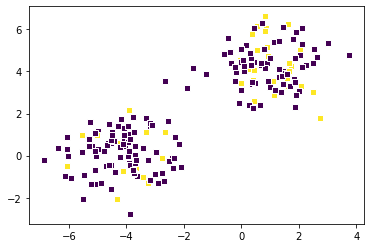

[1/2] loss is: 5.0491885804693043e-14


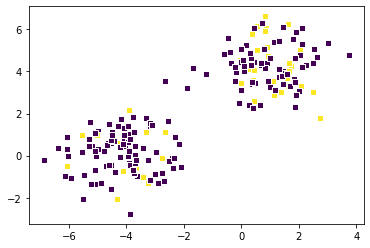

[1/2] loss is: 5.0491885804693043e-14


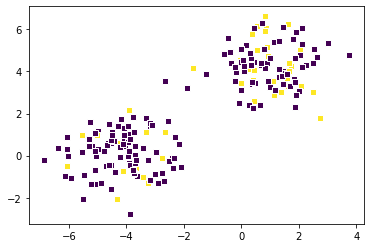

[1/2] loss is: 5.0491885804693043e-14


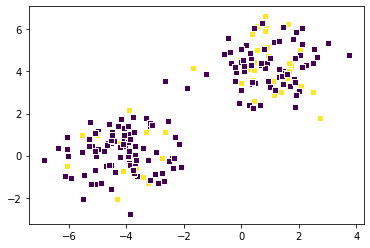

[1/2] loss is: 5.0491885804693043e-14


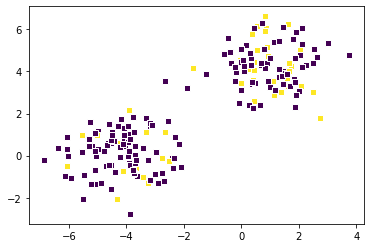

[1/2] loss is: 5.0491885804693043e-14


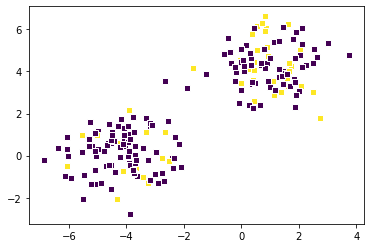

[1/2] loss is: 5.0491885804693043e-14


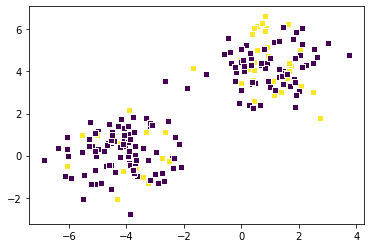

[1/2] loss is: 5.0491885804693043e-14


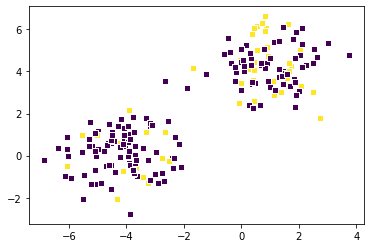

[1/2] loss is: 5.0491885804693043e-14


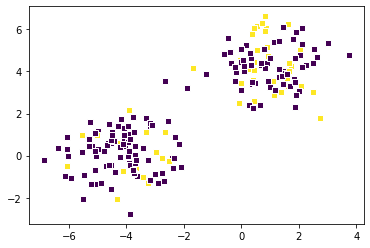

[1/2] loss is: 5.0491885804693043e-14


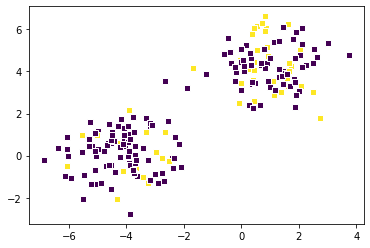

[1/2] loss is: 5.0491885804693043e-14


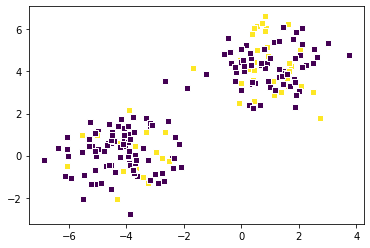

[1/2] loss is: 5.0491885804693043e-14


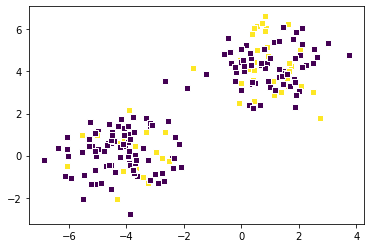

[1/2] loss is: 5.0491885804693043e-14


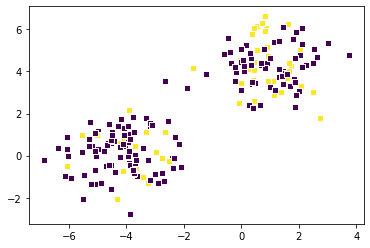

[1/2] loss is: 5.0491885804693043e-14


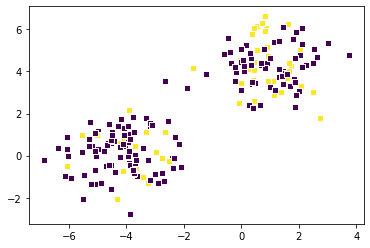

[1/2] loss is: 5.0491885804693043e-14


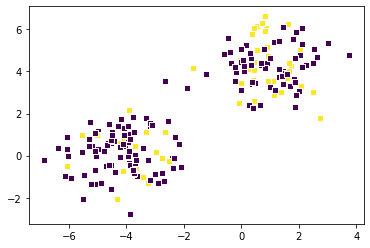

[1/2] loss is: 5.0491885804693043e-14


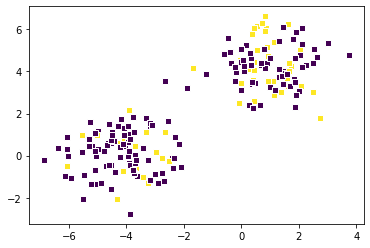

[1/2] loss is: 5.0491885804693043e-14


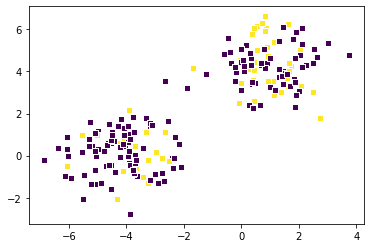

[1/2] loss is: 5.0491885804693043e-14


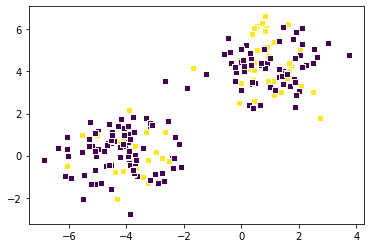

[1/2] loss is: 5.0491885804693043e-14


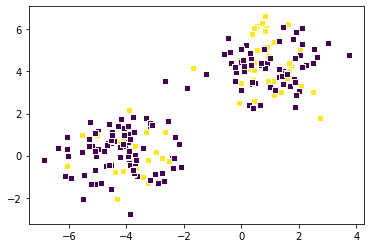

[1/2] loss is: 5.0491885804693043e-14


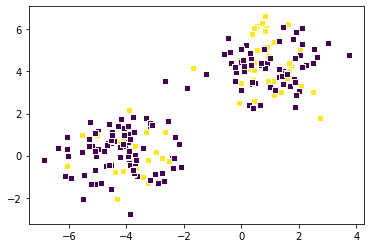

[1/2] loss is: 5.0491885804693043e-14


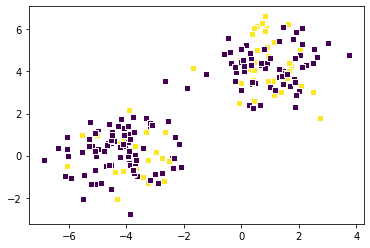

[1/2] loss is: 5.0491885804693043e-14


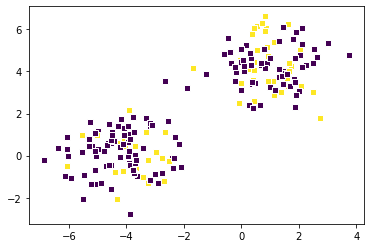

[1/2] loss is: 5.0491885804693043e-14


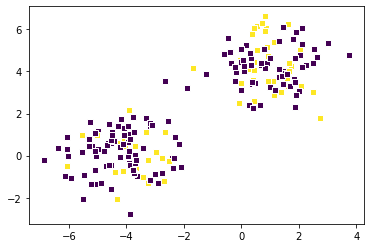

[1/2] loss is: 5.0491885804693043e-14


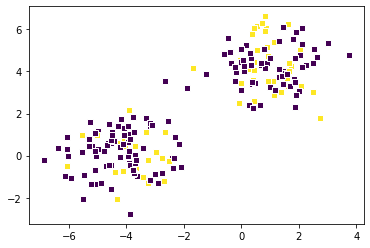

[1/2] loss is: 5.0491885804693043e-14


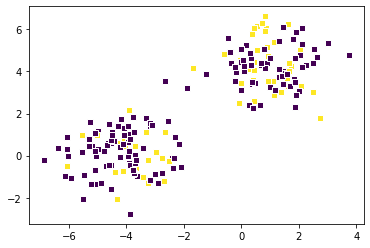

[1/2] loss is: 5.0491885804693043e-14


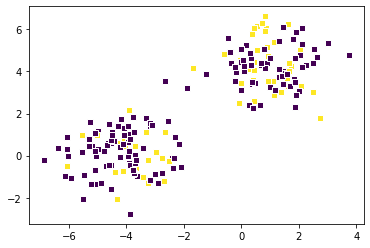

[1/2] loss is: 5.0491885804693043e-14


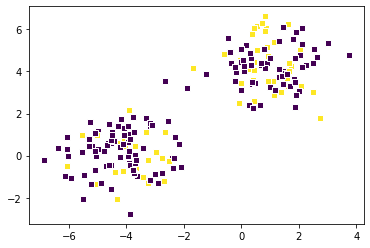

[1/2] loss is: 5.0491885804693043e-14


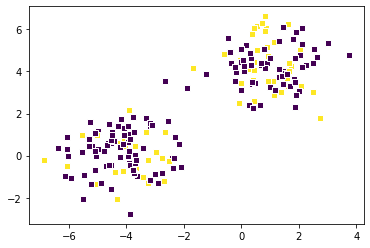

[1/2] loss is: 5.0491885804693043e-14


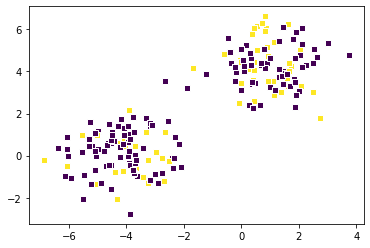

[1/2] loss is: 5.0491885804693043e-14


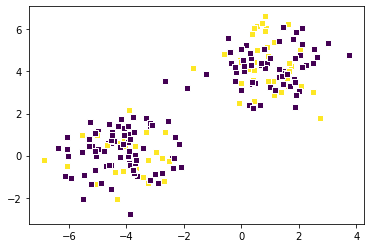

[1/2] loss is: 5.0491885804693043e-14


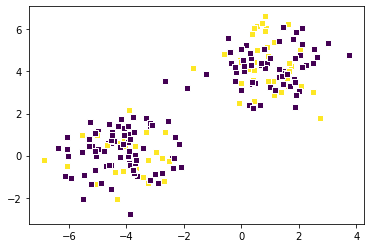

[1/2] loss is: 5.0491885804693043e-14


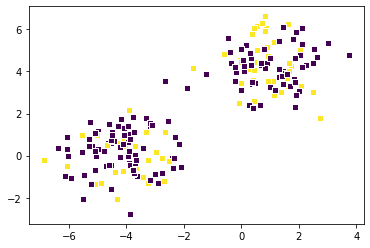

[1/2] loss is: 5.0491885804693043e-14


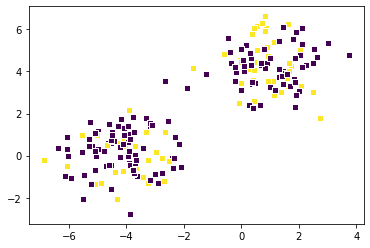

[1/2] loss is: 5.0491885804693043e-14


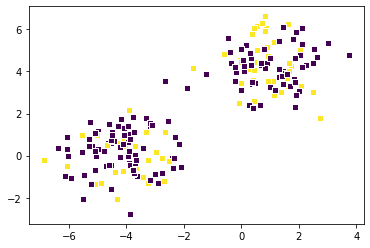

[1/2] loss is: 5.0491885804693043e-14


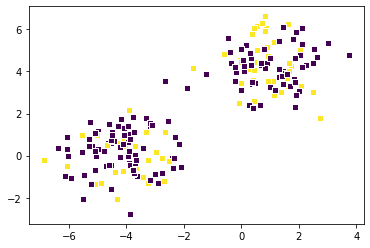

[1/2] loss is: 5.0491885804693043e-14


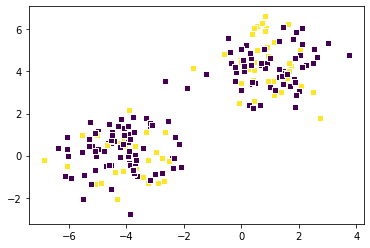

[1/2] loss is: 5.0491885804693043e-14


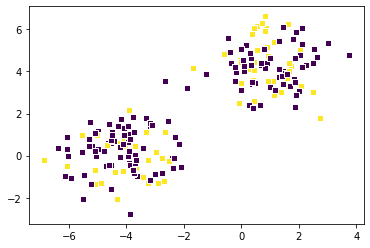

[1/2] loss is: 5.0491885804693043e-14


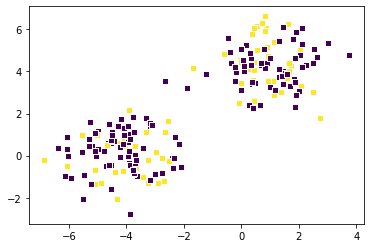

[1/2] loss is: 5.0491885804693043e-14


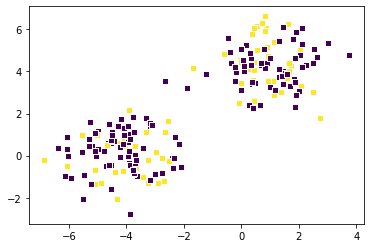

[1/2] loss is: 5.0491885804693043e-14


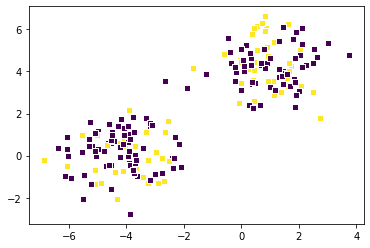

[1/2] loss is: 5.0491885804693043e-14


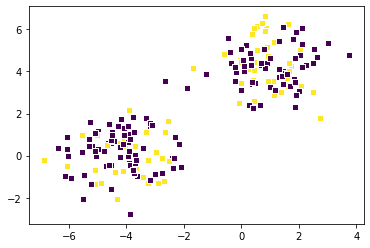

[1/2] loss is: 5.0491885804693043e-14


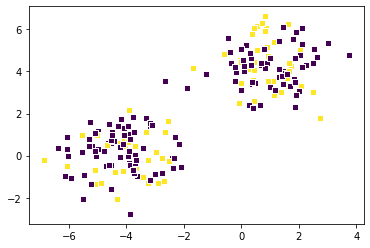

[1/2] loss is: 5.0491885804693043e-14


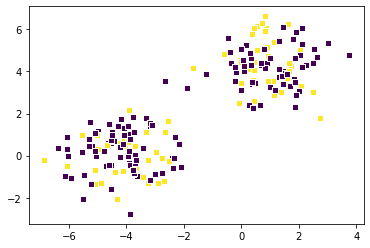

[1/2] loss is: 5.0491885804693043e-14


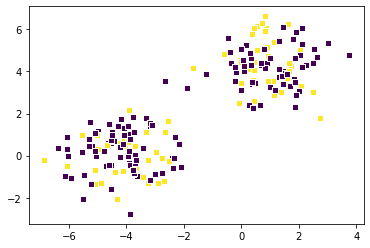

[1/2] loss is: 5.0491885804693043e-14


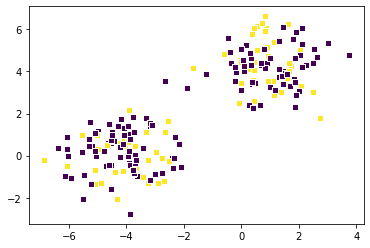

[1/2] loss is: 5.0491885804693043e-14


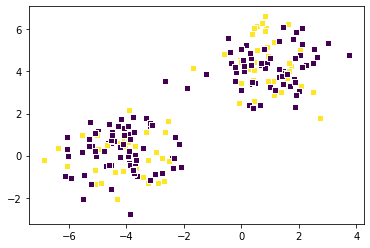

[1/2] loss is: 5.0491885804693043e-14


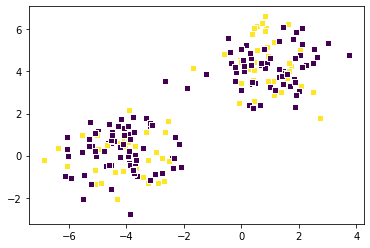

[1/2] loss is: 5.0491885804693043e-14


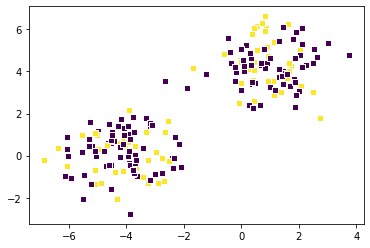

[1/2] loss is: 5.0491885804693043e-14


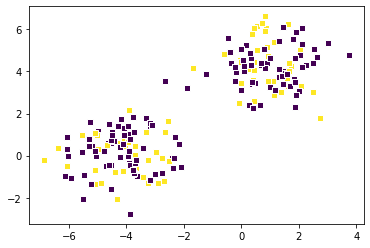

[1/2] loss is: 5.0491885804693043e-14


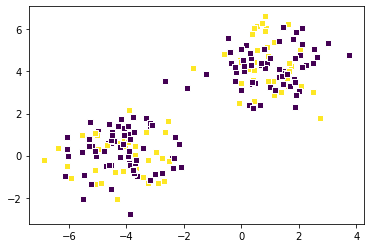

[1/2] loss is: 5.0491885804693043e-14


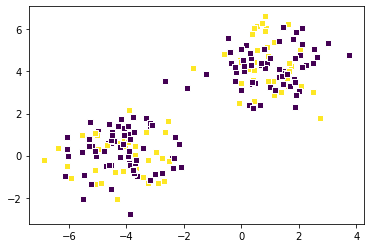

[1/2] loss is: 5.0491885804693043e-14


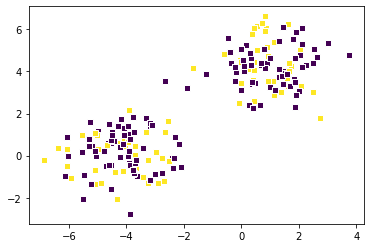

[1/2] loss is: 5.0491885804693043e-14


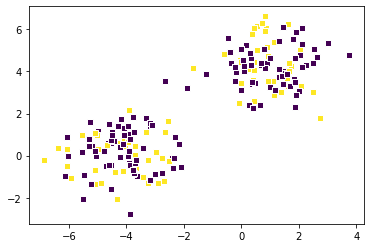

[1/2] loss is: 5.0491885804693043e-14


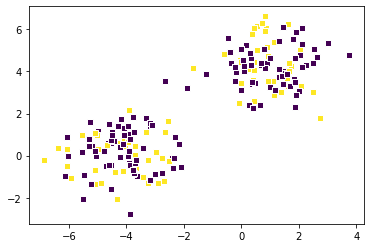

[1/2] loss is: 5.0491885804693043e-14


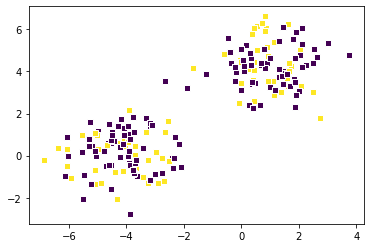

[1/2] loss is: 5.0491885804693043e-14


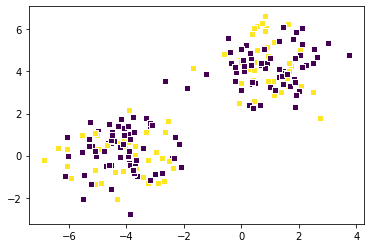

[1/2] loss is: 5.0491885804693043e-14


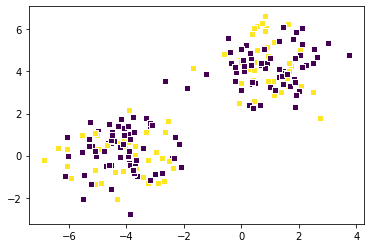

[1/2] loss is: 5.0491885804693043e-14


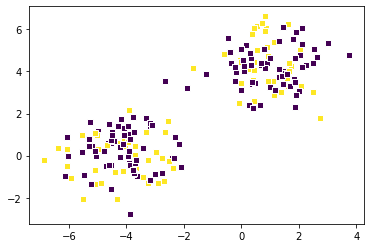

[1/2] loss is: 5.0491885804693043e-14


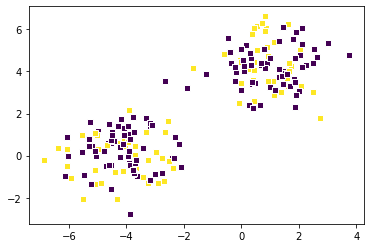

[1/2] loss is: 5.0491885804693043e-14


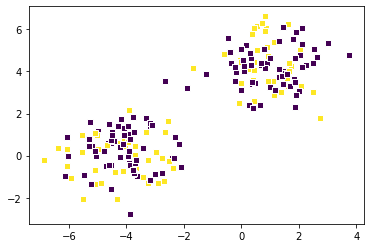

[1/2] loss is: 5.0491885804693043e-14


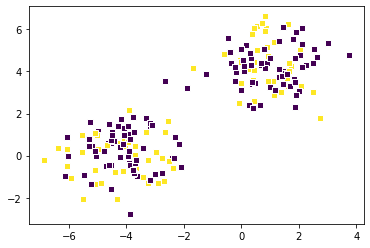

[1/2] loss is: 5.0491885804693043e-14


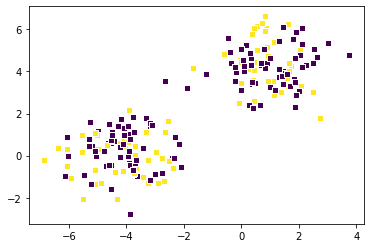

[1/2] loss is: 5.0491885804693043e-14


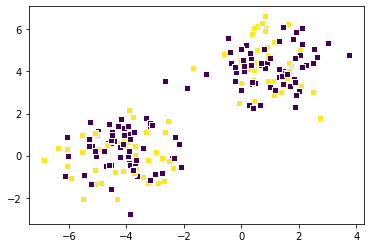

[1/2] loss is: 5.0491885804693043e-14


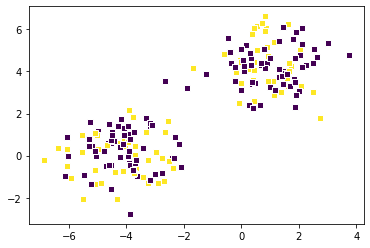

[1/2] loss is: 5.0491885804693043e-14


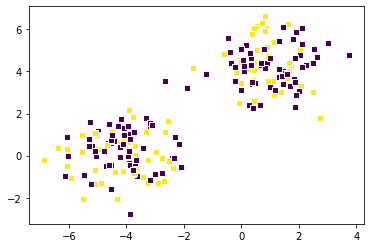

[1/2] loss is: 5.0491885804693043e-14


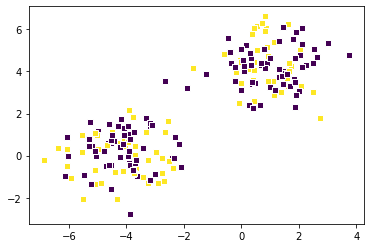

[1/2] loss is: 5.0491885804693043e-14


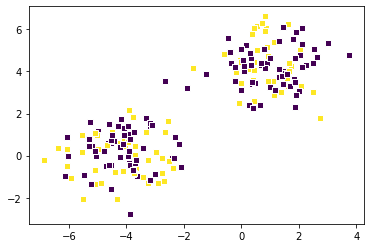

[1/2] loss is: 5.0491885804693043e-14


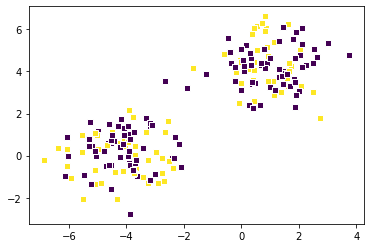

[1/2] loss is: 5.0491885804693043e-14


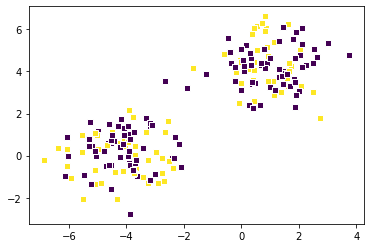

[1/2] loss is: 5.0491885804693043e-14


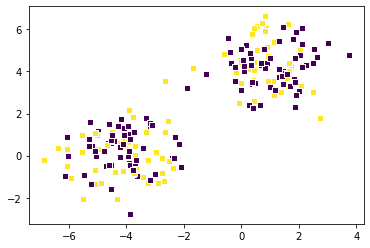

[1/2] loss is: 5.0491885804693043e-14


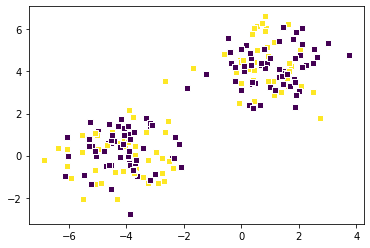

[1/2] loss is: 5.0491885804693043e-14


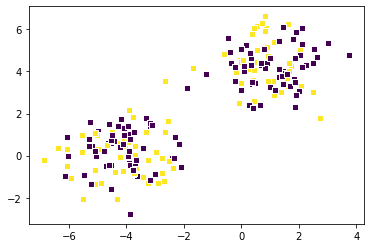

[1/2] loss is: 5.0491885804693043e-14


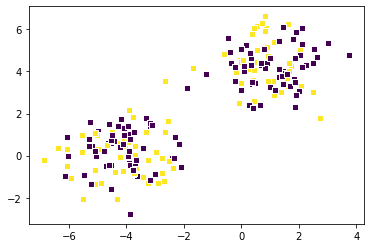

[1/2] loss is: 5.0491885804693043e-14


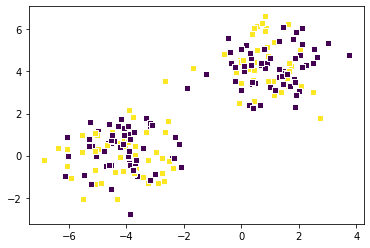

[1/2] loss is: 5.0491885804693043e-14


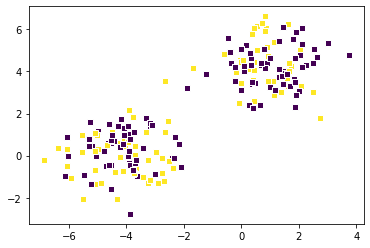

[1/2] loss is: 5.0491885804693043e-14


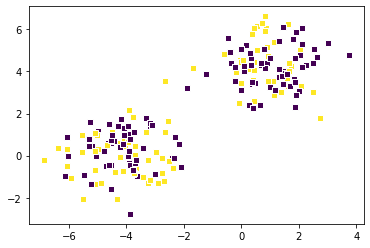

[1/2] loss is: 5.0491885804693043e-14


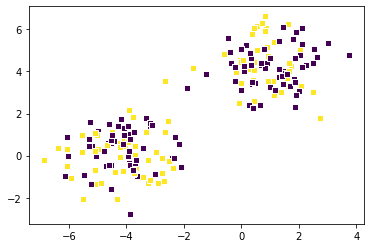

[1/2] loss is: 5.0491885804693043e-14


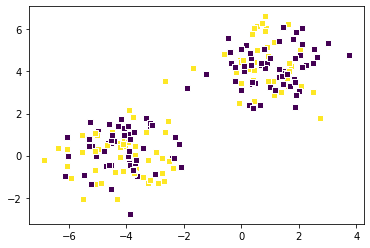

[1/2] loss is: 5.0491885804693043e-14


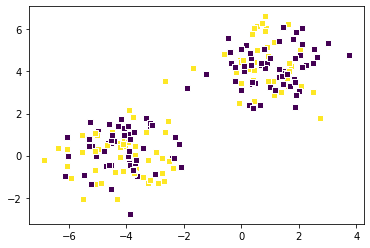

[1/2] loss is: 5.0491885804693043e-14


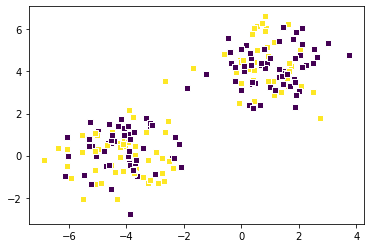

[1/2] loss is: 5.0491885804693043e-14


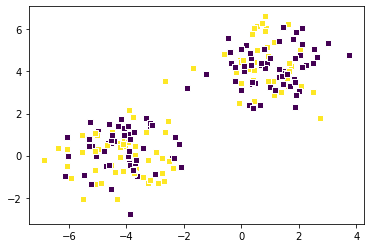

[1/2] loss is: 5.0491885804693043e-14


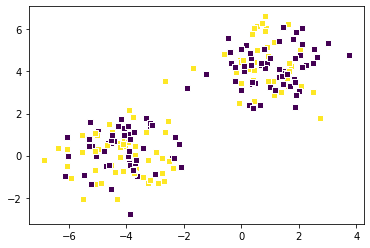

[1/2] loss is: 5.0491885804693043e-14


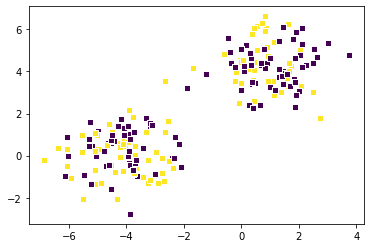

[1/2] loss is: 5.0491885804693043e-14


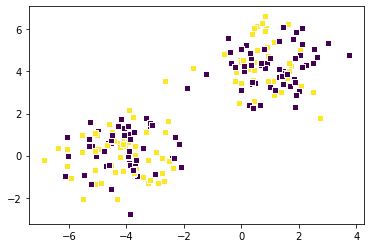

[1/2] loss is: 5.0491885804693043e-14


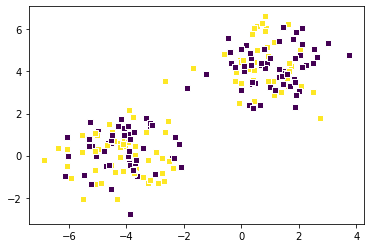

[1/2] loss is: 5.0491885804693043e-14


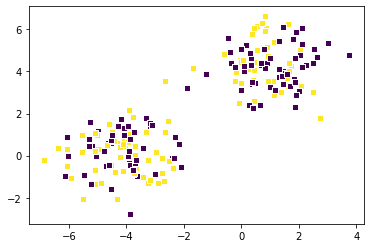

[1/2] loss is: 5.0491885804693043e-14


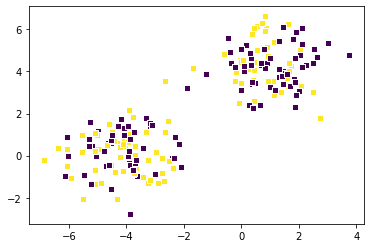

[1/2] loss is: 5.0491885804693043e-14


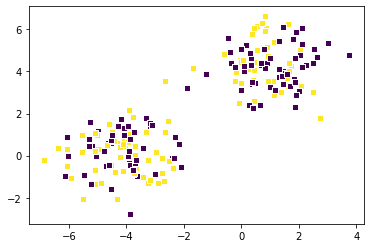

[1/2] loss is: 5.0491885804693043e-14


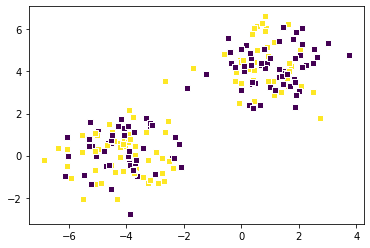

[1/2] loss is: 5.0491885804693043e-14


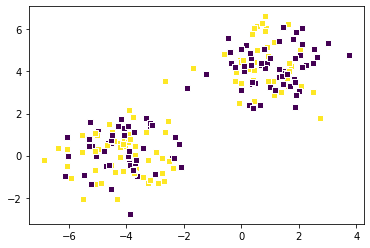

[1/2] loss is: 5.0491885804693043e-14


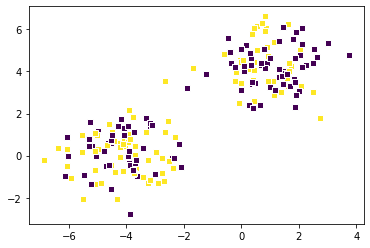

[1/2] loss is: 5.0491885804693043e-14


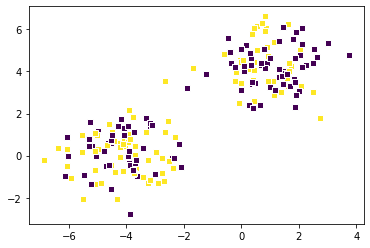

[1/2] loss is: 5.0491885804693043e-14


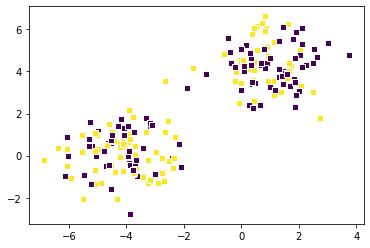

[1/2] loss is: 5.0491885804693043e-14


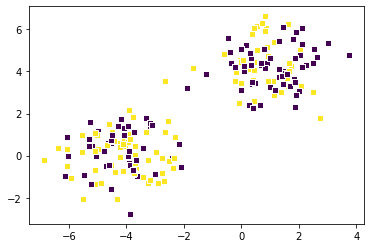

[1/2] loss is: 5.0491885804693043e-14


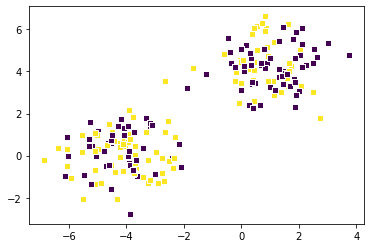

[1/2] loss is: 5.0491885804693043e-14


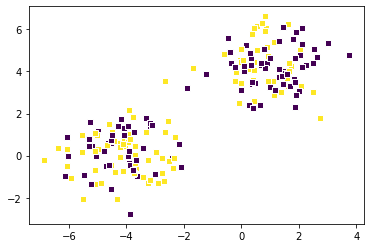

[1/2] loss is: 5.0491885804693043e-14


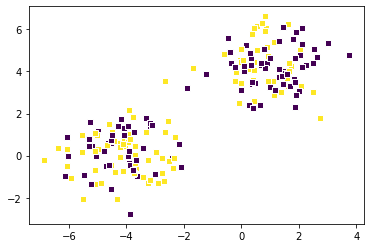

[1/2] loss is: 5.0491885804693043e-14


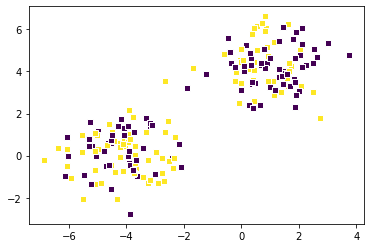

[1/2] loss is: 5.0491885804693043e-14


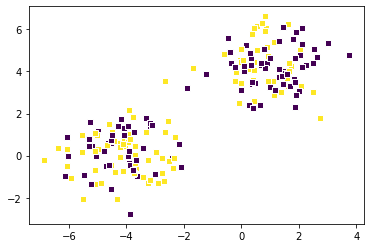

[1/2] loss is: 5.0491885804693043e-14


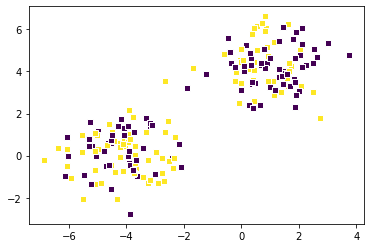

[1/2] loss is: 5.0491885804693043e-14


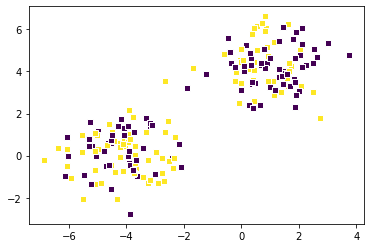

[1/2] loss is: 5.0491885804693043e-14


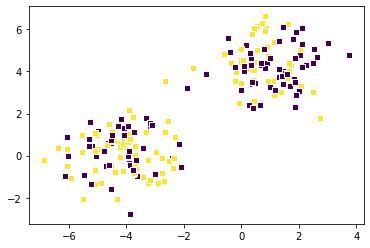

[1/2] loss is: 5.0491885804693043e-14


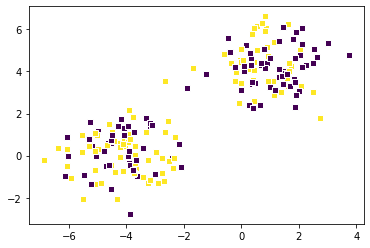

[1/2] loss is: 5.0491885804693043e-14


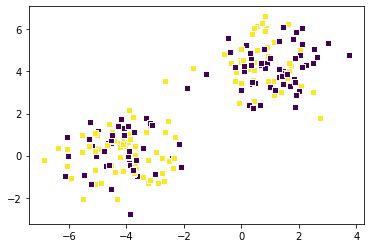

[1/2] loss is: 5.0491885804693043e-14


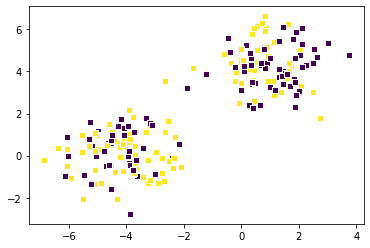

[1/2] loss is: 5.0491885804693043e-14


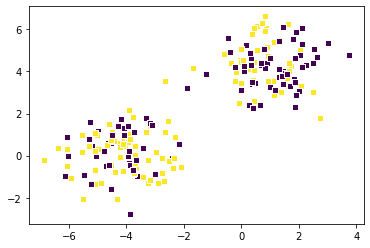

[1/2] loss is: 5.0491885804693043e-14


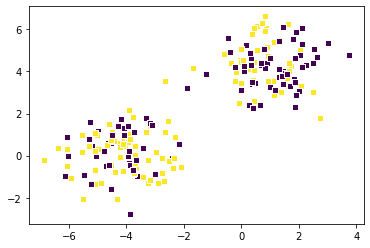

[1/2] loss is: 5.0491885804693043e-14


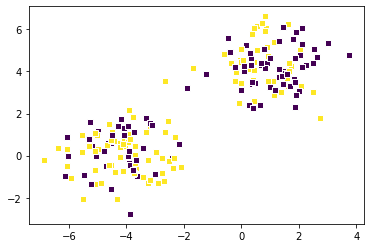

[1/2] loss is: 5.0491885804693043e-14


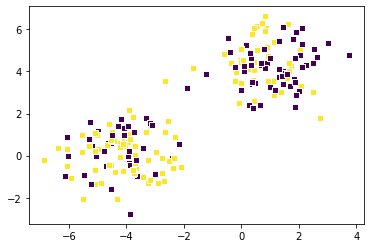

[1/2] loss is: 5.0491885804693043e-14


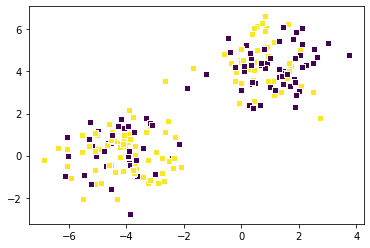

[1/2] loss is: 5.0491885804693043e-14


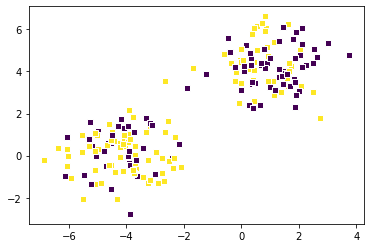

[1/2] loss is: 5.0491885804693043e-14


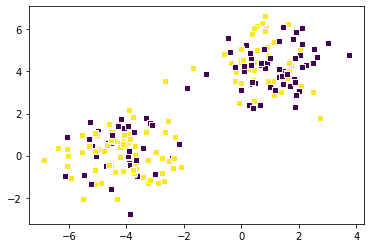

[1/2] loss is: 5.0491885804693043e-14


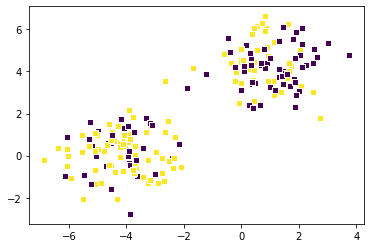

[1/2] loss is: 5.0491885804693043e-14


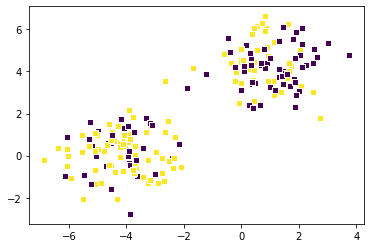

[1/2] loss is: 5.0491885804693043e-14


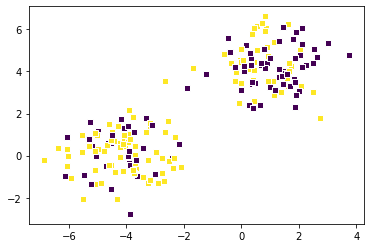

[1/2] loss is: 5.0491885804693043e-14


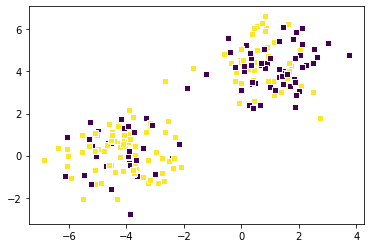

[1/2] loss is: 5.0491885804693043e-14


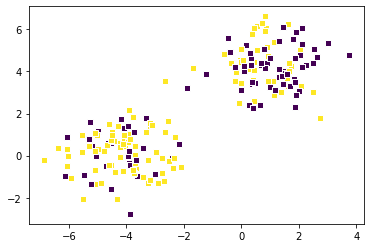

[1/2] loss is: 5.0491885804693043e-14


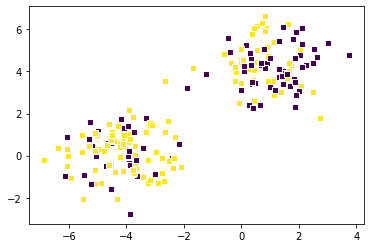

[1/2] loss is: 5.0491885804693043e-14


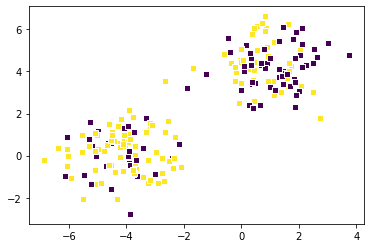

[1/2] loss is: 5.0491885804693043e-14


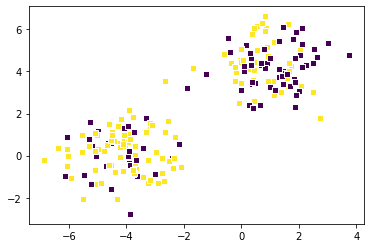

[1/2] loss is: 5.0491885804693043e-14


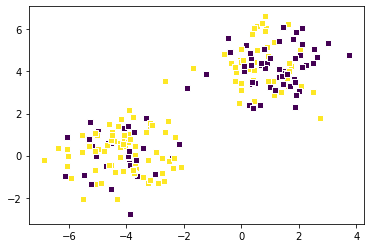

[1/2] loss is: 5.0491885804693043e-14


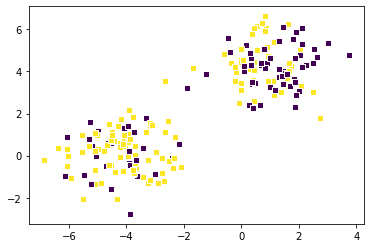

[1/2] loss is: 5.0491885804693043e-14


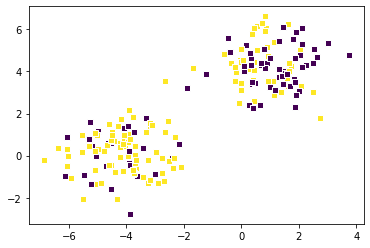

[1/2] loss is: 5.0491885804693043e-14


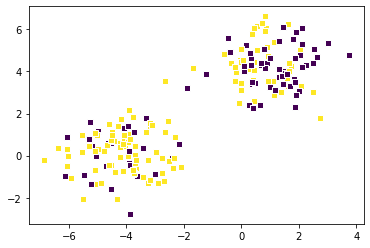

[1/2] loss is: 5.0491885804693043e-14


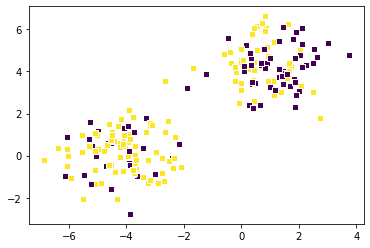

[1/2] loss is: 5.0491885804693043e-14


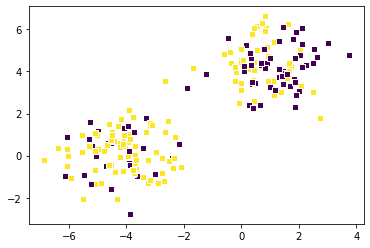

[1/2] loss is: 5.0491885804693043e-14


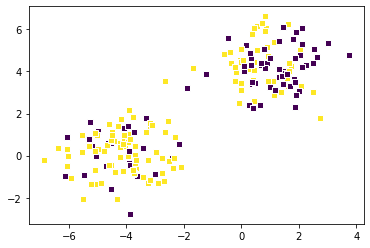

[1/2] loss is: 5.0491885804693043e-14


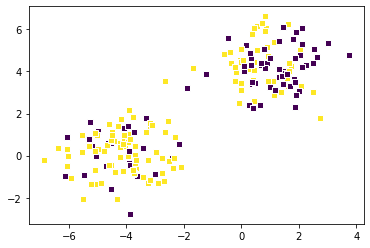

[1/2] loss is: 5.0491885804693043e-14


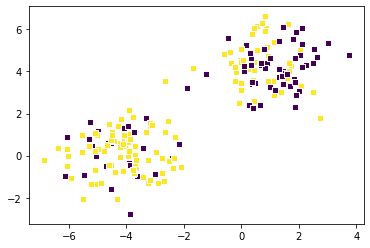

[1/2] loss is: 5.0491885804693043e-14


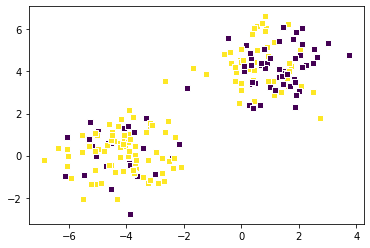

[1/2] loss is: 5.0491885804693043e-14


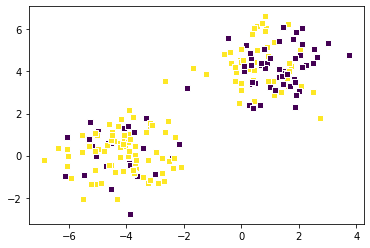

[2/2] loss is: 5.0491885804693043e-14


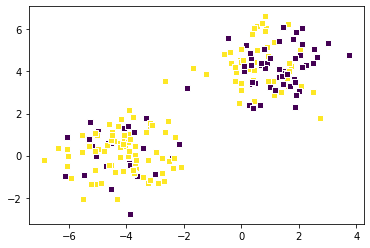

[2/2] loss is: 5.0491885804693043e-14


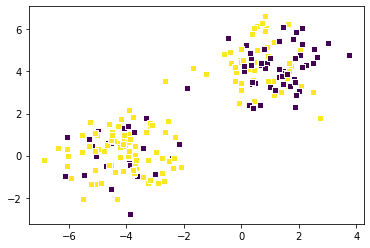

[2/2] loss is: 5.0491885804693043e-14


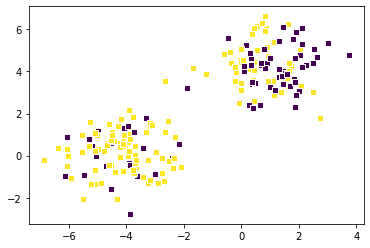

[2/2] loss is: 5.0491885804693043e-14


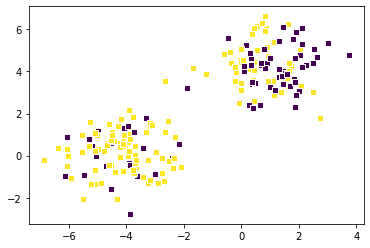

[2/2] loss is: 5.0491885804693043e-14


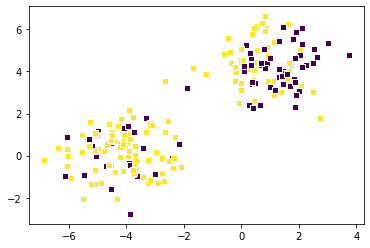

[2/2] loss is: 5.0491885804693043e-14


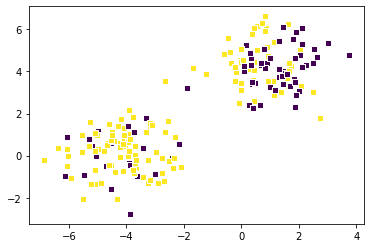

[2/2] loss is: 5.0491885804693043e-14


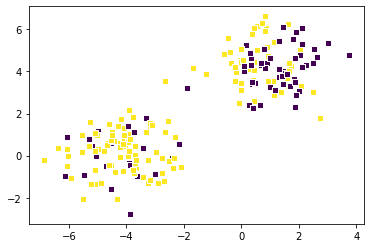

[2/2] loss is: 5.0491885804693043e-14


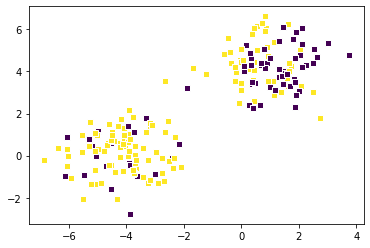

[2/2] loss is: 5.0491885804693043e-14


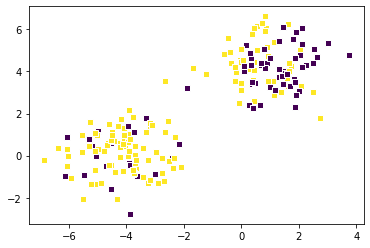

[2/2] loss is: 5.0491885804693043e-14


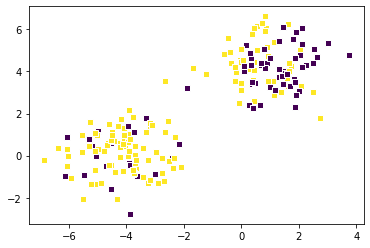

[2/2] loss is: 5.0491885804693043e-14


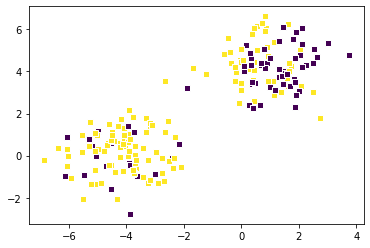

[2/2] loss is: 5.0491885804693043e-14


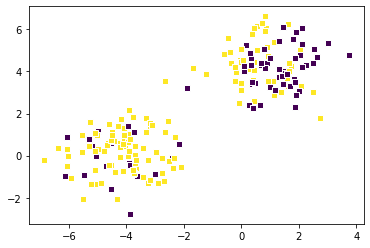

[2/2] loss is: 5.0491885804693043e-14


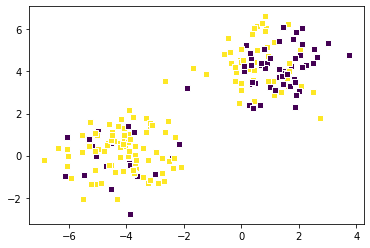

[2/2] loss is: 5.0491885804693043e-14


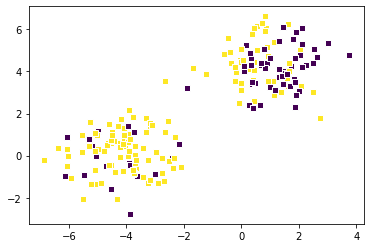

[2/2] loss is: 5.0491885804693043e-14


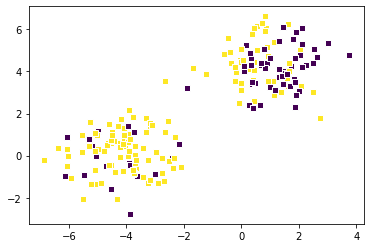

[2/2] loss is: 5.0491885804693043e-14


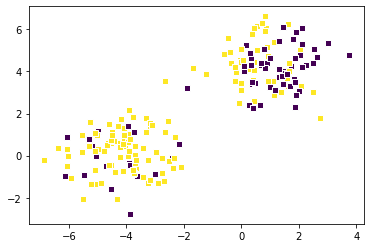

[2/2] loss is: 5.0491885804693043e-14


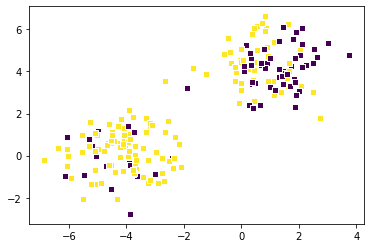

[2/2] loss is: 5.0491885804693043e-14


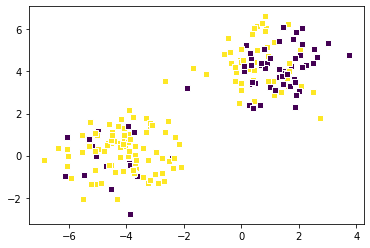

[2/2] loss is: 5.0491885804693043e-14


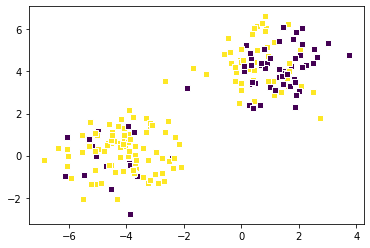

[2/2] loss is: 5.0491885804693043e-14


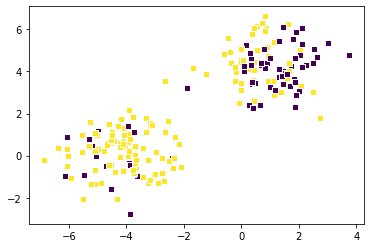

[2/2] loss is: 5.0491885804693043e-14


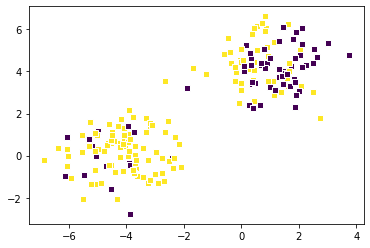

[2/2] loss is: 5.0491885804693043e-14


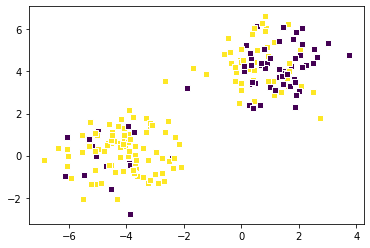

[2/2] loss is: 5.0491885804693043e-14


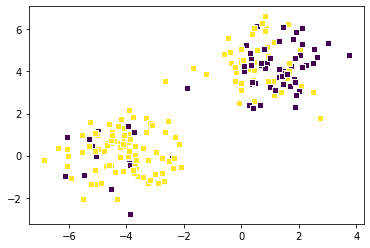

[2/2] loss is: 5.0491885804693043e-14


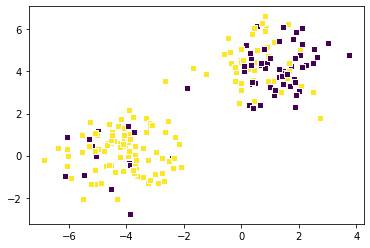

[2/2] loss is: 5.0491885804693043e-14


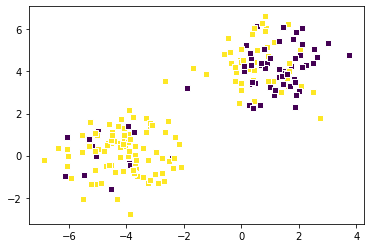

[2/2] loss is: 5.0491885804693043e-14


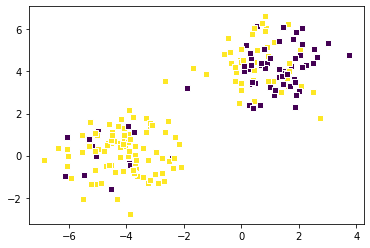

[2/2] loss is: 5.0491885804693043e-14


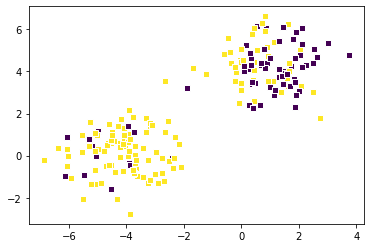

[2/2] loss is: 5.0491885804693043e-14


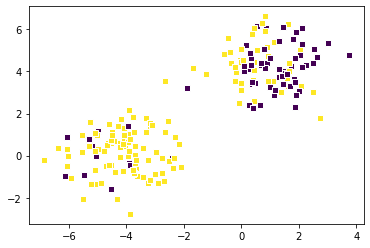

[2/2] loss is: 5.0491885804693043e-14


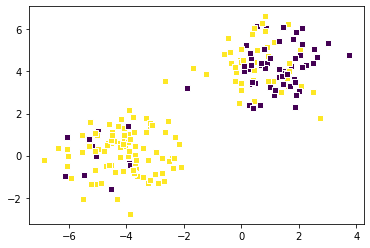

[2/2] loss is: 5.0491885804693043e-14


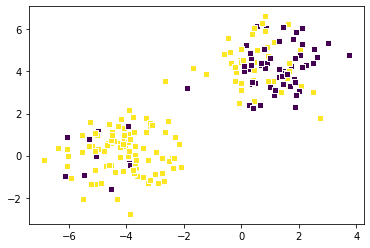

[2/2] loss is: 5.0491885804693043e-14


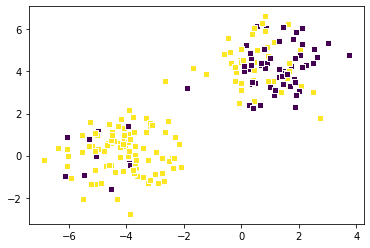

[2/2] loss is: 5.0491885804693043e-14


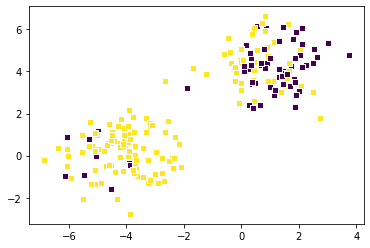

[2/2] loss is: 5.0491885804693043e-14


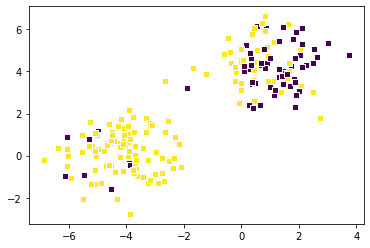

[2/2] loss is: 5.0491885804693043e-14


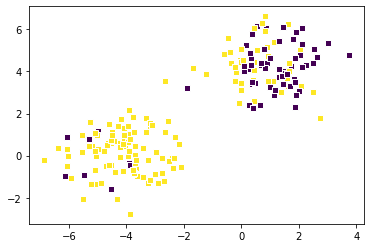

[2/2] loss is: 5.0491885804693043e-14


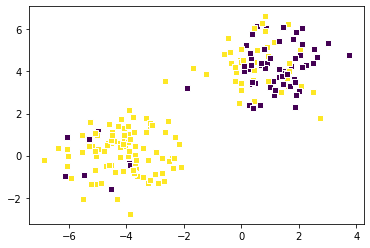

[2/2] loss is: 5.0491885804693043e-14


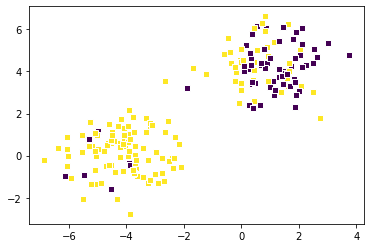

[2/2] loss is: 5.0491885804693043e-14


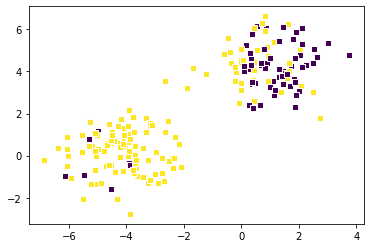

[2/2] loss is: 5.0491885804693043e-14


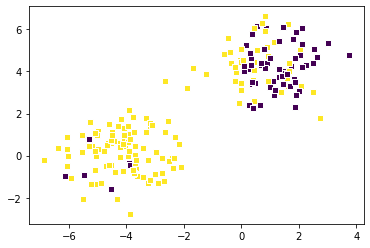

[2/2] loss is: 5.0491885804693043e-14


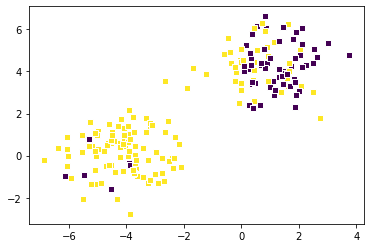

[2/2] loss is: 5.0491885804693043e-14


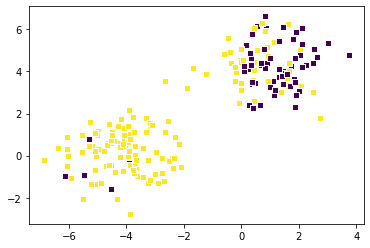

[2/2] loss is: 5.0491885804693043e-14


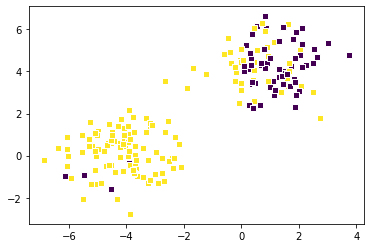

[2/2] loss is: 5.0491885804693043e-14


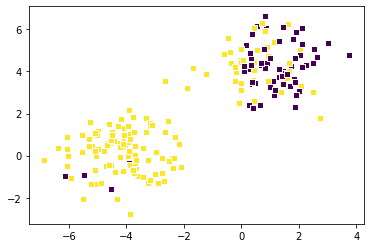

[2/2] loss is: 5.0491885804693043e-14


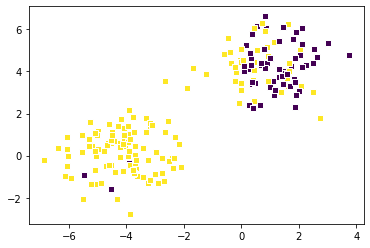

[2/2] loss is: 5.0491885804693043e-14


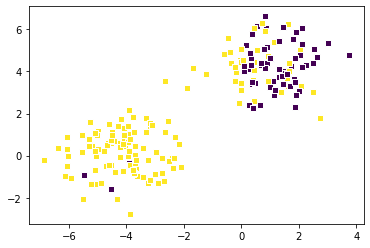

[2/2] loss is: 5.0491885804693043e-14


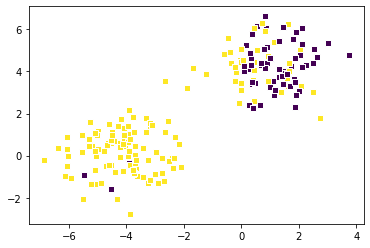

[2/2] loss is: 5.0491885804693043e-14


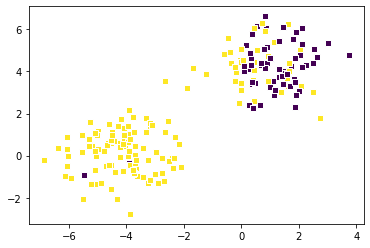

[2/2] loss is: 5.0491885804693043e-14


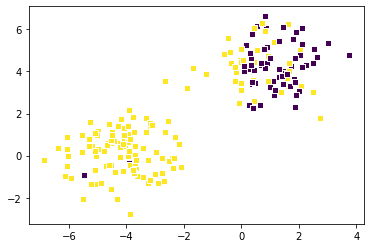

[2/2] loss is: 5.0491885804693043e-14


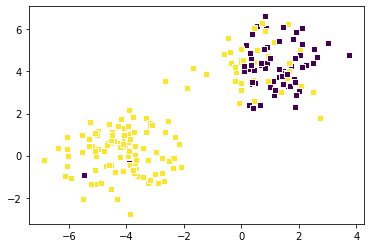

[2/2] loss is: 5.0491885804693043e-14


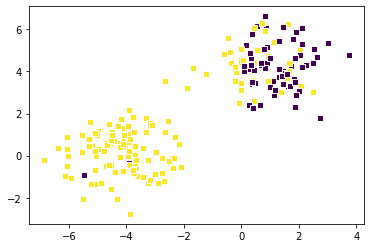

[2/2] loss is: 5.0491885804693043e-14


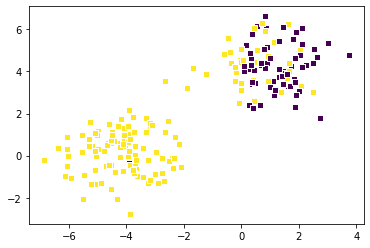

[2/2] loss is: 5.0491885804693043e-14


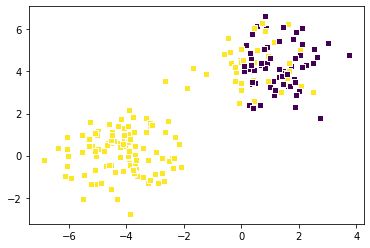

[2/2] loss is: 5.0491885804693043e-14


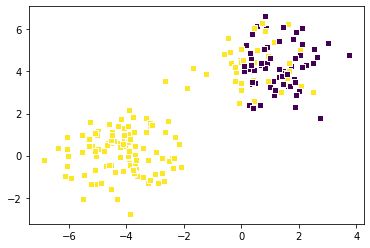

[2/2] loss is: 5.0491885804693043e-14


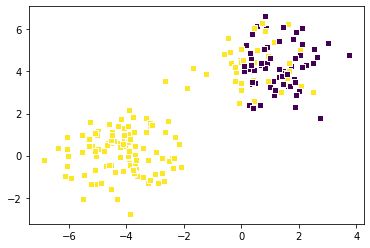

[2/2] loss is: 5.0491885804693043e-14


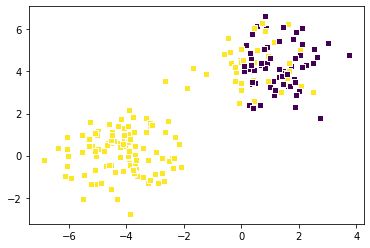

[2/2] loss is: 5.0491885804693043e-14


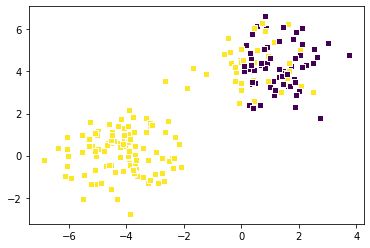

[2/2] loss is: 5.0491885804693043e-14


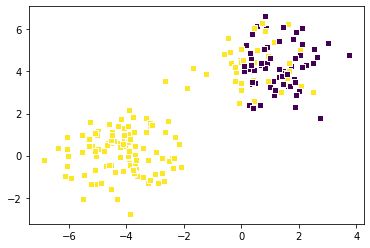

[2/2] loss is: 5.0491885804693043e-14


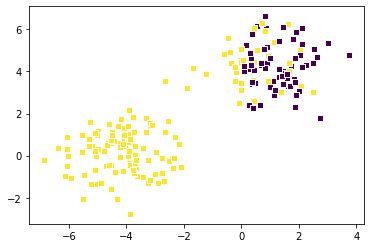

[2/2] loss is: 5.0491885804693043e-14


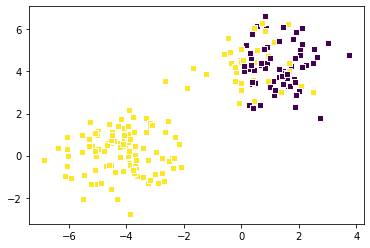

[2/2] loss is: 5.0491885804693043e-14


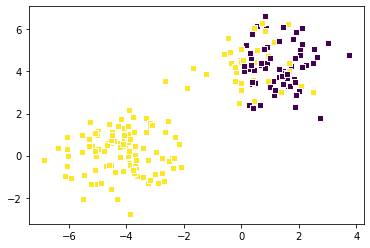

[2/2] loss is: 5.0491885804693043e-14


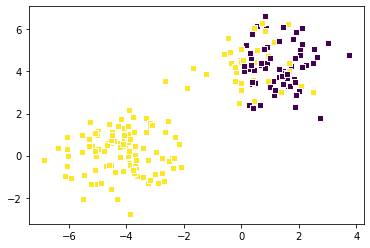

[2/2] loss is: 5.0491885804693043e-14


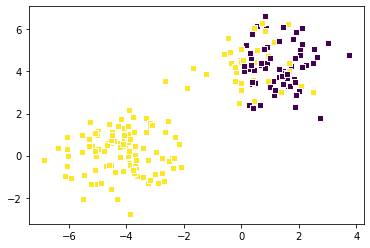

[2/2] loss is: 5.0491885804693043e-14


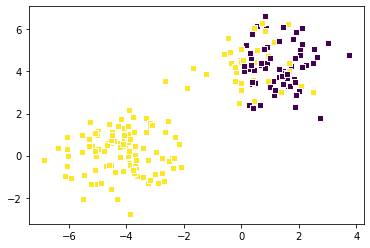

[2/2] loss is: 5.0491885804693043e-14


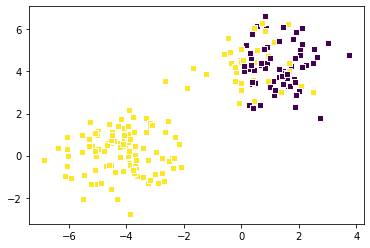

[2/2] loss is: 5.0491885804693043e-14


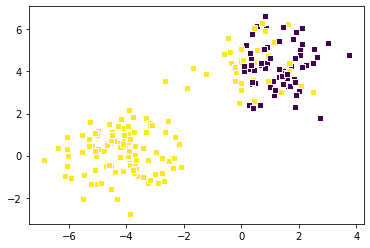

[2/2] loss is: 5.0491885804693043e-14


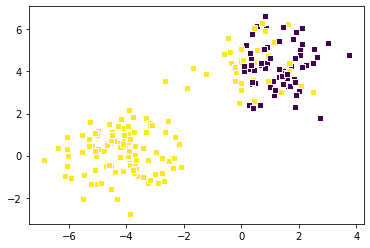

[2/2] loss is: 5.0491885804693043e-14


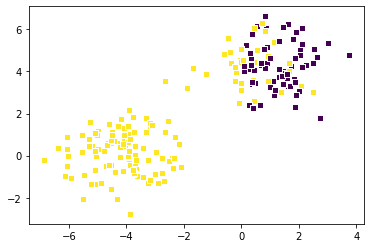

[2/2] loss is: 5.0491885804693043e-14


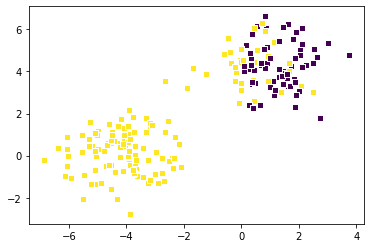

[2/2] loss is: 5.0491885804693043e-14


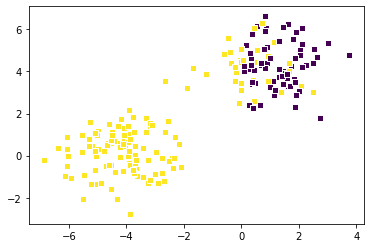

[2/2] loss is: 5.0491885804693043e-14


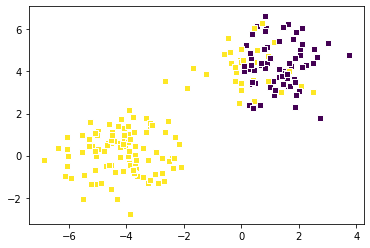

[2/2] loss is: 5.0491885804693043e-14


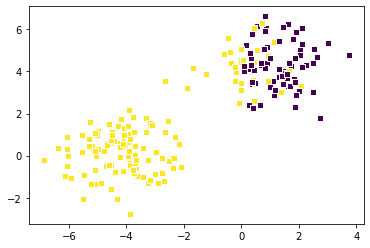

[2/2] loss is: 5.0491885804693043e-14


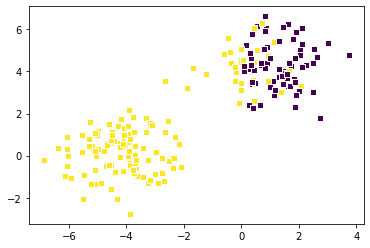

[2/2] loss is: 5.0491885804693043e-14


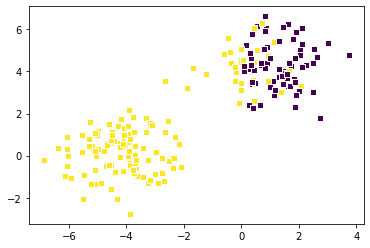

[2/2] loss is: 5.0491885804693043e-14


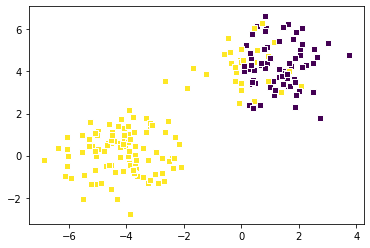

[2/2] loss is: 5.0491885804693043e-14


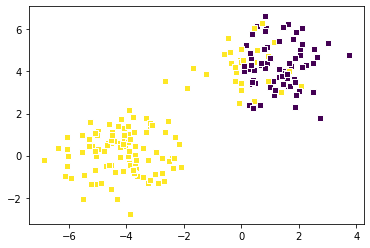

[2/2] loss is: 5.0491885804693043e-14


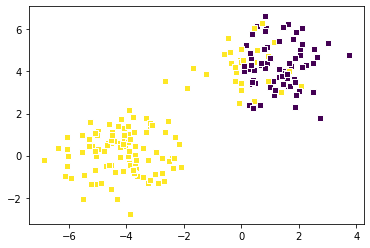

[2/2] loss is: 5.0491885804693043e-14


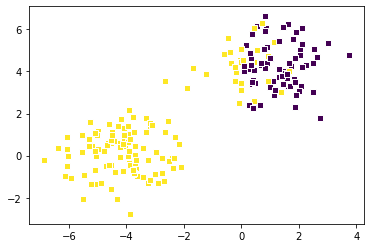

[2/2] loss is: 5.0491885804693043e-14


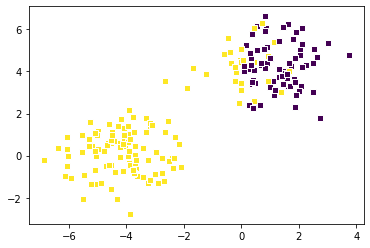

[2/2] loss is: 5.0491885804693043e-14


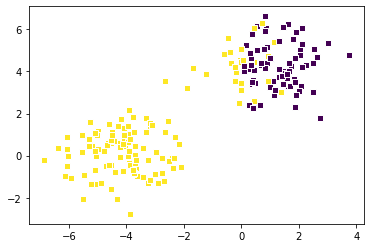

[2/2] loss is: 5.0491885804693043e-14


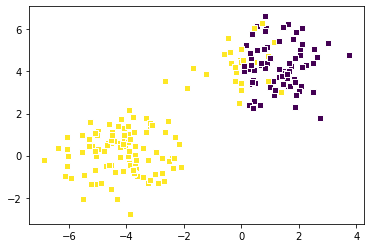

[2/2] loss is: 5.0491885804693043e-14


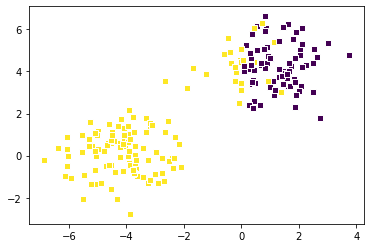

[2/2] loss is: 5.0491885804693043e-14


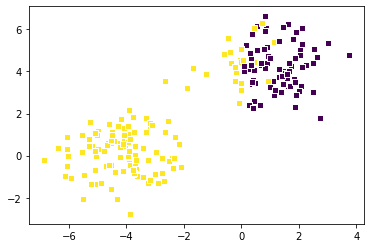

[2/2] loss is: 5.0491885804693043e-14


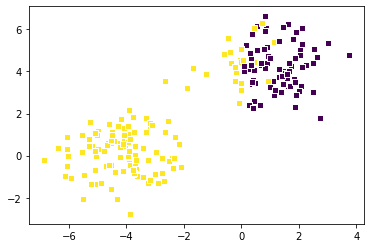

[2/2] loss is: 5.0491885804693043e-14


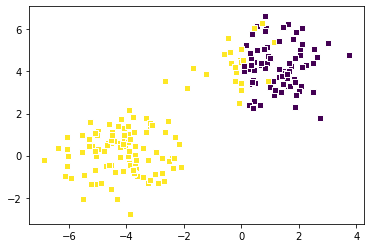

[2/2] loss is: 5.0491885804693043e-14


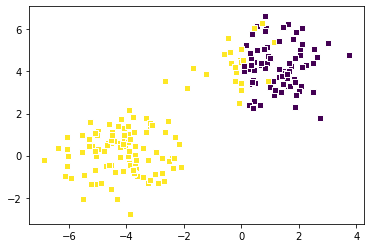

[2/2] loss is: 5.0491885804693043e-14


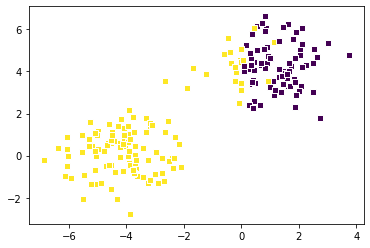

[2/2] loss is: 5.0491885804693043e-14


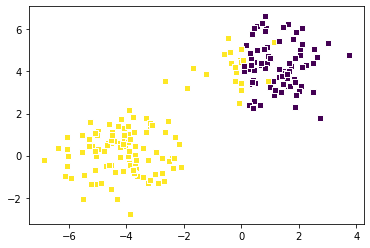

[2/2] loss is: 5.0491885804693043e-14


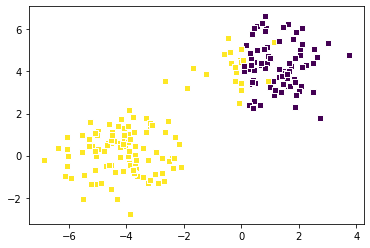

[2/2] loss is: 5.0491885804693043e-14


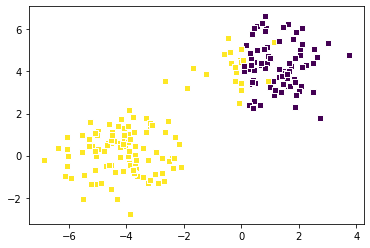

[2/2] loss is: 5.0491885804693043e-14


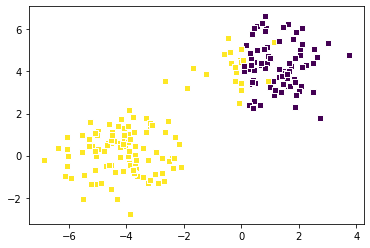

[2/2] loss is: 5.0491885804693043e-14


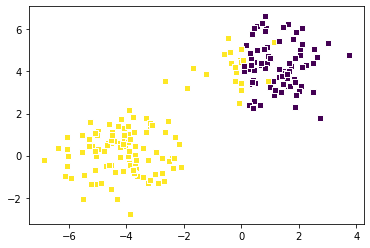

[2/2] loss is: 5.0491885804693043e-14


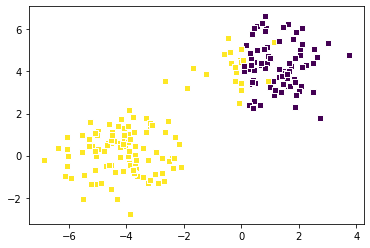

[2/2] loss is: 5.0491885804693043e-14


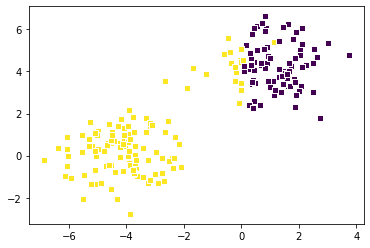

[2/2] loss is: 5.0491885804693043e-14


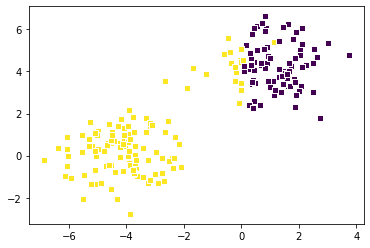

[2/2] loss is: 5.0491885804693043e-14


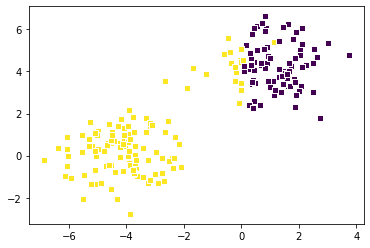

[2/2] loss is: 5.0491885804693043e-14


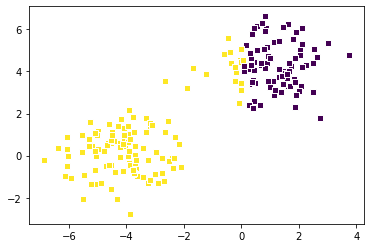

[2/2] loss is: 5.0491885804693043e-14


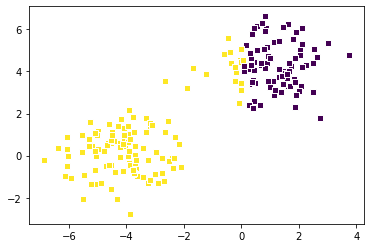

[2/2] loss is: 5.0491885804693043e-14


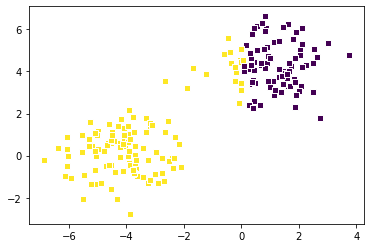

[2/2] loss is: 5.0491885804693043e-14


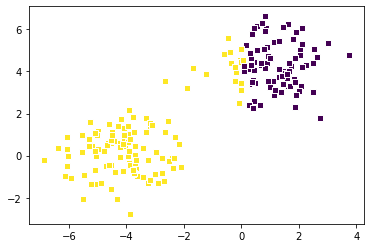

[2/2] loss is: 5.0491885804693043e-14


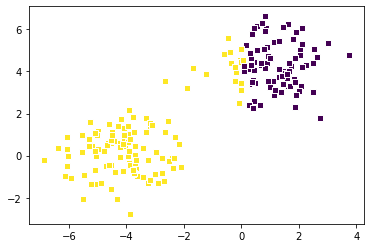

[2/2] loss is: 5.0491885804693043e-14


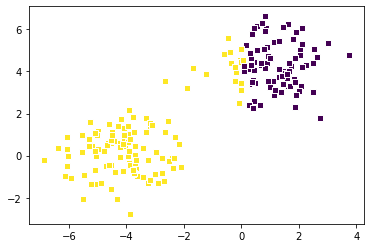

[2/2] loss is: 5.0491885804693043e-14


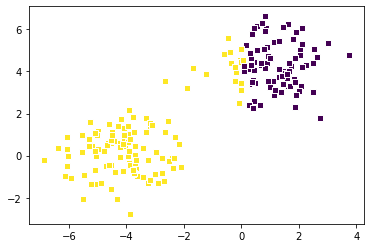

[2/2] loss is: 5.0491885804693043e-14


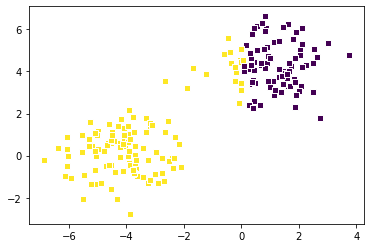

[2/2] loss is: 5.0491885804693043e-14


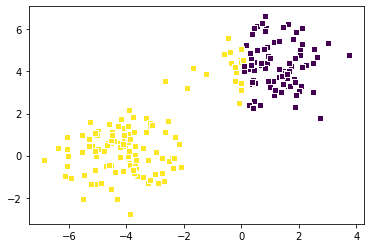

[2/2] loss is: 5.0491885804693043e-14


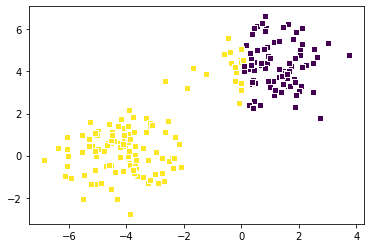

[2/2] loss is: 5.0491885804693043e-14


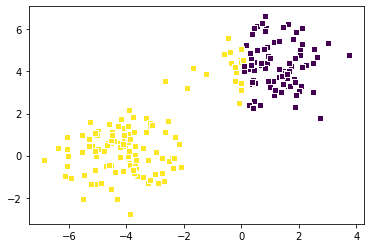

[2/2] loss is: 5.0491885804693043e-14


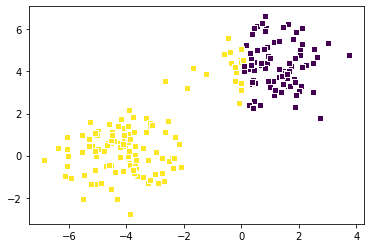

[2/2] loss is: 5.0491885804693043e-14


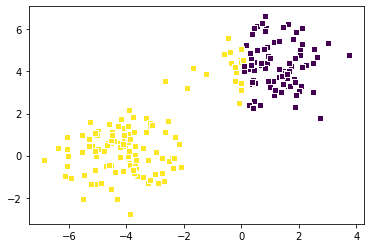

[2/2] loss is: 5.0491885804693043e-14


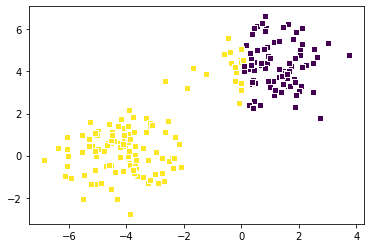

[2/2] loss is: 5.0491885804693043e-14


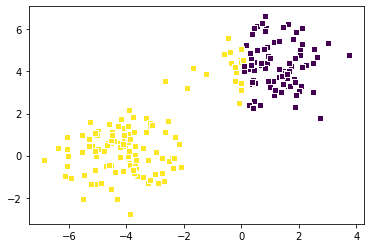

[2/2] loss is: 5.0491885804693043e-14


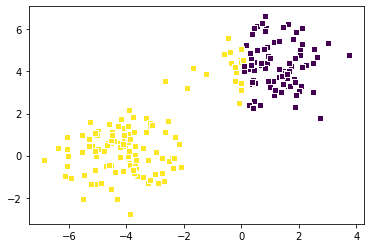

[2/2] loss is: 5.0491885804693043e-14


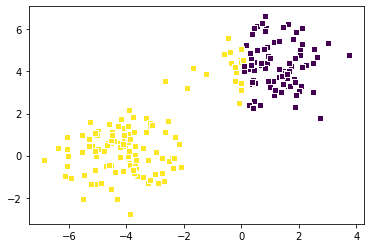

[2/2] loss is: 5.0491885804693043e-14


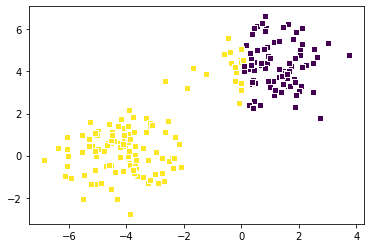

[2/2] loss is: 5.0491885804693043e-14


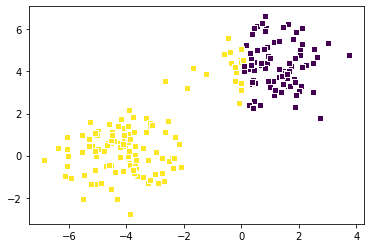

[2/2] loss is: 5.0491885804693043e-14


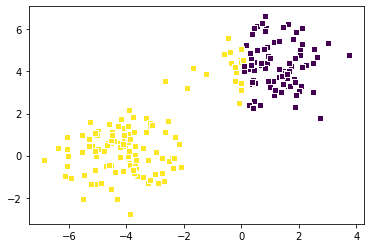

[2/2] loss is: 5.0491885804693043e-14


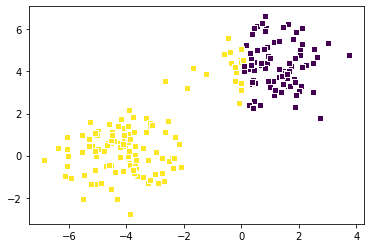

[2/2] loss is: 5.0491885804693043e-14


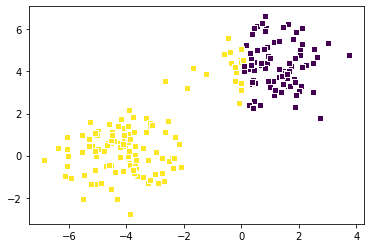

[2/2] loss is: 5.0491885804693043e-14


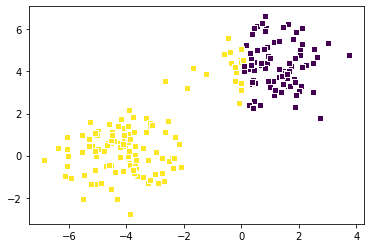

[2/2] loss is: 5.0491885804693043e-14


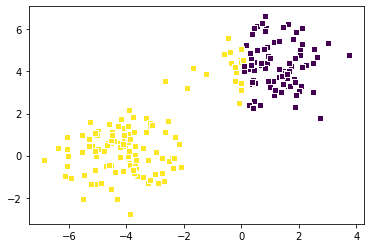

[2/2] loss is: 5.0491885804693043e-14


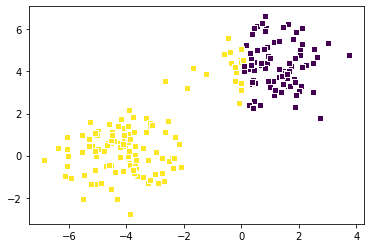

[2/2] loss is: 5.0491885804693043e-14


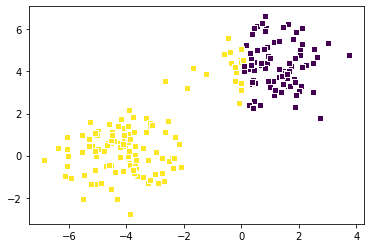

[2/2] loss is: 5.0491885804693043e-14


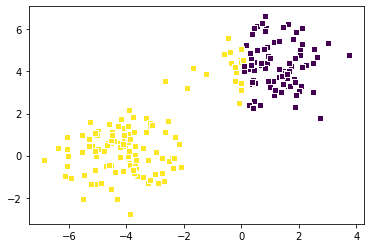

[2/2] loss is: 5.0491885804693043e-14


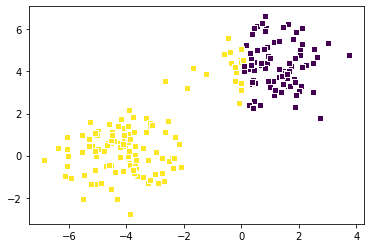

[2/2] loss is: 5.0491885804693043e-14


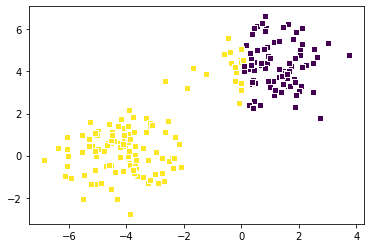

[2/2] loss is: 5.0491885804693043e-14


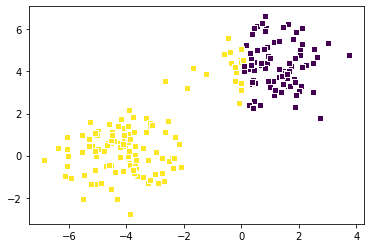

[2/2] loss is: 5.0491885804693043e-14


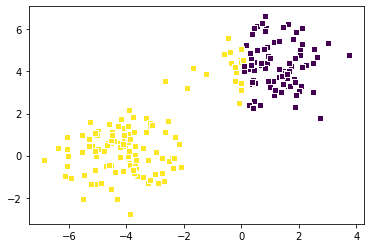

[2/2] loss is: 5.0491885804693043e-14


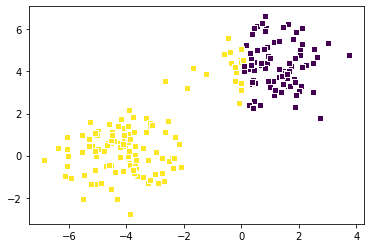

[2/2] loss is: 5.0491885804693043e-14


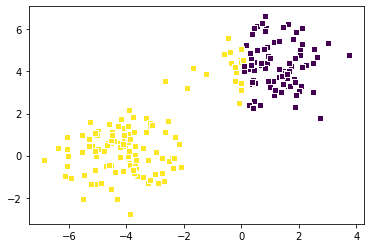

[2/2] loss is: 5.0491885804693043e-14


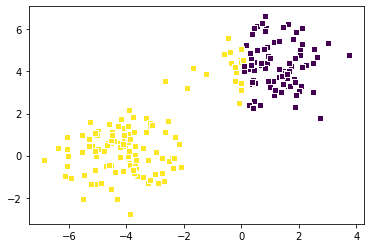

[2/2] loss is: 5.0491885804693043e-14


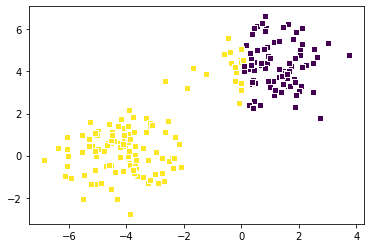

[2/2] loss is: 5.0491885804693043e-14


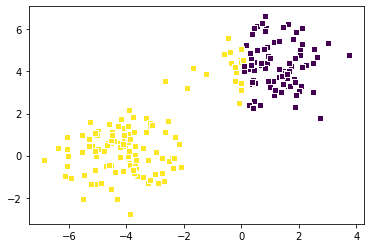

[2/2] loss is: 5.0491885804693043e-14


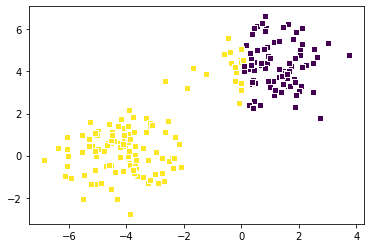

[2/2] loss is: 5.0491885804693043e-14


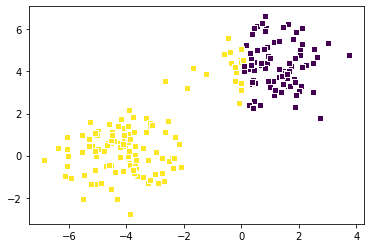

[2/2] loss is: 5.0491885804693043e-14


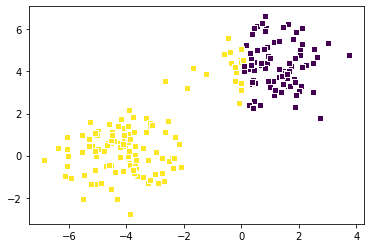

[2/2] loss is: 5.0491885804693043e-14


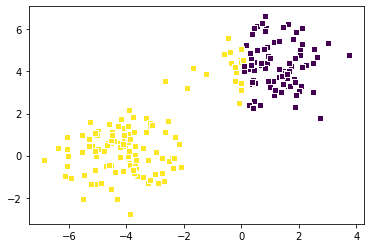

[2/2] loss is: 5.0491885804693043e-14


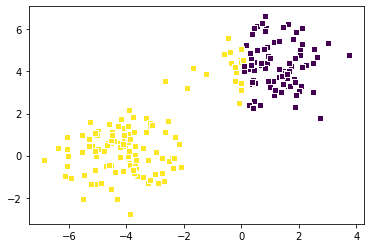

[2/2] loss is: 5.0491885804693043e-14


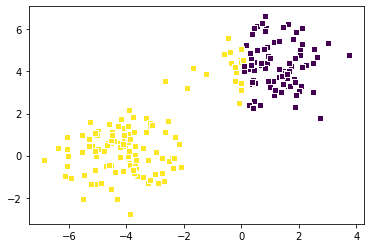

[2/2] loss is: 5.0491885804693043e-14


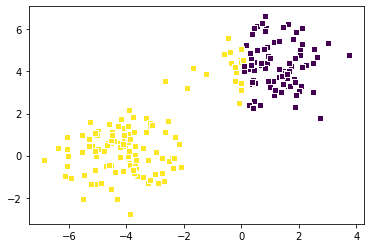

[2/2] loss is: 5.0491885804693043e-14


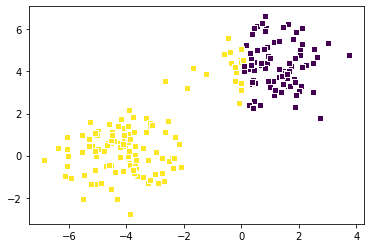

[2/2] loss is: 5.0491885804693043e-14


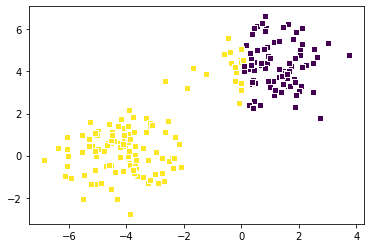

[2/2] loss is: 5.0491885804693043e-14


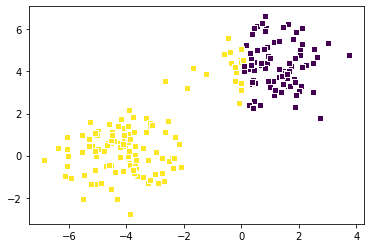

[2/2] loss is: 5.0491885804693043e-14


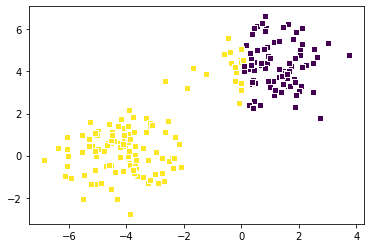

[2/2] loss is: 5.0491885804693043e-14


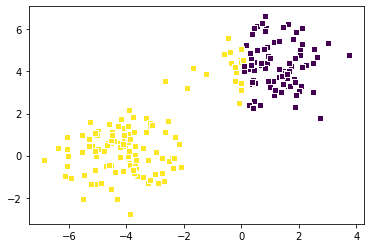

[2/2] loss is: 5.0491885804693043e-14


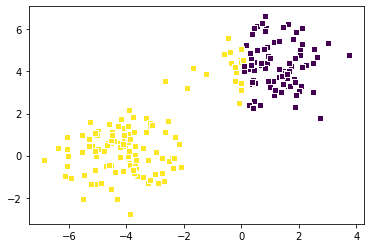

[2/2] loss is: 5.0491885804693043e-14


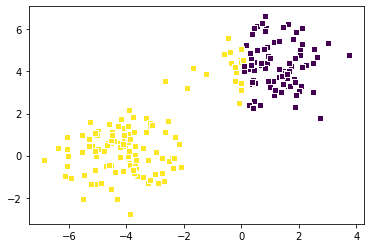

[2/2] loss is: 5.0491885804693043e-14


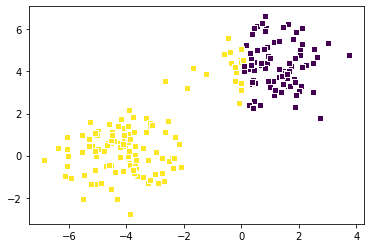

[2/2] loss is: 5.0491885804693043e-14


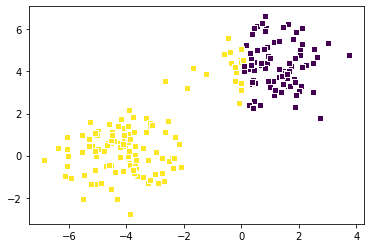

[2/2] loss is: 5.0491885804693043e-14


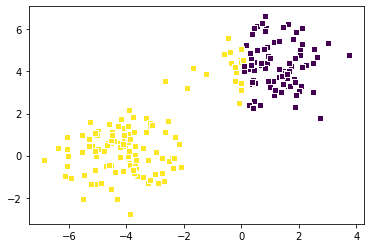

[2/2] loss is: 5.0491885804693043e-14


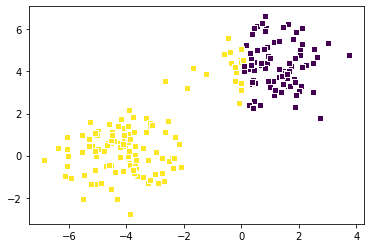

[2/2] loss is: 5.0491885804693043e-14


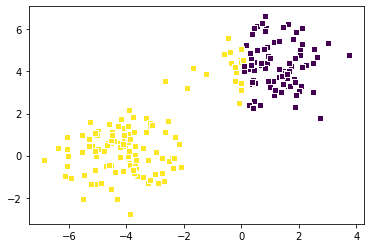

[2/2] loss is: 5.0491885804693043e-14


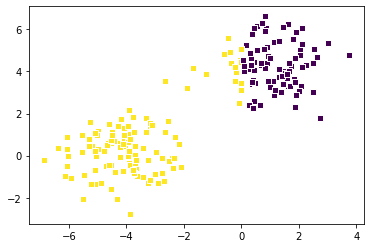

[2/2] loss is: 5.0491885804693043e-14


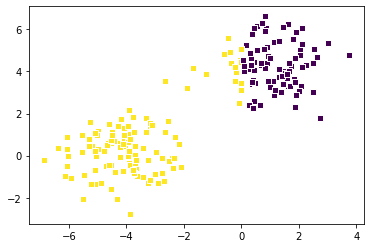

[2/2] loss is: 5.0491885804693043e-14


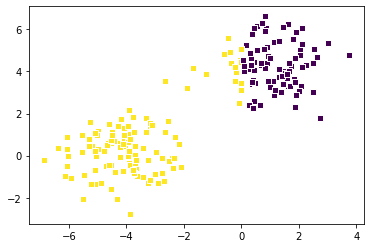

[2/2] loss is: 5.0491885804693043e-14


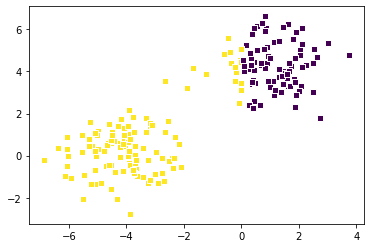

[2/2] loss is: 5.0491885804693043e-14


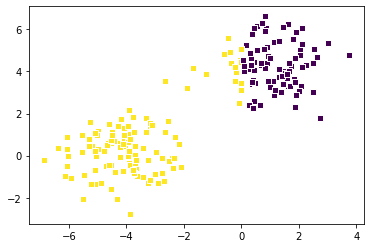

[2/2] loss is: 5.0491885804693043e-14


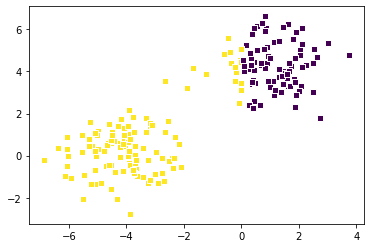

[2/2] loss is: 5.0491885804693043e-14


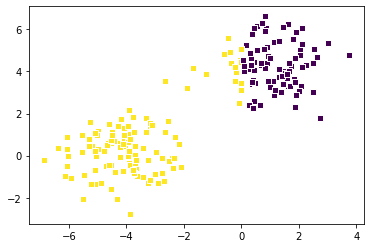

[2/2] loss is: 5.0491885804693043e-14


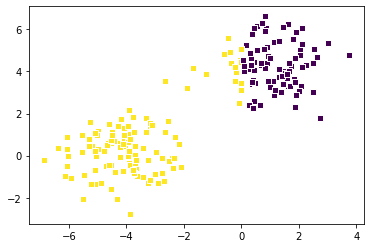

[2/2] loss is: 5.0491885804693043e-14


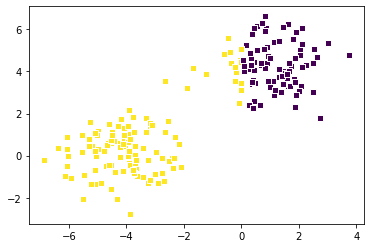

[2/2] loss is: 5.0491885804693043e-14


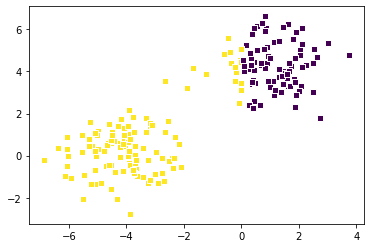

[2/2] loss is: 5.0491885804693043e-14


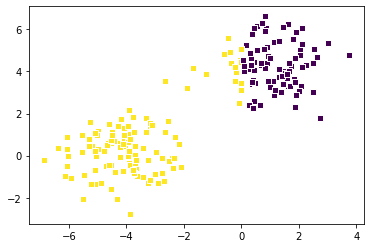

[2/2] loss is: 5.0491885804693043e-14


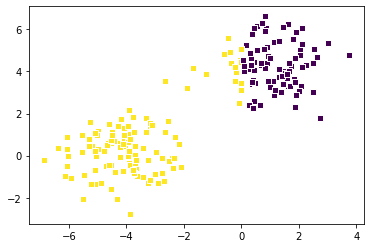

[2/2] loss is: 5.0491885804693043e-14


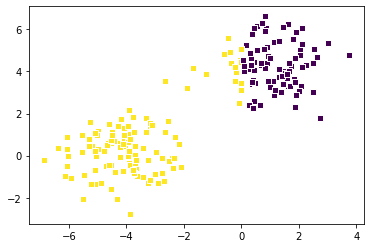

[2/2] loss is: 5.0491885804693043e-14


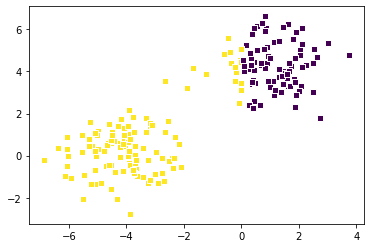

[2/2] loss is: 5.0491885804693043e-14


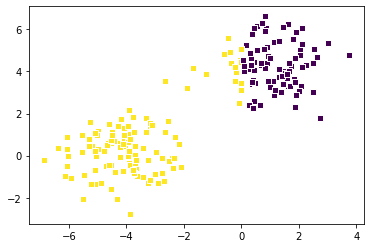

[2/2] loss is: 5.0491885804693043e-14


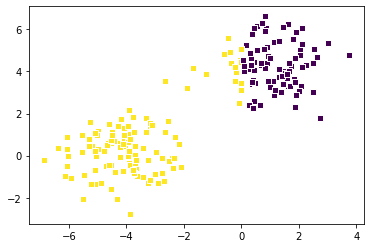

[2/2] loss is: 5.0491885804693043e-14


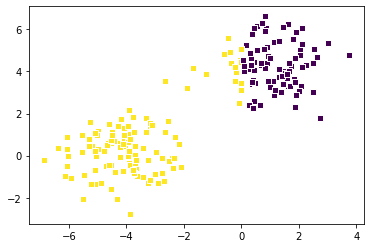

[2/2] loss is: 5.0491885804693043e-14


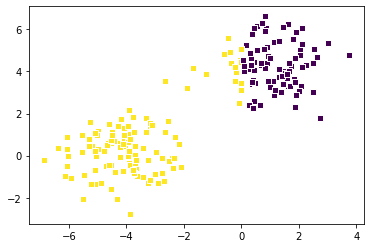

[2/2] loss is: 5.0491885804693043e-14


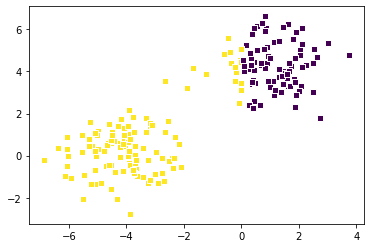

[2/2] loss is: 5.0491885804693043e-14


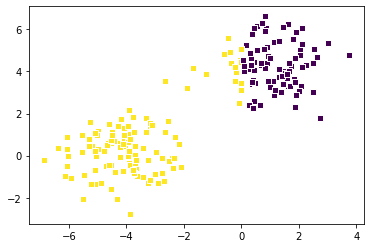

[2/2] loss is: 5.0491885804693043e-14


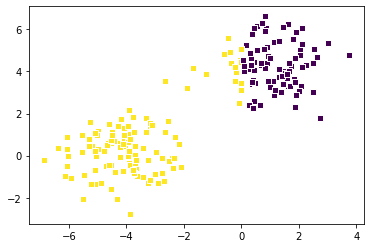

[2/2] loss is: 5.0491885804693043e-14


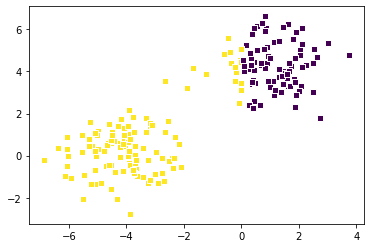

[2/2] loss is: 5.0491885804693043e-14


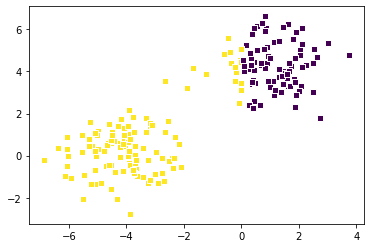

[2/2] loss is: 5.0491885804693043e-14


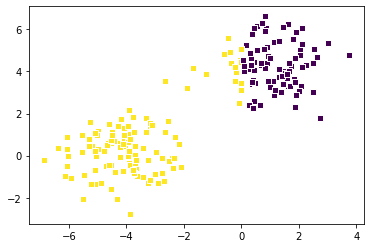

[2/2] loss is: 5.0491885804693043e-14


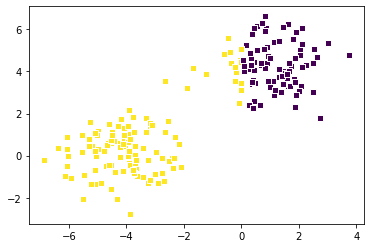

[2/2] loss is: 5.0491885804693043e-14


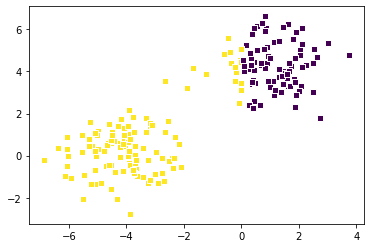

[2/2] loss is: 5.0491885804693043e-14


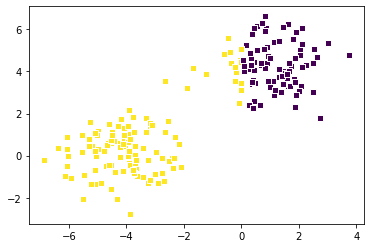

[2/2] loss is: 5.0491885804693043e-14


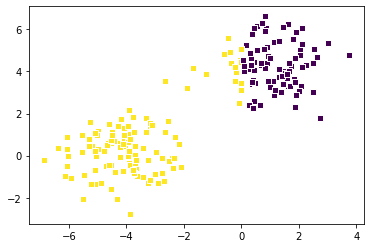

[2/2] loss is: 5.0491885804693043e-14


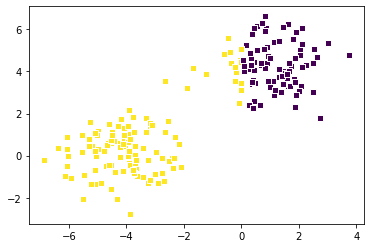

[2/2] loss is: 5.0491885804693043e-14


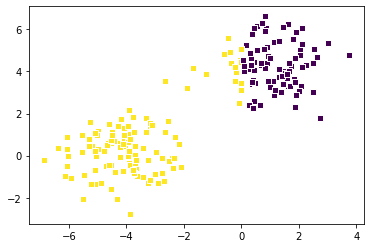

[2/2] loss is: 5.0491885804693043e-14


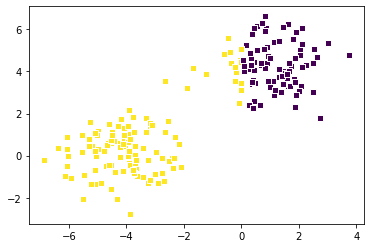

[2/2] loss is: 5.0491885804693043e-14


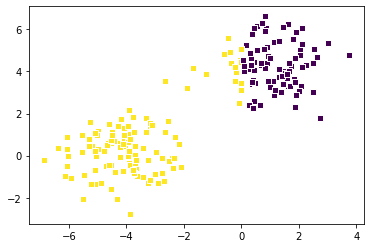

[2/2] loss is: 5.0491885804693043e-14


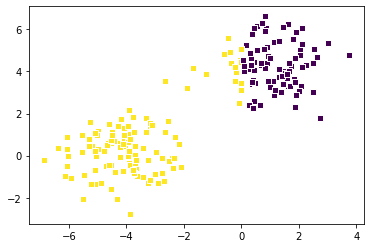

[2/2] loss is: 5.0491885804693043e-14


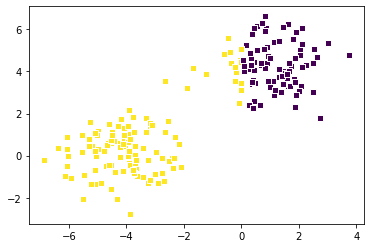

[2/2] loss is: 5.0491885804693043e-14


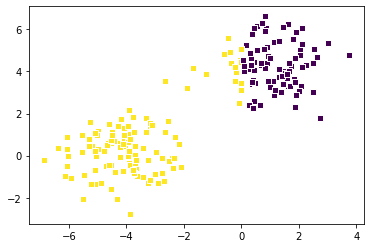

[2/2] loss is: 5.0491885804693043e-14


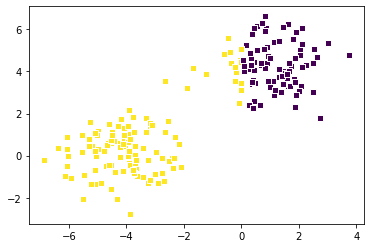

[2/2] loss is: 5.0491885804693043e-14


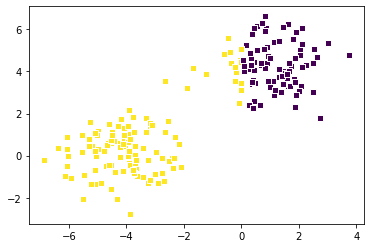

[2/2] loss is: 5.0491885804693043e-14


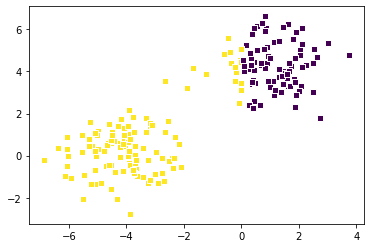

[2/2] loss is: 5.0491885804693043e-14


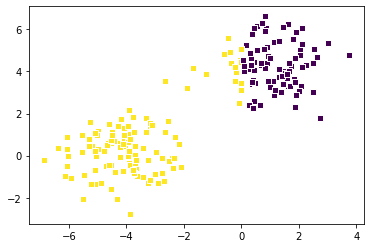

[2/2] loss is: 5.0491885804693043e-14


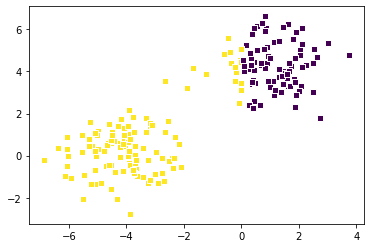

[2/2] loss is: 5.0491885804693043e-14


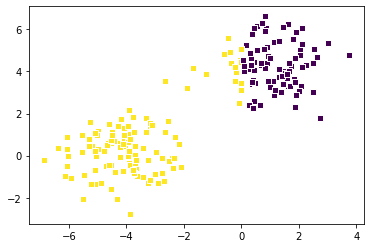

[2/2] loss is: 5.0491885804693043e-14


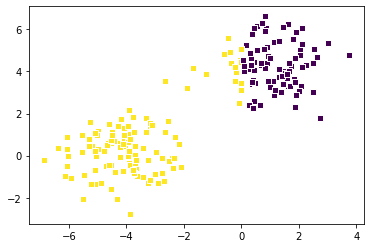

[2/2] loss is: 5.0491885804693043e-14


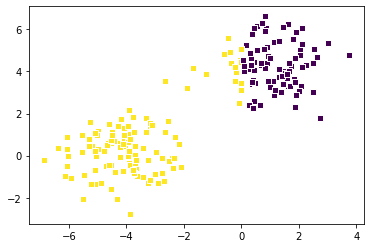

[2/2] loss is: 5.0491885804693043e-14


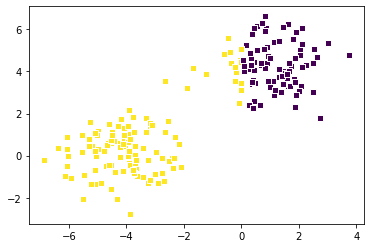

[2/2] loss is: 5.0491885804693043e-14


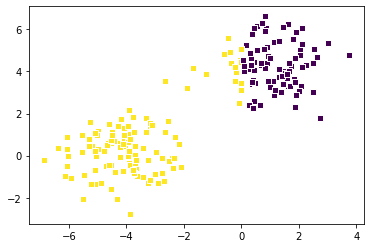

[2/2] loss is: 5.0491885804693043e-14


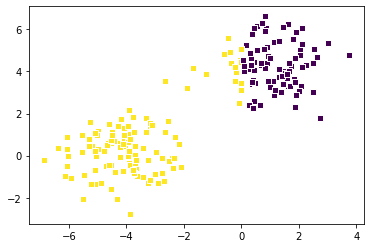

[2/2] loss is: 5.0491885804693043e-14


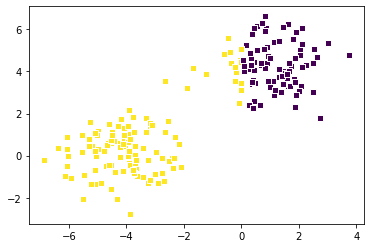

[2/2] loss is: 5.0491885804693043e-14


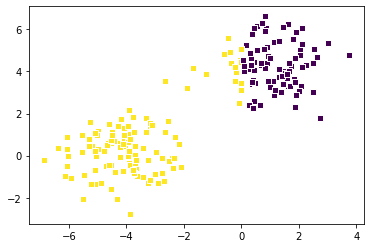

[2/2] loss is: 5.0491885804693043e-14


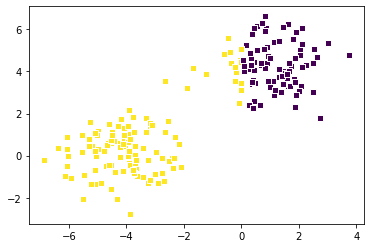

[2/2] loss is: 5.0491885804693043e-14


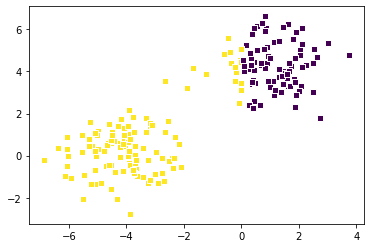

[2/2] loss is: 5.0491885804693043e-14


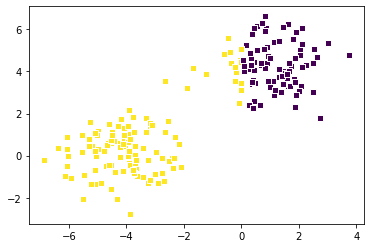

[2/2] loss is: 5.0491885804693043e-14


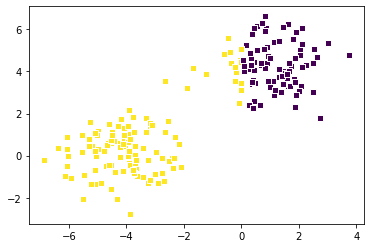

[2/2] loss is: 5.0491885804693043e-14


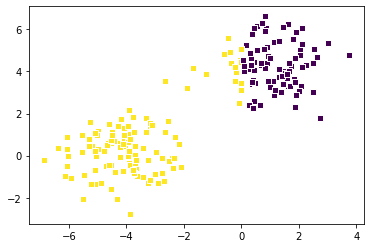

[2/2] loss is: 5.0491885804693043e-14


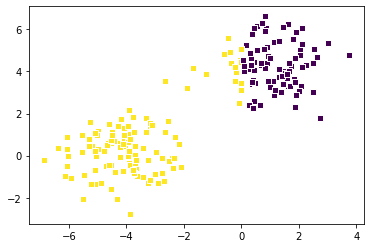

[2/2] loss is: 5.0491885804693043e-14


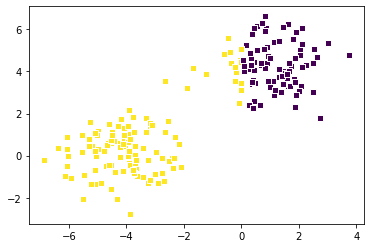

[2/2] loss is: 5.0491885804693043e-14


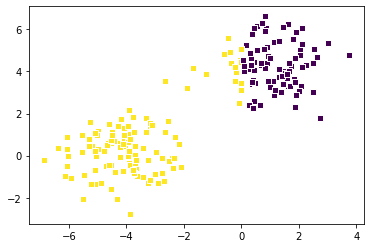

[2/2] loss is: 5.0491885804693043e-14


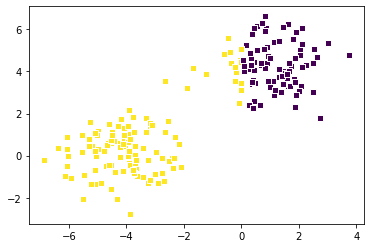

[2/2] loss is: 5.0491885804693043e-14


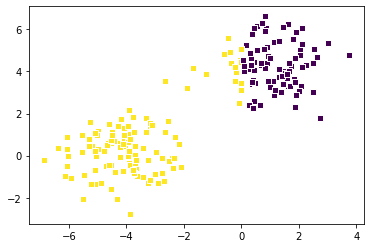

[2/2] loss is: 5.0491885804693043e-14


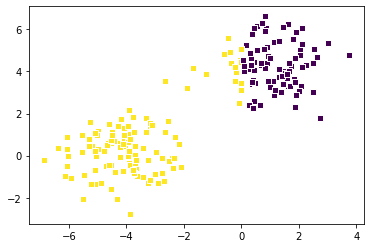

[2/2] loss is: 5.0491885804693043e-14


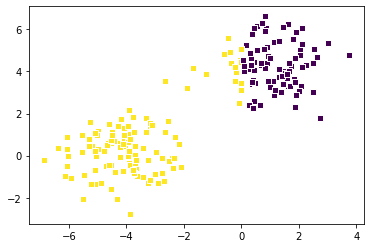

[2/2] loss is: 5.0491885804693043e-14


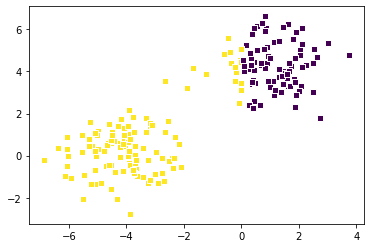

In [6]:
plt.figure(0)
plt.ion()
for epoch in range(EPOCH):
    i = 0 # retrieve H_x
    for x, y in zip(X_train, Y_train):
        loss = compute_loss(X_train, Y_train, THETA)
        print('[{0}/{1}] loss is: {2}'.format(epoch+1, EPOCH, loss))
        H_train[i] = hypothesis(x, THETA)
        THETA = update_parameters(THETA, y, H_train[i], x)

        plt.cla()
        plt.scatter(X_train[:, 1], X_train[:, 2], c=H_train[:, 0], edgecolors='white', marker='s')
        plt.pause(0.001)
        i+=1
plt.ioff()
plt.show()

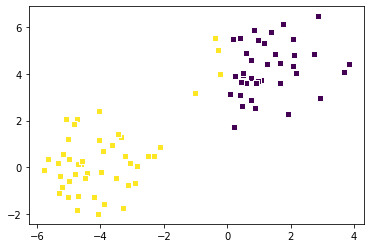

In [7]:
## TEST 
i = 0
for x, y in zip(X_test, Y_test):
    H_test[i] = hypothesis(x, THETA)
    i+=1
    
plt.figure(1)
plt.scatter(X_test[:, 1], X_test[:, 2], c=H_test[:, 0], edgecolors='white', marker='s')
plt.show()

### sklearn知识点补充

#### make_blobs

make_blobs函数是为聚类产生数据集，产生一个数据集和相应的标签

`make_blobs(n_samples=100,n_features=2, centers=3, cluster_std=1.0, center_box=(-10.0,10.0), shuffle=True, random_state=None )`

* n_samples=100 ，表示数据样本点个数,默认值100；

* n_features=2 ，是每个样本的特征（或属性）数，也表示数据的维度，默认值是2；

* centers=3 ，表示类别数（标签的种类数），默认值3；

* cluster_std=1.0 ，表示每个类别的方差，例如我们希望生成2类数据，其中一类比另一类具有更大的方差，可以将cluster_std设置为[1.0,3.0]，浮点数或者浮点数序列，默认值1.0；

* center_box=(-10.0,10.0) ，中心确定之后的数据边界，默认值(-10.0, 10.0)；

* shuffle=True ，将数据进行洗乱，默认值是True；

* random_state=None ，官网解释是随机生成器的种子，可以固定生成的数据，给定数之后，每次生成的数据集就是固定的。若不给定值，则由于随机性将导致每次运行程序所获得的的结果可能有所不同。在使用数据生成器练习机器学习算法练习或python练习时建议给定数值。

### 3 感知器学习算法

下面介绍另一种二分类方法：**「感知器学习算法(Perceptron learning algorithm)」**。其假设函数为：

$$h_{\theta}(x)=g(\theta^T x)=\begin{cases}
1& \text{if} & \theta^T x \geq 0\\
0& \text{if} & \theta^T x < 0
\end{cases}$$

可以看到 $g(z)$ 是逻辑回归的 s 型函数的简化形式：

* 逻辑函数是连续的在 [0,1] 区间上

* 感知器直接非 0 则 1

感知器学习算法的参数更新规则如下：

$$\theta_j:=\theta_j+\alpha\big(y^{(i)}-h_{\theta}(x^{(i)})\big)x_j^{(i)}$$

19世纪60年代，感知器被看作是大脑工作中独立神经元的粗糙的模型，虽然直观看上去，感知器和之前看到的逻辑回归或线性回归很像，但是其实是非常不一样的算法。因为对于感知器，很难赋予一种有意义的概率解释，或使用最大似然估计算法来进行推导。

感知机代码实现如下：

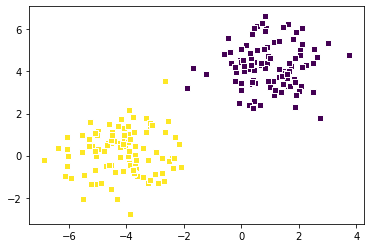

X_train shape : (210, 3)
Y_train shape : (210,)
X_test shape : (90, 3)
y_test shape : (90,)


In [9]:
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from math import exp, log

## Hyper-paramters definition
LR = 0.05
EPOCH = 2
THETA = np.ones([3, 1], dtype=np.float32) # learnable parameters
X, Y = make_blobs(n_samples=300, centers=2, n_features=2, random_state=3)
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
plt.scatter(X_train[:,0], X_train[:, 1], c=Y_train, edgecolors='white', marker='s')
plt.show()

o_train = np.ones([X_train.shape[0], 1], dtype=X_train.dtype)
o_test = np.ones([X_test.shape[0], 1], dtype=X_test.dtype)
X_train = np.concatenate((o_train, X_train), axis=1)
X_test = np.concatenate((o_test, X_test), axis=1)
print("X_train shape : {0}".format(X_train.shape))
print("Y_train shape : {0}".format(Y_train.shape))
print("X_test shape : {0}".format(X_test.shape))
print("y_test shape : {0}".format(Y_test.shape))

H_train = np.zeros([Y_train.shape[0], 1], dtype=Y_train.dtype)
H_test = np.zeros([Y_test.shape[0], 1], dtype=Y_test.dtype)

In [10]:
def perception_function(z):
    if z > 0:
        g = 1
    else:
        g = 0
    return g

def hypothesis(x, THETA):
    hypothesis = np.matmul(THETA.T, x)
    hypothesis = perceptron_function(hypothesis[0])
    return hypothesis

def compute_loss(X, Y, THETA):
    loss = 0
    for x, y in zip(X, Y):
        h_x = hypothesis(x, THETA)
        # if h_x == 1 --> log(1-1) --> error
        if h_x == 1:
            loss += (-y) *(log(h_x))
        else:
            loss +=  -(1-y) *log(1-h_x)
    return loss/(X.shape[0])

def update_parameters(THETA, LR, y, h_x, x):
    x = np.reshape(x, THETA.shape)
    THETA = THETA + LR *(y - h_x) * x
    return THETA

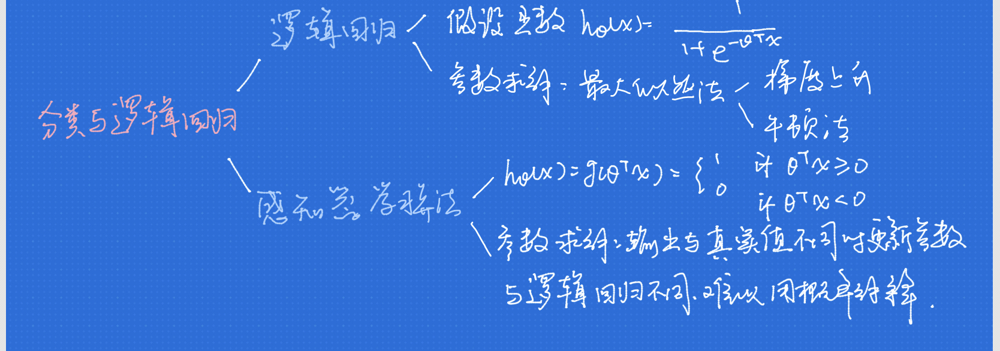